<a href="https://colab.research.google.com/github/mat669/MasterThesis/blob/main/main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# BASIC MODEL

In [6]:
pip install uunet

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.1/35.1 MB 2.6 MB/s eta 0:00:00


In [7]:
pip install kappy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 21.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.7/154.7 KB 18.5 MB/s eta 0:00:00


In [8]:
pip install py3plex

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [9]:
pip install networkx==2.8.8.

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [10]:
import uunet.multinet as ml
import pandas as pd
import kappy
import matplotlib.pyplot as plt
import numpy as np
from scipy import stats
import networkx as nx
from py3plex.visualization.multilayer import *
from py3plex.visualization.colors import all_color_names,colors_default
from py3plex.core import multinet
import re
import seaborn as sns
import matplotlib.pyplot as plt
from functools import reduce
import time
from time import gmtime, strftime
from IPython.display import clear_output

In [ ]:
m = ml.read('/content/network.txt')
m

In [ ]:
ml.plot(m)

In [11]:
import ParserThesis
from pprint import pprint

In [ ]:
mln_data = ParserThesis.parse_mln('network.txt')
pprint(mln_data)

Parsing network configuration file network.txt
{'actors': (['1', '2', '3'], 3),
 'edges': ({'dir': [False, False, False, False, False],
            'from_actor': ['1', '1', '1', '2', '1'],
            'from_layer': ['1', '1', '2', '2', '2'],
            'to_actor': ['3', '2', '3', '3', '2'],
            'to_layer': ['1', '1', '2', '2', '2']},
           [[('1', '3'), ('3', '1'), ('1', '2'), ('2', '1')],
            [('1', '3'),
             ('3', '1'),
             ('2', '3'),
             ('3', '2'),
             ('1', '2'),
             ('2', '1')]]),
 'layers': (['1', '2'], 2)}


In [ ]:
language = ParserThesis.parse_language_file('/content/1-node-language.txt')
pprint(language)

Parsing MLN language file /content/1-node-language.txt
{'escape property': ['E e=4 && (2 * AI, =, 0)'],
 'everywhere property': [],
 'initial conditions': ['1 = AI', '2 = US', '3 = US'],
 'parameters': ['delta = 1', 'mu = 1', 'betaA = 1', 'betaU = 3', 'lamb = 1'],
 'reachability property': ['(1 * AI, =, 1) R e=3 && (2 * AI, =, 1)'],
 'rules': ['AS -> US @ delta',
           'AI -> AS @ mu',
           'AS =1 AI -> AI =1 AI @ betaA',
           'US =1 AI -> AI =1 AI @ betaU',
           'US =2 AI -> AS =2 AI @ lamb',
           'US =2 AS -> AS =2 AS @ lamb'],
 'simOptions': ['n = 1', 'e = 50', 'traces = 5000'],
 'somewhere property': ['SOMEWHERE e=3 && (AS, >, 0)'],
 'states': ['AS', 'AI', 'US'],
 'surround property': ['(1 * AI, =, 1) SURROUND e=4 && (AS, >, 0)'],
 'views': ['AI', 'AS', 'US']}


# DISCUSSION ABOUT IMPLEMENTATION OF SPATIO-TEMPORAL PROPERTY CHECKING

The idea is to check property with a simulation based-approach. 
The following sections discuss syntax required in order to implement the propoerty specification in Kappa, simulating a network with n (number of copies for each node) equal to 1 (instead of 1000 as it was set in Ivan's implementation). Repeat the simulation n times (n equal to the number of sample), compute the proportion of times where the property is satisfied, perform hypothesis testing taking a target value whenever it is needed.
- reachability property: we repeat the simulation n times, if we find that the property is satisfied in one model, then a route exists. Estimate reachability through confidence interval.
- escape case: we repeat the simulation n times, if we find that the property is satisfied in one model, then an escape route exists. Estimate escape through confidence interval.
- somewhere case: we repeat the simulation n times, if we find that the property is satisfied in one model, then a route exists. Estimate somewhere probability through confidence interval.
- everywhere case: we repeat the simulation n times, if we find that the property is not satisfied in one model, then everywhere property is not satisfied by the model. Estimate everywhere through confidence interval.

- property case: repeat simulation n times, estimate probability of being surrounded by confidence interval.


# REACHABILITY CONDITION

## SYNTAX DEFINITION

Considering STREL paper ( E. Bartocci, L. Bortolussi, M. Loreti, L. Nenzi, “Monitoring mobile and spatially distributed cyber-physical systems”. In: MEMOCODE '17: Proceedings of the 15th ACM-IEEE International Conference on Formal Methods and Models for System DesignSeptember 2017, pages 146–155.), Reachability condition composed by:
- condition 1
- condition 2
- time limit

Composing them, starting from a node (in our case a node which has an initial internal state), condition 1 has to hold true until condition 2 is true and within time limit t (it can be modified in order to consider time range [t1, t2], or considering number of events in the model instead of time).
In our syntax, each condition can be specified by defining:
- node or set of nodes of interest
- states associated with each node
----> the code then will implement node and state definition compatible with Kappa language
- threshold value
- operator within the set {= , <, >}


### Example: starting from V1(state{AI}), probability that V1(state{AI})  until  V2(state{AI}) within 5 secs.

According to the previous syntax definition, we define the first condition:

- node and state definition: 'V1' and state 'AI'
- operator: =
- threshold: 1
- composition of the rule: |V1{state{AI})| = 1 (|V1{state{AI})| stands for number of instances of what is inside the brackets | |)

The second condition is defined as:
- node and state definition: 'V2' and state 'AI'.
- operator: =
-threshold: 1
- composition of the rule analogous to the previous one.

Finally, there is the time limit within the property has to be verified: t.

In a fashion similar to the syntax of the paper, this example specification is: (|V1{state{AI})| = 1)R_t(|V2{state{AI})| = 1).

The property specification is implemented in kappa language through '%mod' and %var' specification. Respect to the previous model, there are added:
- %var for the content of the first condition
- %var for the content of the second condition
- %var for tracking the satisfaction of the implemented property (initialized to 0)
- %var for the 'first condition satisfaction' to keep track of satisfaction of first condition (initialized to 1)

- %obs for taking track of property satisfaction in the visualization 
- %obs for taking track of content of first condtion in the visualization 
- %obs for taking track of content of second condtion in the visualization 

2 %mods, the frist one:
1. if time < time_limit
2. AND not condition1 (this means not (|V1{state{AI})| = 1))
3. then update 'first condition satisfaction' 0

This first %mod takes care of the the satisfaction of the first condition as long as [T] < time_limit

The second %mod:
1. if time < time_limit AND 'first condition satisfaction' 1 (if true, this means that the first %mod has not been triggered, 'first condition satisfaction ' is still true)
2. AND condition2 = true ((|V2{state{AI})| = 1)
3. then satisfaction of implemented property equal to 1 (property has been satisfied)

To sum up:
- as long as [T] < time_limit, if the condition1 happens to be false, the first %mod turns the 'first condition satisfaction' = 0 and this makes impossible for the second %mod to be triggered (and therefore satisfy the property) 
- as long as [T] < time_limit, if the first %mod has not been triggered, this means that the first condition is still true. Therefore, whenever the second condition happens to be true, the second %mod is triggered and the update results in the satisfaction of the reachability property.



### PARSING REACHABILITY

In [ ]:
def kappa_parse_reachability(mln_data, language):
  specifications = []

  cond1, stopper_and_cond2 = language['reachability property'][0].split('R')

  first_condition_specification = '' 
  cond1_components = cond1.strip(" ()").split(',')
  if '*' in cond1_components[0]: #node level specification
    if len(cond1_components[0].split('*')) == 2:
      agent,state = cond1_components[0].split('*')
      agent = agent.strip()
      state = state.strip()
      first_condition_specification += f"|V{agent}(state{{{state}}})|"
    else:
      multiple_nodes = cond1_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        state = state.strip()
        first_condition_specification += f"|V{node}(state{{{state}}})| + "
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      last_state = last_state.strip()
      first_condition_specification += f"|V{last_node}(state{{{last_state}}})|"
  else: #it is a state specififcation
    nodes = []
    for node in mln_data['actors'][0]:
      nodes.append(f"|V{node}(state{{{cond1_components[0]}}})|") 
    for node_count in nodes[:-1]:
      first_condition_specification += node_count + ' + '
    first_condition_specification += nodes[-1]
  operator1 = cond1_components[1].strip()
  threshold1 = cond1_components[2].strip()

  stopper, cond2 = stopper_and_cond2.strip().split("&&")
  stopper_type, stopper_value = stopper.split('=')
  stopper_type_kappy = {'t':'T','e':'E'}
  cond2_components = cond2.strip(" ()").split(',')
  second_condition_specification = '' 
  if '*' in cond2_components[0]: #node level specification
    if len(cond2_components[0].split('*')) == 2:
      agent,state = cond2_components[0].split('*')
      agent = agent.strip()
      state = state.strip()
      second_condition_specification += f"|V{agent}(state{{{state}}})|"
    else:
      multiple_nodes = cond2_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        state = state.strip()
        second_condition_specification += f"|V{node}(state{{{state}}})| + "
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      last_state = last_state.strip()
      second_condition_specification += f"|V{last_node}(state{{{last_state}}})|" 
  else: #it is a state specififcation
    nodes = []
    for node in mln_data['actors'][0]:
      nodes.append(f"|V{node}(state{{{cond2_components[0]}}})|")
    for node_count in nodes[:-1]:
      second_condition_specification += node_count + ' + '
    second_condition_specification += nodes[-1]
  operator2 = cond2_components[1].strip()
  threshold2 = cond2_components[2].strip()

  reach_var = 'reachability_property_satisfaction'
  var1 = 'first_condition_reachability'
  var2 = 'second_condition_reachability'

  #### variables specification
  specifications.append(f"%var: '{var1}' {first_condition_specification}")
  specifications.append(f"%var: {var2} {second_condition_specification}")
  specifications.append(f"%var: '{reach_var}' 0")
  specifications.append(f"%var: 'first_condition_satisfaction' 1")

    ### observables specification
  specifications.append(f"%obs: 'property_reachability' '{reach_var}'")
  specifications.append(f"%obs: 'content_condition1' '{var1}'")
  specifications.append(f"%obs: 'content_condition2' '{var2}'")

  ### property checking --> relevance of the order: if the guards are simultaneosuly satisfied, first mod declared is the first applied
  specifications.append(f"%mod: [{stopper_type_kappy[stopper_type]}] < {stopper_value} && [not] ('{var1}' {operator1} {threshold1}) do $UPDATE 'first_condition_satisfaction' 0;")
  specifications.append(f"%mod: [{stopper_type_kappy[stopper_type]}] < {stopper_value} && 'first_condition_satisfaction'=1 && '{var2}' {operator2} {threshold2} do $UPDATE '{reach_var}' 1;")

  

  specifications = '\n'.join(specifications)

  return specifications

Considering previous example, each condition con be specified through 3 components: 'agent' 'operation' 'threshold'. 'agent' can be specififed at node level or state level, at node level syntax is node * state, at state lavel it is simply state. 'operation' can take values within the following set: {=, !=, >, <}, while 'threshold' is a number ∈ N. 

The syntax for the reachability is: 𝛗_1 R t=time_limit 𝛗_2, where 𝛗 is defined by the triple ('agent', 'operation', threshold'). The complete specification of this example of reachability property is: (V1 * AI, =, 1) R t=5 && (V2 * AI, =, 1). In this case, 'theshold' = 1 indicates if the node is in state AI or not, since each node can take only one state.
\\
Therefore, the language file should contain this specification: (V1 * AI, =, 1) R t=5 && (V2 * AI, =, 1).
In order to parse this specification...

# ESCAPE CONDITION

##SYNTAX DEFINITION

Considering STREL paper ( E. Bartocci, L. Bortolussi, M. Loreti, L. Nenzi, “Monitoring mobile and spatially distributed cyber-physical systems”. In: MEMOCODE '17: Proceedings of the 15th ACM-IEEE International Conference on Formal Methods and Models for System DesignSeptember 2017, pages 146–155.), escape condition composed by:
- condition 
- time limit

Composing them, condition  has to hold true in some path and within time limit t (it can be modified in order to consider time range [t1, t2], or considering number of events in the model instead of time).
In our syntax, each condition can be specified by defining:
- node or set of nodes of interest
- states associated with each node
----> the code then will implement node and state definition compatible with Kappa language
- threshold value
- operator within the set {= , <, >}

#### Example: starting from V1(state{AI}), escaping  without passing through V2(state{AI}) within 5 secs.

According to the previous syntax definition, we define condition:

- node and state definition: 'V2' and state 'AI'.
- operator: =
-threshold: 1

Finally, there is the time limit within the property has to be verified: t.

In a fashion similar to the syntax of the paper, this example specification is: E T=TIME_LIMIT && (|V2{state{AI})| = 1).

The property specification is implemented in kappa language through '%mod' and %var' specification. Respect to the previous model, there are added:
- %var for the content of  condition
- %var for tracking the satisfaction of the implemented property (initialized to 1)

- %obs for taking track of property satisfaction in the visualization 
- %obs for taking track of content of condtion in the visualization 


1 %mod:
1. if time < time_limit
2. AND not condition1 (this means 1*AI,=, 1)
3. then update ' condition satisfaction' 0





### PARSING ESCAPE

The syntax for the ESCAPE is:  E t=time_limit && 𝛗, where 𝛗 is defined by the triple ('agent', 'operation', threshold'). The complete specification of this example of reachability property is:  E t=5 && (2 * AI, !=, 1). 
Therefore, the language file should contain this specification:  E t=5 (2 * AI, !=, 1).
In order to parse this specification...

In [ ]:
def kappa_parse_escape(mln_data, language):
  specifications = []

  empty, stopper_and_cond2 =language['escape property'][0].split('E')

  stopper, cond2 = stopper_and_cond2.strip().split("&&")
  stopper_type, stopper_value = stopper.split('=')
  stopper_type_kappy = {'t':'T','e':'E'}
  cond2_components = cond2.strip(" ()").split(',')
  second_condition_specification = '' 
  if '*' in cond2_components[0]: #node level specification
    if len(cond2_components[0].split('*')) == 2:
      agent,state = cond2_components[0].split('*')
      agent = agent.strip()
      state = state.strip()
      second_condition_specification += f"|V{agent}(state{{{state}}})|"
    else:
      multiple_nodes = cond2_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        state = state.strip()
        second_condition_specification += f"|V{node}(state{{{state}}})| + "
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      last_state = last_state.strip()
      second_condition_specification += f"|V{last_node}(state{{{last_state}}})|" 
  else: #it is a state specififcation
    nodes = []
    for node in mln_data['actors'][0]:
      nodes.append(f"|V{node}(state{{{cond2_components[0]}}})|")
    for node_count in nodes[:-1]:
      second_condition_specification += node_count + ' + '
    second_condition_specification += nodes[-1]
  op = cond2_components[1].strip()
  value = cond2_components[2].strip()

  escape_var = 'escape_property_satisfaction'
  var2 = 'condition_escape'

  #### variables specification
  specifications.append(f"%var: {var2} {second_condition_specification}")
  specifications.append(f"%var: '{escape_var}' 1")


    ### observables specification
  specifications.append(f"%obs: 'property_escape' '{escape_var}'")
  specifications.append(f"%obs: 'content_escape' '{var2}'")

  ### property checking : remember that, differnetly from reachability, in escape the stopper value is a lower bound
  specifications.append(f"%mod: [{stopper_type_kappy[stopper_type]}] < {stopper_value} &&  [not]('{var2}' {op} {value}) do $UPDATE '{escape_var}' 0;")

  specifications = '\n'.join(specifications)

  return specifications


# SOMEWHERE CONDITION

## SYNTAX DEFINITION

Considering STREL paper ( E. Bartocci, L. Bortolussi, M. Loreti, L. Nenzi, “Monitoring mobile and spatially distributed cyber-physical systems”. In: MEMOCODE '17: Proceedings of the 15th ACM-IEEE International Conference on Formal Methods and Models for System DesignSeptember 2017, pages 146–155.), somewhere condition composed by:
- condition 
- time limit

It is a special case of reachability condition, where the first condition is always true.

Composing them, starting from a node condition  has to hold true in some path and within time limit t.
In our syntax, each condition can be specified by defining:
- node or set of nodes of interest
- states associated with each node
----> the code then will implement node and state definition compatible with Kappa language
- threshold value
- operator within the set {= , <, >}

#### Example: starting from V1(state{AI}), ending up somewhere with state{AS} within 5 secs.

Special case of reachability property wherre condition1 is true throughout the whole period. 
Set a variable of interest (e.g., a state, AS), create a variable composed by the sum of such states among each node (e.g., |V2(state{AS})| + |V3(state{AS})| + ...) and set the variable to 0. AS long as the property checking is going on (t < time_limit), if the variable changes its value (i.e., var > 0), the stochastic process happens to turn an actor in AS state somewhere, therefore somewhere property is satisfied.

### PARSING SOMEWHERE

The syntax for the SOMEWHERE is:  SOMEWHERE t=time_limit && p, where p defines a network state. The complete specification of this example of somewhere property is:  SOMEWHERE t=5 && AS. 
Therefore, the language file should contain this specification:  SOMEWHERE t=5 && AS
In order to parse this specification...

In [ ]:
def kappa_parse_somewhere(mln_data, language):

  specifications = []

  empty, stopper_and_cond2 =language['somewhere property'][0].split('SOMEWHERE')

  stopper, cond2 = stopper_and_cond2.strip().split("&&")
  stopper_type, stopper_value = stopper.split('=')
  stopper_type_kappy = {'t':'T','e':'E'}
  cond2_components = cond2.strip(" ()").split(',')
  second_condition_specification = '' 
  if '*' in cond2_components[0]: #node level specification
    if len(cond2_components[0].split('*')) == 2:
      agent,state = cond2_components[0].split('*')
      agent = agent.strip()
      state = state.strip()
      second_condition_specification += f"|V{agent}(state{{{state}}})|"
    else:
      multiple_nodes = cond2_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        state = state.strip()
        second_condition_specification += f"|V{node}(state{{{state}}})| + "
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      last_state = last_state.strip()
      second_condition_specification += f"|V{last_node}(state{{{last_state}}})|" 
  else: #it is a state specififcation
    nodes = []
    for node in mln_data['actors'][0]:
      nodes.append(f"|V{node}(state{{{cond2_components[0]}}})|")
    for node_count in nodes[:-1]:
      second_condition_specification += node_count + ' + '
    second_condition_specification += nodes[-1]
  op = cond2_components[1].strip()
  value = cond2_components[2].strip()

  somewhere_var = 'somewhere_property_satisfaction'
  var2 = 'condition_somewhere'

  #### variables specification
  specifications.append(f"%var: {var2} {second_condition_specification}")
  specifications.append(f"%var: '{somewhere_var}' 0")


    ### observables specification
  specifications.append(f"%obs: 'property_somewhere' '{somewhere_var}'")
  specifications.append(f"%obs: 'content_somewhere' '{var2}'")

  ### property checking
  specifications.append(f"%mod: [{stopper_type_kappy[stopper_type]}] < {stopper_value} && '{var2}' {op} {value} do $UPDATE '{somewhere_var}' 1;")

  specifications = '\n'.join(specifications)

  return specifications


# EVERYWHERE CONDITION

The content is the same of the escape property. Its content consists of the aggregate results of the escape property

# SURROUND CONDITION

#### Example: starting from V1(state{AI}), being surrounded with state{AS} within 5 secs.

This means, being in state AI for V1 such that you can't escape this state and if it happens all the neighobour nodes are in AS and AI is escaped within 5 secs.

### PARSING SURROUND


The topological notion of neighbourhood is not trivial in multi-layer, whose layer should we consider the neighbourhood? Union of neighbour's layers, intersection or other approach? The same node has different neighbours for different layers. The surround condition is specified with regards to network states, and network states are composed by atomic states, which are linked to the layer in which the process spreads.
(When it comes to our example, nodes are network configurations and not agents of the netwrok, therefore neighbours are other netwrtok configurations --> no multi-layer strcture)

The selected approach is to consider the union of neighbours across all the layers, because process spreading in one layer may lead to change of atomic state of another layer. This is the example of the rule US =1 AI -> AI=1 AI, where an interaction in the first layer trigger a change of atomic state which belongs to the second layer.

The syntax for the surround is: 𝛗_1 SURROUND t=time_limit && p, where 𝛗 is defined by the triple ('agent', 'operation', threshold'). The complete specification of this example of reachability property is: (V1 * AI, =, 1) SURROUND t=5 && AS. In this case, 'theshold' = 1 indicates if the node is in state AI or not, since each node can take only one state.
\\
Therefore, the language file should contain this specification: (V1 * AI, =, 1) SURROUND t=5 && AS. This specification means that node V1 cannot escape state AI unless nodes of its neighbourhood are in state AS and the neighbours has to be anyway in AS in the time_limit.
In order to parse this specification...

In [ ]:
def kappa_parse_surround(mln_data, language,network_filename):
  specifications = []

  cond1, stopper_and_cond2 = language['surround property'][0].split('SURROUND')

  cond1, stopper_and_cond2 = language['surround property'][0].split('SURROUND')

  first_condition_specification = '' 
  agents = []
  cond1_components = cond1.strip(" ()").split(',')
  if '*' in cond1_components[0]: #node level specification
    if len(cond1_components[0].split('*')) == 2:
      agent,state = cond1_components[0].split('*')
      agent = agent.strip()
      agents.append(str(agent[-1]))
      state = state.strip()
      first_condition_specification += f"|V{agent}(state{{{state}}})|"
    else:
      multiple_nodes = cond1_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        agents.append(str(node[-1]))
        state = state.strip()
        first_condition_specification += f"|V{node}(state{{{state}}})| + "
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      agents.append(str(last_node[-1]))
      last_state = last_state.strip()
      first_condition_specification += f"|V{last_node}(state{{{last_state}}})|"
  else: #it is a state specififcation
    nodes = []
    for node in mln_data['actors'][0]:
      agents.append(node)
      nodes.append(f"|V{node}(state{{{cond1_components[0]}}})|") 
    for node_count in nodes[:-1]:
      first_condition_specification += node_count + ' + '
    first_condition_specification += nodes[-1]
  operator1 = cond1_components[1].strip()
  threshold1 = cond1_components[2].strip()


  stopper, cond2 = stopper_and_cond2.strip().split("&&")
  stopper_type, stopper_value = stopper.split('=')
  stopper_type = stopper_type.strip()
  stopper_type_kappy = {'t':'T','e':'E'}
  cond2_components = cond2.strip(" ()").split(',')

  second_condition_specification = '' 

  if '*' in cond2_components[0]: #node level specification
    if len(cond2_components[0].split('*')) == 2:
      agent,state = cond2_components[0].split('*')
      agent = agent.strip()
      state = state.strip()
      second_condition_specification += f"|V{agent}(state{{{state}}})|"
    else:
      multiple_nodes = cond2_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        state = state.strip()
        second_condition_specification += f"|V{node}(state{{{state}}})| + "
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      last_state = last_state.strip()
      second_condition_specification += f"|V{last_node}(state{{{last_state}}})|" 
  else: #it is a state specififcation
    nodes = []
    for node in mln_data['actors'][0]:
      nodes.append(f"|V{node}(state{{{cond2_components[0]}}})|")
    for node_count in nodes[:-1]:
      second_condition_specification += node_count + ' + '
    second_condition_specification += nodes[-1]
  op2 = cond2_components[1].strip()
  value2 = cond2_components[2].strip()



  surround_var = 'surround_property_satisfaction'
  var1 = 'first_condition_surround'
  var2 = 'second_condition_surround'

  #### variables specification
  specifications.append(f"%var: '{var1}' {first_condition_specification}")
  specifications.append(f"%var: '{var2}' {second_condition_specification}")
  specifications.append(f"%var: '{surround_var}' 0")
  specifications.append(f"%var: 'first_condition_surround_satisfaction' 1")
  specifications.append(f"%var: 'second_condition_surround_satisfaction' 0")
  specifications.append(f"%var: 'time_of_escape_first_condition' 0")
  specifications.append(f"%var: 'time_of_reach_second_condition' 0")

  ### observables specification
  specifications.append(f"%obs: 'property_surround' '{surround_var}'")
  specifications.append(f"%obs: 'content_condition1_surround' '{var1}'")
  specifications.append(f"%obs: 'content_condition2_surround' '{var2}'")

    ### property checking
  specifications.append(f"%mod: [{stopper_type_kappy[stopper_type]}] < {stopper_value} && [not] ('{var1}' {operator1} {threshold1}) && 'first_condition_surround_satisfaction' = 1 do $UPDATE 'first_condition_surround_satisfaction' 0; $UPDATE 'time_of_escape_first_condition' [E];")
  specifications.append(f"%mod: [{stopper_type_kappy[stopper_type]}] < {stopper_value} && '{var2}' {op2} {value2} do $UPDATE 'second_condition_surround_satisfaction' 1;")
  specifications.append(f"%mod: [{stopper_type_kappy[stopper_type]}] < {stopper_value} && [not] ('{var2}' {op2} {value2}) do $UPDATE 'second_condition_surround_satisfaction' 0;")
  specifications.append(f"%mod: [E] = 'time_of_escape_first_condition' && 'time_of_escape_first_condition' > 0 && 'first_condition_surround_satisfaction' = 0 && 'second_condition_surround_satisfaction' = 1 do $UPDATE '{surround_var}' 1;")


  specifications = '\n'.join(specifications)
  return specifications

In [ ]:
ParserThesis.parse_to_kappy_first_part('/content/network.txt','/content/1-node-language.txt','/3-nodes-epidemiology.txt')

Parsing network configuration file /content/network.txt
Parsing MLN language file /content/1-node-language.txt
Successfully exported model into Kappa: /3-nodes-epidemiology.txt


In [ ]:
with open('/3-nodes-epidemiology.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l1v3, l1v2, l2v2, l2v3)\
%agent: V2(state{AS, AI, US}, l1v1, l2v1, l2v3)\
%agent: V3(state{AS, AI, US}, l1v1, l2v2, l2v1)\
'rule0_1'V1(state{AS}) -> V1(state{US}) @ delta\
'rule0_2'V2(state{AS}) -> V2(state{US}) @ delta\
'rule0_3'V3(state{AS}) -> V3(state{US}) @ delta\
'rule1_1'V1(state{AI}) -> V1(state{AS}) @ mu\
'rule1_2'V2(state{AI}) -> V2(state{AS}) @ mu\
'rule1_3'V3(state{AI}) -> V3(state{AS}) @ mu\
'rule2_0'V1(state{AS}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(state{AI}, l1v3[113]), V3(state{AI}, l1v1[113]) @ betaA\
'rule2_1'V3(state{AS}, l1v1[131]), V1(state{AI}, l1v3[131]) -> V3(state{AI}, l1v1[131]), V1(state{AI}, l1v3[131]) @ betaA\
'rule2_2'V1(state{AS}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(state{AI}, l1v2[112]), V2(state{AI}, l1v1[112]) @ betaA\
'rule2_3'V2(state{AS}, l1v1[121]), V1(state{AI}, l1v2[121]) -> V2(state{AI}, l1v1[121]), V1(state{AI}, l1v2[121]) @ betaA\
'rule3_0'V1(state{US}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(stat

In [ ]:
stop_type, stop_value = language['simOptions'][1].split('=')
stop_type = stop_type.strip()
stop_value = stop_value.strip()
stopper_type_kappy = {'t':'T','e':'E'}
numb_of_traces = int(language['simOptions'][2].split('=')[1].strip())

In [ ]:
kappa_client = kappy.KappaStd()
model_text =  small_epid_kappy_text[:-1].replace("\\","")
kappa_client.add_model_string(model_text)
kappa_client.project_parse()
sim_params = kappy.SimulationParameter(pause_condition=f"[T]>20",plot_period=1.0,seed=24)
kappa_client.simulation_start(sim_params)
kappa_client.wait_for_simulation_stop()

{'simulation_info_progress': {'simulation_progress_time': 13.65085460732262,
  'simulation_progress_time_percentage': None,
  'simulation_progress_event': 47,
  'simulation_progress_event_percentage': None,
  'simulation_progress_tracked_events': None,
  'simulation_progress_is_running': False},
 'simulation_info_output': {'simulation_output_plot': 14,
  'simulation_output_dins': 0,
  'simulation_output_file_lines': 0,
  'simulation_output_snapshots': 1,
  'simulation_output_inputs': None,
  'simulation_output_log_messages': 320}}

In [ ]:
results_three_node_sim = kappa_client.simulation_plot()
three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
three_node_sim = three_node_sim.sort_values(by = '[T]')
three_node_sim

,[T],AI,AS,US,V1AI,V1AS,V1US,V2AI,V2AS,V2US,...,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
13,0.0,1.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
12,1.0,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
11,2.0,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
10,3.0,1.0,2.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,1.0,2.0
9,4.0,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
8,5.0,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
7,6.0,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
6,7.0,2.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,...,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0
5,8.0,1.0,1.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0
4,9.0,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0


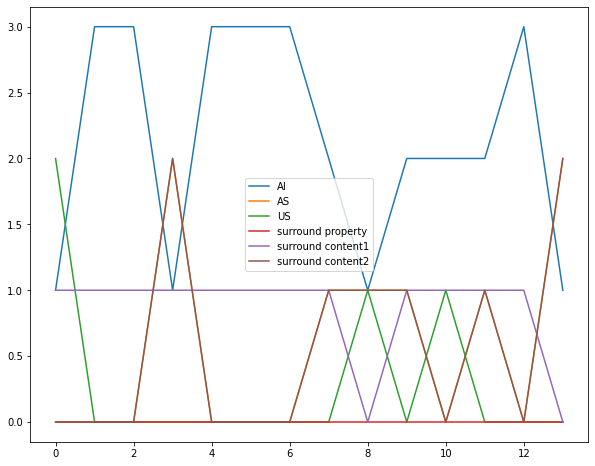

In [ ]:
plt.figure(figsize=(10, 8))

plt.plot(three_node_sim['[T]'],three_node_sim['AI'], label = 'AI')
plt.plot(three_node_sim['[T]'],three_node_sim['AS'], label = 'AS')
plt.plot(three_node_sim['[T]'],three_node_sim['US'], label = 'US')
plt.plot(three_node_sim['[T]'],three_node_sim['property_surround'], label = 'surround property')
plt.plot(three_node_sim['[T]'],three_node_sim['content_condition1_surround'], label = 'surround content1')
plt.plot(three_node_sim['[T]'],three_node_sim['content_condition2_surround'], label = 'surround content2')
plt.legend()

# REPLICATE THE SIMULATION AND AVERAGE OF RESULTS

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []

seeds = 200 #for reproducibility
while len(simulations_data) < numb_of_traces:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[{stopper_type_kappy[stop_type]}]>{stop_value}",plot_period=0.01, seed = seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  simulations_info.append(kappa_client.wait_for_simulation_stop())
  results_three_node_sim = kappa_client.simulation_plot()
  simulations_plot.append(results_three_node_sim)
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  three_node_sim.index = range(len(three_node_sim))
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  events_chain = [three_node_sim_list[0]]
  for rilevation in range(len(three_node_sim_list[:-1])):
    if three_node_sim_list[rilevation] == three_node_sim_list[rilevation+1]:
      continue
    else:
      events_chain.append(three_node_sim_list[rilevation+1])
  seeds += 1
  simulations_data.append(three_node_sim)

In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = list(map(lambda x: x*0.01, longest_simulation))
  equalize_len_data.append(filled)

In [ ]:
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],AI,AS,US,V1AI,V1AS,V1US,V2AI,V2AS,V2US,...,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.00,1.0000,0.0000,2.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,...,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
1,0.01,1.0484,0.0334,1.9182,0.9880,0.0120,0.0000,0.0286,0.0098,0.9616,...,0.0288,0.9880,0.0286,0.9712,0.0286,0.0332,0.0334,0.0120,0.9880,0.0334
2,0.02,1.0966,0.0622,1.8412,0.9772,0.0226,0.0002,0.0580,0.0194,0.9226,...,0.0588,0.9772,0.0580,0.9410,0.0580,0.0610,0.0622,0.0228,0.9772,0.0622
3,0.03,1.1382,0.0948,1.7670,0.9676,0.0322,0.0002,0.0826,0.0302,0.8872,...,0.0838,0.9676,0.0826,0.9158,0.0826,0.0918,0.0948,0.0324,0.9676,0.0948
4,0.04,1.1732,0.1250,1.7018,0.9586,0.0410,0.0004,0.1054,0.0408,0.8538,...,0.1078,0.9586,0.1054,0.8918,0.1054,0.1192,0.1250,0.0414,0.9586,0.1250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1941,19.41,0.0318,1.0830,1.8852,0.0126,0.3850,0.6024,0.0096,0.3476,0.6428,...,0.5260,0.0126,0.0096,0.3970,0.0096,0.7204,1.0830,0.4374,0.0126,1.0830
1942,19.42,0.0318,1.0830,1.8852,0.0126,0.3850,0.6024,0.0096,0.3476,0.6428,...,0.5260,0.0126,0.0096,0.3970,0.0096,0.7204,1.0830,0.4374,0.0126,1.0830
1943,19.43,0.0318,1.0830,1.8852,0.0126,0.3850,0.6024,0.0096,0.3476,0.6428,...,0.5260,0.0126,0.0096,0.3970,0.0096,0.7204,1.0830,0.4374,0.0126,1.0830
1944,19.44,0.0318,1.0830,1.8852,0.0126,0.3850,0.6024,0.0096,0.3476,0.6428,...,0.5260,0.0126,0.0096,0.3970,0.0096,0.7204,1.0830,0.4374,0.0126,1.0830


In [ ]:
reachabilities = []
escapes = []
somewheres = []
everywheres = []
surrounds = []
for sim in equalize_len_data:
  reachabilities.append(sim['property_reachability'][len(sim)-1])
  escapes.append(sim['property_escape'][len(sim)-1])
  somewheres.append(sim['property_somewhere'][len(sim)-1])
  surrounds.append(sim['property_surround'][len(sim)-1])
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
if average_result.property_escape.values[-1] == 1.0:
  print(f'everywhere property satisfied: the property is satisfied for every route')
else:
  print(f'everywhere property not satisfied: it exists al least one route where the property does not hold')
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

reachability property confidence interval is: (0.5078089589405783, 0.5441910410594217)
escape property confidence interval is: (0.3791750048377701, 0.4148249951622299)
somewhere property confidence interval is: (0.7040495034318914, 0.7367504965681086)
everywhere property not satisfied: it exists al least one route where the property does not hold
surround property confidence interval is: (0.4193276443544863, 0.45547235564551375)


## GRAPHS ABOUT PROPERTIES

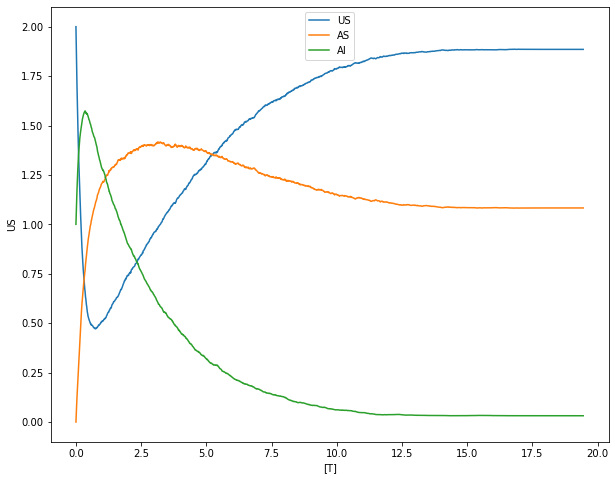

In [ ]:
#OBSERVABLE WITH 95% CONFIDENCE INTERVALS
import seaborn as sns
figsize = plt.subplots(figsize=(10,8))

sns.lineplot(data=average_result, x='[T]',y='US',label='US')
sns.lineplot(data=average_result, x='[T]',y='AS',label='AS')
sns.lineplot(data=average_result, x='[T]',y='AI',label='AI')
plt.legend()

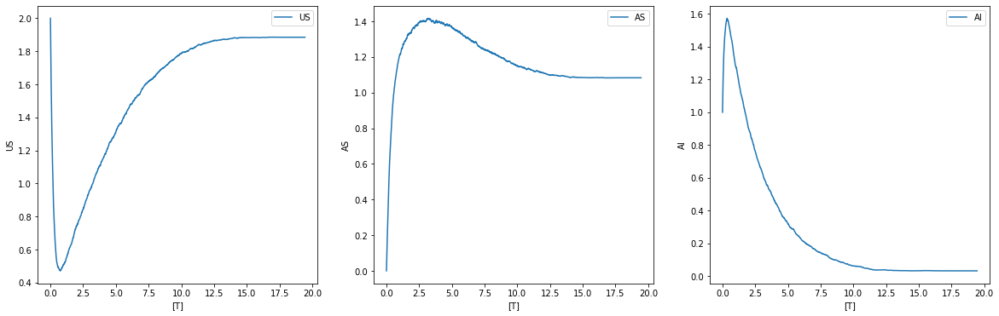

In [ ]:
#3 SUBPLOTS VERSION

fig, (ax1, ax2,ax3) = plt.subplots(1,3,figsize=(20,6))

sns.lineplot(data=average_result, x='[T]',y='US',label='US',ax=ax1)
sns.lineplot(data=average_result, x='[T]',y='AS',label='AS',ax=ax2)
sns.lineplot(data=average_result, x='[T]',y='AI',label='AI',ax=ax3)

sns.color_palette()
plt.legend()

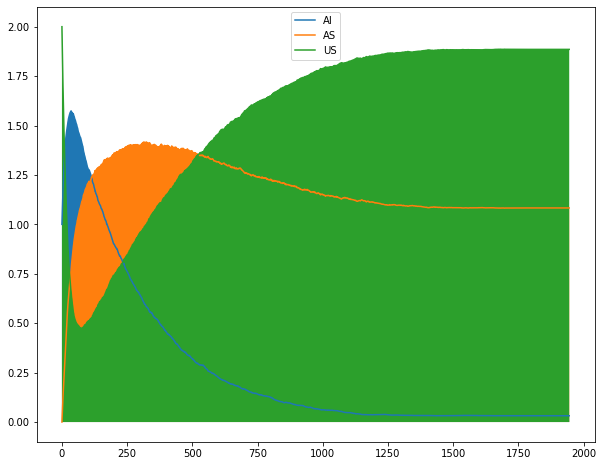

In [ ]:
#OTHER VISUALIZATION

plt.figure(figsize=(10, 8))

plt.plot(average_result['AI'], label = 'AI')
plt.plot(average_result['AS'], label = 'AS')
plt.plot(average_result['US'], label = 'US')

plt.fill_between(np.arange(0,len(average_result)), average_result['AI'])
plt.fill_between(np.arange(0,len(average_result)), average_result['AS'])
plt.fill_between(np.arange(0,len(average_result)), average_result['US'])


plt.legend()

Plots of the properties previously defined

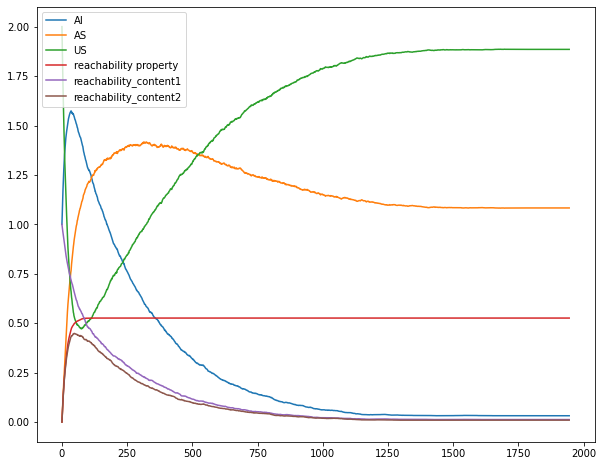

In [ ]:
plt.figure(figsize=(10, 8))

plt.plot(average_result['AI'], label = 'AI')
plt.plot(average_result['AS'], label = 'AS')
plt.plot(average_result['US'], label = 'US')
plt.plot(average_result['property_reachability'], label = 'reachability property')
plt.plot(average_result['content_condition1'], label = 'reachability_content1')
plt.plot(average_result['content_condition2'], label = 'reachability_content2')

plt.legend()

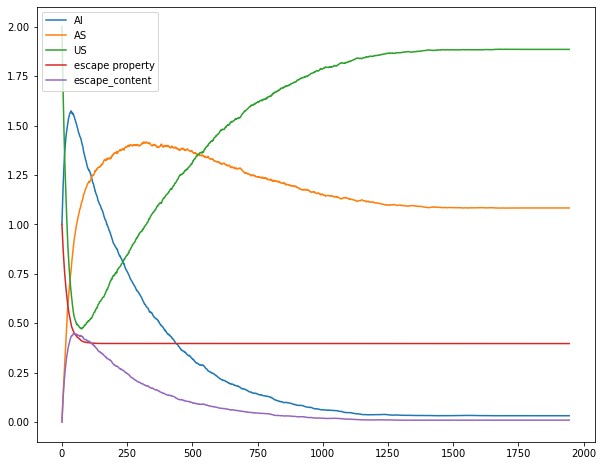

In [ ]:
plt.figure(figsize=(10, 8))

plt.plot(average_result['AI'], label = 'AI')
plt.plot(average_result['AS'], label = 'AS')
plt.plot(average_result['US'], label = 'US')
plt.plot(average_result['property_escape'], label = 'escape property')
plt.plot(average_result['content_escape'], label = 'escape_content')

plt.legend()


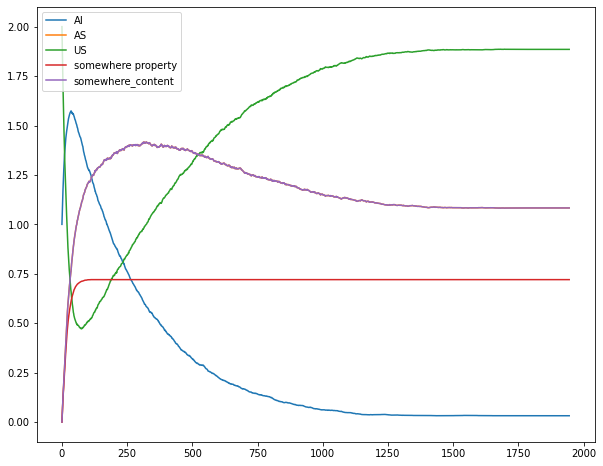

In [ ]:
plt.figure(figsize=(10, 8))

plt.plot(average_result['AI'], label = 'AI')
plt.plot(average_result['AS'], label = 'AS')
plt.plot(average_result['US'], label = 'US')
plt.plot(average_result['property_somewhere'], label = 'somewhere property')
plt.plot(average_result['content_somewhere'], label = 'somewhere_content')

plt.legend()


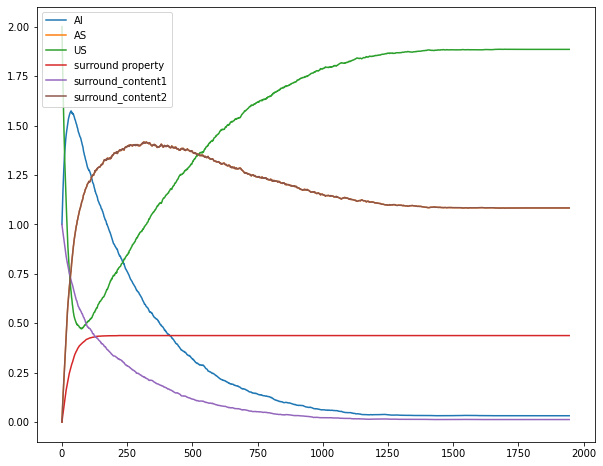

In [ ]:
plt.figure(figsize=(10, 8))

plt.plot(average_result['AI'], label = 'AI')
plt.plot(average_result['AS'], label = 'AS')
plt.plot(average_result['US'], label = 'US')
plt.plot(average_result['property_surround'], label = 'surround property')
plt.plot(average_result['content_condition1_surround'], label = 'surround_content1')
plt.plot(average_result['content_condition2_surround'], label = 'surround_content2')

plt.legend()

Computing confidence interval for reachability property probability using a normal distribution...

# NETWORK CONIFGURATIONS AND LINKS BETWEEN NETWORKS

Idea: the simulation is made by a CTMC where nodes are network configurations: try to represent it with networkx library, since you have the trace, you know how many steps took to go from one configuration to anotehr one, then check using "shortest path" alg if there was another shorter trace.

The transition probability is dynamical in the rule-based model kappa because it is defined by the current mixture, but it here we just want to know if a connection is possible, so we just define connections with the same prob if a transition between rwo different configurations of the network is possible.

Cartesian product between nodes and states define all the possible configurations of the network..

In [ ]:
first_node, first_state = language['initial conditions'][0].split('=')
first_node = first_node.strip()
first_state = first_state.strip()
initial_net = f"V{first_node}{first_state}"
for cond in language['initial conditions'][1:]:
  node, state = cond.split('=')
  node = node.strip()
  state = state.strip()
  initial_net += f"-V{node}{state}"
initial_net

'V1AI-V2US-V3US'

In [ ]:
#Generating all the possible states for all the nodes

node_states_sum = []
for node in mln_data['actors'][0]:
  node_state = []
  for state in language['states']:
    node_state.append(f"V{node}{state}")
  node_states_sum.append(node_state)
node_states_sum

[['V1AS', 'V1AI', 'V1US'], ['V2AS', 'V2AI', 'V2US'], ['V3AS', 'V3AI', 'V3US']]

In [ ]:
network_configurations = node_states_sum[0]
for node in node_states_sum[1:]:
  new_net = []
  for combination in network_configurations:
    for state in node:
      new_net.append(f"{combination}-{state}")
  network_configurations = new_net
print(network_configurations)

['V1AS-V2AS-V3AS', 'V1AS-V2AS-V3AI', 'V1AS-V2AS-V3US', 'V1AS-V2AI-V3AS', 'V1AS-V2AI-V3AI', 'V1AS-V2AI-V3US', 'V1AS-V2US-V3AS', 'V1AS-V2US-V3AI', 'V1AS-V2US-V3US', 'V1AI-V2AS-V3AS', 'V1AI-V2AS-V3AI', 'V1AI-V2AS-V3US', 'V1AI-V2AI-V3AS', 'V1AI-V2AI-V3AI', 'V1AI-V2AI-V3US', 'V1AI-V2US-V3AS', 'V1AI-V2US-V3AI', 'V1AI-V2US-V3US', 'V1US-V2AS-V3AS', 'V1US-V2AS-V3AI', 'V1US-V2AS-V3US', 'V1US-V2AI-V3AS', 'V1US-V2AI-V3AI', 'V1US-V2AI-V3US', 'V1US-V2US-V3AS', 'V1US-V2US-V3AI', 'V1US-V2US-V3US']


Identifying links using LHS of rules...

In [ ]:
pattern = re.compile(r'=[0-9]+')
network_filename = '/content/network.txt'
matching_networks = []
matches = {}
matches_net_nodes = {}
separated_lhs = {}
connections = {}
rule_updates = {}

for rule in language['rules']:
  if pattern.search(rule) != None: #LHS with 2 nodes
    splitter = pattern.search(rule).group()
    lhs, rhs = rule.split('->')
    lhs_comp = lhs.split(splitter)
    rhs_product, rhs_rate = rhs.split('@')
    rhs_comp = rhs_product.split(splitter)
    for comp in range(len(lhs_comp)):
      lhs_comp[comp] = lhs_comp[comp].strip()
      rhs_comp[comp] = rhs_comp[comp].strip()
    for network in network_configurations:
      fit = True
      for comp in lhs_comp:
        if comp in network:
          continue
        else:
          fit = False
      if fit:
        matching_networks.append(network)
        matches[rule] = matching_networks
        # now refine the set of matching netwroks based on topogical notions (neighbors of nodes)
        for net in matching_networks:
          net_comp = net.split('-')
          interesting_comp = [] #selecting interesting components (the ones matching states)
          for node in net_comp:
            for comp2 in lhs_comp:
              if comp2 in node:
                interesting_comp.append(node)     
          matches_net_nodes[network] = interesting_comp
          separate_states_lhs = {}
          for state in lhs_comp:
            for int_comp in interesting_comp:
              if state in int_comp:
                if state not in separate_states_lhs:
                  separate_states_lhs[state] = [int_comp]
                else:
                  separate_states_lhs[state].append(int_comp)
          separated_lhs[network] = separate_states_lhs 
    for net in separated_lhs:
      for starting_node in separated_lhs[net][lhs_comp[0]]:
        pat = re.compile(r'V[0-9]+')
        node_id = pat.search(starting_node).group()[1:]
        for every_node in separated_lhs[net][lhs_comp[1]]:
          other_node_id = pat.search(every_node).group()[1:]
          if (node_id, other_node_id) in mln_data['edges'][1][int(splitter[1:]) -1]:
            connected_agents_in_network = ''
            connected_agents_in_network += f"{starting_node}-{every_node}"
          else:
            connected_agents_in_network = 'no_existing_edge'
          if net not in connections:
            connections[net] = [connected_agents_in_network]
          else:
            connections[net].append(connected_agents_in_network)
    reaction = {lhs_comp[0]:rhs_comp[0],lhs_comp[1]:rhs_comp[1]}
    reactants_product = {}
    connected_net = {}
    for network in connections: 
      local = {}
      reactants_product[network] = local
      for connection in connections[network]:
        if connection != 'no_existing_edge':
          pat0 = re.compile(lhs_comp[0])
          reactants_product[network][connection] = pat0.sub(rhs_comp[0],connection)
          pat1 = re.compile(lhs_comp[1])
          reactants_product[network][connection] = pat1.sub(rhs_comp[1],reactants_product[network][connection]) 
          node_lhs0, node_lhs1 = connection.split('-')
          node_rhs0, node_rhs1 = reactants_product[network][connection].split('-')
          if network not in connected_net:
            matching = network[:]
            matching = matching.replace(node_lhs0, node_rhs0)
            matching = matching.replace(node_lhs1,node_rhs1)
            connected_net[network] = [matching]
          else:
            matching = network[:]
            matching = matching.replace(node_lhs0, node_rhs0)
            matching = matching.replace(node_lhs1,node_rhs1)
            connected_net[network].append(matching)
    edges = []
    for net in connected_net:
      for connector in connected_net[net]:
        edges.append((net,connector))
    separated_lhs = {}
    connections = {}
    rule_updates[rule] = edges
  else: #LHS with one node
    update_of_net = []
    lhs, rhs = rule.split('->')
    lhs = lhs.strip()
    rhs = rhs.strip()
    product,rate = rhs.split('@')
    product = product.strip()
    for net in network_configurations:
      if lhs in net:
        net_comp = net.split('-')
        for comp in net_comp:
          if lhs in comp:
            replaced_comp = comp.replace(lhs, product)
            replaced_net = net.replace(comp, replaced_comp)
            update_of_net.append((net,replaced_net))
    rule_updates[rule] = update_of_net

rule_updates
   

{'AS -> US @ delta': [('V1AS-V2AS-V3AS', 'V1US-V2AS-V3AS'),
  ('V1AS-V2AS-V3AS', 'V1AS-V2US-V3AS'),
  ('V1AS-V2AS-V3AS', 'V1AS-V2AS-V3US'),
  ('V1AS-V2AS-V3AI', 'V1US-V2AS-V3AI'),
  ('V1AS-V2AS-V3AI', 'V1AS-V2US-V3AI'),
  ('V1AS-V2AS-V3US', 'V1US-V2AS-V3US'),
  ('V1AS-V2AS-V3US', 'V1AS-V2US-V3US'),
  ('V1AS-V2AI-V3AS', 'V1US-V2AI-V3AS'),
  ('V1AS-V2AI-V3AS', 'V1AS-V2AI-V3US'),
  ('V1AS-V2AI-V3AI', 'V1US-V2AI-V3AI'),
  ('V1AS-V2AI-V3US', 'V1US-V2AI-V3US'),
  ('V1AS-V2US-V3AS', 'V1US-V2US-V3AS'),
  ('V1AS-V2US-V3AS', 'V1AS-V2US-V3US'),
  ('V1AS-V2US-V3AI', 'V1US-V2US-V3AI'),
  ('V1AS-V2US-V3US', 'V1US-V2US-V3US'),
  ('V1AI-V2AS-V3AS', 'V1AI-V2US-V3AS'),
  ('V1AI-V2AS-V3AS', 'V1AI-V2AS-V3US'),
  ('V1AI-V2AS-V3AI', 'V1AI-V2US-V3AI'),
  ('V1AI-V2AS-V3US', 'V1AI-V2US-V3US'),
  ('V1AI-V2AI-V3AS', 'V1AI-V2AI-V3US'),
  ('V1AI-V2US-V3AS', 'V1AI-V2US-V3US'),
  ('V1US-V2AS-V3AS', 'V1US-V2US-V3AS'),
  ('V1US-V2AS-V3AS', 'V1US-V2AS-V3US'),
  ('V1US-V2AS-V3AI', 'V1US-V2US-V3AI'),
  ('V1US-V2AS-V3US',

In [ ]:
# associate reaction rates to links
dict_param = {}
for elem in language['parameters']:
  rate,value = elem.split('=')
  rate = rate.strip()
  value = int(value.strip())
  dict_param[rate] = value

rule_updates_rate = {}
for rule in rule_updates:
  corpus, rate = rule.split('@')
  rate = rate.strip()
  for update in rule_updates[rule]:
    update += (dict_param[rate],)
    if rule not in rule_updates_rate:
      rule_updates_rate[rule] = [update]
    else:
      rule_updates_rate[rule].append(update)
rule_updates_rate

{'AS -> US @ delta': [('V1AS-V2AS-V3AS', 'V1US-V2AS-V3AS', 1),
  ('V1AS-V2AS-V3AS', 'V1AS-V2US-V3AS', 1),
  ('V1AS-V2AS-V3AS', 'V1AS-V2AS-V3US', 1),
  ('V1AS-V2AS-V3AI', 'V1US-V2AS-V3AI', 1),
  ('V1AS-V2AS-V3AI', 'V1AS-V2US-V3AI', 1),
  ('V1AS-V2AS-V3US', 'V1US-V2AS-V3US', 1),
  ('V1AS-V2AS-V3US', 'V1AS-V2US-V3US', 1),
  ('V1AS-V2AI-V3AS', 'V1US-V2AI-V3AS', 1),
  ('V1AS-V2AI-V3AS', 'V1AS-V2AI-V3US', 1),
  ('V1AS-V2AI-V3AI', 'V1US-V2AI-V3AI', 1),
  ('V1AS-V2AI-V3US', 'V1US-V2AI-V3US', 1),
  ('V1AS-V2US-V3AS', 'V1US-V2US-V3AS', 1),
  ('V1AS-V2US-V3AS', 'V1AS-V2US-V3US', 1),
  ('V1AS-V2US-V3AI', 'V1US-V2US-V3AI', 1),
  ('V1AS-V2US-V3US', 'V1US-V2US-V3US', 1),
  ('V1AI-V2AS-V3AS', 'V1AI-V2US-V3AS', 1),
  ('V1AI-V2AS-V3AS', 'V1AI-V2AS-V3US', 1),
  ('V1AI-V2AS-V3AI', 'V1AI-V2US-V3AI', 1),
  ('V1AI-V2AS-V3US', 'V1AI-V2US-V3US', 1),
  ('V1AI-V2AI-V3AS', 'V1AI-V2AI-V3US', 1),
  ('V1AI-V2US-V3AS', 'V1AI-V2US-V3US', 1),
  ('V1US-V2AS-V3AS', 'V1US-V2US-V3AS', 1),
  ('V1US-V2AS-V3AS', 'V1US-V2AS-V3

In [ ]:
links_with_rates = []
for rule in rule_updates_rate:
  for link in rule_updates_rate[rule]:
    links_with_rates.append(link)
links_with_rates

[('V1AS-V2AS-V3AS', 'V1US-V2AS-V3AS', 1),
 ('V1AS-V2AS-V3AS', 'V1AS-V2US-V3AS', 1),
 ('V1AS-V2AS-V3AS', 'V1AS-V2AS-V3US', 1),
 ('V1AS-V2AS-V3AI', 'V1US-V2AS-V3AI', 1),
 ('V1AS-V2AS-V3AI', 'V1AS-V2US-V3AI', 1),
 ('V1AS-V2AS-V3US', 'V1US-V2AS-V3US', 1),
 ('V1AS-V2AS-V3US', 'V1AS-V2US-V3US', 1),
 ('V1AS-V2AI-V3AS', 'V1US-V2AI-V3AS', 1),
 ('V1AS-V2AI-V3AS', 'V1AS-V2AI-V3US', 1),
 ('V1AS-V2AI-V3AI', 'V1US-V2AI-V3AI', 1),
 ('V1AS-V2AI-V3US', 'V1US-V2AI-V3US', 1),
 ('V1AS-V2US-V3AS', 'V1US-V2US-V3AS', 1),
 ('V1AS-V2US-V3AS', 'V1AS-V2US-V3US', 1),
 ('V1AS-V2US-V3AI', 'V1US-V2US-V3AI', 1),
 ('V1AS-V2US-V3US', 'V1US-V2US-V3US', 1),
 ('V1AI-V2AS-V3AS', 'V1AI-V2US-V3AS', 1),
 ('V1AI-V2AS-V3AS', 'V1AI-V2AS-V3US', 1),
 ('V1AI-V2AS-V3AI', 'V1AI-V2US-V3AI', 1),
 ('V1AI-V2AS-V3US', 'V1AI-V2US-V3US', 1),
 ('V1AI-V2AI-V3AS', 'V1AI-V2AI-V3US', 1),
 ('V1AI-V2US-V3AS', 'V1AI-V2US-V3US', 1),
 ('V1US-V2AS-V3AS', 'V1US-V2US-V3AS', 1),
 ('V1US-V2AS-V3AS', 'V1US-V2AS-V3US', 1),
 ('V1US-V2AS-V3AI', 'V1US-V2US-V3A

In [ ]:
uniques = {}
uniques_sum = {}
for el in links_with_rates:
  if el[:2] not in uniques:
    uniques[el[:2]] = [el[2]]
    uniques_sum[el[:2]] = el[2]
  else:
    uniques[el[:2]].append(el[2])
    uniques_sum[el[:2]] += el[2]

print(uniques_sum)

{('V1AS-V2AS-V3AS', 'V1US-V2AS-V3AS'): 1, ('V1AS-V2AS-V3AS', 'V1AS-V2US-V3AS'): 1, ('V1AS-V2AS-V3AS', 'V1AS-V2AS-V3US'): 1, ('V1AS-V2AS-V3AI', 'V1US-V2AS-V3AI'): 1, ('V1AS-V2AS-V3AI', 'V1AS-V2US-V3AI'): 1, ('V1AS-V2AS-V3US', 'V1US-V2AS-V3US'): 1, ('V1AS-V2AS-V3US', 'V1AS-V2US-V3US'): 1, ('V1AS-V2AI-V3AS', 'V1US-V2AI-V3AS'): 1, ('V1AS-V2AI-V3AS', 'V1AS-V2AI-V3US'): 1, ('V1AS-V2AI-V3AI', 'V1US-V2AI-V3AI'): 1, ('V1AS-V2AI-V3US', 'V1US-V2AI-V3US'): 1, ('V1AS-V2US-V3AS', 'V1US-V2US-V3AS'): 1, ('V1AS-V2US-V3AS', 'V1AS-V2US-V3US'): 1, ('V1AS-V2US-V3AI', 'V1US-V2US-V3AI'): 1, ('V1AS-V2US-V3US', 'V1US-V2US-V3US'): 1, ('V1AI-V2AS-V3AS', 'V1AI-V2US-V3AS'): 1, ('V1AI-V2AS-V3AS', 'V1AI-V2AS-V3US'): 1, ('V1AI-V2AS-V3AI', 'V1AI-V2US-V3AI'): 1, ('V1AI-V2AS-V3US', 'V1AI-V2US-V3US'): 1, ('V1AI-V2AI-V3AS', 'V1AI-V2AI-V3US'): 1, ('V1AI-V2US-V3AS', 'V1AI-V2US-V3US'): 1, ('V1US-V2AS-V3AS', 'V1US-V2US-V3AS'): 1, ('V1US-V2AS-V3AS', 'V1US-V2AS-V3US'): 1, ('V1US-V2AS-V3AI', 'V1US-V2US-V3AI'): 1, ('V1US-V2AS-V3U

In [ ]:
unique_links_with_rates = [(var[0],var[1],uniques_sum[var]) for var in uniques_sum]

In [ ]:
grouping_nodes = {}
for node in unique_links_with_rates:
  if node[0] not in grouping_nodes:
    grouping_nodes[node[0]] = [(node[1],node[2])]
  else:
    grouping_nodes[node[0]].append((node[1],node[2]))
grouping_nodes
grouping_prob = {}
for start_node in grouping_nodes:
  total_activity = sum(map(lambda x: x[1],grouping_nodes[start_node]))
  for end_node in grouping_nodes[start_node]: 
    if start_node not in grouping_prob:
      grouping_prob[start_node] = [(end_node[0],end_node[1]/total_activity)]
    else:
      grouping_prob[start_node].append((end_node[0],end_node[1]/total_activity))
grouping_prob

{'V1AS-V2AS-V3AS': [('V1US-V2AS-V3AS', 0.3333333333333333),
  ('V1AS-V2US-V3AS', 0.3333333333333333),
  ('V1AS-V2AS-V3US', 0.3333333333333333)],
 'V1AS-V2AS-V3AI': [('V1US-V2AS-V3AI', 0.25),
  ('V1AS-V2US-V3AI', 0.25),
  ('V1AS-V2AS-V3AS', 0.25),
  ('V1AI-V2AS-V3AI', 0.25)],
 'V1AS-V2AS-V3US': [('V1US-V2AS-V3US', 0.25),
  ('V1AS-V2US-V3US', 0.25),
  ('V1AS-V2AS-V3AS', 0.5)],
 'V1AS-V2AI-V3AS': [('V1US-V2AI-V3AS', 0.25),
  ('V1AS-V2AI-V3US', 0.25),
  ('V1AS-V2AS-V3AS', 0.25),
  ('V1AI-V2AI-V3AS', 0.25)],
 'V1AS-V2AI-V3AI': [('V1US-V2AI-V3AI', 0.2),
  ('V1AS-V2AS-V3AI', 0.2),
  ('V1AS-V2AI-V3AS', 0.2),
  ('V1AI-V2AI-V3AI', 0.4)],
 'V1AS-V2AI-V3US': [('V1US-V2AI-V3US', 0.2),
  ('V1AS-V2AS-V3US', 0.2),
  ('V1AI-V2AI-V3US', 0.2),
  ('V1AS-V2AI-V3AS', 0.4)],
 'V1AS-V2US-V3AS': [('V1US-V2US-V3AS', 0.25),
  ('V1AS-V2US-V3US', 0.25),
  ('V1AS-V2AS-V3AS', 0.5)],
 'V1AS-V2US-V3AI': [('V1US-V2US-V3AI', 0.2),
  ('V1AS-V2US-V3AS', 0.2),
  ('V1AI-V2US-V3AI', 0.2),
  ('V1AS-V2AS-V3AI', 0.4)],
 'V1AS-V

In [ ]:
links_with_probs = []
for start_node in grouping_prob:
  for item in grouping_prob[start_node]:
    links_with_probs.append((start_node, item[0],item[1]))
links_with_probs

[('V1AS-V2AS-V3AS', 'V1US-V2AS-V3AS', 0.3333333333333333),
 ('V1AS-V2AS-V3AS', 'V1AS-V2US-V3AS', 0.3333333333333333),
 ('V1AS-V2AS-V3AS', 'V1AS-V2AS-V3US', 0.3333333333333333),
 ('V1AS-V2AS-V3AI', 'V1US-V2AS-V3AI', 0.25),
 ('V1AS-V2AS-V3AI', 'V1AS-V2US-V3AI', 0.25),
 ('V1AS-V2AS-V3AI', 'V1AS-V2AS-V3AS', 0.25),
 ('V1AS-V2AS-V3AI', 'V1AI-V2AS-V3AI', 0.25),
 ('V1AS-V2AS-V3US', 'V1US-V2AS-V3US', 0.25),
 ('V1AS-V2AS-V3US', 'V1AS-V2US-V3US', 0.25),
 ('V1AS-V2AS-V3US', 'V1AS-V2AS-V3AS', 0.5),
 ('V1AS-V2AI-V3AS', 'V1US-V2AI-V3AS', 0.25),
 ('V1AS-V2AI-V3AS', 'V1AS-V2AI-V3US', 0.25),
 ('V1AS-V2AI-V3AS', 'V1AS-V2AS-V3AS', 0.25),
 ('V1AS-V2AI-V3AS', 'V1AI-V2AI-V3AS', 0.25),
 ('V1AS-V2AI-V3AI', 'V1US-V2AI-V3AI', 0.2),
 ('V1AS-V2AI-V3AI', 'V1AS-V2AS-V3AI', 0.2),
 ('V1AS-V2AI-V3AI', 'V1AS-V2AI-V3AS', 0.2),
 ('V1AS-V2AI-V3AI', 'V1AI-V2AI-V3AI', 0.4),
 ('V1AS-V2AI-V3US', 'V1US-V2AI-V3US', 0.2),
 ('V1AS-V2AI-V3US', 'V1AS-V2AS-V3US', 0.2),
 ('V1AS-V2AI-V3US', 'V1AI-V2AI-V3US', 0.2),
 ('V1AS-V2AI-V3US', '

In [ ]:
graph = nx.DiGraph()
 
graph.add_nodes_from(network_configurations)
graph.add_weighted_edges_from(links_with_probs)

In [ ]:
def col_inital_conf(language, network_configurations):
  color_initial_conf = []
  first_node, first_state = language['initial conditions'][0].split('=')
  first_node = first_node.strip()
  first_state = first_state.strip()
  initial_net = f"V{first_node}{first_state}"
  for cond in language['initial conditions'][1:]:
    node, state = cond.split('=')
    node = node.strip()
    state = state.strip()
    initial_net += f"-V{node}{state}"
  for conf in network_configurations:
    if conf == initial_net:
      color_initial_conf.append(1)
    else:
      color_initial_conf.append(0)
  return color_initial_conf


In [ ]:
color_initial_conf = col_inital_conf(language,network_configurations)

In [ ]:
positions = nx.spring_layout(graph,seed=15)

None

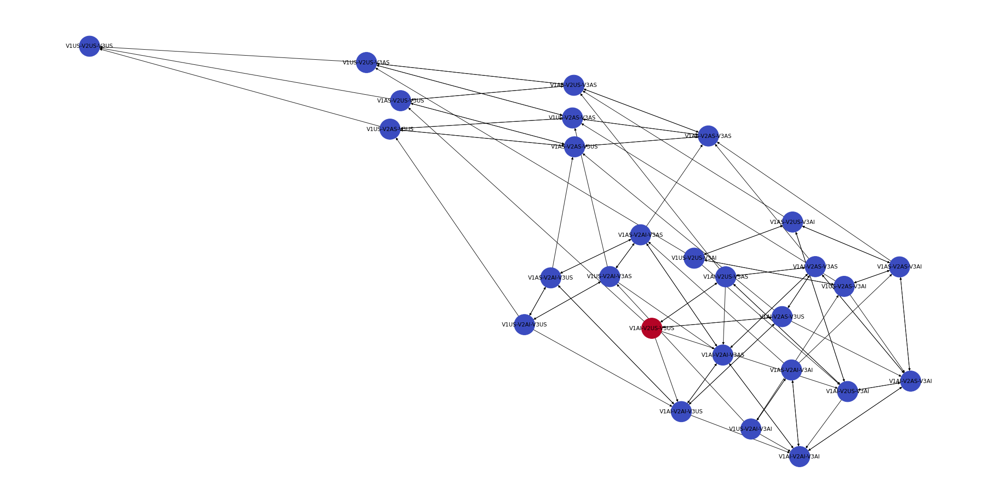

In [ ]:
plt.figure(figsize=(30, 15))
display(nx.draw(graph, with_labels=True, node_color=color_initial_conf, cmap=plt.get_cmap('coolwarm'), pos = positions,
                node_size=2000))

After having the graph and the connections, simulate a trace and approximate it to elementary events and check out how long it took to arrive to a defined state (the one of interest in the condition). Then compare it with shortest path using algs of networkx

## DISTANCE NOTION ON ALL NETWORK CONFIGURATIONS

Herre we consider all the possible network configurations and links among them.

In [ ]:
ParserThesis.parse_to_kappy_observed_event_first_part('/content/network.txt','/content/1-node-language.txt','/3-nodes-epidemiology.txt')

Parsing network configuration file /content/network.txt
Parsing MLN language file /content/1-node-language.txt
Successfully exported model into Kappa: /3-nodes-epidemiology.txt


In [ ]:
with open('/3-nodes-epidemiology.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l1v2, l1v3, l2v2, l2v3)\
%agent: V2(state{AS, AI, US}, l1v1, l2v1, l2v3)\
%agent: V3(state{AS, AI, US}, l1v1, l2v1, l2v2)\
'rule0_1'V1(state{AS}) -> V1(state{US}) @ delta\
'rule0_2'V2(state{AS}) -> V2(state{US}) @ delta\
'rule0_3'V3(state{AS}) -> V3(state{US}) @ delta\
'rule1_1'V1(state{AI}) -> V1(state{AS}) @ mu\
'rule1_2'V2(state{AI}) -> V2(state{AS}) @ mu\
'rule1_3'V3(state{AI}) -> V3(state{AS}) @ mu\
'rule2_0'V1(state{AS}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(state{AI}, l1v2[112]), V2(state{AI}, l1v1[112]) @ betaA\
'rule2_1'V2(state{AS}, l1v1[121]), V1(state{AI}, l1v2[121]) -> V2(state{AI}, l1v1[121]), V1(state{AI}, l1v2[121]) @ betaA\
'rule2_2'V1(state{AS}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(state{AI}, l1v3[113]), V3(state{AI}, l1v1[113]) @ betaA\
'rule2_3'V3(state{AS}, l1v1[131]), V1(state{AI}, l1v3[131]) -> V3(state{AI}, l1v1[131]), V1(state{AI}, l1v3[131]) @ betaA\
'rule3_0'V1(state{US}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(stat

It is not possible to plot observable based on events but only based on time, but the number of events occured is reported. Therefore, in order to retrieve the events, we need to find a 'plot period' interval such the network is updated as much times as reported in the 'simulation_progress_event' entrance of the kappy simulation. The plot periods tried are $[0.1, 0.01, 0.001]$, thus the observable are reported with the number of observations as small as possible.

In [ ]:
kappa_client = kappy.KappaStd()
model_text =  small_epid_kappy_text[:-1].replace("\\","")
kappa_client.add_model_string(model_text)
kappa_client.project_parse()
sim_params = kappy.SimulationParameter(pause_condition=f"[{stopper_type_kappy[stop_type]}]>{stop_value}",plot_period=0,seed=10)
kappa_client.simulation_start(sim_params)
kappa_client.wait_for_simulation_stop()
results_three_node_sim = kappa_client.simulation_plot()
three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
three_node_sim = three_node_sim.sort_values(by = '[T]')
happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
events_chain = [three_node_sim_list[0]]
print(len(three_node_sim))
for rilevation in range(len(three_node_sim_list[:-1])):
  if three_node_sim_list[rilevation] == three_node_sim_list[rilevation+1]:
    continue
  else:
    events_chain.append(three_node_sim_list[rilevation+1])
print(len(events_chain))

# first row repeated twice


22
21


In [ ]:
three_node_sim.index = range(len(three_node_sim))
three_node_sim


,[T],AI,AS,US,V1AI,V1AS,V1US,V2AI,V2AS,V2US,...,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.000000,1.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.000000,1.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.010521,2.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0.114600,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0
4,0.328368,2.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
5,0.365204,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
6,0.403620,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0
7,1.021975,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
8,1.239048,2.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0
9,1.375010,1.0,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,1.0,2.0,0.0,0.0,2.0


In [ ]:
kappa_client.simulation_info()

{'simulation_info_progress': {'simulation_progress_time': 4.3716628484874684,
  'simulation_progress_time_percentage': None,
  'simulation_progress_event': 20,
  'simulation_progress_event_percentage': None,
  'simulation_progress_tracked_events': None,
  'simulation_progress_is_running': False},
 'simulation_info_output': {'simulation_output_plot': 22,
  'simulation_output_dins': 0,
  'simulation_output_file_lines': 0,
  'simulation_output_snapshots': 1,
  'simulation_output_inputs': None,
  'simulation_output_log_messages': 320}}

In [ ]:
three_nodes_event_chain = three_node_sim.iloc[1:,:]
three_nodes_event_chain.index = range(len(three_nodes_event_chain))
three_nodes_event_chain

,[T],AI,AS,US,V1AI,V1AS,V1US,V2AI,V2AS,V2US,...,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.000000,1.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,1.0,...,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.010521,2.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
2,0.114600,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0
3,0.328368,2.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
4,0.365204,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
5,0.403620,2.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0
6,1.021975,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
7,1.239048,2.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0
8,1.375010,1.0,2.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,...,1.0,0.0,1.0,0.0,1.0,1.0,2.0,0.0,0.0,2.0
9,1.416970,0.0,3.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,3.0,0.0,0.0,3.0


# REACHABILITY SHOWCASE

In [ ]:
language['reachability property']

['(1 * AI, =, 1) R e=3 && (2 * AI, =, 1)']

In [ ]:
# preparing for identifying network configurations satysfing conditions

cond1, stopper_and_cond2 = language['reachability property'][0].split('R')

first_cond_for_graph = ''
second_cond_for_graph = ''
first_condition_specification = '' 
cond1_components = cond1.strip(" ()").split(',')
operator1 = cond1_components[1].strip()
threshold1 = cond1_components[2].strip()
if '*' in cond1_components[0]: #node level specification
  if len(cond1_components[0].split('*')) == 2:
    agent,state = cond1_components[0].split('*')
    agent = agent.strip()
    state = state.strip()
    first_condition_specification += f"V{agent}{state}"
    if operator1 == '=':
      first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1}'    
  else:
    multiple_nodes = cond1_components[0].split('&')
    for item in multiple_nodes[:-1]:
      node,state = item.split('*')
      node = node.strip()
      state = state.strip()
      first_condition_specification += f"V{node}{state} + "
      first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1} and'
    last_node, last_state = multiple_nodes[-1].split('*')
    last_node = last_node.strip()
    last_state = last_state.strip()
    first_condition_specification += f"V{last_node}{last_state}"
    first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1}'
else: #it is a state specififcation
  nodes = []
  for node in mln_data['actors'][0]:
    nodes.append(f"V{node}{state}") 
  for node_count in nodes[:-1]:
    first_condition_specification += node_count + ' + '
  first_condition_specification += nodes[-1]
  if operator1 == '=':
    first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1}'
  elif operator1 == '<':
    first_cond_for_graph += f'{first_condition_specification} must be {operator1} than {threshold1}'
  else:
    first_cond_for_graph += f'{first_condition_specification} must be {operator1} than {threshold1}' 

stopper, cond2 = stopper_and_cond2.strip().split("&&")
stopper_type, stopper_value = stopper.split('=')
stopper_type_kappy = {'t':'T','e':'E'}
cond2_components = cond2.strip(" ()").split(',')
operator2 = cond2_components[1].strip()
threshold2 = cond2_components[2].strip()
second_condition_specification = '' 
if '*' in cond2_components[0]: #node level specification
  if len(cond2_components[0].split('*')) == 2:
    agent,state = cond2_components[0].split('*')
    agent = agent.strip()
    state = state.strip()
    second_condition_specification += f"V{agent}{state}"
    if operator2 == '=':
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}' 
  else:
      multiple_nodes = cond2_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        state = state.strip()    
      second_condition_specification += f"V{node}{state} + "
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2} and'
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      last_state = last_state.strip()
      second_condition_specification += f"V{last_node}{last_state}" 
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}'
else: #it is a state specififcation
  nodes = []
  for node in mln_data['actors'][0]:
    nodes.append(f"V{node}{state}")
  for node_count in nodes[:-1]:
    second_condition_specification += node_count + ' + '
  second_condition_specification += nodes[-1]
  if operator2 == '=':
    second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}'
  elif operator1 == '<':
    second_cond_for_graph += f'{second_condition_specification} must be {operator2} than {threshold2}'
  else:
    second_cond_for_graph += f'{second_condition_specification} must be {operator2} than {threshold2}'


In [ ]:
first_cond_for_graph

'V1AI must be = to 1'

In [ ]:
second_cond_for_graph

'V2AI must be = to 1'

In [ ]:
def network_nodes_id(cond_for_graph, network_configurations, condition_specification):
  networks_condition = []
  if 'and' not in cond_for_graph and 'V' in cond_for_graph: #node level specification
    if '=' in cond_for_graph and '1' in cond_for_graph:
      for network in network_configurations:
        if condition_specification in network:
          networks_condition.append(network)
    elif '=' in cond_for_graph and '0' in cond_for_graph:
      for network in network_configurations:
        if condition_specification not in network:
          networks_condition.append(network)
  elif 'and' in cond_for_graph:
    components = cond_for_graph.split('and')
    for network in network_configurations:
      satisfaction = True
      for comp in components:
        node_state, value = comp.split('must be = to') 
        node_state = node_state.strip()
        value = value.strip()
        if value == '1':
          if node_state in network:
            continue
          else:
            satisfaction = False
        elif value == '0':
          if node_state not in network:
            continue
          else:
            satisfaction = False
      if satisfaction:
        networks_condition.append(network)
  else:
    state, other = cond_for_graph.split('must be')
    state = state.strip()
    other = other.strip()
    other_op, other_value = other.split('to')
    other_op = other_op.strip()
    other_value = int(other_value.strip())
    for network in network_configurations:
      net_comps = network.split('-')
      acc = 0
      for net_comp in net_comps:
        if state in net_comp:
          acc += 1
      if other_op == '<':
        if acc < other_value:
          networks_condition.append(network)
      elif other_op == '=':
        if acc == other_value:
          networks_condition.append(network)
      elif other_op == '>':
        if acc > other_value:
          networks_condition.append(network)
  return networks_condition

In [ ]:
first_network_condition = network_nodes_id(first_cond_for_graph, network_configurations, first_condition_specification)
second_network_condition = network_nodes_id(second_cond_for_graph, network_configurations, second_condition_specification)
print(first_network_condition)
print(second_network_condition)

['V1AI-V2AS-V3AS', 'V1AI-V2AS-V3AI', 'V1AI-V2AS-V3US', 'V1AI-V2AI-V3AS', 'V1AI-V2AI-V3AI', 'V1AI-V2AI-V3US', 'V1AI-V2US-V3AS', 'V1AI-V2US-V3AI', 'V1AI-V2US-V3US']
['V1AS-V2AI-V3AS', 'V1AS-V2AI-V3AI', 'V1AS-V2AI-V3US', 'V1AI-V2AI-V3AS', 'V1AI-V2AI-V3AI', 'V1AI-V2AI-V3US', 'V1US-V2AI-V3AS', 'V1US-V2AI-V3AI', 'V1US-V2AI-V3US']


In [ ]:
def color_reachability_cond(first_network_condition, second_network_condition, initial_net, network_configurations):
  color_reachability = []
  for network in network_configurations:
    acc = 0
    if network == initial_net:
      acc += 21
    if network in first_network_condition:
      acc += 11
    if network in second_network_condition:
      acc += 5
    color_reachability.append(acc)
  legend = {}
  for color in color_reachability:
    if color == 0:
      legend[color] = 'nothing satisfied'
    if color == 5:
      legend[color] = 'second condition satisfied'
    if color == 11:
      legend[color] = 'first condition satisfied'
    if color == 16:
      legend[color] = 'both conditions satisfied'
    if color == 21:
      legend[color] = 'initial net, nothing satisfied'
    if color == 26:
      legend[color] = 'initial net, second condition satisfied'
    if color == 32:
      legend[color] = 'initial net, first condition satisfied'
    if color == 37:
      legend[color] = 'inital net, both conditions satisfied'
  return color_reachability,legend

In [ ]:
color_reachability,legend = color_reachability_cond(first_network_condition, second_network_condition, initial_net, network_configurations)

In [ ]:
mapper = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped = mapper.to_rgba(np.unique(color_reachability))

None

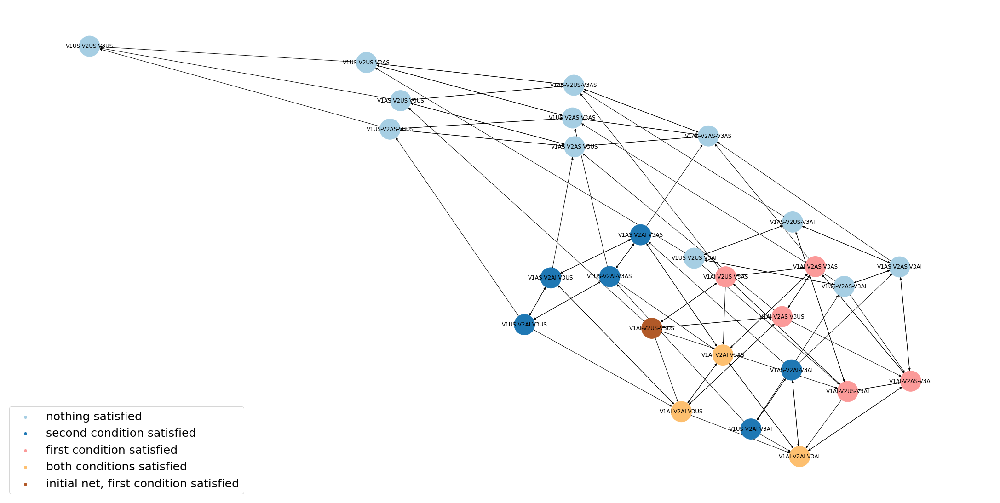

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_reachability, cmap=plt.get_cmap('Paired'), pos = positions,
                node_size=2000))


for v in np.unique(color_reachability):
    plt.scatter([],[], color=mapped[list(np.unique(color_reachability)).index(v)], label = legend[v])


plt.legend(fontsize=25)

Legend attached successfully, now compute the path from the event chain...

In [ ]:
if 1 in three_nodes_event_chain.property_reachability.values:
  event_reached = three_nodes_event_chain[three_nodes_event_chain.property_reachability.isin([1])]
  event_reached_index = three_nodes_event_chain[three_nodes_event_chain.property_reachability.isin([1])].index[0] #retrieve index of the first row where reachability property is satisfied
elif 't' == stopper_type:
  event_reached = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:]
  event_reached_index = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:].index[-1]
elif 'e' == stopper_type:
  event_reached = three_nodes_event_chain.iloc[int(stopper_value.strip())+1:,:]
  event_reached_index = three_nodes_event_chain.index[int(stopper_value.strip())+1]

In [ ]:
zoom_net = event_reached.iloc[:1,4:4+mln_data['actors'][1]*len(language['states'])]
zoom_net

,V1AI,V1AS,V1US,V2AI,V2AS,V2US,V3AI,V3AS,V3US
1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


In [ ]:
event_reached_network = ''
for elem in range(len(zoom_net.values[0])):
  if zoom_net.values[0][elem] == 1:
    event_reached_network += f"{zoom_net.columns[elem]}-"
event_reached_network = event_reached_network[:-1]
event_reached_network

'V1AI-V2AI-V3US'

In [ ]:
shortest_paths = list(nx.all_shortest_paths(graph, initial_net, event_reached_network))
shortest_paths

[['V1AI-V2US-V3US', 'V1AI-V2AI-V3US']]

In [ ]:
#check if the first conditino of reachabiltiy is met

def check_reachability(shortest_paths, networks_first_condition, networks_second_condition):
  valid_paths = []
  for path in shortest_paths:
    satisfied_first_condition = True
    for net in path[:-1]:
      if net in networks_first_condition:
        continue
      else:
        satisfied_first_condition = False
    if satisfied_first_condition and  path[-1] in networks_second_condition:
      valid_paths.append(path)
  return valid_paths

In [ ]:
valid_paths = check_reachability(shortest_paths, first_network_condition, second_network_condition)

In [ ]:
def color_shortest_paths(valid_paths,graph):
  path_colours = list(map(lambda x: [],np.ones(len(list(graph.edges())))))
  link_path = []
  for path in valid_paths:
    for path_elem in range(len(path)-1):
      for link in list(graph.edges()):
        if (path[path_elem],path[path_elem+1]) == link:
          path_colours[list(graph.edges()).index(link)].append(10)
          link_path.append(link)
        else:
          continue
  path_colours = list(map(lambda x:len(x),path_colours))
  for col in range(len(path_colours)):
    if path_colours[col] != 0:
      path_colours[col] += 10
  return path_colours,link_path

In [ ]:
coloured_paths, link_path = color_shortest_paths(valid_paths,graph)

In [ ]:
coloured_paths

[0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 11,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0,
 0]

None

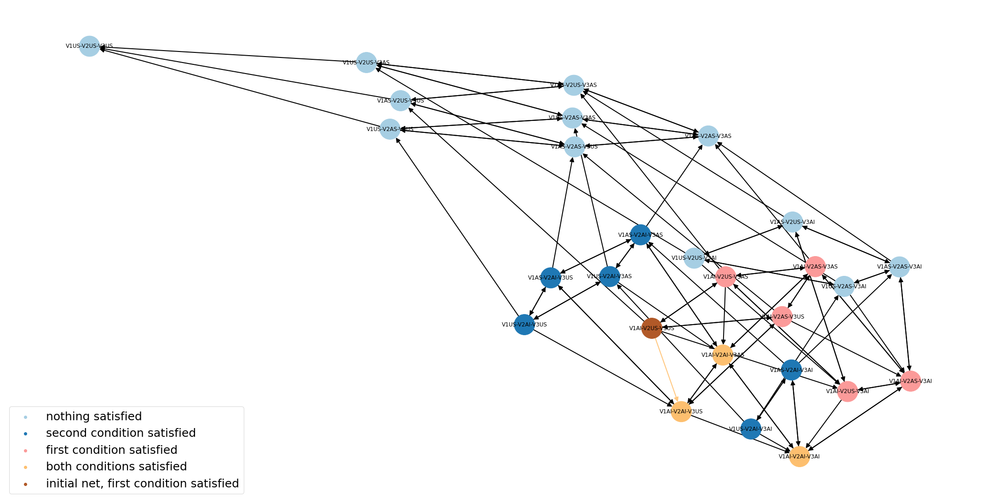

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_reachability, cmap=plt.get_cmap('Paired'), edge_color = coloured_paths, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions,
                node_size=2000))


for v in np.unique(color_reachability):
    plt.scatter([],[], color=mapped[list(np.unique(color_reachability)).index(v)], label = legend[v])


plt.legend(fontsize=25)

Retrieve the simulation path until property reachability is satisfied...

In [ ]:
def simulation_path(events_chain, language,event_reached_index):
  zoom_net = events_chain.iloc[:event_reached_index+1,4:4+mln_data['actors'][1]*len(language['states'])]
  simulation_path_reach = []
  for net in zoom_net.values:
    simulation_net = ''
    for elem in range(len(net)):
      if net[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}-"
    simulation_path_reach.append(simulation_net[:-1])
  simulation_links = []
  for el in range(len(simulation_path_reach)-1):
    simulation_links.append((simulation_path_reach[el],simulation_path_reach[el+1]))
  return simulation_links

In [ ]:
simulated_path = simulation_path(three_nodes_event_chain, language,event_reached_index)
simulated_path

[('V1AI-V2US-V3US', 'V1AI-V2AI-V3US')]

In [ ]:
def color_simulated_path(simulation_path, graph):
  color_sim_path = list(np.zeros(len(list(graph.edges()))))
  for el in simulation_path:
    color_sim_path[list(graph.edges()).index(el)] += 10    
  return color_sim_path

In [ ]:
coloured_simulated_paths = color_simulated_path(simulated_path, graph)

None

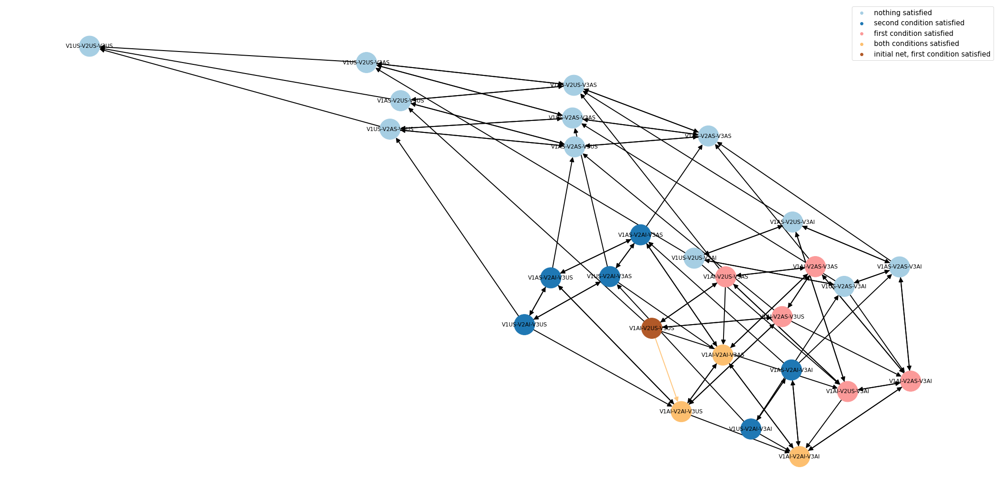

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_reachability, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions,
                node_size=2000))


for v in np.unique(color_reachability):
    plt.scatter([],[], color=mapped[list(np.unique(color_reachability)).index(v)], label = legend[v])


plt.legend(fontsize=15)

In [ ]:
def check_distance_in_simulated_path(events_chain, graph, second_network_condition,event_reached_index):
  shortest_length = []
  for satisfying_second in second_network_condition:
    shortest_length.append(nx.shortest_path_length(graph, initial_net, satisfying_second))
  if min(shortest_length) == event_reached_index:
    return f"the simulated trace reached the configuration satysfing condtion2 with  minimal number of events = {min(shortest_length)}"
  else:
    return f"the simulated trace satisfies condition2/stop the checking after number of events = {event_reached_index}, while the configuration {second_network_condition[shortest_length.index(min(shortest_length))]} is just at distance = {min(shortest_length)}"


In [ ]:
check_distance_in_simulated_path(three_nodes_event_chain, graph, second_network_condition,event_reached_index) #minimum distance required to satisfy reachability property

'the simulated trace reached the configuration satysfing condtion2 with  minimal number of events = 1'

This analysis requires time and space when the network grows in number of nodes, so it might be difficult to implement the aforementioned distance notion (-> state space explosion) (one way might be parallelize computation). In order to reduce time and space requirement, implemnent a graph and distance notino simulation-based.

"Event_reached_network" is node which satisfied reachability property with respect to time/event distance function if there is any. About distance, take the trace, for each event of the trace check if the node satisfy reachaiblity property: when you find one, check its distance with the initial net and check if this distance with respect to a value you specified.

In [ ]:
zoom_net_distance = three_nodes_event_chain.iloc[:,4:4+mln_data['actors'][1]*len(language['states'])]
zoom_net_distance

,V1AI,V1AS,V1US,V2AI,V2AS,V2US,V3AI,V3AS,V3US
0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
5,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
6,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
7,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
8,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
9,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
simulation_path_reach_distance = []
for net in zoom_net_distance.values:
  simulation_net = ''
  for elem in range(len(net)):
    if net[elem] == 1:
      simulation_net += f"{zoom_net.columns[elem]}-"
  simulation_path_reach_distance.append(simulation_net[:-1])
simulation_path_reach_distance

['V1AI-V2US-V3US',
 'V1AI-V2AI-V3US',
 'V1AI-V2AI-V3AS',
 'V1AI-V2AI-V3US',
 'V1AI-V2AI-V3AI',
 'V1AI-V2AI-V3AS',
 'V1AI-V2AI-V3AI',
 'V1AS-V2AI-V3AI',
 'V1AS-V2AI-V3AS',
 'V1AS-V2AS-V3AS',
 'V1AS-V2AS-V3US',
 'V1AS-V2AS-V3AS',
 'V1US-V2AS-V3AS',
 'V1US-V2US-V3AS',
 'V1US-V2AS-V3AS',
 'V1US-V2US-V3AS',
 'V1US-V2AS-V3AS',
 'V1US-V2AS-V3US',
 'V1AS-V2AS-V3US',
 'V1US-V2AS-V3US',
 'V1US-V2US-V3US']

In [ ]:
reached_net = ''
first_cond = True
for net in simulation_path_reach_distance:
  if net in second_network_condition:
    break
  elif net not in first_network_condition:
    first_cond = False
    break
  elif net in first_network_condition and net not in second_network_condition:
    continue
if first_cond and net in second_network_condition:
  reached_net = net
distance_net = nx.shortest_path_length(graph, initial_net, event_reached_network)

## VALIDATION OF REACHABILITY

We need to adjust the uniqueness check and take into account the weights this time, si I reproted the functino of section 'NETWORK CONFIGURATIONS AND LINKS BETWEEN NETWORKS'. Remember that you set in kappy the number of events to stop reachabiltity checking < 3, then your cutoff should of simple paths should be 2.

In [ ]:
def recursion_paths(initial_net,grouping_prob):
  shorter_paths = []
  dict_paths = {0 : [initial_net]}
  for i in range(1,10):
    for path in dict_paths[i-1]:
      if i-1 == 0:
        neigs = list(map(lambda x:x[0], grouping_prob[path]))
        new_paths = []
        if type(path) != list:
          for neig in neigs:
            new_paths.append([path,neig])
          dict_paths[i] = new_paths
      else:
        if path[-1] in grouping_prob:
          neigs = list(map(lambda x:x[0], grouping_prob[path[-1]]))
          for neig in neigs:
            new_list = []
            for el in path:
              new_list.append(el)
            new_list.append(neig)
            if i not in dict_paths:
              dict_paths[i] = [new_list]
            else:
              dict_paths[i].append(new_list)
        else:
          if i-1 < 9:
            shorter_paths.append(path)
  return dict_paths,shorter_paths


In [ ]:
paths_reach,shorter_paths = recursion_paths(initial_net,grouping_prob)

In [ ]:
def check_reachability(shortest_paths, networks_first_condition, networks_second_condition):
  valid_paths = []
  for path in shortest_paths:
    path_con = []
    satisfied_first_condition = True
    arrived = False
    for net in path[:-1]:
      if not arrived and satisfied_first_condition:
        if net in networks_first_condition and net not in networks_second_condition:
          path_con.append(net)
        elif net in networks_second_condition:
          path_con.append(net)
          arrived = True
        elif net not in networks_first_condition:
          satisfied_first_condition = False
    if satisfied_first_condition and path[-1] in networks_second_condition and not arrived:
      if path not in valid_paths:
        valid_paths.append(path)
    else:
      if len(path_con) != 1:
        if path_con not in valid_paths and path_con[-1] in second_network_condition:
          valid_paths.append(path_con)
  return valid_paths

In [ ]:
replicated_valid_paths_reach = check_reachability(paths_reach[2], first_network_condition, second_network_condition)
replicated_valid_paths_reach

[['V1AI-V2US-V3US', 'V1AI-V2AI-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AI', 'V1AI-V2AI-V3AI'],
 ['V1AI-V2US-V3US', 'V1AI-V2AS-V3US', 'V1AI-V2AI-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AS', 'V1AI-V2AI-V3AS']]

Confidence interval for reachability property  for number of events e < 3.

In [ ]:
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")


reachability property confidence interval is: (0.5078089589405783, 0.5441910410594217)


In [ ]:
reach_probability = 0
edged_paths = map(nx.utils.pairwise, replicated_valid_paths_reach)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  reach_probability += prob_path
print(f"analysis of the network gives probability of satisfying reachability property = {reach_probability}")


analysis of the network gives probability of satisfying reachability property = 0.5317460317460317


Here, first I computed the paths of length at most 4 such the first node is repeated. Including vs not-including them in the computation of probability-reachability-property, the difference in probability is 0.001 roughly. With longer repeated paths will give a negligible contribution to probability-reachability-property, therefore I will assume that the probability-reachability-property is the one computed with simple paths.

## SIMULATION-BASED DISTANCE NOTION REACHABILITY

In [ ]:
zoom_net = three_nodes_event_chain.iloc[:,4:4+mln_data['actors'][1]*len(language['states'])]

In [ ]:
connections = {}
connected_net = {}
matching_networks = []
matches_net_nodes = {}
rule_updates = {}
separated_lhs = {}

for network in zoom_net.values:
  simulation_net = ''
  for elem in range(len(network)):
    if network[elem] == 1:
      simulation_net += f"{zoom_net.columns[elem]}-"
  simulation_net = simulation_net[:-1]
  for rule in language['rules']:
    if pattern.search(rule) != None: #LHS with 2 nodes
      splitter = pattern.search(rule).group()
      lhs, rhs = rule.split('->')
      lhs_comp = lhs.split(splitter)
      rhs_product, rhs_rate = rhs.split('@')
      rhs_comp = rhs_product.split(splitter)
      for comp in range(len(lhs_comp)):
        lhs_comp[comp] = lhs_comp[comp].strip()
        rhs_comp[comp] = rhs_comp[comp].strip()
      fit = True
      for comp in lhs_comp:
        if comp in simulation_net:
          continue
        else:
          fit = False
      if fit:
        net_comp = simulation_net.split('-')
        interesting_comp = [] #selecting interesting components (the ones matching states)
        for node in net_comp:
          for comp2 in lhs_comp:
            if comp2 in node:
              interesting_comp.append(node) 
        matches_net_nodes[simulation_net] = interesting_comp
        separate_states_lhs = {}
        for state in lhs_comp:
          for int_comp in interesting_comp:
            if state in int_comp:
              if state not in separate_states_lhs:
                separate_states_lhs[state] = [int_comp]
              else:
                separate_states_lhs[state].append(int_comp)
        separated_lhs[simulation_net] = separate_states_lhs 
        if lhs_comp[0] in separated_lhs[simulation_net] and lhs_comp[1] in separated_lhs[simulation_net]:
          for starting_node in separated_lhs[simulation_net][lhs_comp[0]]:
            pat = re.compile(r'V[0-9]+')
            node_id = pat.search(starting_node).group()[1:]
            for every_node in separated_lhs[simulation_net][lhs_comp[1]]:
              other_node_id = pat.search(every_node).group()[1:]
              if (node_id, other_node_id) in mln_data['edges'][1][int(splitter[1:]) -1]:
                connected_agents_in_network = ''
                connected_agents_in_network += f"{starting_node}-{every_node}"
              else:
                connected_agents_in_network = 'no_existing_edge'
              if simulation_net not in connections:
                connections[simulation_net] = [connected_agents_in_network]
              else:
                if connected_agents_in_network not in connections[simulation_net]:
                  connections[simulation_net].append(connected_agents_in_network)
        reaction = {lhs_comp[0]:rhs_comp[0],lhs_comp[1]:rhs_comp[1]}
        for connection in connections[simulation_net]:
          if lhs_comp[0] in connection and lhs_comp[1] in connection:
            if connection != 'no_existing_edge':
              pat0 = re.compile(lhs_comp[0])
              transf1 = pat0.sub(rhs_comp[0],connection)
              pat1 = re.compile(lhs_comp[1])
              transf2 = pat1.sub(rhs_comp[1],transf1)
              node_lhs0, node_lhs1 = connection.split('-')
              node_rhs0, node_rhs1 = transf2.split('-')
              if simulation_net not in connected_net:
                matching = simulation_net[:]
                matching = matching.replace(node_lhs0, node_rhs0)
                matching = matching.replace(node_lhs1,node_rhs1)
                connected_net[simulation_net] = [matching]
              else:
                matching = simulation_net[:]
                matching = matching.replace(node_lhs0, node_rhs0)
                matching = matching.replace(node_lhs1,node_rhs1)
                if matching not in connected_net[simulation_net]:
                  connected_net[simulation_net].append(matching) 
            for link in connected_net[simulation_net]:
              if simulation_net not in rule_updates:
                rule_updates[simulation_net] = [(simulation_net, link)]
              else:
                if (simulation_net, link) not in rule_updates[simulation_net]:
                  rule_updates[simulation_net].append((simulation_net, link))        
    else: #LHS with one node
      lhs, rhs = rule.split('->')
      lhs = lhs.strip()
      rhs = rhs.strip()
      product,rate = rhs.split('@')
      product = product.strip()
      if lhs in simulation_net:
        net_comp = simulation_net.split('-')
        for comp in net_comp:
          if lhs in comp:
            replaced_comp = comp.replace(lhs, product)
            replaced_net = simulation_net.replace(comp, replaced_comp)
            if simulation_net not in rule_updates:
              rule_updates[simulation_net] = [(simulation_net, replaced_net)]
            else: 
              if (simulation_net, replaced_net) not in rule_updates[simulation_net]:      
                rule_updates[simulation_net].append((simulation_net, replaced_net))

print(rule_updates)

{'V1AI-V2US-V3US': [('V1AI-V2US-V3US', 'V1AS-V2US-V3US'), ('V1AI-V2US-V3US', 'V1AI-V2AI-V3US'), ('V1AI-V2US-V3US', 'V1AI-V2US-V3AI'), ('V1AI-V2US-V3US', 'V1AI-V2AS-V3US'), ('V1AI-V2US-V3US', 'V1AI-V2US-V3AS')], 'V1AI-V2AI-V3US': [('V1AI-V2AI-V3US', 'V1AS-V2AI-V3US'), ('V1AI-V2AI-V3US', 'V1AI-V2AS-V3US'), ('V1AI-V2AI-V3US', 'V1AI-V2AI-V3AI'), ('V1AI-V2AI-V3US', 'V1AI-V2AI-V3AS')], 'V1AI-V2AI-V3AS': [('V1AI-V2AI-V3AS', 'V1AI-V2AI-V3US'), ('V1AI-V2AI-V3AS', 'V1AS-V2AI-V3AS'), ('V1AI-V2AI-V3AS', 'V1AI-V2AS-V3AS'), ('V1AI-V2AI-V3AS', 'V1AI-V2AI-V3AI')], 'V1AI-V2AI-V3AI': [('V1AI-V2AI-V3AI', 'V1AS-V2AI-V3AI'), ('V1AI-V2AI-V3AI', 'V1AI-V2AS-V3AI'), ('V1AI-V2AI-V3AI', 'V1AI-V2AI-V3AS')], 'V1AS-V2AI-V3AI': [('V1AS-V2AI-V3AI', 'V1US-V2AI-V3AI'), ('V1AS-V2AI-V3AI', 'V1AS-V2AS-V3AI'), ('V1AS-V2AI-V3AI', 'V1AS-V2AI-V3AS'), ('V1AS-V2AI-V3AI', 'V1AI-V2AI-V3AI')], 'V1AS-V2AI-V3AS': [('V1AS-V2AI-V3AS', 'V1US-V2AI-V3AS'), ('V1AS-V2AI-V3AS', 'V1AS-V2AI-V3US'), ('V1AS-V2AI-V3AS', 'V1AS-V2AS-V3AS'), ('V1AS

In [ ]:
def nodes_links_def(rule_updates):
  nodes = []
  links = []
  for net in rule_updates:
    if net not in nodes:
      nodes.append(net)
    for el in rule_updates[net]:
      if el not in links:
        links.append(el)
      if el[0] not in nodes:
        nodes.append(el[0])
      if el[1] not in nodes:
        nodes.append(el[1])
  return nodes,links

In [ ]:
nodes_sim,links_sim = nodes_links_def(rule_updates)

In [ ]:
graph_sim = nx.DiGraph()
 
for net in nodes_sim:
    node = graph_sim.add_node(net)
 
for (start_node, end_node) in links_sim:
    graph_sim.add_edge(start_node, end_node)

In [ ]:
#import networkx as nx

#graph_sim = nx.MultiDiGraph()
 
#for net in nodes_sim:
#    node = graph_sim.add_node(net)
 
#for (start_node, end_node) in links_sim:
#   graph_sim.add_edge(start_node, end_node)

In [ ]:
color_initial_conf_sim = col_inital_conf(language,nodes_sim)

In [ ]:
positions_sim = nx.spring_layout(graph_sim,seed=13)

None

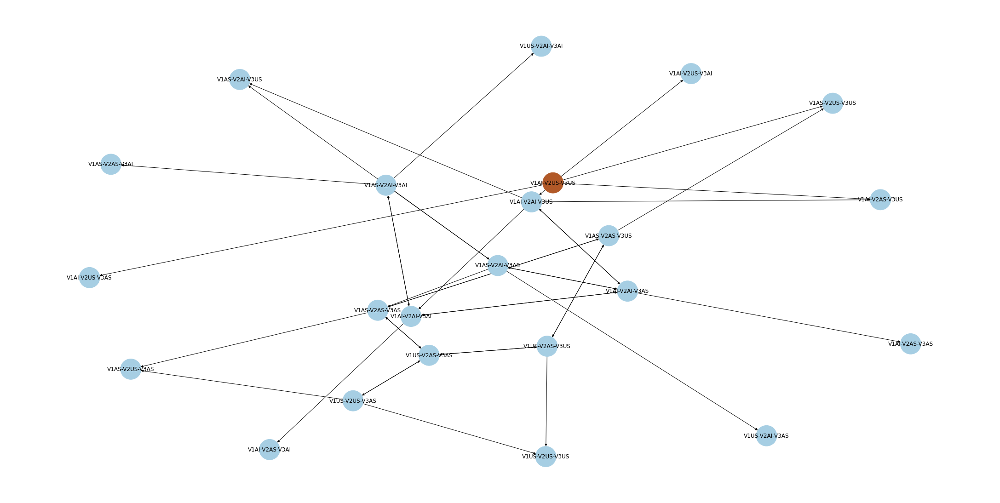

In [ ]:
plt.figure(figsize=(30, 15))
display(nx.draw(graph_sim, with_labels=True, node_color=color_initial_conf_sim, cmap=plt.get_cmap('Paired'), pos = positions_sim,
                node_size=2000))

In [ ]:
# preparing for identifying network configurations satysfing conditions
def reachability_cond_for_graph(language,mln_data):
  cond1, stopper_and_cond2 = language['reachability property'][0].split('R')

  first_cond_for_graph = ''
  second_cond_for_graph = ''
  first_condition_specification = '' 
  cond1_components = cond1.strip(" ()").split(',')
  operator1 = cond1_components[1].strip()
  threshold1 = cond1_components[2].strip()
  if '*' in cond1_components[0]: #node level specification
    if len(cond1_components[0].split('*')) == 2:
      agent,state = cond1_components[0].split('*')
      agent = agent.strip()
      state = state.strip()
      first_condition_specification += f"V{agent}{state}"
      if operator1 == '=':
        first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1}'    
    else:
      multiple_nodes = cond1_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        state = state.strip()
        first_condition_specification += f"V{node}{state} + "
        first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1} and'
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      last_state = last_state.strip()
      first_condition_specification += f"V{last_node}{last_state}"
      first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1}'
  else: #it is a state specififcation
    nodes = []
    for node in mln_data['actors'][0]:
      nodes.append(f"V{node}{state}") 
    for node_count in nodes[:-1]:
      first_condition_specification += node_count + ' + '
    first_condition_specification += nodes[-1]
    if operator1 == '=':
      first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1}'
    elif operator1 == '<':
      first_cond_for_graph += f'{first_condition_specification} must be {operator1} than {threshold1}'
    else:
      first_cond_for_graph += f'{first_condition_specification} must be {operator1} than {threshold1}' 

  stopper, cond2 = stopper_and_cond2.strip().split("&&")
  stopper_type, stopper_value = stopper.split('=')
  stopper_type_kappy = {'t':'T','e':'E'}
  cond2_components = cond2.strip(" ()").split(',')
  operator2 = cond2_components[1].strip()
  threshold2 = cond2_components[2].strip()
  second_condition_specification = '' 
  if '*' in cond2_components[0]: #node level specification
    if len(cond2_components[0].split('*')) == 2:
      agent,state = cond2_components[0].split('*')
      agent = agent.strip()
      state = state.strip()
      second_condition_specification += f"V{agent}{state}"
      if operator2 == '=':
        second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}' 
    else:
        multiple_nodes = cond2_components[0].split('&')
        for item in multiple_nodes[:-1]:
          node,state = item.split('*')
          node = node.strip()
          state = state.strip()    
        second_condition_specification += f"V{node}{state} + "
        second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2} and'
        last_node, last_state = multiple_nodes[-1].split('*')
        last_node = last_node.strip()
        last_state = last_state.strip()
        second_condition_specification += f"V{last_node}{last_state}" 
        second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}'
  else: #it is a state specififcation
    nodes = []
    for node in mln_data['actors'][0]:
      nodes.append(f"V{node}{state}")
    for node_count in nodes[:-1]:
      second_condition_specification += node_count + ' + '
    second_condition_specification += nodes[-1]
    if operator2 == '=':
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}'
    elif operator1 == '<':
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} than {threshold2}'
    else:
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} than {threshold2}'
  return first_cond_for_graph,second_cond_for_graph,first_condition_specification,second_condition_specification

In [ ]:
first_cond_for_graph, second_cond_for_graph,first_condition_specification_sim,second_condition_specification_sim = reachability_cond_for_graph(language,mln_data)

In [ ]:
first_network_condition_sim = network_nodes_id(first_cond_for_graph, nodes_sim, first_condition_specification_sim)
second_network_condition_sim = network_nodes_id(second_cond_for_graph, nodes_sim, second_condition_specification_sim)
print(first_network_condition_sim)
print(second_network_condition_sim)

['V1AI-V2US-V3US', 'V1AI-V2AI-V3US', 'V1AI-V2US-V3AI', 'V1AI-V2AS-V3US', 'V1AI-V2US-V3AS', 'V1AI-V2AI-V3AI', 'V1AI-V2AI-V3AS', 'V1AI-V2AS-V3AS', 'V1AI-V2AS-V3AI']
['V1AI-V2AI-V3US', 'V1AS-V2AI-V3US', 'V1AI-V2AI-V3AI', 'V1AI-V2AI-V3AS', 'V1AS-V2AI-V3AS', 'V1AS-V2AI-V3AI', 'V1US-V2AI-V3AI', 'V1US-V2AI-V3AS']


In [ ]:
color_reachability_sim,legend_sim = color_reachability_cond(first_network_condition_sim, second_network_condition_sim, initial_net, nodes_sim)
color_reachability_sim, legend_sim

([32,
  0,
  16,
  11,
  11,
  11,
  5,
  16,
  16,
  5,
  11,
  5,
  11,
  5,
  0,
  5,
  0,
  0,
  0,
  0,
  0,
  0,
  0],
 {32: 'initial net, first condition satisfied',
  0: 'nothing satisfied',
  16: 'both conditions satisfied',
  11: 'first condition satisfied',
  5: 'second condition satisfied'})

In [ ]:
mapper_sim = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped_sim = mapper_sim.to_rgba(np.unique(color_reachability_sim))

None

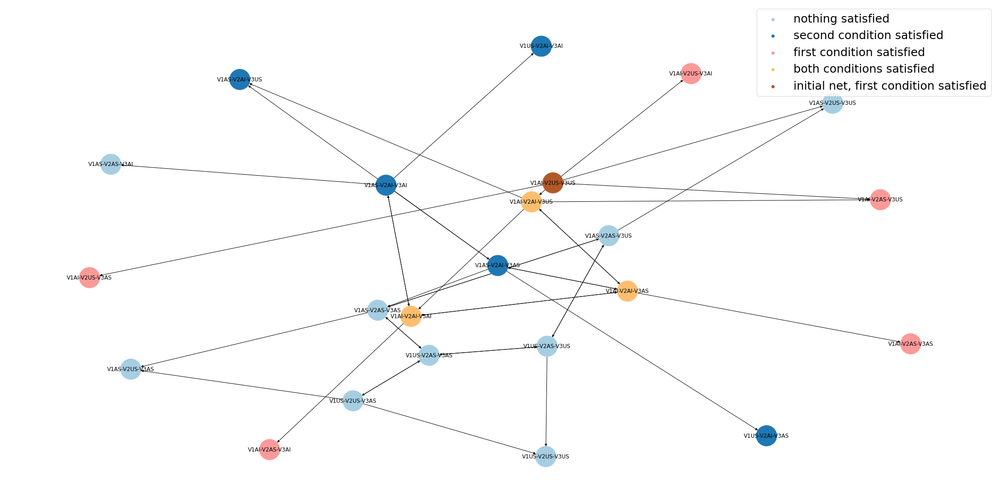

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph_sim, with_labels=True, node_color=color_reachability_sim, cmap=plt.get_cmap('Paired'), pos = positions_sim,
                node_size=2000))


for v in np.unique(color_reachability_sim):
    plt.scatter([],[], color=mapped_sim[list(np.unique(color_reachability_sim)).index(v)], label = legend[v])


plt.legend(fontsize=25)

Computing the path to reachability...

In [ ]:
if 1 in three_nodes_event_chain.property_reachability.values:
  event_reached = three_nodes_event_chain[three_nodes_event_chain.property_reachability.isin([1])]
  event_reached_index = three_nodes_event_chain[three_nodes_event_chain.property_reachability.isin([1])].index[0] #retrieve index of the first row where reachability property is satisfied
elif 't' == stopper_type:
  event_reached = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:]
  event_reached_index = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:].index[-1]
elif 'e' == stopper_type:
  event_reached = three_nodes_event_chain.iloc[int(stopper_value.strip())+1:,:]
  event_reached_index = three_nodes_event_chain.index[int(stopper_value.strip())+1]

In [ ]:
zoom_net = event_reached.iloc[:1,4:4+mln_data['actors'][1]*len(language['states'])]
event_reached_network = ''
for elem in range(len(zoom_net.values[0])):
  if zoom_net.values[0][elem] == 1:
    event_reached_network += f"{zoom_net.columns[elem]}-"
event_reached_network = event_reached_network[:-1]
event_reached_network

'V1AI-V2AI-V3US'

In [ ]:
shortest_paths_sim = list(nx.all_shortest_paths(graph_sim, initial_net, event_reached_network))
shortest_paths_sim

[['V1AI-V2US-V3US', 'V1AI-V2AI-V3US']]

In [ ]:
for el in second_network_condition_sim:
  if nx.has_path(graph_sim, initial_net, el):
    print(nx.shortest_path_length(graph_sim, initial_net, el))

1
2
2
2
3
3
4
4


In [ ]:
valid_paths_sim = check_reachability(shortest_paths_sim, first_network_condition_sim, second_network_condition_sim)
coloured_paths_sim, link_path_sim = color_shortest_paths(valid_paths_sim,graph_sim)

None

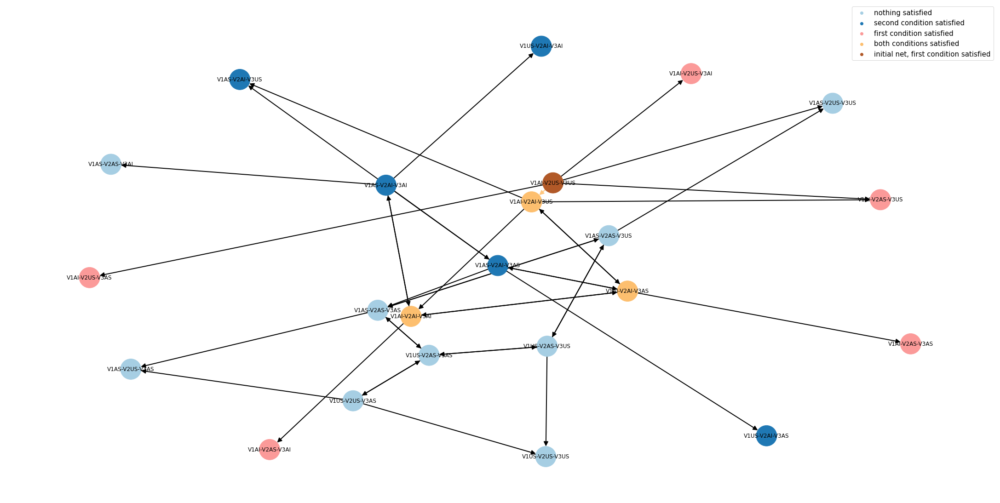

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph_sim, with_labels=True, node_color=color_reachability_sim, cmap=plt.get_cmap('Paired'), edge_color = coloured_paths_sim, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions_sim,
                node_size=2000))

for v in np.unique(color_reachability_sim):
    plt.scatter([],[], color=mapped_sim[list(np.unique(color_reachability_sim)).index(v)], label = legend_sim[v])


plt.legend(fontsize=15)


In [ ]:
simulated_path = simulation_path(three_nodes_event_chain, language,event_reached_index)

In [ ]:
coloured_simulated_paths_sim = color_simulated_path(simulated_path, graph_sim)

None

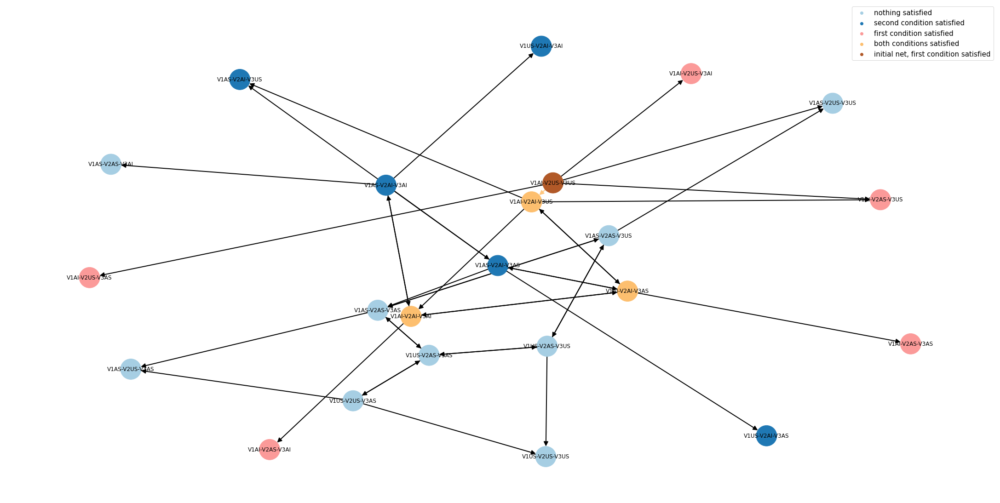

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph_sim, with_labels=True, node_color=color_reachability_sim, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths_sim, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions_sim,
                node_size=2000))


for v in np.unique(color_reachability_sim):
    plt.scatter([],[], color=mapped_sim[list(np.unique(color_reachability_sim)).index(v)], label = legend_sim[v])


plt.legend(fontsize=15)

In [ ]:
check_distance_in_simulated_path(three_nodes_event_chain, graph_sim, second_network_condition_sim,event_reached_index)

'the simulated trace reached the configuration satysfing condtion2 with  minimal number of events = 1'

Comparison between all networks-simulation based..

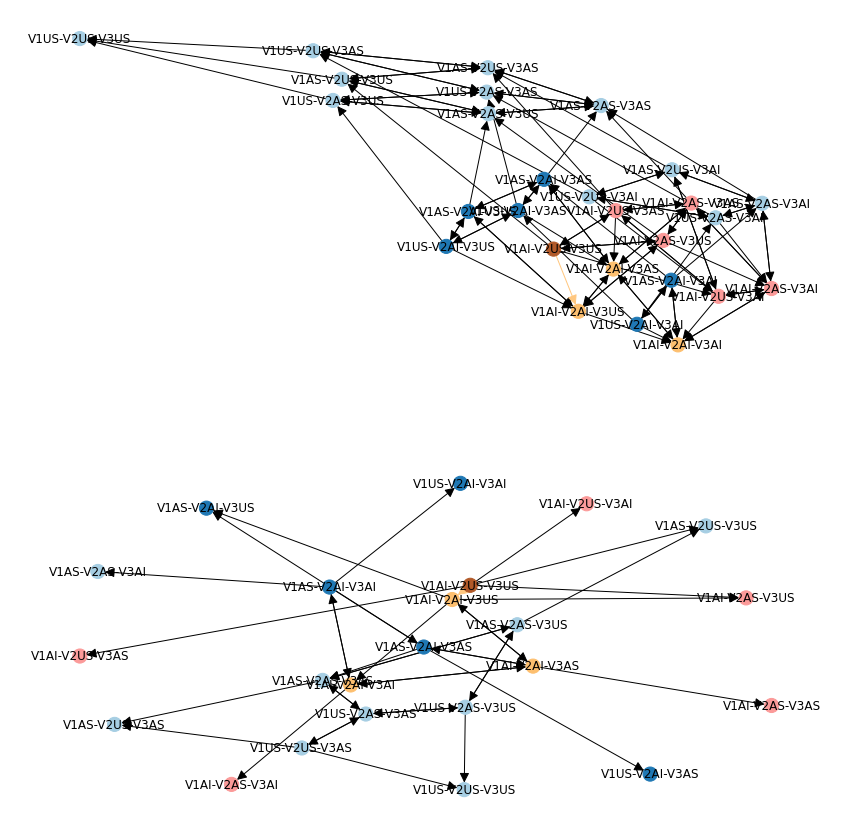

In [ ]:
fig, ax = plt.subplots(2,figsize=(15,15))



nx.draw(graph, with_labels=True, node_color=color_reachability, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths, arrowsize = 20, edge_cmap=plt.get_cmap("copper"), pos = positions,
                node_size=200,ax=ax[0])


nx.draw(graph_sim, with_labels=True, node_color=color_reachability_sim, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths_sim, arrowsize = 20, edge_cmap=plt.get_cmap("copper"), pos = positions_sim,
                node_size=200,ax=ax[1])




In [ ]:
print(f"the number of nodes passes from {len(graph.nodes())} to {len(graph_sim.nodes())},while the number of edges from {len(graph.edges())} to {len(graph_sim.edges())}")

the number of nodes passes from 27 to 23,while the number of edges from 100 to 39


# ESCAPE SHOWCASE

In [ ]:
language['escape property'][0]

'E e=4 && (2 * AI, =, 0)'

In [ ]:
# preparing for identifying network configurations satysfing conditions

empty,stopper_and_cond2 = language['escape property'][0].split('E')

second_cond_for_graph = ''
 

stopper, cond2 = stopper_and_cond2.strip().split("&&")
stopper_type, stopper_value = stopper.split('=')
stopper_type_kappy = {'t':'T','e':'E'}
cond2_components = cond2.strip(" ()").split(',')
operator2 = cond2_components[1].strip()
threshold2 = cond2_components[2].strip()
second_condition_specification = '' 
if '*' in cond2_components[0]: #node level specification
  if len(cond2_components[0].split('*')) == 2:
    agent,state = cond2_components[0].split('*')
    agent = agent.strip()
    state = state.strip()
    second_condition_specification += f"V{agent}{state}"
    if operator2 == '=':
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}' 
  else:
      multiple_nodes = cond2_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        state = state.strip()    
      second_condition_specification += f"V{node}{state} + "
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2} and'
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      last_state = last_state.strip()
      second_condition_specification += f"V{last_node}{last_state}" 
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}'
else: #it is a state specififcation
  nodes = []
  for node in mln_data['actors'][0]:
    nodes.append(f"V{node}{state}")
  for node_count in nodes[:-1]:
    second_condition_specification += node_count + ' + '
  second_condition_specification += nodes[-1]
  if operator2 == '=':
    second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}'
  elif operator1 == '<':
    second_cond_for_graph += f'{second_condition_specification} must be {operator2} than {threshold2}'
  else:
    second_cond_for_graph += f'{second_condition_specification} must be {operator2} than {threshold2}'
    


In [ ]:
second_cond_for_graph,second_condition_specification

('V2AI must be = to 0', 'V2AI')

In [ ]:
network_condition = network_nodes_id(second_cond_for_graph, network_configurations, second_condition_specification)
print(network_condition)

['V1AS-V2AS-V3AS', 'V1AS-V2AS-V3AI', 'V1AS-V2AS-V3US', 'V1AS-V2US-V3AS', 'V1AS-V2US-V3AI', 'V1AS-V2US-V3US', 'V1AI-V2AS-V3AS', 'V1AI-V2AS-V3AI', 'V1AI-V2AS-V3US', 'V1AI-V2US-V3AS', 'V1AI-V2US-V3AI', 'V1AI-V2US-V3US', 'V1US-V2AS-V3AS', 'V1US-V2AS-V3AI', 'V1US-V2AS-V3US', 'V1US-V2US-V3AS', 'V1US-V2US-V3AI', 'V1US-V2US-V3US']


In [ ]:
def color_escape_cond(network_condition, initial_net, network_configurations):
  color_reachability = []
  for network in network_configurations:
    acc = 0
    if network == initial_net:
      acc += 21
    if network in network_condition:
      acc += 11
    color_reachability.append(acc)
  legend = {}
  for color in color_reachability:
    if color == 0:
      legend[color] = 'condition not satisfied'
    if color == 11:
      legend[color] = 'condition satisfied'
    if color == 21:
      legend[color] = 'initial net, condition not satisfied'
    if color == 32:
      legend[color] = 'initial net, condition satisfied'
  return color_reachability,legend

In [ ]:
color_escape,legend_escape = color_escape_cond(network_condition, initial_net, network_configurations)
color_escape, legend_escape

([11,
  11,
  11,
  0,
  0,
  0,
  11,
  11,
  11,
  11,
  11,
  11,
  0,
  0,
  0,
  11,
  11,
  32,
  11,
  11,
  11,
  0,
  0,
  0,
  11,
  11,
  11],
 {11: 'condition satisfied',
  0: 'condition not satisfied',
  32: 'initial net, condition satisfied'})

In [ ]:
mapper_escape = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped_escape = mapper_escape.to_rgba(np.unique(color_escape))

None

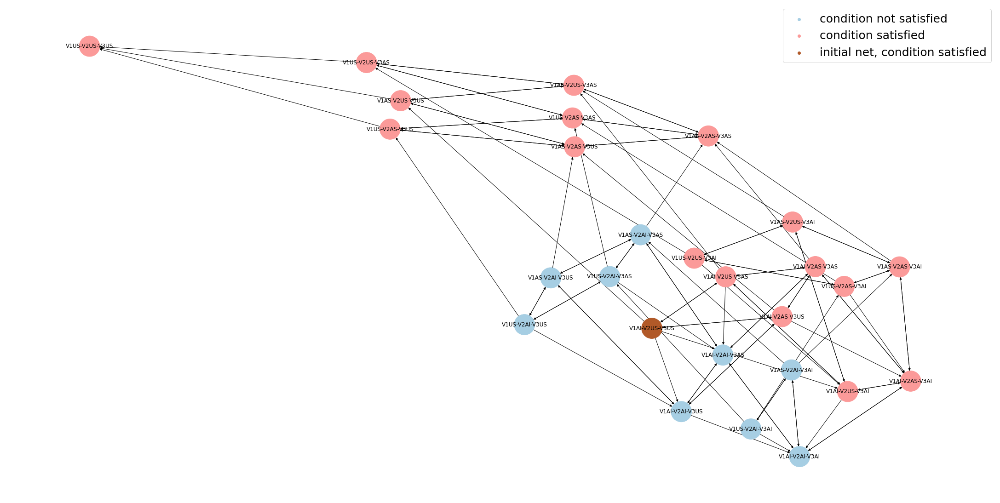

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_escape, cmap=plt.get_cmap('Paired'), pos = positions,
                node_size=2000))


for v in np.unique(color_escape):
    plt.scatter([],[], color=mapped_escape[list(np.unique(color_escape)).index(v)], label = legend_escape[v])


plt.legend(fontsize=25)

In [ ]:
if 0 in three_nodes_event_chain.property_escape.values:
  event_escape = three_nodes_event_chain[three_nodes_event_chain.property_escape.isin([0])]
  event_escape_index = three_nodes_event_chain[three_nodes_event_chain.property_escape.isin([0])].index[0] #retrieve index of the first row where reachability property is satisfied
elif 't' == stopper_type:
  event_escape = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:]
  event_escape_index = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:].index[-1]
elif 'e' == stopper_type:
  event_escape = three_nodes_event_chain.iloc[int(stopper_value.strip())+1:,:]
  event_escape_index = three_nodes_event_chain.index[int(stopper_value.strip())+1]
zoom_net_escape = three_nodes_event_chain.iloc[:event_escape_index+1,4:4+mln_data['actors'][1]*len(language['states'])]

In [ ]:
event_escape_network = ''
for elem in range(len(zoom_net_escape.values[0])):
  if zoom_net_escape.values[0][elem] == 1:
    event_escape_network += f"{zoom_net_escape.columns[elem]}-"
event_escape_network = event_escape_network[:-1]
event_escape_network

'V1AI-V2US-V3US'

In [ ]:
shortest_paths_escape = list(nx.all_shortest_paths(graph, initial_net, event_escape_network))
shortest_paths_escape

[['V1AI-V2US-V3US']]

In [ ]:
coloured_escape_paths, link_path_escape = color_shortest_paths(shortest_paths_escape,graph)

None

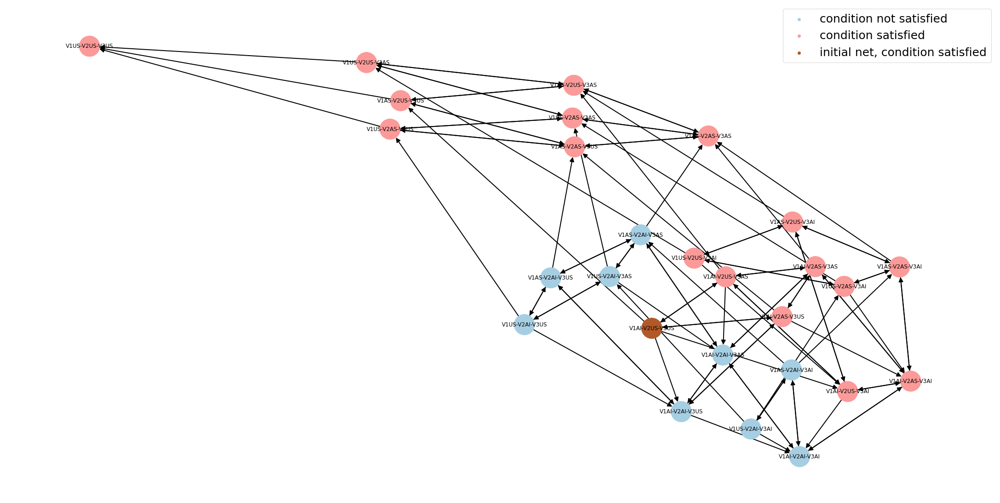

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_escape, cmap=plt.get_cmap('Paired'), edge_color = coloured_escape_paths, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions,
                node_size=2000))


for v in np.unique(color_escape):
    plt.scatter([],[], color=mapped_escape[list(np.unique(color_escape)).index(v)], label = legend_escape[v])


plt.legend(fontsize=25)

In [ ]:
def simulation_escape_path(three_node_sim, three_nodes_events_chain, language,mln_data, stopper_value,stopper_type):
  if 0 in three_nodes_event_chain.property_escape.values:
    event_escape = three_nodes_event_chain[three_nodes_event_chain.property_escape.isin([0])]
    event_escape_index = three_nodes_event_chain[three_nodes_event_chain.property_escape.isin([0])].index[0] #retrieve index of the first row where reachability property is satisfied
  elif 't' == stopper_type:
    event_escape = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:]
    event_escape_index = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:].index[-1]
  elif 'e' == stopper_type:
    event_escape = three_nodes_event_chain.iloc[int(stopper_value.strip())+1:,:]
    event_escape_index = three_nodes_event_chain.index[int(stopper_value.strip())+1]
  zoom_net = three_nodes_event_chain.iloc[:event_escape_index+1,4:4+mln_data['actors'][1]*len(language['states'])]
  simulation_path_escape = []
  for net in zoom_net.values:
    simulation_net = ''
    for elem in range(len(net)):
      if net[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}-"
    simulation_path_escape.append(simulation_net[:-1])
  simulation_links = []
  for el in range(len(simulation_path_escape)-1):
    simulation_links.append((simulation_path_escape[el],simulation_path_escape[el+1]))
  return simulation_links

In [ ]:
simulated_path_escape = simulation_escape_path(three_node_sim, three_nodes_event_chain, language,mln_data, stopper_value,stopper_type)

In [ ]:
simulated_path_escape

[('V1AI-V2US-V3US', 'V1AI-V2AI-V3US')]

In [ ]:
def color_simulated_path(simulation_path, graph):
  color_sim_path = list(np.zeros(len(list(graph.edges()))))
  for el in simulated_path:
    color_sim_path[list(graph.edges()).index(el)] += 10    
  return color_sim_path

In [ ]:
coloured_simulated_paths_escape = color_simulated_path(simulated_path_escape, graph)


None

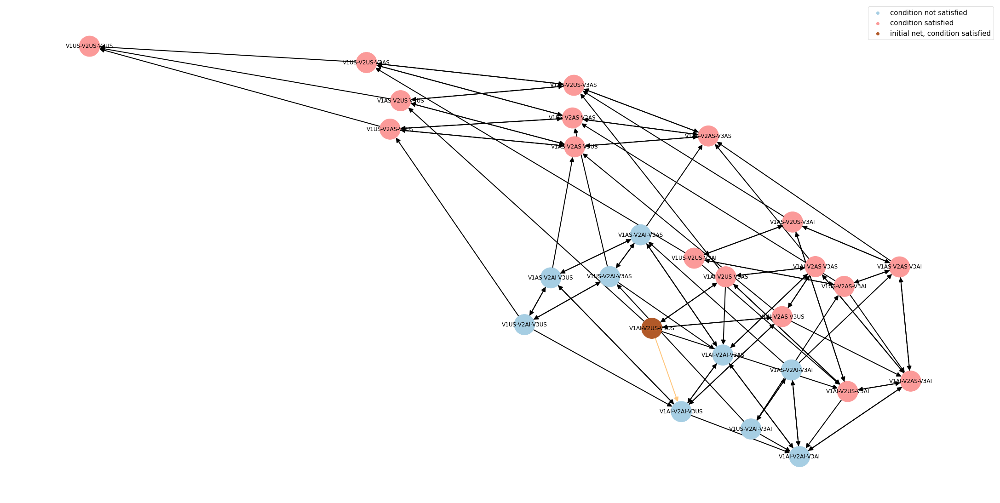

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_escape, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths_escape, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions,
                node_size=2000))


for v in np.unique(color_escape):
    plt.scatter([],[], color=mapped_escape[list(np.unique(color_escape)).index(v)], label = legend_escape[v])


plt.legend(fontsize=15)

##SIMULATION-BASED ESCAPE

In [ ]:
# preparing for identifying network configurations satysfing conditions
def escape_cond_for_graph(language,mln_data):
  empty,stopper_and_cond2 = language['escape property'][0].split('E')
  second_cond_for_graph = ''

  stopper, cond2 = stopper_and_cond2.strip().split("&&")
  stopper_type, stopper_value = stopper.split('=')
  stopper_type_kappy = {'t':'T','e':'E'}
  cond2_components = cond2.strip(" ()").split(',')
  operator2 = cond2_components[1].strip()
  threshold2 = cond2_components[2].strip()
  second_condition_specification = '' 
  if '*' in cond2_components[0]: #node level specification
    if len(cond2_components[0].split('*')) == 2:
      agent,state = cond2_components[0].split('*')
      agent = agent.strip()
      state = state.strip()
      second_condition_specification += f"V{agent}{state}"
      if operator2 == '=':
        second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}' 
    else:
        multiple_nodes = cond2_components[0].split('&')
        for item in multiple_nodes[:-1]:
          node,state = item.split('*')
          node = node.strip()
          state = state.strip()    
        second_condition_specification += f"V{node}{state} + "
        second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2} and'
        last_node, last_state = multiple_nodes[-1].split('*')
        last_node = last_node.strip()
        last_state = last_state.strip()
        second_condition_specification += f"V{last_node}{last_state}" 
        second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}'
  else: #it is a state specififcation
    nodes = []
    for node in mln_data['actors'][0]:
      nodes.append(f"V{node}{state}")
    for node_count in nodes[:-1]:
      second_condition_specification += node_count + ' + '
    second_condition_specification += nodes[-1]
    if operator2 == '=':
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}'
    elif operator1 == '<':
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} than {threshold2}'
    else:
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} than {threshold2}'
  return second_cond_for_graph, second_condition_specification

In [ ]:
cond_for_graph_escape,condition_specification_sim_escape = escape_cond_for_graph(language,mln_data)
cond_for_graph_escape,condition_specification_sim_escape

('V2AI must be = to 0', 'V2AI')

In [ ]:
network_condition_sim_escape = network_nodes_id(cond_for_graph_escape, nodes_sim, condition_specification_sim_escape)
print(network_condition_sim_escape)

['V1AI-V2US-V3US', 'V1AS-V2US-V3US', 'V1AI-V2US-V3AI', 'V1AI-V2AS-V3US', 'V1AI-V2US-V3AS', 'V1AI-V2AS-V3AS', 'V1AI-V2AS-V3AI', 'V1AS-V2AS-V3AI', 'V1AS-V2AS-V3AS', 'V1US-V2AS-V3AS', 'V1AS-V2US-V3AS', 'V1AS-V2AS-V3US', 'V1US-V2AS-V3US', 'V1US-V2US-V3AS', 'V1US-V2US-V3US']


In [ ]:
color_escape_sim,legend_escape_sim = color_escape_cond(network_condition_sim_escape, initial_net, nodes_sim)
color_escape_sim, legend_escape_sim

([32,
  11,
  0,
  11,
  11,
  11,
  0,
  0,
  0,
  0,
  11,
  0,
  11,
  0,
  11,
  0,
  11,
  11,
  11,
  11,
  11,
  11,
  11],
 {32: 'initial net, condition satisfied',
  11: 'condition satisfied',
  0: 'condition not satisfied'})

In [ ]:
mapper_sim_escape = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped_sim_escape = mapper_sim_escape.to_rgba(np.unique(color_escape_sim))

None

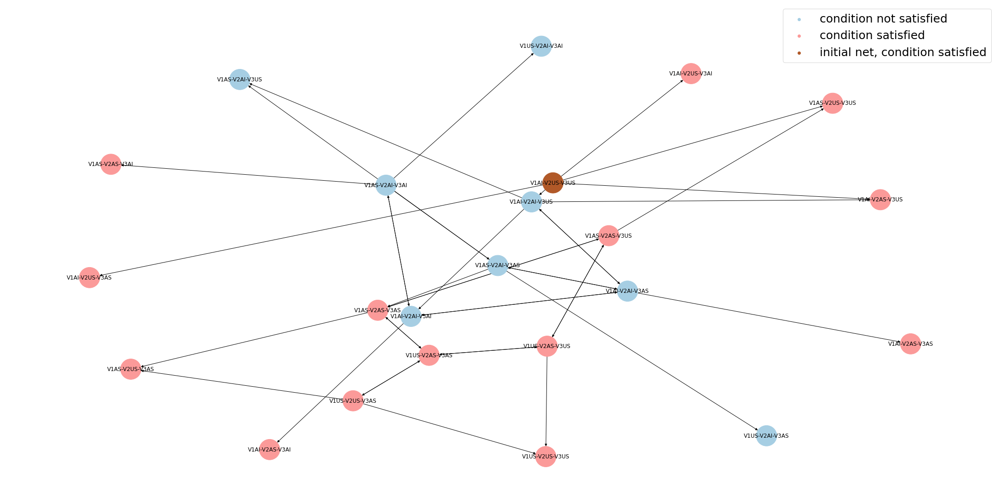

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph_sim, with_labels=True, node_color=color_escape_sim, cmap=plt.get_cmap('Paired'), pos = positions_sim,
                node_size=2000))


for v in np.unique(color_escape_sim):
    plt.scatter([],[], color=mapped_sim_escape[list(np.unique(color_escape_sim)).index(v)], label = legend_escape_sim[v])


plt.legend(fontsize=25)

In [ ]:
shortest_paths_sim_escape = list(nx.all_shortest_paths(graph_sim, initial_net, event_escape_network))
shortest_paths_sim_escape

[['V1AI-V2US-V3US']]

In [ ]:
coloured_paths_sim_escape, link_path_sim_escape = color_shortest_paths(shortest_paths_sim_escape,graph_sim)

In [ ]:
coloured_simulated_paths_escape = color_simulated_path(simulated_path_escape, graph_sim)

None

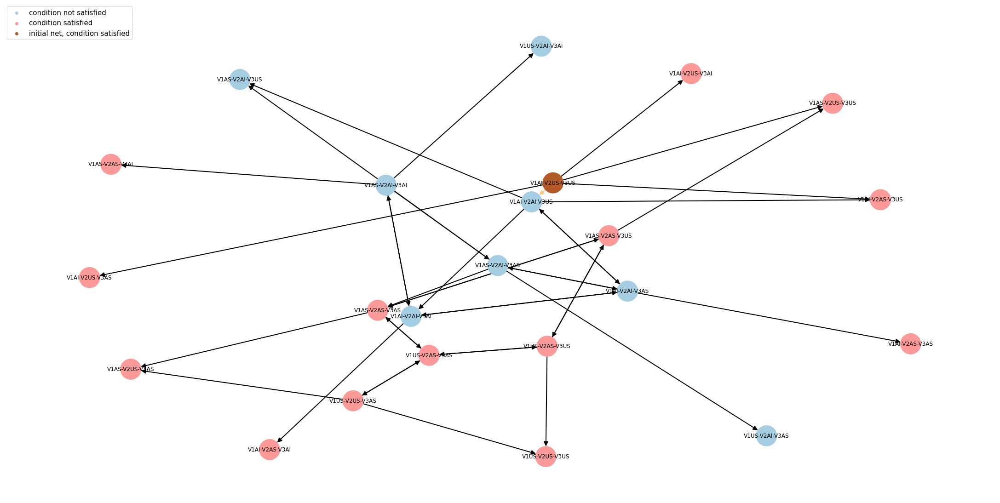

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph_sim, with_labels=True, node_color=color_escape_sim, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths_escape, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions_sim,
                node_size=2000))


for v in np.unique(color_escape_sim):
    plt.scatter([],[], color=mapped_sim_escape[list(np.unique(color_escape_sim)).index(v)], label = legend_escape_sim[v])


plt.legend(fontsize=15,loc='upper left')

## VALIDATION OF ESCAPE

e < 4 in the kappy code

In [ ]:
network_condition_escape = network_condition

In [ ]:
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")


escape property confidence interval is: (0.3791750048377701, 0.4148249951622299)


In [ ]:
def recursion_paths(initial_net,grouping_prob):
  shorter_paths = []
  dict_paths = {0 : [initial_net]}
  for i in range(1,10):
    for path in dict_paths[i-1]:
      if i-1 == 0:
        neigs = list(map(lambda x:x[0], grouping_prob[path]))
        new_paths = []
        if type(path) != list:
          for neig in neigs:
            new_paths.append([path,neig])
          dict_paths[i] = new_paths
      else:
        if path[-1] in grouping_prob:
          neigs = list(map(lambda x:x[0], grouping_prob[path[-1]]))
          for neig in neigs:
            new_list = []
            for el in path:
              new_list.append(el)
            new_list.append(neig)
            if i not in dict_paths:
              dict_paths[i] = [new_list]
            else:
              dict_paths[i].append(new_list)
        else:
          if i-1 < 9:
            shorter_paths.append(path)
  return dict_paths,shorter_paths


In [ ]:
paths,shorter_paths = recursion_paths(initial_net,grouping_prob)

In [ ]:
def check_escape(paths,network_condition):
  valid_paths = []
  for path in paths:
    satisfied = True
    for elem in path:
      if elem in network_condition:
        continue
      else:
        satisfied = False
    if satisfied:
      valid_paths.append(path)
  return valid_paths 

In [ ]:
valid_paths_escape = check_escape(paths[3],network_condition)
shorter_valid_paths_escape = check_escape(shorter_paths, network_condition)

In [ ]:
#compute all the simple paths

escape_probability = 0

edged_paths = map(nx.utils.pairwise, valid_paths_escape)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  escape_probability += prob_path
print(f"escape without shorter property probability is = {escape_probability}")
for el in shorter_valid_paths_escape:
  if len(el) <= 3:
    prob_path = 1
    edged_shorter = nx.utils.pairwise(el)
    for link in edged_shorter:
      for item in graph.edges.data('weight'):
        if link[0] == item[0] and link[1] == item[1]:
          prob_path *= item[2]
    escape_probability += prob_path
print(f"escape adding shorter property probability is = {escape_probability}")




escape without shorter property probability is = 0.3528108465608464
escape adding shorter property probability is = 0.3898478835978834


# SOMEWHERE SHOWCASE

In [ ]:
language['somewhere property'][0]

'SOMEWHERE e=3 && (AS, >, 0)'

In [ ]:
# preparing for identifying network configurations satysfing conditions

empty,stopper_and_cond2 = language['somewhere property'][0].split('SOMEWHERE')

second_cond_for_graph = ''
 

# For SOMEWHERE, allowed only state specification

stopper, cond2 = stopper_and_cond2.strip().split("&&")
stopper_type, stopper_value = stopper.split('=')
stopper_type_kappy = {'t':'T','e':'E'}
cond2_components = cond2.strip(" ()").split(',')
second_condition_specification = '' 
nodes = []
for node in mln_data['actors'][0]:
  nodes.append(f"V{node}{cond2_components[0]}")
for node_count in nodes[:-1]:
  second_condition_specification += node_count + ' + '
second_condition_specification += nodes[-1]
second_cond_for_graph = cond2_components[0]

In [ ]:
cond_for_graph, condition_specification = second_cond_for_graph,second_condition_specification
cond_for_graph, condition_specification

('AS', 'V1AS + V2AS + V3AS')

In [ ]:
def network_nodes_id_somewhere(network_configurations,language):
  empty,stopper_and_cond2 = language['somewhere property'][0].split('SOMEWHERE')
  networks_condition = []
  stopper, cond2 = stopper_and_cond2.strip().split("&&")
  stopper_type, stopper_value = stopper.split('=')
  stopper_type_kappy = {'t':'T','e':'E'}
  state,op,value = cond2.strip(" ()").split(',')
  state = state.strip()
  op = op.strip()
  value = int(value.strip())

  networks_condition = []
  for network in network_configurations:
    net_comps = network.split('-')
    acc = 0
    for net_comp in net_comps:
      if state in net_comp:
        acc += 1
    if acc :
      networks_condition.append(network)
  return networks_condition

In [ ]:
network_condition_somewhere = network_nodes_id_somewhere(network_configurations,language)
print(network_condition_somewhere)

['V1AS-V2AS-V3AS', 'V1AS-V2AS-V3AI', 'V1AS-V2AS-V3US', 'V1AS-V2AI-V3AS', 'V1AS-V2AI-V3AI', 'V1AS-V2AI-V3US', 'V1AS-V2US-V3AS', 'V1AS-V2US-V3AI', 'V1AS-V2US-V3US', 'V1AI-V2AS-V3AS', 'V1AI-V2AS-V3AI', 'V1AI-V2AS-V3US', 'V1AI-V2AI-V3AS', 'V1AI-V2US-V3AS', 'V1US-V2AS-V3AS', 'V1US-V2AS-V3AI', 'V1US-V2AS-V3US', 'V1US-V2AI-V3AS', 'V1US-V2US-V3AS']


In [ ]:
def color_somewhere_cond(network_condition, initial_net, network_configurations):
  color_somewhere = []
  for network in network_configurations:
    acc = 0
    if network == initial_net:
      acc += 21
    if network in network_condition:
      acc += 11
    color_somewhere.append(acc)
  legend = {}
  for color in color_somewhere:
    if color == 0:
      legend[color] = 'condition not satisfied'
    if color == 11:
      legend[color] = 'condition satisfied'
    if color == 21:
      legend[color] = 'initial net, condition not satisfied'
    if color == 32:
      legend[color] = 'initial net, condition satisfied'
  return color_somewhere,legend

In [ ]:
color_somewhere,legend_somewhere = color_somewhere_cond(network_condition_somewhere, initial_net, network_configurations)
color_somewhere, legend_somewhere

([11,
  11,
  11,
  11,
  11,
  11,
  11,
  11,
  11,
  11,
  11,
  11,
  11,
  0,
  0,
  11,
  0,
  21,
  11,
  11,
  11,
  11,
  0,
  0,
  11,
  0,
  0],
 {11: 'condition satisfied',
  0: 'condition not satisfied',
  21: 'initial net, condition not satisfied'})

In [ ]:
mapper_somewhere = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped_somewhere = mapper_somewhere.to_rgba(np.unique(color_somewhere))

None

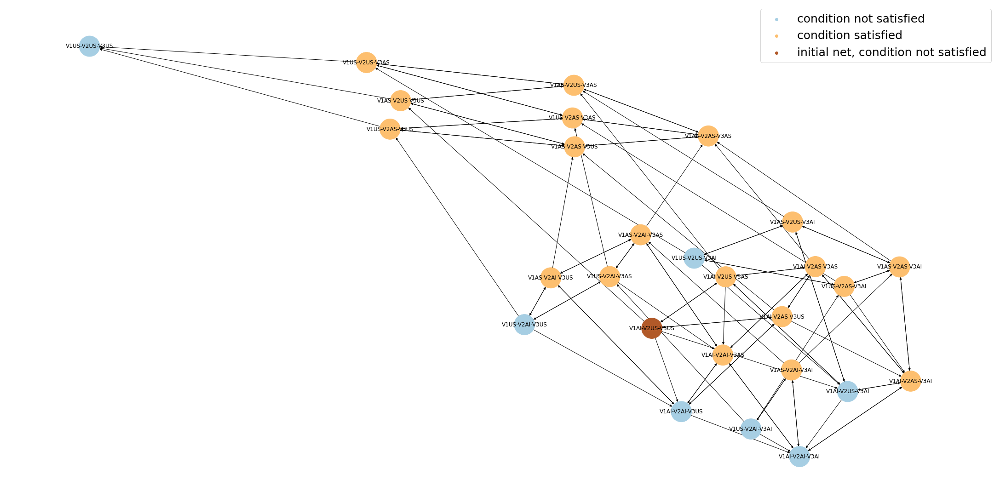

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_somewhere, cmap=plt.get_cmap('Paired'), pos = positions,
                node_size=2000))


for v in np.unique(color_somewhere):
    plt.scatter([],[], color=mapped_somewhere[list(np.unique(color_somewhere)).index(v)], label = legend_somewhere[v])


plt.legend(fontsize=25)

In [ ]:
def simulation_somewhere_path(three_node_sim, events_chain, language,mln_data, stopper_value,stopper_type):
  if 0 in events_chain.property_somewhere.values:
    event_somewhere = events_chain[events_chain.property_somewhere.isin([1])]
    event_somewhere_index = events_chain[events_chain.property_somewhere.isin([1])].index[0] #retrieve index of the first row where reachability property is satisfied
  elif 't' == stopper_type:
    event_somewhere = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:]
    event_somewhere_index = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:].index[-1]
  elif 'e' == stopper_type:
    event_somewhere = events_chain.iloc[int(stopper_value.strip())+1:,:]
    event_somewhere_index = events_chain.index[int(stopper_value.strip())+1]
  zoom_net = events_chain.iloc[:event_somewhere_index+1,4:4+mln_data['actors'][1]*len(language['states'])]
  simulation_path_somewhere = []
  for net in zoom_net.values:
    simulation_net = ''
    for elem in range(len(net)):
      if net[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}-"
    simulation_path_somewhere.append(simulation_net[:-1])
  simulation_links = []
  for el in range(len(simulation_path_somewhere)-1):
    simulation_links.append((simulation_path_somewhere[el],simulation_path_somewhere[el+1]))
  return simulation_links

In [ ]:
simulated_path_somewhere = simulation_somewhere_path(three_node_sim, three_nodes_event_chain, language,mln_data, stopper_value,stopper_type)

In [ ]:
simulated_path_somewhere

[('V1AI-V2US-V3US', 'V1AI-V2AI-V3US'), ('V1AI-V2AI-V3US', 'V1AI-V2AI-V3AS')]

In [ ]:
def color_simulated_path(simulation_path, graph):
  color_sim_path = list(np.zeros(len(list(graph.edges()))))
  for el in simulation_path:
    color_sim_path[list(graph.edges()).index(el)] += 10    
  return color_sim_path

In [ ]:
coloured_simulated_paths_somewhere = color_simulated_path(simulated_path_somewhere, graph)

None

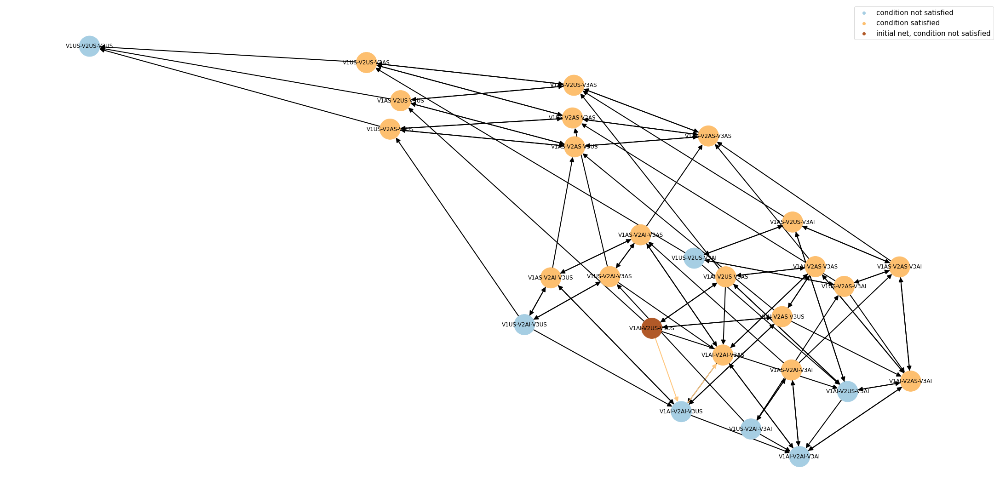

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_somewhere, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths_somewhere, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions,
                node_size=2000))


for v in np.unique(color_somewhere):
    plt.scatter([],[], color=mapped_somewhere[list(np.unique(color_somewhere)).index(v)], label = legend_somewhere[v])


plt.legend(fontsize=15)

## SIMULATION-BASED SOMEWHERE

In [ ]:
network_condition_sim_somewhere = network_nodes_id_somewhere(nodes_sim,language)
print(network_condition_sim_somewhere)

['V1AS-V2US-V3US', 'V1AI-V2AS-V3US', 'V1AI-V2US-V3AS', 'V1AS-V2AI-V3US', 'V1AI-V2AI-V3AS', 'V1AS-V2AI-V3AS', 'V1AI-V2AS-V3AS', 'V1AS-V2AI-V3AI', 'V1AI-V2AS-V3AI', 'V1AS-V2AS-V3AI', 'V1US-V2AI-V3AS', 'V1AS-V2AS-V3AS', 'V1US-V2AS-V3AS', 'V1AS-V2US-V3AS', 'V1AS-V2AS-V3US', 'V1US-V2AS-V3US', 'V1US-V2US-V3AS']


In [ ]:
color_somewhere_sim,legend_somewhere_sim = color_somewhere_cond(network_condition_sim_somewhere, initial_net, nodes_sim)

In [ ]:
mapper_sim_somewhere = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped_sim_somewhere = mapper_sim_somewhere.to_rgba(np.unique(color_somewhere_sim))

In [ ]:
coloured_simulated_paths_somewhere = color_simulated_path(simulated_path_somewhere, graph_sim)

None

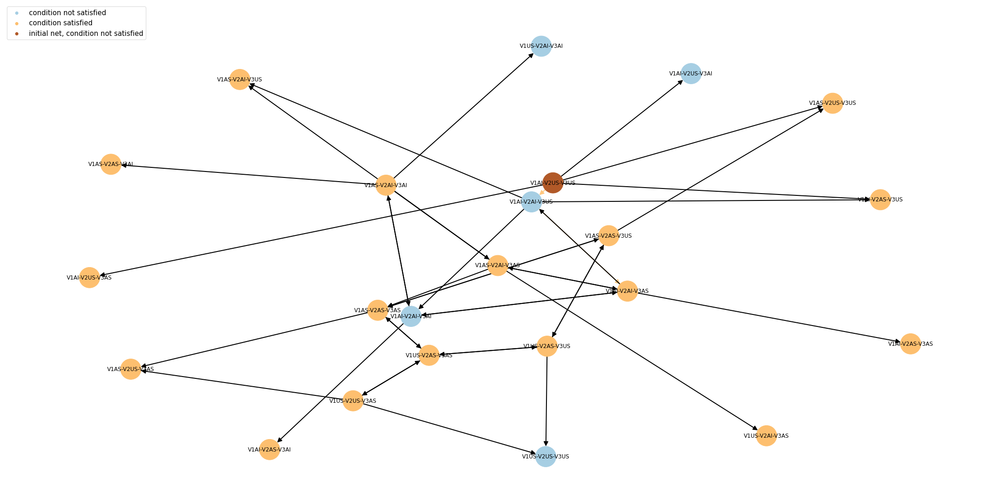

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph_sim, with_labels=True, node_color=color_somewhere_sim, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths_somewhere, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions_sim,
                node_size=2000))


for v in np.unique(color_somewhere_sim):
    plt.scatter([],[], color=mapped_sim_somewhere[list(np.unique(color_somewhere_sim)).index(v)], label = legend_somewhere_sim[v])


plt.legend(fontsize=15,loc='upper left')

## VALIDATION SOMEWHERE

With e < 3.

In [ ]:
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")


somewhere property confidence interval is: (0.7040495034318914, 0.7367504965681086)


In [ ]:
def recursion_paths(initial_net,grouping_prob):
  shorter_paths = []
  dict_paths = {0 : [initial_net]}
  for i in range(1,10):
    for path in dict_paths[i-1]:
      if i-1 == 0:
        neigs = list(map(lambda x:x[0], grouping_prob[path]))
        new_paths = []
        if type(path) != list:
          for neig in neigs:
            new_paths.append([path,neig])
          dict_paths[i] = new_paths
      else:
        if path[-1] in grouping_prob:
          neigs = list(map(lambda x:x[0], grouping_prob[path[-1]]))
          for neig in neigs:
            new_list = []
            for el in path:
              new_list.append(el)
            new_list.append(neig)
            if i not in dict_paths:
              dict_paths[i] = [new_list]
            else:
              dict_paths[i].append(new_list)
        else:
          if i-1 < 9:
            shorter_paths.append(path)
  return dict_paths,shorter_paths


In [ ]:
paths_somewhere, shorter_paths_somewhere = recursion_paths(initial_net,grouping_prob)
paths_somewhere[2]

[['V1AI-V2US-V3US', 'V1AS-V2US-V3US', 'V1US-V2US-V3US'],
 ['V1AI-V2US-V3US', 'V1AS-V2US-V3US', 'V1AS-V2AS-V3US'],
 ['V1AI-V2US-V3US', 'V1AS-V2US-V3US', 'V1AS-V2US-V3AS'],
 ['V1AI-V2US-V3US', 'V1AI-V2AI-V3US', 'V1AS-V2AI-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2AI-V3US', 'V1AI-V2AS-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2AI-V3US', 'V1AI-V2AI-V3AI'],
 ['V1AI-V2US-V3US', 'V1AI-V2AI-V3US', 'V1AI-V2AI-V3AS'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AI', 'V1AS-V2US-V3AI'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AI', 'V1AI-V2US-V3AS'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AI', 'V1AI-V2AI-V3AI'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AI', 'V1AI-V2AS-V3AI'],
 ['V1AI-V2US-V3US', 'V1AI-V2AS-V3US', 'V1AI-V2US-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2AS-V3US', 'V1AS-V2AS-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2AS-V3US', 'V1AI-V2AI-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2AS-V3US', 'V1AI-V2AS-V3AI'],
 ['V1AI-V2US-V3US', 'V1AI-V2AS-V3US', 'V1AI-V2AS-V3AS'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AS', 'V1AI-V2US-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-

In [ ]:
def check_somewhere(shortest_paths, network_condition_somewhere,events):
  valid_paths = []
  for path in shortest_paths:
    net = 0
    while  net < events and path[net] not in network_condition_somewhere:
      net += 1
    if net == events and path[net] in network_condition_somewhere:
      if path not in valid_paths:
        valid_paths.append(path)
    elif net == events and path[net] not in network_condition_somewhere:
      continue
    else:
      if path[:net+1] not in valid_paths:
        valid_paths.append(path[:net+1])
  return valid_paths


In [ ]:
valid_paths_somewhere = check_somewhere(paths_somewhere[2], network_condition_somewhere,2)
valid_paths_somewhere

[['V1AI-V2US-V3US', 'V1AS-V2US-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2AI-V3US', 'V1AS-V2AI-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2AI-V3US', 'V1AI-V2AS-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2AI-V3US', 'V1AI-V2AI-V3AS'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AI', 'V1AS-V2US-V3AI'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AI', 'V1AI-V2US-V3AS'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AI', 'V1AI-V2AS-V3AI'],
 ['V1AI-V2US-V3US', 'V1AI-V2AS-V3US'],
 ['V1AI-V2US-V3US', 'V1AI-V2US-V3AS']]

In [ ]:
somewhere_probability = 0

edged_paths = map(nx.utils.pairwise, valid_paths_somewhere)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  somewhere_probability += prob_path
print(f"somewhere property probability before shorter paths is = {somewhere_probability}")

somewhere property probability before shorter paths is = 0.7142857142857142


# SURROUND SHOWCASE

In [ ]:
language['surround property'][0]

'(1 * AI, =, 1) SURROUND e=4 && (AS, >, 0)'

In [ ]:
# preparing for identifying network configurations satysfing conditions

cond1, stopper_and_cond2 = language['surround property'][0].split('SURROUND')

first_cond_for_graph = ''
second_cond_for_graph = ''
first_condition_specification = '' 
cond1_components = cond1.strip(" ()").split(',')
operator1 = cond1_components[1].strip()
threshold1 = cond1_components[2].strip()
if '*' in cond1_components[0]: #node level specification
  if len(cond1_components[0].split('*')) == 2:
    agent,state = cond1_components[0].split('*')
    agent = agent.strip()
    state = state.strip()
    first_condition_specification += f"V{agent}{state}"
    if operator1 == '=':
      first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1}'    
  else:
    multiple_nodes = cond1_components[0].split('&')
    for item in multiple_nodes[:-1]:
      node,state = item.split('*')
      node = node.strip()
      state = state.strip()
      first_condition_specification += f"V{node}{state} + "
      first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1} and'
    last_node, last_state = multiple_nodes[-1].split('*')
    last_node = last_node.strip()
    last_state = last_state.strip()
    first_condition_specification += f"V{last_node}{last_state}"
    first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1}'
else: #it is a state specififcation
  nodes = []
  for node in mln_data['actors'][0]:
    nodes.append(f"V{node}{state}") 
  for node_count in nodes[:-1]:
    first_condition_specification += node_count + ' + '
  first_condition_specification += nodes[-1]
  if operator1 == '=':
    first_cond_for_graph += f'{first_condition_specification} must be {operator1} to {threshold1}'
  elif operator1 == '<':
    first_cond_for_graph += f'{first_condition_specification} must be {operator1} than {threshold1}'
  else:
    first_cond_for_graph += f'{first_condition_specification} must be {operator1} than {threshold1}' 

stopper, cond2 = stopper_and_cond2.strip().split("&&")
stopper_type, stopper_value = stopper.split('=')
stopper_type_kappy = {'t':'T','e':'E'}
state,op,value = cond2.strip(" ()").split(',')
state = state.strip()
op = op.strip()
value = int(value.strip())
cond2_components = cond2.strip(" ()").split(',')
operator2 = cond2_components[1].strip()
threshold2 = cond2_components[2].strip()
second_condition_specification = '' 
if '*' in cond2_components[0]: #node level specification
  if len(cond2_components[0].split('*')) == 2:
    agent,state = cond2_components[0].split('*')
    agent = agent.strip()
    state = state.strip()
    second_condition_specification += f"V{agent}{state}"
    if operator2 == '=':
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}' 
  else:
      multiple_nodes = cond2_components[0].split('&')
      for item in multiple_nodes[:-1]:
        node,state = item.split('*')
        node = node.strip()
        state = state.strip()    
      second_condition_specification += f"V{node}{state} + "
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2} and'
      last_node, last_state = multiple_nodes[-1].split('*')
      last_node = last_node.strip()
      last_state = last_state.strip()
      second_condition_specification += f"V{last_node}{last_state}" 
      second_cond_for_graph += f'{second_condition_specification} must be {operator2} to {threshold2}'
else: #it is a state specififcation
  nodes = []
  for node in mln_data['actors'][0]:
    nodes.append(f"V{node}{state}")
  for node_count in nodes[:-1]:
    second_condition_specification += node_count + ' + '
  second_condition_specification += nodes[-1]
  second_cond_for_graph = f"{second_condition_specification} , {op} , {value}"
  second_cond = cond2
  print(second_cond)

 (AS, >, 0)


In [ ]:
first_cond_for_graph_surround,first_condition_specification_surround, second_cond_for_graph_surround, second_condition_specification_surround = first_cond_for_graph,first_condition_specification, second_cond_for_graph,second_condition_specification
first_cond_for_graph_surround,first_condition_specification_surround, second_cond_for_graph_surround, second_condition_specification_surround

('V1AI must be = to 1',
 'V1AI',
 'V1AS + V2AS + V3AS , > , 0',
 'V1AS + V2AS + V3AS')

In [ ]:
def network_nodes_id_surround(cond_for_graph, network_configurations, condition_specification, cond=None):
  networks_condition = []
  if 'and' not in cond_for_graph and 'V' in cond_for_graph and '+' not in cond_for_graph: 
    if '=' in cond_for_graph and '1' in cond_for_graph:
      for network in network_configurations:
        if condition_specification in network:
          networks_condition.append(network)
    elif '=' in cond_for_graph and '0' in cond_for_graph:
      for network in network_configurations:
        if condition_specification not in network:
          networks_condition.append(network)
  elif 'and' in cond_for_graph:
    components = cond_for_graph.split('and')
    for network in network_configurations:
      satisfaction = True
      for comp in components:
        node_state, value = comp.split('must be = to') 
        node_state = node_state.strip()
        value = value.strip()
        if value == '1':
          if node_state in network:
            continue
          else:
            satisfaction = False
        elif value == '0':
          if node_state not in network:
            continue
          else:
            satisfaction = False
      if satisfaction:
        networks_condition.append(network)
  else:
    state,op,value = cond.strip(" ()").split(',')
    state = state.strip()
    op = op.strip()
    value = int(value.strip())
    for network in network_configurations:
      count = network.count(state)
      if op == '=':
        if count == value:
          networks_condition.append(network)
      if op == '<':
        if count < value:
          networks_condition.append(network)
      if op == '>':
        if count > value:
          networks_condition.append(network)
  return networks_condition

In [ ]:
first_network_condition_surround = network_nodes_id_surround(first_cond_for_graph_surround, network_configurations, first_condition_specification_surround)
second_network_condition_surround = network_nodes_id_surround(second_cond_for_graph_surround, network_configurations, second_condition_specification_surround,second_cond)
print(first_network_condition_surround)
print(second_network_condition_surround)

['V1AI-V2AS-V3AS', 'V1AI-V2AS-V3AI', 'V1AI-V2AS-V3US', 'V1AI-V2AI-V3AS', 'V1AI-V2AI-V3AI', 'V1AI-V2AI-V3US', 'V1AI-V2US-V3AS', 'V1AI-V2US-V3AI', 'V1AI-V2US-V3US']
['V1AS-V2AS-V3AS', 'V1AS-V2AS-V3AI', 'V1AS-V2AS-V3US', 'V1AS-V2AI-V3AS', 'V1AS-V2AI-V3AI', 'V1AS-V2AI-V3US', 'V1AS-V2US-V3AS', 'V1AS-V2US-V3AI', 'V1AS-V2US-V3US', 'V1AI-V2AS-V3AS', 'V1AI-V2AS-V3AI', 'V1AI-V2AS-V3US', 'V1AI-V2AI-V3AS', 'V1AI-V2US-V3AS', 'V1US-V2AS-V3AS', 'V1US-V2AS-V3AI', 'V1US-V2AS-V3US', 'V1US-V2AI-V3AS', 'V1US-V2US-V3AS']


In [ ]:
def color_surround_cond(first_network_condition, second_network_condition, initial_net, network_configurations):
  color_surround = []
  for network in network_configurations:
    acc = 0
    if network == initial_net:
      acc += 21
    if network in first_network_condition:
      acc += 11
    if network in second_network_condition:
      acc += 5
    color_surround.append(acc)
  legend = {}
  for color in color_surround:
    if color == 0:
      legend[color] = 'nothing satisfied'
    if color == 5:
      legend[color] = 'second condition satisfied'
    if color == 11:
      legend[color] = 'first condition satisfied'
    if color == 16:
      legend[color] = 'both conditions satisfied'
    if color == 21:
      legend[color] = 'initial net, nothing satisfied'
    if color == 26:
      legend[color] = 'initial net, second condition satisfied'
    if color == 32:
      legend[color] = 'initial net, first condition satisfied'
    if color == 37:
      legend[color] = 'inital net, both conditions satisfied'
  return color_surround,legend

In [ ]:
color_surround,legend_surround = color_surround_cond(first_network_condition, second_network_condition_surround, initial_net, network_configurations)
mapper_surround = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped_surround = mapper_surround.to_rgba(np.unique(color_surround))

None

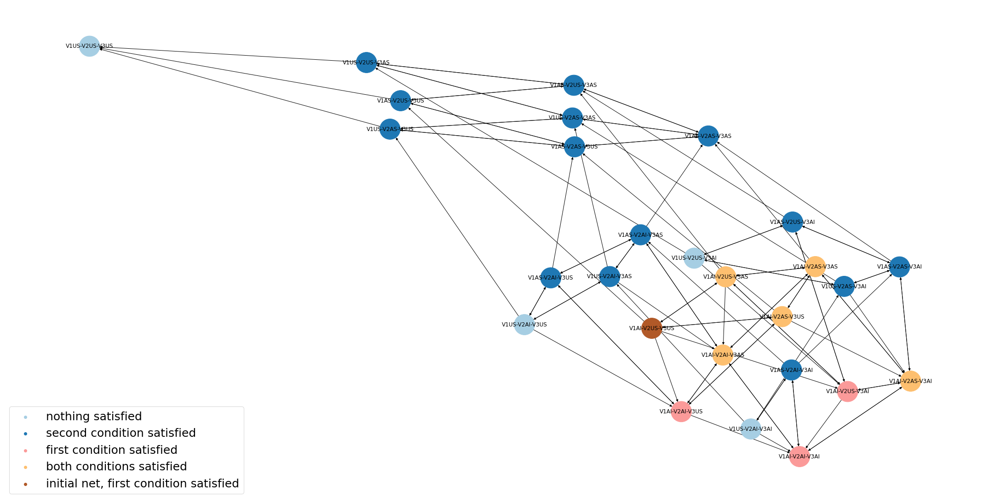

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_surround, cmap=plt.get_cmap('Paired'), pos = positions,
                node_size=2000))


for v in np.unique(color_surround):
    plt.scatter([],[], color=mapped_surround[list(np.unique(color_surround)).index(v)], label = legend_surround[v])


plt.legend(fontsize=25)

In [ ]:
def simulation_surround_path(three_node_sim, events_chain, language,mln_data, stopper_value,stopper_type):
  if 1 in events_chain.property_surround.values:
    event_surround = events_chain[events_chain.property_everywhere.isin([1])]
    event_surround_index = events_chain[events_chain.property_surround.isin([1])].index[0] #retrieve index of the first row where reachability property is satisfied
  elif 't' == stopper_type:
    event_surround = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:]
    event_surround_index = three_node_sim[three_node_sim['[T]'] < int(stopper_value)].iloc[-1,:].index[-1]
  elif 'e' == stopper_type:
    event_surround = events_chain.iloc[int(stopper_value.strip())+1:,:]
    event_surround_index = events_chain.index[int(stopper_value.strip())+1]
  zoom_net = events_chain.iloc[:event_surround_index+1,4:4+mln_data['actors'][1]*len(language['states'])]
  simulation_path_surround = []
  for net in zoom_net.values:
    simulation_net = ''
    for elem in range(len(net)):
      if net[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}-"
    simulation_path_surround.append(simulation_net[:-1])
  simulation_links = []
  for el in range(len(simulation_path_surround)-1):
    simulation_links.append((simulation_path_surround[el],simulation_path_surround[el+1]))
  return simulation_links

In [ ]:
simulated_path_surround = simulation_surround_path(three_node_sim, three_nodes_event_chain, language,mln_data, stopper_value,stopper_type)
coloured_simulated_paths_surround = color_simulated_path(simulated_path_surround, graph)

In [ ]:
simulated_path_surround

[('V1AI-V2US-V3US', 'V1AI-V2AI-V3US'),
 ('V1AI-V2AI-V3US', 'V1AI-V2AI-V3AS'),
 ('V1AI-V2AI-V3AS', 'V1AI-V2AI-V3US'),
 ('V1AI-V2AI-V3US', 'V1AI-V2AI-V3AI'),
 ('V1AI-V2AI-V3AI', 'V1AI-V2AI-V3AS')]

None

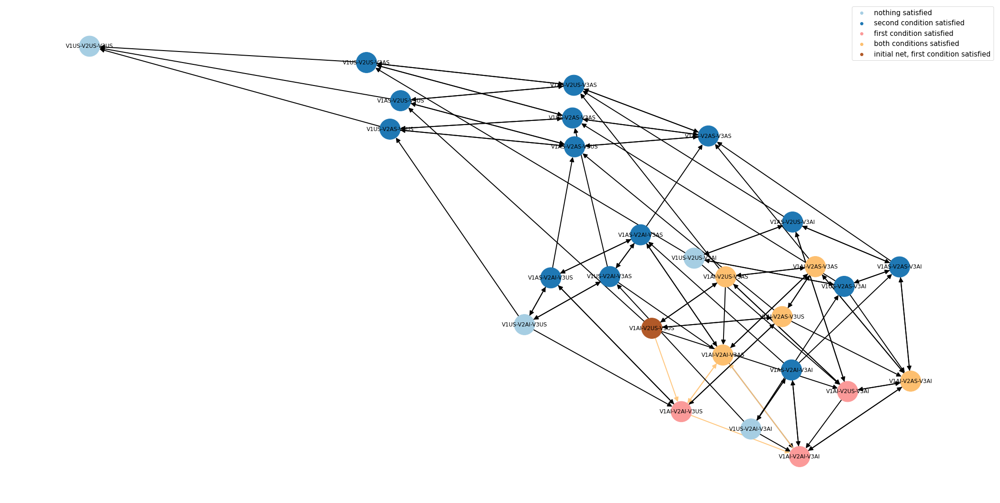

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph, with_labels=True, node_color=color_surround, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths_surround, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions,
                node_size=2000))


for v in np.unique(color_surround):
    plt.scatter([],[], color=mapped_surround[list(np.unique(color_surround)).index(v)], label = legend_surround[v])


plt.legend(fontsize=15)

## SIMULATION-BASED SURROUND

In [ ]:
first_network_condition_surround_sim = network_nodes_id_surround(first_cond_for_graph_surround, nodes_sim, first_condition_specification_surround)
second_network_condition_surround_sim = network_nodes_id_surround(second_cond_for_graph_surround, nodes_sim, second_condition_specification_surround,second_cond)

In [ ]:
color_surround_sim,legend_surround_sim = color_surround_cond(first_network_condition, second_network_condition_surround, initial_net, nodes_sim)

In [ ]:
mapper_sim_surround = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped_sim_surround = mapper_sim_surround.to_rgba(np.unique(color_surround_sim))

In [ ]:
coloured_simulated_paths_surround = color_simulated_path(simulated_path_surround, graph_sim)

None

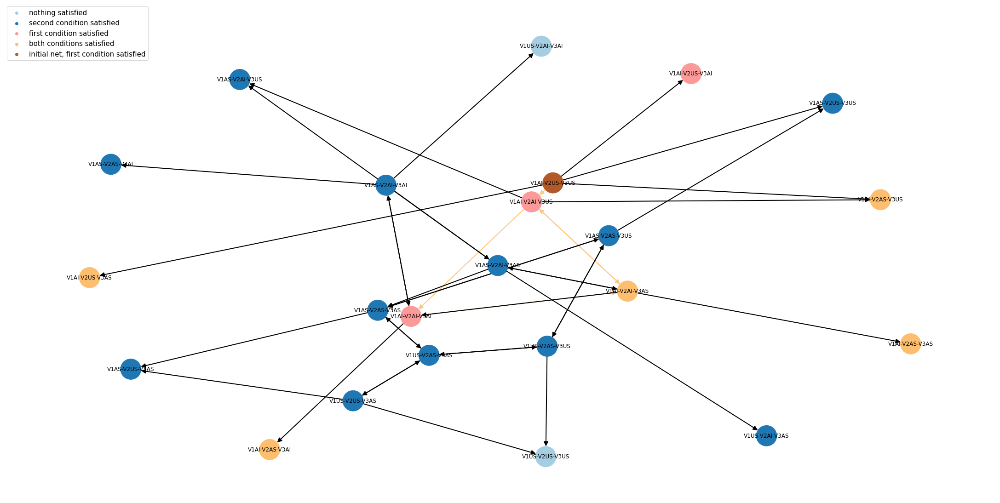

In [ ]:
plt.figure(figsize=(30, 15))


display(nx.draw(graph_sim, with_labels=True, node_color=color_surround_sim, cmap=plt.get_cmap('Paired'), edge_color = coloured_simulated_paths_surround, arrowsize = 20, width =2, edge_cmap=plt.get_cmap("copper"), pos = positions_sim,
                node_size=2000))


for v in np.unique(color_surround_sim):
    plt.scatter([],[], color=mapped_sim_surround[list(np.unique(color_surround_sim)).index(v)], label = legend_surround_sim[v])


plt.legend(fontsize=15,loc='upper left')

## VALIDATION SURROUND

In [ ]:
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

surround property confidence interval is: (0.4193276443544863, 0.45547235564551375)


In [ ]:
def check_surround(shortest_paths, first_network_condition_surround, second_network_condition_surround):
  valid_paths = []
  for path in shortest_paths:
    path_con = []
    satisfied_first_condition = True
    arrived = False
    for net in path:
      if satisfied_first_condition and not arrived:
        if net in first_network_condition_surround and net not in second_network_condition_surround:
          path_con.append(net)
          continue
        elif net not in first_network_condition_surround and net not in second_network_condition_surround:
          satisfied_first_condition = False
        elif net not in first_network_condition_surround and net in second_network_condition_surround:
          path_con.append(net)
          double = False
          for path2 in valid_paths:
            for net2 in range(len(path2)):
              if path_con == path2[:net2]:
                double = True
          if not double:
            if path_con not in valid_paths:
              valid_paths.append(path_con)
          arrived = True
        elif net  in first_network_condition_surround and net in second_network_condition_surround:
          path_con.append(net) 
  return valid_paths

In [ ]:
def check_shorter_surround(shortest_paths, first_network_condition_surround, second_network_condition_surround,events):
  valid_paths = []
  for path in shortest_paths:
    if len(path) <= events:
      path_con = []
      satisfied_first_condition = True
      arrived = False
      for net in path:
        if satisfied_first_condition and not arrived:
          if net in first_network_condition_surround and net not in second_network_condition_surround:
            path_con.append(net)
            continue
          elif net not in first_network_condition_surround and net not in second_network_condition_surround:
            satisfied_first_condition = False
          elif net not in first_network_condition_surround and net in second_network_condition_surround:
            path_con.append(net)
            double = False
            for path2 in valid_paths:
              for net2 in range(len(path2)):
                if path_con == path2[:net2]:
                  double = True
            if not double:
              if path_con not in valid_paths:
                valid_paths.append(path_con)
            arrived = True
          elif net  in first_network_condition_surround and net in second_network_condition_surround:
            path_con.append(net) 
  return valid_paths

In [ ]:
paths_surround, shorter_paths_surround = recursion_paths(initial_net,grouping_prob)

In [ ]:
replicated_valid_paths_surround = check_surround(paths_surround[3], first_network_condition_surround, second_network_condition_surround)
replicated_valid_shorter_surround = check_shorter_surround(shorter_paths_surround, first_network_condition_surround, second_network_condition_surround,4)

In [ ]:
replicated_valid_shorter_surround 

[['V1AI-V2US-V3US', 'V1AS-V2US-V3US']]

In [ ]:
surround_probability = 0
edged_paths = map(nx.utils.pairwise, replicated_valid_paths_surround)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  surround_probability += prob_path
print(f"analysis of the network gives probability of satisfying surround property = {surround_probability}")


analysis of the network gives probability of satisfying surround property = 0.42788800705467367


# VALIDATION RESULTS

reachability e < 3, escape e < 4, somewhere  e < 3, everywhere e < 3, surround e < 4

In [ ]:
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")
print(reach_probability,escape_probability,somewhere_probability,surround_probability)

reachability property confidence interval is: (0.5078089589405783, 0.5441910410594217)
escape property confidence interval is: (0.3791750048377701, 0.4148249951622299)
somewhere property confidence interval is: (0.7040495034318914, 0.7367504965681086)
surround property confidence interval is: (0.4193276443544863, 0.45547235564551375)
0.5317460317460317 0.3898478835978834 0.7142857142857142 0.42788800705467367


In [ ]:
conf_intervals_reach = []
conf_intervals_escape = []
conf_intervals_somewhere = []
conf_intervals_surround = []
conf_intervals_reach.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_escape.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_somewhere.append(stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres)))
conf_intervals_surround.append(stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds)))

In [ ]:
path_probs_reach = []
path_probs_escape = []
path_probs_somewhere = []
path_probs_surround = []
path_probs_reach.append(reach_probability)
path_probs_escape.append(escape_probability)
path_probs_somewhere.append(somewhere_probability)
path_probs_surround.append(surround_probability)

In [ ]:
storing_values_reach = []
storing_values_escape = []
storing_values_somewhere = []
storing_values_surround = []
storing_values_reach.append(reachabilities)
storing_values_escape.append(escapes)
storing_values_somewhere.append(somewheres)
storing_values_surround.append(surrounds)

In [ ]:
df1 = pd.DataFrame(data={'values':reachabilities, 'properties':'reach'})
df2 = pd.DataFrame(data={'values':escapes, 'properties':'escape'})
df3 = pd.DataFrame(data={'values':somewheres, 'properties':'somewhere'})
df5 = pd.DataFrame(data={'values':surrounds, 'properties':'surround'})
sns_dataset = pd.concat([df1, df2,df3,df5], axis=0)
sns_dataset.index = range(len(sns_dataset))
sns_dataset

,values,properties
0,0.0,reach
1,1.0,reach
2,1.0,reach
3,1.0,reach
4,0.0,reach
...,...,...
19995,0.0,surround
19996,0.0,surround
19997,0.0,surround
19998,1.0,surround


(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

<Figure size 3600x1440 with 0 Axes>

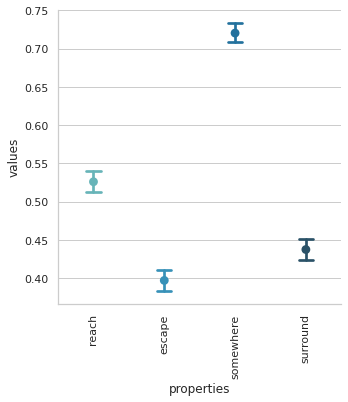

In [ ]:
sns.set_theme(style="whitegrid")

plt.figure(figsize=(50,20))

sns.catplot(
    data=sns_dataset, x="properties", y="values",
    capsize=.2, palette="YlGnBu_d", errorbar="ci",
    kind="point"
)

plt.xticks(rotation = 90)

## CONSIDERING LESS THAN 5 EVENTS

Examine results with: reachability e < 5, escape e < 5, somewhere  e < 5, everywhere e < 5

In [ ]:
ParserThesis.parse_to_kappy_observed_event('/content/network.txt','/content/1-node-language5.txt','/3-nodes-epidemiology-5-events.txt')

Parsing network configuration file /content/network.txt
Parsing MLN language file /content/1-node-language5.txt
Successfully exported model into Kappa: /3-nodes-epidemiology-5-events.txt


In [ ]:
with open('/3-nodes-epidemiology-5-events.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l1v3, l1v2, l2v2, l2v3)\
%agent: V2(state{AS, AI, US}, l1v1, l2v1, l2v3)\
%agent: V3(state{AS, AI, US}, l1v1, l2v1, l2v2)\
'rule0_1'V1(state{AS}) -> V1(state{US}) @ delta\
'rule0_2'V2(state{AS}) -> V2(state{US}) @ delta\
'rule0_3'V3(state{AS}) -> V3(state{US}) @ delta\
'rule1_1'V1(state{AI}) -> V1(state{AS}) @ mu\
'rule1_2'V2(state{AI}) -> V2(state{AS}) @ mu\
'rule1_3'V3(state{AI}) -> V3(state{AS}) @ mu\
'rule2_0'V1(state{AS}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(state{AI}, l1v3[113]), V3(state{AI}, l1v1[113]) @ betaA\
'rule2_1'V3(state{AS}, l1v1[131]), V1(state{AI}, l1v3[131]) -> V3(state{AI}, l1v1[131]), V1(state{AI}, l1v3[131]) @ betaA\
'rule2_2'V1(state{AS}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(state{AI}, l1v2[112]), V2(state{AI}, l1v1[112]) @ betaA\
'rule2_3'V2(state{AS}, l1v1[121]), V1(state{AI}, l1v2[121]) -> V2(state{AI}, l1v1[121]), V1(state{AI}, l1v2[121]) @ betaA\
'rule3_0'V1(state{US}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(stat

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []

seeds = 100
while len(simulations_data) < numb_of_traces:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[{stopper_type_kappy[stop_type]}]>{stop_value}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  three_node_sim = three_node_sim.iloc[1:,:]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  seeds += 1


# first row repeated twice


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],AI,AS,US,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.0,1.0000,0.0000,2.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
1,1.0,1.5502,0.3288,1.1210,0.3346,0.8790,0.3346,0.6654,0.3346,0.3288,0.3288,0.1210,0.8790,0.3288
2,2.0,1.7002,0.7966,0.5032,0.5276,0.7508,0.4806,0.4724,0.4806,0.7198,0.7966,0.2492,0.7508,0.7966
3,3.0,1.4236,1.0944,0.4820,0.6040,0.5804,0.4242,0.3960,0.4242,1.0000,1.0944,0.4400,0.5804,1.0944
4,4.0,1.3240,1.1124,0.5636,0.6484,0.5192,0.4076,0.3476,0.4076,1.0000,1.1124,0.5698,0.5192,1.1124
5,5.0,1.2010,1.1760,0.6230,0.6484,0.4660,0.3682,0.3476,0.3682,1.0000,1.1760,0.5698,0.4660,1.1760
6,6.0,1.1008,1.1900,0.7092,0.6484,0.4296,0.3382,0.3476,0.3382,1.0000,1.1900,0.5698,0.4296,1.1900
7,7.0,1.0180,1.1984,0.7836,0.6484,0.3868,0.3230,0.3476,0.3230,1.0000,1.1984,0.5698,0.3868,1.1984
8,8.0,0.9246,1.1960,0.8794,0.6484,0.3538,0.2924,0.3476,0.2924,1.0000,1.1960,0.5698,0.3538,1.1960
9,9.0,0.8546,1.1798,0.9656,0.6484,0.3298,0.2688,0.3476,0.2688,1.0000,1.1798,0.5698,0.3298,1.1798


In [ ]:
reachabilities = []
escapes = []
somewheres = []
surrounds = []
for sim in equalize_len_data:
  reachabilities.append(sim['property_reachability'][len(sim)-1])
  escapes.append(sim['property_escape'][len(sim)-1])
  somewheres.append(sim['property_somewhere'][len(sim)-1])
  surrounds.append(sim['property_surround'][len(sim)-1])
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
if average_result.property_escape.values[-1] == 1.0:
  print(f'everywhere property satisfied: the property is satisfied for every route')
else:
  print(f'everywhere property not satisfied: it exists al least one route where the property does not hold')
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

reachability property confidence interval is: (0.6310051195828759, 0.6657948804171241)
escape property confidence interval is: (0.33025108292083344, 0.3649489170791666)
somewhere property confidence interval is: (nan, nan)
everywhere property not satisfied: it exists al least one route where the property does not hold
surround property confidence interval is: (0.5517626830519505, 0.5878373169480494)


/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


In [ ]:
replicated_valid_paths = check_reachability(paths_reach[4], first_network_condition, second_network_condition)
reach_probability = 0
edged_paths = map(nx.utils.pairwise, replicated_valid_paths)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  reach_probability += prob_path
print(f"analysis of the network gives probability of satisfying reachability property = {reach_probability}")

analysis of the network gives probability of satisfying reachability property = 0.6541627299067774


In [ ]:
valid_paths_escape = check_escape(paths[4],network_condition_escape)
shorter_valid_paths_escape = check_escape(shorter_paths, network_condition_escape)

escape_probability = 0

edged_paths = map(nx.utils.pairwise, valid_paths_escape)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  escape_probability += prob_path
print(f"escape without shorter property probability is = {escape_probability}")
for el in shorter_valid_paths_escape:
  if len(el) <= 4:
    prob_path = 1
    edged_shorter = nx.utils.pairwise(el)
    for link in edged_shorter:
      for item in graph.edges.data('weight'):
        if link[0] == item[0] and link[1] == item[1]:
          prob_path *= item[2]
    escape_probability += prob_path
print(f"escape adding shorter property probability is = {escape_probability}")

escape without shorter property probability is = 0.30471860040312365
escape adding shorter property probability is = 0.3417556374401607


In [ ]:
valid_paths_somewhere = check_somewhere(paths_somewhere[4], network_condition_somewhere,4)

somewhere_probability = 0
edged_paths = map(nx.utils.pairwise, valid_paths_somewhere)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  somewhere_probability += prob_path
print(f"somewhere property probability before shorter paths is = {somewhere_probability}")


somewhere property probability before shorter paths is = 1.0


In [ ]:
replicated_valid_paths_surround = check_surround(paths_surround[4], first_network_condition_surround, second_network_condition_surround)

surround_probability = 0
edged_paths = map(nx.utils.pairwise, replicated_valid_paths_surround)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  surround_probability += prob_path
print(f"analysis of the network gives probability of satisfying surround property= {surround_probability}")

analysis of the network gives probability of satisfying surround property= 0.5567066641471402


In [ ]:
conf_intervals_reach.append(stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities)))
conf_intervals_escape.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_somewhere.append(stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres)))
conf_intervals_surround.append(stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds)))
path_probs_reach.append(reach_probability)
path_probs_escape.append(escape_probability)
path_probs_somewhere.append(somewhere_probability)
path_probs_surround.append(surround_probability)
storing_values_reach.append(reachabilities)
storing_values_escape.append(escapes)
storing_values_somewhere.append(somewheres)
storing_values_surround.append(surrounds)

In [ ]:
language5 = ParserThesis.parse_language_file('/content/1-node-language5.txt')

Parsing MLN language file /content/1-node-language5.txt


## CONSIDERING LESS THAN 7 EVENTS

Examine results with: reachability e < 7, escape e < 7, somewhere  e < 7, everywhere e < 7

In [ ]:
ParserThesis.parse_to_kappy_observed_event('/content/network.txt','/content/1-node-language7.txt','/3-nodes-epidemiology-7-events.txt')

Parsing network configuration file /content/network.txt
Parsing MLN language file /content/1-node-language7.txt
Successfully exported model into Kappa: /3-nodes-epidemiology-7-events.txt


In [ ]:
with open('/3-nodes-epidemiology-7-events.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l1v3, l1v2, l2v2, l2v3)\
%agent: V2(state{AS, AI, US}, l1v1, l2v1, l2v3)\
%agent: V3(state{AS, AI, US}, l1v1, l2v1, l2v2)\
'rule0_1'V1(state{AS}) -> V1(state{US}) @ delta\
'rule0_2'V2(state{AS}) -> V2(state{US}) @ delta\
'rule0_3'V3(state{AS}) -> V3(state{US}) @ delta\
'rule1_1'V1(state{AI}) -> V1(state{AS}) @ mu\
'rule1_2'V2(state{AI}) -> V2(state{AS}) @ mu\
'rule1_3'V3(state{AI}) -> V3(state{AS}) @ mu\
'rule2_0'V1(state{AS}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(state{AI}, l1v3[113]), V3(state{AI}, l1v1[113]) @ betaA\
'rule2_1'V3(state{AS}, l1v1[131]), V1(state{AI}, l1v3[131]) -> V3(state{AI}, l1v1[131]), V1(state{AI}, l1v3[131]) @ betaA\
'rule2_2'V1(state{AS}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(state{AI}, l1v2[112]), V2(state{AI}, l1v1[112]) @ betaA\
'rule2_3'V2(state{AS}, l1v1[121]), V1(state{AI}, l1v2[121]) -> V2(state{AI}, l1v1[121]), V1(state{AI}, l1v2[121]) @ betaA\
'rule3_0'V1(state{US}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(stat

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []

seeds = 100
while len(simulations_data) < numb_of_traces:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[{stopper_type_kappy[stop_type]}]>{stop_value}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  three_node_sim = three_node_sim.iloc[1:,:]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  seeds += 1


# first row repeated twice


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],AI,AS,US,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.0,1.0000,0.0000,2.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
1,1.0,1.5502,0.3288,1.1210,0.3346,0.8790,0.3346,0.6654,0.3346,0.3288,0.3288,0.1210,0.8790,0.3288
2,2.0,1.7002,0.7966,0.5032,0.5276,0.7508,0.4806,0.4724,0.4806,0.7198,0.7966,0.2492,0.7508,0.7966
3,3.0,1.4236,1.0944,0.4820,0.6040,0.5804,0.4242,0.3960,0.4242,1.0000,1.0944,0.4400,0.5804,1.0944
4,4.0,1.3240,1.1124,0.5636,0.6484,0.5192,0.4076,0.3476,0.4076,1.0000,1.1124,0.5698,0.5192,1.1124
5,5.0,1.2010,1.1760,0.6230,0.6704,0.4660,0.3682,0.3196,0.3682,1.0000,1.1760,0.6654,0.4660,1.1760
6,6.0,1.1008,1.1900,0.7092,0.6794,0.4296,0.3382,0.3042,0.3382,1.0000,1.1900,0.7412,0.4296,1.1900
7,7.0,1.0180,1.1984,0.7836,0.6794,0.3868,0.3230,0.3042,0.3230,1.0000,1.1984,0.7412,0.3868,1.1984
8,8.0,0.9246,1.1960,0.8794,0.6794,0.3538,0.2924,0.3042,0.2924,1.0000,1.1960,0.7412,0.3538,1.1960
9,9.0,0.8546,1.1798,0.9656,0.6794,0.3298,0.2688,0.3042,0.2688,1.0000,1.1798,0.7412,0.3298,1.1798


In [ ]:
reachabilities = []
escapes = []
somewheres = []
surrounds = []
for sim in equalize_len_data:
  reachabilities.append(sim['property_reachability'][len(sim)-1])
  escapes.append(sim['property_escape'][len(sim)-1])
  somewheres.append(sim['property_somewhere'][len(sim)-1])
  surrounds.append(sim['property_surround'][len(sim)-1])
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
if average_result.property_escape.values[-1] == 1.0:
  print(f'everywhere property satisfied: the property is satisfied for every route')
else:
  print(f'everywhere property not satisfied: it exists al least one route where the property does not hold')
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

reachability property confidence interval is: (0.662397215850608, 0.696402784149392)
escape property confidence interval is: (0.2874391002587077, 0.3209608997412923)
somewhere property confidence interval is: (nan, nan)
everywhere property not satisfied: it exists al least one route where the property does not hold
surround property confidence interval is: (0.7252439513235102, 0.7571560486764898)


/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


In [ ]:
replicated_valid_paths = check_reachability(paths_reach[6], first_network_condition, second_network_condition)
reach_probability = 0
edged_paths = map(nx.utils.pairwise, replicated_valid_paths)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  reach_probability += prob_path
print(f"analysis of the network gives probability of satisfying reachability property = {reach_probability}")

analysis of the network gives probability of satisfying reachability property = 0.6880268779781904


In [ ]:
valid_paths_escape = check_escape(paths[6],network_condition_escape)
shorter_valid_paths_escape = check_escape(shorter_paths, network_condition_escape)

escape_probability = 0

edged_paths = map(nx.utils.pairwise, valid_paths_escape)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  escape_probability += prob_path
print(f"escape without shorter property probability is = {escape_probability}")
for el in shorter_valid_paths_escape:
  if len(el) <= 6:
    prob_path = 1
    edged_shorter = nx.utils.pairwise(el)
    for link in edged_shorter:
      for item in graph.edges.data('weight'):
        if link[0] == item[0] and link[1] == item[1]:
          prob_path *= item[2]
    escape_probability += prob_path
print(f"escape adding shorter property probability is = {escape_probability}")

escape without shorter property probability is = 0.23546058325409744
escape adding shorter property probability is = 0.2938306596797293


In [ ]:
valid_paths_somewhere = check_somewhere(paths_somewhere[6], network_condition_somewhere,4)

somewhere_probability = 0
edged_paths = map(nx.utils.pairwise, valid_paths_somewhere)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  somewhere_probability += prob_path
print(f"somewhere property probability before shorter paths is = {somewhere_probability}")


somewhere property probability before shorter paths is = 1.0


In [ ]:
replicated_valid_paths_surround = check_surround(paths_surround[6], first_network_condition_surround, second_network_condition_surround)

surround_probability = 0
edged_paths = map(nx.utils.pairwise, replicated_valid_paths_surround)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  surround_probability += prob_path
print(f"analysis of the network gives probability of satisfying surround property= {surround_probability}")

analysis of the network gives probability of satisfying surround property= 0.7356403049351746


In [ ]:
conf_intervals_reach.append(stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities)))
conf_intervals_escape.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_somewhere.append(stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres)))
conf_intervals_surround.append(stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds)))
path_probs_reach.append(reach_probability)
path_probs_escape.append(escape_probability)
path_probs_somewhere.append(somewhere_probability)
path_probs_surround.append(surround_probability)
storing_values_reach.append(reachabilities)
storing_values_escape.append(escapes)
storing_values_somewhere.append(somewheres)
storing_values_surround.append(surrounds)

In [ ]:
language7 = ParserThesis.parse_language_file('/content/1-node-language7.txt')

Parsing MLN language file /content/1-node-language7.txt


## CONSIDERING LESS THAN 9 EVENTS

Examine results with: reachability e < 9, escape e < 9, somewhere  e < 9, everywhere e < 9.

In [ ]:
ParserThesis.parse_to_kappy_observed_event('/content/network.txt','/content/1-node-language9.txt','/3-nodes-epidemiology-9-events.txt')

Parsing network configuration file /content/network.txt
Parsing MLN language file /content/1-node-language9.txt
Successfully exported model into Kappa: /3-nodes-epidemiology-9-events.txt


In [ ]:
with open('/3-nodes-epidemiology-9-events.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l1v3, l1v2, l2v2, l2v3)\
%agent: V2(state{AS, AI, US}, l1v1, l2v1, l2v3)\
%agent: V3(state{AS, AI, US}, l1v1, l2v1, l2v2)\
'rule0_1'V1(state{AS}) -> V1(state{US}) @ delta\
'rule0_2'V2(state{AS}) -> V2(state{US}) @ delta\
'rule0_3'V3(state{AS}) -> V3(state{US}) @ delta\
'rule1_1'V1(state{AI}) -> V1(state{AS}) @ mu\
'rule1_2'V2(state{AI}) -> V2(state{AS}) @ mu\
'rule1_3'V3(state{AI}) -> V3(state{AS}) @ mu\
'rule2_0'V1(state{AS}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(state{AI}, l1v3[113]), V3(state{AI}, l1v1[113]) @ betaA\
'rule2_1'V3(state{AS}, l1v1[131]), V1(state{AI}, l1v3[131]) -> V3(state{AI}, l1v1[131]), V1(state{AI}, l1v3[131]) @ betaA\
'rule2_2'V1(state{AS}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(state{AI}, l1v2[112]), V2(state{AI}, l1v1[112]) @ betaA\
'rule2_3'V2(state{AS}, l1v1[121]), V1(state{AI}, l1v2[121]) -> V2(state{AI}, l1v1[121]), V1(state{AI}, l1v2[121]) @ betaA\
'rule3_0'V1(state{US}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(stat

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []

seeds = 100
while len(simulations_data) < numb_of_traces:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[{stopper_type_kappy[stop_type]}]>{stop_value}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  three_node_sim = three_node_sim.iloc[1:,:]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  seeds += 1


# first row repeated twice


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],AI,AS,US,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.0,1.0000,0.0000,2.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
1,1.0,1.5502,0.3288,1.1210,0.3346,0.8790,0.3346,0.6654,0.3346,0.3288,0.3288,0.1210,0.8790,0.3288
2,2.0,1.7002,0.7966,0.5032,0.5276,0.7508,0.4806,0.4724,0.4806,0.7198,0.7966,0.2492,0.7508,0.7966
3,3.0,1.4236,1.0944,0.4820,0.6040,0.5804,0.4242,0.3960,0.4242,1.0000,1.0944,0.4400,0.5804,1.0944
4,4.0,1.3240,1.1124,0.5636,0.6484,0.5192,0.4076,0.3476,0.4076,1.0000,1.1124,0.5698,0.5192,1.1124
5,5.0,1.2010,1.1760,0.6230,0.6704,0.4660,0.3682,0.3196,0.3682,1.0000,1.1760,0.6654,0.4660,1.1760
6,6.0,1.1008,1.1900,0.7092,0.6794,0.4296,0.3382,0.3042,0.3382,1.0000,1.1900,0.7412,0.4296,1.1900
7,7.0,1.0180,1.1984,0.7836,0.6846,0.3868,0.3230,0.2894,0.3230,1.0000,1.1984,0.8034,0.3868,1.1984
8,8.0,0.9246,1.1960,0.8794,0.6876,0.3538,0.2924,0.2840,0.2924,1.0000,1.1960,0.8498,0.3538,1.1960
9,9.0,0.8546,1.1798,0.9656,0.6876,0.3298,0.2688,0.2840,0.2688,1.0000,1.1798,0.8498,0.3298,1.1798


In [ ]:
reachabilities = []
escapes = []
somewheres = []
surrounds = []
for sim in equalize_len_data:
  reachabilities.append(sim['property_reachability'][len(sim)-1])
  escapes.append(sim['property_escape'][len(sim)-1])
  somewheres.append(sim['property_somewhere'][len(sim)-1])
  surrounds.append(sim['property_surround'][len(sim)-1])
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
if average_result.property_escape.values[-1] == 1.0:
  print(f'everywhere property satisfied: the property is satisfied for every route')
else:
  print(f'everywhere property not satisfied: it exists al least one route where the property does not hold')
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

reachability property confidence interval is: (0.6707150819243174, 0.7044849180756826)
escape property confidence interval is: (0.26757175419164664, 0.3004282458083533)
somewhere property confidence interval is: (nan, nan)
everywhere property not satisfied: it exists al least one route where the property does not hold
surround property confidence interval is: (0.836784260710757, 0.862815739289243)


/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


In [ ]:
replicated_valid_paths = check_reachability(paths_reach[8], first_network_condition, second_network_condition)
reach_probability = 0
edged_paths = map(nx.utils.pairwise, replicated_valid_paths)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  reach_probability += prob_path
print(f"analysis of the network gives probability of satisfying reachability property = {reach_probability}")

analysis of the network gives probability of satisfying reachability property = 0.6979318059240279


In [ ]:
valid_paths_escape = check_escape(paths[8],network_condition_escape)
shorter_valid_paths_escape = check_escape(shorter_paths, network_condition_escape)

escape_probability = 0

edged_paths = map(nx.utils.pairwise, valid_paths_escape)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  escape_probability += prob_path
print(f"escape without shorter property probability is = {escape_probability}")
for el in shorter_valid_paths_escape:
  if len(el) <= 8:
    prob_path = 1
    edged_shorter = nx.utils.pairwise(el)
    for link in edged_shorter:
      for item in graph.edges.data('weight'):
        if link[0] == item[0] and link[1] == item[1]:
          prob_path *= item[2]
    escape_probability += prob_path
print(f"escape adding shorter property probability is = {escape_probability}")

escape without shorter property probability is = 0.18778384747545956
escape adding shorter property probability is = 0.2717413402376539


In [ ]:
valid_paths_somewhere = check_somewhere(paths_somewhere[8], network_condition_somewhere,4)

somewhere_probability = 0
edged_paths = map(nx.utils.pairwise, valid_paths_somewhere)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  somewhere_probability += prob_path
print(f"somewhere property probability before shorter paths is = {somewhere_probability}")


somewhere property probability before shorter paths is = 1.0


In [ ]:
replicated_valid_paths_surround = check_surround(paths_surround[8], first_network_condition_surround, second_network_condition_surround)

surround_probability = 0
edged_paths = map(nx.utils.pairwise, replicated_valid_paths_surround)
for path in edged_paths:
  prob_path = 1
  for link in path:
    for item in graph.edges.data('weight'):
      if link[0] == item[0] and link[1] == item[1]:
        prob_path *= item[2]
  surround_probability += prob_path
print(f"analysis of the network gives probability of satisfying surround property= {surround_probability}")

analysis of the network gives probability of satisfying surround property= 0.841602810694036


In [ ]:
conf_intervals_reach.append(stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities)))
conf_intervals_escape.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_somewhere.append(stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres)))
conf_intervals_surround.append(stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds)))
path_probs_reach.append(reach_probability)
path_probs_escape.append(escape_probability)
path_probs_somewhere.append(somewhere_probability)
path_probs_surround.append(surround_probability)
storing_values_reach.append(reachabilities)
storing_values_escape.append(escapes)
storing_values_somewhere.append(somewheres)
storing_values_surround.append(surrounds)

In [ ]:
language9 = ParserThesis.parse_language_file('/content/1-node-language9.txt')

Parsing MLN language file /content/1-node-language9.txt


# CREATING DTMC MODEL FOR PRISM: robustness of the implemented operators

In [ ]:
states = dict(zip(network_configurations,range(1,len(network_configurations)+1)))
states

{'V1AS-V2AS-V3AS': 1,
 'V1AS-V2AS-V3AI': 2,
 'V1AS-V2AS-V3US': 3,
 'V1AS-V2AI-V3AS': 4,
 'V1AS-V2AI-V3AI': 5,
 'V1AS-V2AI-V3US': 6,
 'V1AS-V2US-V3AS': 7,
 'V1AS-V2US-V3AI': 8,
 'V1AS-V2US-V3US': 9,
 'V1AI-V2AS-V3AS': 10,
 'V1AI-V2AS-V3AI': 11,
 'V1AI-V2AS-V3US': 12,
 'V1AI-V2AI-V3AS': 13,
 'V1AI-V2AI-V3AI': 14,
 'V1AI-V2AI-V3US': 15,
 'V1AI-V2US-V3AS': 16,
 'V1AI-V2US-V3AI': 17,
 'V1AI-V2US-V3US': 18,
 'V1US-V2AS-V3AS': 19,
 'V1US-V2AS-V3AI': 20,
 'V1US-V2AS-V3US': 21,
 'V1US-V2AI-V3AS': 22,
 'V1US-V2AI-V3AI': 23,
 'V1US-V2AI-V3US': 24,
 'V1US-V2US-V3AS': 25,
 'V1US-V2US-V3AI': 26,
 'V1US-V2US-V3US': 27}

In [ ]:
dict_prism = {}
for key,values in grouping_prob.items():
  connects = []
  for net,prob in values:
    connects.append((states[net],prob))
  dict_prism[states[key]] = connects
dict_prism

{1: [(19, 0.3333333333333333),
  (7, 0.3333333333333333),
  (3, 0.3333333333333333)],
 2: [(20, 0.25), (8, 0.25), (1, 0.25), (11, 0.25)],
 3: [(21, 0.25), (9, 0.25), (1, 0.5)],
 4: [(22, 0.25), (6, 0.25), (1, 0.25), (13, 0.25)],
 5: [(23, 0.2), (2, 0.2), (4, 0.2), (14, 0.4)],
 6: [(24, 0.2), (3, 0.2), (15, 0.2), (4, 0.4)],
 7: [(25, 0.25), (9, 0.25), (1, 0.5)],
 8: [(26, 0.2), (7, 0.2), (17, 0.2), (2, 0.4)],
 9: [(27, 0.3333333333333333),
  (3, 0.3333333333333333),
  (7, 0.3333333333333333)],
 10: [(16, 0.2), (12, 0.2), (1, 0.2), (13, 0.2), (11, 0.2)],
 11: [(17, 0.25), (2, 0.25), (10, 0.25), (14, 0.25)],
 12: [(18, 0.125), (3, 0.125), (15, 0.125), (11, 0.375), (10, 0.25)],
 13: [(15, 0.25), (4, 0.25), (10, 0.25), (14, 0.25)],
 16: [(18, 0.125), (7, 0.125), (17, 0.125), (13, 0.375), (10, 0.25)],
 19: [(25, 0.25), (21, 0.25), (1, 0.5)],
 20: [(26, 0.14285714285714285),
  (19, 0.14285714285714285),
  (11, 0.42857142857142855),
  (2, 0.2857142857142857)],
 21: [(27, 0.3333333333333333),
 

In [ ]:
def prism_file_dtmc(dict_prism,network_configurations,states,initial_net):
  with open('thesis_prism_model.txt','w') as f:
    f.writelines('dtmc \n')
    f.writelines('module thesis_3nodes_dtmc \n')
    f.writelines(f'   s:[1..{len(network_configurations)}] init {states[initial_net]}; \n\n')
    for net in grouping_prob:
      rhs = ''
      for edge in grouping_prob[net]:
        rhs += f" {edge[1]}:(s'={states[edge[0]]}) + "
      rhs = f'{rhs.strip()[:-1]}'
      f.writelines(f"   [] s={states[net]} -> {rhs}; \n")
    f.writelines('endmodule')
  

In [ ]:
prism_file_dtmc(dict_prism,network_configurations,states,initial_net)

In [ ]:
def prism_file_properties(sim_number,first_network_condition, second_network_condition, network_condition, network_condition_somewhere, first_network_condition_surround, second_network_condition_surround,states,language,network_configurations):
  with open(f'thesis_prism_properties{sim_number}.txt','w') as f:
    lhs_reach = ''
    rhs_reach = ''
    if len(first_network_condition) > 1:
      lhs = ''
      for net in first_network_condition:
        lhs += f"(s={states[net]})|"
      lhs_reach += f'({lhs[:-1]})'
    if len(second_network_condition) > 1:
      rhs = ''
      for net in second_network_condition:
        rhs += f"(s={states[net]})|"
      rhs_reach += f'({rhs[:-1]})'
    first, second = language['reachability property'][0].split('R')
    stopper,second_cond = second.split('&&')
    stopper = stopper.strip()
    stop_type, stop_value = stopper.split('=')
    f.writelines(f'P=? [{lhs_reach} U<{stop_value} {rhs_reach}] \n')

    empty, second = language['escape property'][0].split('E')
    stopper,second_cond = second.split('&&')
    stopper = stopper.strip()
    stop_type, stop_value = stopper.split('=')  
    escape = ''
    if len(network_condition) > 1:
      for net in network_condition:
        escape += f"(s={states[net]})|"
      escape = f'({escape[:-1]})'
    f.writelines(f'P=? [ G<{stop_value} {escape}]\n')
    
    empty, second = language['somewhere property'][0].split('SOMEWHERE')
    stopper,second_cond = second.split('&&')
    stopper = stopper.strip()
    stop_type, stop_value = stopper.split('=')  
    somewhere = ''
    if len(network_condition_somewhere) > 1:
      for net in network_condition_somewhere:
        somewhere += f"(s={states[net]})|"
      somewhere = f'({somewhere[:-1]})'
    f.writelines(f'P=? [ F<{stop_value} {somewhere}]\n')

    lhs_surround = ''
    rhs_surround = ''
    second_network_condition_surround = list(set(second_network_condition_surround).difference(set(first_network_condition_surround)))
    if len(first_network_condition_surround) > 1:
      lhs = ''
      for net in first_network_condition_surround:
        lhs += f"(s={states[net]})|"
      lhs_surround += f'({lhs[:-1]})'
    if len(second_network_condition_surround) > 1:
      rhs = ''
      for net in second_network_condition_surround:
        rhs += f"(s={states[net]})|"
      rhs_surround += f'({rhs[:-1]})'
    first, second = language['surround property'][0].split('SURROUND')
    stopper,second_cond = second.split('&&')
    stopper = stopper.strip()
    stop_type, stop_value = stopper.split('=')
    f.writelines(f'P=? [{lhs_surround} U<{stop_value} {rhs_surround}] \n')


In [ ]:
prism_file_properties(1,first_network_condition, second_network_condition, network_condition, network_condition_somewhere, first_network_condition_surround, second_network_condition_surround,states,language,network_configurations)
prism_file_properties(2,first_network_condition, second_network_condition, network_condition, network_condition_somewhere,  first_network_condition_surround, second_network_condition_surround,states,language5,network_configurations)
prism_file_properties(3,first_network_condition, second_network_condition, network_condition, network_condition_somewhere,  first_network_condition_surround, second_network_condition_surround,states,language7,network_configurations)
prism_file_properties(4,first_network_condition, second_network_condition, network_condition, network_condition_somewhere, first_network_condition_surround, second_network_condition_surround,states,language9,network_configurations)

# CTMC MODELS

## 3/4 EVENTS

In [ ]:
ParserThesis.parse_to_kappy_observed_event('/content/network.txt','/content/time-1-node-language.txt','/3-nodes-epidemiology-3-events.txt')

Parsing network configuration file /content/network.txt
Parsing MLN language file /content/time-1-node-language.txt
Successfully exported model into Kappa: /3-nodes-epidemiology-3-events.txt


In [ ]:
with open('/3-nodes-epidemiology-3-events.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l1v2, l1v3, l2v3, l2v2)\
%agent: V2(state{AS, AI, US}, l1v1, l2v3, l2v1)\
%agent: V3(state{AS, AI, US}, l1v1, l2v1, l2v2)\
'rule0_1'V1(state{AS}) -> V1(state{US}) @ delta\
'rule0_2'V2(state{AS}) -> V2(state{US}) @ delta\
'rule0_3'V3(state{AS}) -> V3(state{US}) @ delta\
'rule1_1'V1(state{AI}) -> V1(state{AS}) @ mu\
'rule1_2'V2(state{AI}) -> V2(state{AS}) @ mu\
'rule1_3'V3(state{AI}) -> V3(state{AS}) @ mu\
'rule2_0'V1(state{AS}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(state{AI}, l1v2[112]), V2(state{AI}, l1v1[112]) @ betaA\
'rule2_1'V2(state{AS}, l1v1[121]), V1(state{AI}, l1v2[121]) -> V2(state{AI}, l1v1[121]), V1(state{AI}, l1v2[121]) @ betaA\
'rule2_2'V1(state{AS}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(state{AI}, l1v3[113]), V3(state{AI}, l1v1[113]) @ betaA\
'rule2_3'V3(state{AS}, l1v1[131]), V1(state{AI}, l1v3[131]) -> V3(state{AI}, l1v1[131]), V1(state{AI}, l1v3[131]) @ betaA\
'rule3_0'V1(state{US}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(stat

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []

seeds = 100
while len(simulations_data) < numb_of_traces:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[{stopper_type_kappy[stop_type]}]>{stop_value}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  three_node_sim = three_node_sim.iloc[1:,:]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  seeds += 1

In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],AI,AS,US,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.0,1.0000,0.0000,2.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
1,1.0,1.5502,0.3288,1.1210,0.3366,0.8790,0.3366,0.6634,0.3366,0.3288,0.3288,0.1210,0.8790,0.3288
2,2.0,1.7002,0.7966,0.5032,0.5236,0.7508,0.4688,0.4764,0.4688,0.7198,0.7966,0.2492,0.7508,0.7966
3,3.0,1.4236,1.0944,0.4820,0.6042,0.5804,0.4190,0.3958,0.4190,1.0000,1.0944,0.4400,0.5804,1.0944
4,4.0,1.3240,1.1124,0.5636,0.6474,0.5192,0.3972,0.3488,0.3972,1.0000,1.1124,0.5698,0.5192,1.1124
5,5.0,1.2010,1.1760,0.6230,0.6654,0.4660,0.3668,0.3242,0.3668,1.0000,1.1760,0.6654,0.4660,1.1760
6,6.0,1.1008,1.1900,0.7092,0.6784,0.4296,0.3330,0.3034,0.3330,1.0000,1.1900,0.7412,0.4296,1.1900
7,7.0,1.0180,1.1984,0.7836,0.6844,0.3868,0.3082,0.2920,0.3082,1.0000,1.1984,0.8032,0.3868,1.1984
8,8.0,0.9246,1.1948,0.8806,0.6872,0.3538,0.2784,0.2854,0.2784,1.0000,1.1948,0.8494,0.3538,1.1948
9,9.0,0.8546,1.1810,0.9644,0.6886,0.3298,0.2560,0.2810,0.2560,1.0000,1.1810,0.8794,0.3298,1.1810


In [ ]:
reachabilities = []
escapes = []
somewheres = []
surrounds = []
for sim in equalize_len_data:
  reachabilities.append(sim['property_reachability'][len(sim)-1])
  escapes.append(sim['property_escape'][len(sim)-1])
  somewheres.append(sim['property_somewhere'][len(sim)-1])
  surrounds.append(sim['property_surround'][len(sim)-1])
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
if average_result.property_escape.values[-1] == 1.0:
  print(f'everywhere property satisfied: the property is satisfied for every route')
else:
  print(f'everywhere property not satisfied: it exists al least one route where the property does not hold')
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

reachability property confidence interval is: (0.6751808549230564, 0.7088191450769435)
escape property confidence interval is: (0.24911774867031128, 0.2812822513296887)
somewhere property confidence interval is: (nan, nan)
everywhere property not satisfied: it exists al least one route where the property does not hold
surround property confidence interval is: (0.9731038459525505, 0.9836961540474496)


/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


In [ ]:
conf_intervals_reach_ctmc = []
conf_intervals_escape_ctmc = []
conf_intervals_somewhere_ctmc = []
conf_intervals_surround_ctmc = []
conf_intervals_reach_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_escape_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_somewhere_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres)))
conf_intervals_surround_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds)))

In [ ]:
storing_values_reach_ctmc = []
storing_values_escape_ctmc = []
storing_values_somewhere_ctmc = []
storing_values_surround_ctmc = []
storing_values_reach_ctmc.append(reachabilities)
storing_values_escape_ctmc.append(escapes)
storing_values_somewhere_ctmc.append(somewheres)
storing_values_surround_ctmc.append(surrounds)

## 5 EVENTS

In [ ]:
ParserThesis.parse_to_kappy_observed_event('/content/network.txt','/content/time-5-node-language.txt','/3-nodes-epidemiology-5-events.txt')

Parsing network configuration file /content/network.txt
Parsing MLN language file /content/time-5-node-language.txt
Successfully exported model into Kappa: /3-nodes-epidemiology-5-events.txt


In [ ]:
with open('/3-nodes-epidemiology-5-events.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l1v2, l1v3, l2v3, l2v2)\
%agent: V2(state{AS, AI, US}, l1v1, l2v3, l2v1)\
%agent: V3(state{AS, AI, US}, l1v1, l2v2, l2v1)\
'rule0_1'V1(state{AS}) -> V1(state{US}) @ delta\
'rule0_2'V2(state{AS}) -> V2(state{US}) @ delta\
'rule0_3'V3(state{AS}) -> V3(state{US}) @ delta\
'rule1_1'V1(state{AI}) -> V1(state{AS}) @ mu\
'rule1_2'V2(state{AI}) -> V2(state{AS}) @ mu\
'rule1_3'V3(state{AI}) -> V3(state{AS}) @ mu\
'rule2_0'V1(state{AS}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(state{AI}, l1v2[112]), V2(state{AI}, l1v1[112]) @ betaA\
'rule2_1'V2(state{AS}, l1v1[121]), V1(state{AI}, l1v2[121]) -> V2(state{AI}, l1v1[121]), V1(state{AI}, l1v2[121]) @ betaA\
'rule2_2'V1(state{AS}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(state{AI}, l1v3[113]), V3(state{AI}, l1v1[113]) @ betaA\
'rule2_3'V3(state{AS}, l1v1[131]), V1(state{AI}, l1v3[131]) -> V3(state{AI}, l1v1[131]), V1(state{AI}, l1v3[131]) @ betaA\
'rule3_0'V1(state{US}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(stat

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []

seeds = 100
while len(simulations_data) < numb_of_traces:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[{stopper_type_kappy[stop_type]}]>{stop_value}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  three_node_sim = three_node_sim.iloc[1:,:]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  seeds += 1


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],AI,AS,US,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.0,1.0000,0.0000,2.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
1,1.0,1.5502,0.3288,1.1210,0.3366,0.8790,0.3366,0.6634,0.3366,0.3288,0.3288,0.1210,0.8790,0.3288
2,2.0,1.7002,0.7966,0.5032,0.5236,0.7508,0.4688,0.4764,0.4688,0.7198,0.7966,0.2492,0.7508,0.7966
3,3.0,1.4236,1.0944,0.4820,0.6042,0.5804,0.4190,0.3958,0.4190,1.0000,1.0944,0.4400,0.5804,1.0944
4,4.0,1.3240,1.1124,0.5636,0.6474,0.5192,0.3972,0.3488,0.3972,1.0000,1.1124,0.5698,0.5192,1.1124
5,5.0,1.2010,1.1760,0.6230,0.6654,0.4660,0.3668,0.3242,0.3668,1.0000,1.1760,0.6654,0.4660,1.1760
6,6.0,1.1008,1.1900,0.7092,0.6784,0.4296,0.3330,0.3034,0.3330,1.0000,1.1900,0.7412,0.4296,1.1900
7,7.0,1.0180,1.1984,0.7836,0.6844,0.3868,0.3082,0.2920,0.3082,1.0000,1.1984,0.8034,0.3868,1.1984
8,8.0,0.9246,1.1948,0.8806,0.6872,0.3538,0.2784,0.2854,0.2784,1.0000,1.1948,0.8498,0.3538,1.1948
9,9.0,0.8546,1.1828,0.9626,0.6886,0.3298,0.2560,0.2810,0.2560,1.0000,1.1828,0.8800,0.3298,1.1828


In [ ]:
reachabilities = []
escapes = []
somewheres = []
surrounds = []
for sim in equalize_len_data:
  reachabilities.append(sim['property_reachability'][len(sim)-1])
  escapes.append(sim['property_escape'][len(sim)-1])
  somewheres.append(sim['property_somewhere'][len(sim)-1])
  surrounds.append(sim['property_surround'][len(sim)-1])
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
if average_result.property_escape.values[-1] == 1.0:
  print(f'everywhere property satisfied: the property is satisfied for every route')
else:
  print(f'everywhere property not satisfied: it exists al least one route where the property does not hold')
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

reachability property confidence interval is: (0.6751808549230564, 0.7088191450769435)
escape property confidence interval is: (0.248921626328737, 0.28107837367126304)
somewhere property confidence interval is: (nan, nan)
everywhere property not satisfied: it exists al least one route where the property does not hold
surround property confidence interval is: (0.9902060239426226, 0.9961939760573774)


/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


In [ ]:
conf_intervals_reach_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_escape_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_somewhere_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres)))
conf_intervals_surround_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds)))
storing_values_reach_ctmc.append(reachabilities)
storing_values_escape_ctmc.append(escapes)
storing_values_somewhere_ctmc.append(somewheres)
storing_values_surround_ctmc.append(surrounds)

##7 EVENTS

In [ ]:
ParserThesis.parse_to_kappy_observed_event('/content/network.txt','/content/time-7-node-language.txt','/3-nodes-epidemiology-7-events.txt')

Parsing network configuration file /content/network.txt
Parsing MLN language file /content/time-7-node-language.txt
Successfully exported model into Kappa: /3-nodes-epidemiology-7-events.txt


In [ ]:
with open('/3-nodes-epidemiology-7-events.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l1v3, l1v2, l2v3, l2v2)\
%agent: V2(state{AS, AI, US}, l1v1, l2v3, l2v1)\
%agent: V3(state{AS, AI, US}, l1v1, l2v2, l2v1)\
'rule0_1'V1(state{AS}) -> V1(state{US}) @ delta\
'rule0_2'V2(state{AS}) -> V2(state{US}) @ delta\
'rule0_3'V3(state{AS}) -> V3(state{US}) @ delta\
'rule1_1'V1(state{AI}) -> V1(state{AS}) @ mu\
'rule1_2'V2(state{AI}) -> V2(state{AS}) @ mu\
'rule1_3'V3(state{AI}) -> V3(state{AS}) @ mu\
'rule2_0'V1(state{AS}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(state{AI}, l1v3[113]), V3(state{AI}, l1v1[113]) @ betaA\
'rule2_1'V3(state{AS}, l1v1[131]), V1(state{AI}, l1v3[131]) -> V3(state{AI}, l1v1[131]), V1(state{AI}, l1v3[131]) @ betaA\
'rule2_2'V1(state{AS}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(state{AI}, l1v2[112]), V2(state{AI}, l1v1[112]) @ betaA\
'rule2_3'V2(state{AS}, l1v1[121]), V1(state{AI}, l1v2[121]) -> V2(state{AI}, l1v1[121]), V1(state{AI}, l1v2[121]) @ betaA\
'rule3_0'V1(state{US}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(stat

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []

seeds = 100
while len(simulations_data) < numb_of_traces:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[{stopper_type_kappy[stop_type]}]>{stop_value}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  three_node_sim = three_node_sim.iloc[1:,:]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  seeds += 1


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],AI,AS,US,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.0,1.0000,0.0000,2.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
1,1.0,1.5502,0.3288,1.1210,0.3346,0.8790,0.3346,0.6654,0.3346,0.3288,0.3288,0.1210,0.8790,0.3288
2,2.0,1.7064,0.7904,0.5032,0.5300,0.7508,0.4830,0.4700,0.4830,0.7198,0.7904,0.2492,0.7508,0.7904
3,3.0,1.4254,1.0986,0.4760,0.6114,0.5792,0.4304,0.3886,0.4304,1.0000,1.0986,0.4412,0.5792,1.0986
4,4.0,1.3310,1.1060,0.5630,0.6566,0.5202,0.4138,0.3394,0.4138,1.0000,1.1060,0.5700,0.5202,1.1060
5,5.0,1.2090,1.1686,0.6224,0.6756,0.4678,0.3714,0.3144,0.3714,1.0000,1.1686,0.6662,0.4678,1.1686
6,6.0,1.1088,1.1898,0.7014,0.6884,0.4304,0.3418,0.2958,0.3418,1.0000,1.1898,0.7430,0.4304,1.1898
7,7.0,1.0198,1.2080,0.7722,0.6940,0.3876,0.3240,0.2804,0.3240,1.0000,1.2080,0.8038,0.3876,1.2080
8,8.0,0.9288,1.2020,0.8692,0.6974,0.3606,0.2914,0.2738,0.2914,1.0000,1.2020,0.8492,0.3606,1.2020
9,9.0,0.8546,1.1906,0.9548,0.6990,0.3330,0.2676,0.2686,0.2676,1.0000,1.1906,0.8808,0.3330,1.1906


In [ ]:
reachabilities = []
escapes = []
somewheres = []
surrounds = []
for sim in equalize_len_data:
  reachabilities.append(sim['property_reachability'][len(sim)-1])
  escapes.append(sim['property_escape'][len(sim)-1])
  somewheres.append(sim['property_somewhere'][len(sim)-1])
  surrounds.append(sim['property_surround'][len(sim)-1])
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
if average_result.property_escape.values[-1] == 1.0:
  print(f'everywhere property satisfied: the property is satisfied for every route')
else:
  print(f'everywhere property not satisfied: it exists al least one route where the property does not hold')
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

reachability property confidence interval is: (0.6835082305056692, 0.7168917694943309)
escape property confidence interval is: (0.24225600884871015, 0.27414399115128985)
somewhere property confidence interval is: (nan, nan)
everywhere property not satisfied: it exists al least one route where the property does not hold
surround property confidence interval is: (0.997848515078523, 1.000151484921477)


/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


In [ ]:
conf_intervals_reach_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_escape_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_somewhere_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres)))
conf_intervals_surround_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds)))
storing_values_reach_ctmc.append(reachabilities)
storing_values_escape_ctmc.append(escapes)
storing_values_somewhere_ctmc.append(somewheres)
storing_values_surround_ctmc.append(surrounds)

## 9 EVENTS

In [ ]:
ParserThesis.parse_to_kappy_observed_event('/content/network.txt','/content/time-9-node-language.txt','/3-nodes-epidemiology-9-events.txt')

Parsing network configuration file /content/network.txt
Parsing MLN language file /content/time-9-node-language.txt
Successfully exported model into Kappa: /3-nodes-epidemiology-9-events.txt


In [ ]:
with open('/3-nodes-epidemiology-9-events.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l1v2, l1v3, l2v3, l2v2)\
%agent: V2(state{AS, AI, US}, l1v1, l2v3, l2v1)\
%agent: V3(state{AS, AI, US}, l1v1, l2v2, l2v1)\
'rule0_1'V1(state{AS}) -> V1(state{US}) @ delta\
'rule0_2'V2(state{AS}) -> V2(state{US}) @ delta\
'rule0_3'V3(state{AS}) -> V3(state{US}) @ delta\
'rule1_1'V1(state{AI}) -> V1(state{AS}) @ mu\
'rule1_2'V2(state{AI}) -> V2(state{AS}) @ mu\
'rule1_3'V3(state{AI}) -> V3(state{AS}) @ mu\
'rule2_0'V1(state{AS}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(state{AI}, l1v2[112]), V2(state{AI}, l1v1[112]) @ betaA\
'rule2_1'V2(state{AS}, l1v1[121]), V1(state{AI}, l1v2[121]) -> V2(state{AI}, l1v1[121]), V1(state{AI}, l1v2[121]) @ betaA\
'rule2_2'V1(state{AS}, l1v3[113]), V3(state{AI}, l1v1[113]) -> V1(state{AI}, l1v3[113]), V3(state{AI}, l1v1[113]) @ betaA\
'rule2_3'V3(state{AS}, l1v1[131]), V1(state{AI}, l1v3[131]) -> V3(state{AI}, l1v1[131]), V1(state{AI}, l1v3[131]) @ betaA\
'rule3_0'V1(state{US}, l1v2[112]), V2(state{AI}, l1v1[112]) -> V1(stat

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []

seeds = 100
while len(simulations_data) < numb_of_traces:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[{stopper_type_kappy[stop_type]}]>{stop_value}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  three_node_sim = three_node_sim.iloc[1:,:]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  seeds += 1

In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],AI,AS,US,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere,property_surround,content_condition1_surround,content_condition2_surround
0,0.0,1.0000,0.0000,2.0000,0.0000,1.0000,0.0000,1.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000
1,1.0,1.5502,0.3288,1.1210,0.3366,0.8790,0.3366,0.6634,0.3366,0.3288,0.3288,0.1210,0.8790,0.3288
2,2.0,1.7002,0.7966,0.5032,0.5236,0.7508,0.4688,0.4764,0.4688,0.7198,0.7966,0.2492,0.7508,0.7966
3,3.0,1.4236,1.0944,0.4820,0.6042,0.5804,0.4190,0.3958,0.4190,1.0000,1.0944,0.4400,0.5804,1.0944
4,4.0,1.3240,1.1124,0.5636,0.6474,0.5192,0.3972,0.3488,0.3972,1.0000,1.1124,0.5698,0.5192,1.1124
5,5.0,1.2010,1.1760,0.6230,0.6654,0.4660,0.3668,0.3242,0.3668,1.0000,1.1760,0.6654,0.4660,1.1760
6,6.0,1.1008,1.1900,0.7092,0.6784,0.4296,0.3330,0.3034,0.3330,1.0000,1.1900,0.7412,0.4296,1.1900
7,7.0,1.0180,1.1984,0.7836,0.6844,0.3868,0.3082,0.2920,0.3082,1.0000,1.1984,0.8034,0.3868,1.1984
8,8.0,0.9246,1.1948,0.8806,0.6872,0.3538,0.2784,0.2854,0.2784,1.0000,1.1948,0.8498,0.3538,1.1948
9,9.0,0.8546,1.1828,0.9626,0.6886,0.3298,0.2560,0.2810,0.2560,1.0000,1.1828,0.8800,0.3298,1.1828


In [ ]:
reachabilities = []
escapes = []
somewheres = []
surrounds = []
for sim in equalize_len_data:
  reachabilities.append(sim['property_reachability'][len(sim)-1])
  escapes.append(sim['property_escape'][len(sim)-1])
  somewheres.append(sim['property_somewhere'][len(sim)-1])
  surrounds.append(sim['property_surround'][len(sim)-1])
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
if average_result.property_escape.values[-1] == 1.0:
  print(f'everywhere property satisfied: the property is satisfied for every route')
else:
  print(f'everywhere property not satisfied: it exists al least one route where the property does not hold')
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

reachability property confidence interval is: (0.6751808549230564, 0.7088191450769435)
escape property confidence interval is: (0.248921626328737, 0.28107837367126304)
somewhere property confidence interval is: (nan, nan)
everywhere property not satisfied: it exists al least one route where the property does not hold
surround property confidence interval is: (nan, nan)


/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


In [ ]:
conf_intervals_reach_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_escape_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
conf_intervals_somewhere_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres)))
conf_intervals_surround_ctmc.append(stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds)))
storing_values_reach_ctmc.append(reachabilities)
storing_values_escape_ctmc.append(escapes)
storing_values_somewhere_ctmc.append(somewheres)
storing_values_surround_ctmc.append(surrounds)

# CREATING CTMC MODEL FOR PRISM: validation with respect to time

In [ ]:
dict_prism_ctmc = {}
for key,values in grouping_nodes.items():
  connects = []
  for net,prob in values:
    connects.append((states[net],prob))
  dict_prism_ctmc[states[key]] = connects
dict_prism_ctmc

{1: [(19, 1), (7, 1), (3, 1)],
 2: [(20, 1), (8, 1), (1, 1), (11, 1)],
 3: [(21, 1), (9, 1), (1, 2)],
 4: [(22, 1), (6, 1), (1, 1), (13, 1)],
 5: [(23, 1), (2, 1), (4, 1), (14, 2)],
 6: [(24, 1), (3, 1), (15, 1), (4, 2)],
 7: [(25, 1), (9, 1), (1, 2)],
 8: [(26, 1), (7, 1), (17, 1), (2, 2)],
 9: [(27, 1), (3, 1), (7, 1)],
 10: [(16, 1), (12, 1), (1, 1), (13, 1), (11, 1)],
 11: [(17, 1), (2, 1), (10, 1), (14, 1)],
 12: [(18, 1), (3, 1), (15, 1), (11, 3), (10, 2)],
 13: [(15, 1), (4, 1), (10, 1), (14, 1)],
 16: [(18, 1), (7, 1), (17, 1), (13, 3), (10, 2)],
 19: [(25, 1), (21, 1), (1, 2)],
 20: [(26, 1), (19, 1), (11, 3), (2, 2)],
 21: [(27, 1), (3, 1), (19, 1)],
 22: [(24, 1), (19, 1), (13, 3), (4, 2)],
 25: [(27, 1), (7, 1), (19, 1)],
 14: [(5, 1), (11, 1), (13, 1)],
 15: [(6, 1), (12, 1), (14, 3), (13, 2)],
 17: [(8, 1), (16, 1), (14, 3), (11, 2)],
 18: [(9, 1), (15, 3), (17, 3), (12, 1), (16, 1)],
 23: [(20, 1), (22, 1), (14, 6), (5, 2)],
 24: [(21, 1), (15, 3), (6, 1), (22, 1)],
 26:

In [ ]:
def prism_file_ctmc(dict_prism_ctmc,network_configurations,states,initial_net):
  with open('thesis_prism_model_ctmc.txt','w') as f:
    f.writelines('ctmc \n')
    f.writelines('module thesis_3nodes_ctmc \n')
    f.writelines(f'   s:[1..{len(network_configurations)}] init {states[initial_net]}; \n\n')
    for net in grouping_nodes:
      rhs = ''
      for edge in grouping_nodes[net]:
        rhs += f" {edge[1]}:(s'={states[edge[0]]}) + "
      rhs = f'{rhs.strip()[:-1]}'
      f.writelines(f"   [] s={states[net]} -> {rhs}; \n")
    f.writelines('endmodule')

In [ ]:
prism_file_ctmc(dict_prism_ctmc,network_configurations,states,initial_net)

#FINAL VALIDATION RESULTS

### DTMC: sum up

In [ ]:
dict_simulation_type = {0:'e = 3/4',1:'e=5',2:'e=7',3:'e=9'}
properties = ['reach','escape','somewhere','surround']*4
print(properties)
simulations = []
for el in dict_simulation_type.values():
  simulations += [el]*4
values = []
for el in range(len(path_probs_reach)):
  values.append(path_probs_reach[el])
  values.append(path_probs_escape[el])
  values.append(path_probs_somewhere[el])
  values.append(path_probs_surround[el])
path_values = pd.DataFrame(zip(values,properties,simulations),columns=['values','properties','simulation'])
path_values

['reach', 'escape', 'somewhere', 'surround', 'reach', 'escape', 'somewhere', 'surround', 'reach', 'escape', 'somewhere', 'surround', 'reach', 'escape', 'somewhere', 'surround']


,values,properties,simulation
0,0.531746,reach,e = 3/4
1,0.389848,escape,e = 3/4
2,0.714286,somewhere,e = 3/4
3,0.427888,surround,e = 3/4
4,0.654163,reach,e=5
5,0.341756,escape,e=5
6,1.000000,somewhere,e=5
7,0.556707,surround,e=5
8,0.688027,reach,e=7
9,0.293831,escape,e=7


In [ ]:
dict_simulation_type = {0:'e = 3/4',1:'e=5',2:'e=7',3:'e=9'}
sns_dataset = pd.DataFrame()
for el in range(len(storing_values_reach)):
  df1 = pd.DataFrame(data={'values':storing_values_reach[el], 'properties':'reach', 'simulation' : dict_simulation_type[el]})
  df2 = pd.DataFrame(data={'values':storing_values_escape[el], 'properties':'escape','simulation' : dict_simulation_type[el]})
  df3 = pd.DataFrame(data={'values':storing_values_somewhere[el], 'properties':'somewhere','simulation' : dict_simulation_type[el]})
  df5 = pd.DataFrame(data={'values':storing_values_surround[el], 'properties':'surround','simulation' : dict_simulation_type[el]})
  data_sim = pd.concat([df1, df2,df3,df5], axis=0)
  sns_dataset = pd.concat([sns_dataset, data_sim],axis=0)
sns_dataset.index = range(len(sns_dataset))
sns_dataset

,values,properties,simulation
0,0.0,reach,e = 3/4
1,1.0,reach,e = 3/4
2,1.0,reach,e = 3/4
3,1.0,reach,e = 3/4
4,0.0,reach,e = 3/4
...,...,...,...
79995,1.0,surround,e=9
79996,0.0,surround,e=9
79997,1.0,surround,e=9
79998,1.0,surround,e=9


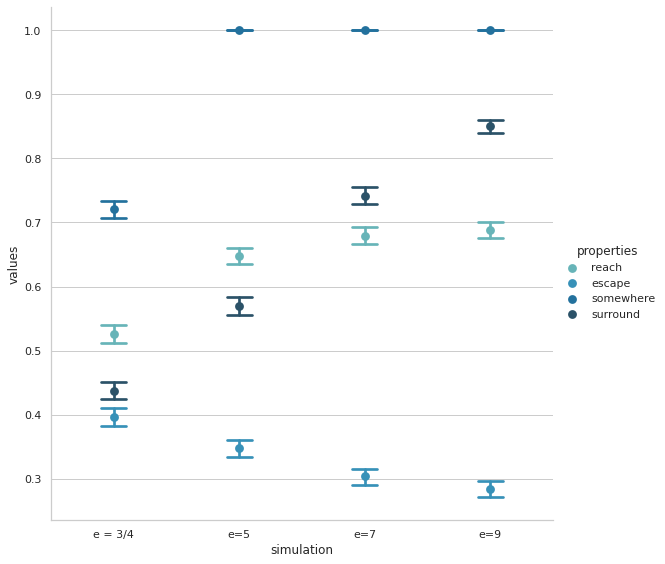

In [ ]:
sns.catplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",99),
    kind="point", height=8, aspect=1, join = False
)

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

<Figure size 3600x1440 with 0 Axes>

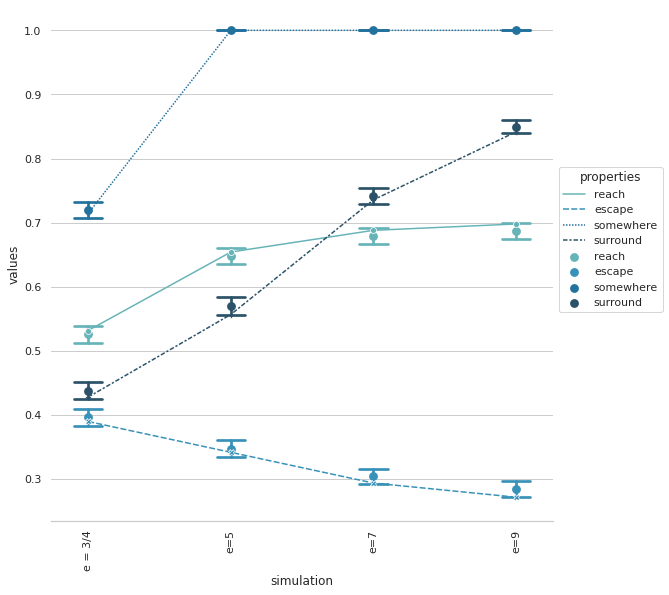

In [ ]:
import seaborn as sns
sns.set_theme(style="whitegrid")

plt.figure(figsize=(50,20))

g=sns.catplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",99),
    kind="point", height=8, aspect=1, join = False
)

g._legend.remove()

ax = sns.lineplot(data=path_values, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True
              )

sns.move_legend(ax,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)

### CTMC: sum up

In [ ]:
# reporting values of properties computed in PRISM

values_ctmc = [0.7017829054079656, 0.2518227070964617, 0.9999073984426681,  0.9816843191279282, 0.7019904227840362, 0.25130098687813274, 
               0.999999608703647, 0.9932620098922402, 0.701991914514761, 0.2511511765862774, 0.9999997771870102, 0.9990880738577281,
               0.701991917607612,  0.2511430587713217, 0.9999997912865504, 0.9998765430468995 ]

In [ ]:
dict_simulation_type_ctmc = {0:'t = 3/4',1:'t=5',2:'t=7',3:'t=9'}
properties = ['reach','escape','somewhere','surround']*4
print(properties)
simulations = []
for el in dict_simulation_type_ctmc.values():
  simulations += [el]*4
path_values_ctmc = pd.DataFrame(zip(values_ctmc,properties,simulations),columns=['values','properties','simulation'])
path_values_ctmc

['reach', 'escape', 'somewhere', 'surround', 'reach', 'escape', 'somewhere', 'surround', 'reach', 'escape', 'somewhere', 'surround', 'reach', 'escape', 'somewhere', 'surround']


,values,properties,simulation
0,0.701783,reach,t = 3/4
1,0.251823,escape,t = 3/4
2,0.999907,somewhere,t = 3/4
3,0.981684,surround,t = 3/4
4,0.701990,reach,t=5
5,0.251301,escape,t=5
6,1.000000,somewhere,t=5
7,0.993262,surround,t=5
8,0.701992,reach,t=7
9,0.251151,escape,t=7


In [ ]:
dict_simulation_type_ctmc = {0:'t = 3/4',1:'t=5',2:'t=7',3:'t=9'}
sns_dataset_ctmc = pd.DataFrame()
for el in range(len(storing_values_reach)):
  df1 = pd.DataFrame(data={'values':storing_values_reach_ctmc[el], 'properties':'reach', 'simulation' : dict_simulation_type_ctmc[el]})
  df2 = pd.DataFrame(data={'values':storing_values_escape_ctmc[el], 'properties':'escape','simulation' : dict_simulation_type_ctmc[el]})
  df3 = pd.DataFrame(data={'values':storing_values_somewhere_ctmc[el], 'properties':'somewhere','simulation' : dict_simulation_type_ctmc[el]})
  df5 = pd.DataFrame(data={'values':storing_values_surround_ctmc[el], 'properties':'surround','simulation' : dict_simulation_type_ctmc[el]})
  data_sim = pd.concat([df1, df2,df3,df5], axis=0)
  sns_dataset_ctmc = pd.concat([sns_dataset_ctmc, data_sim],axis=0)
sns_dataset_ctmc.index = range(len(sns_dataset_ctmc))
sns_dataset_ctmc

,values,properties,simulation
0,0.0,reach,t = 3/4
1,1.0,reach,t = 3/4
2,1.0,reach,t = 3/4
3,1.0,reach,t = 3/4
4,1.0,reach,t = 3/4
...,...,...,...
79995,1.0,surround,t=9
79996,1.0,surround,t=9
79997,1.0,surround,t=9
79998,1.0,surround,t=9


(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

<Figure size 3600x1440 with 0 Axes>

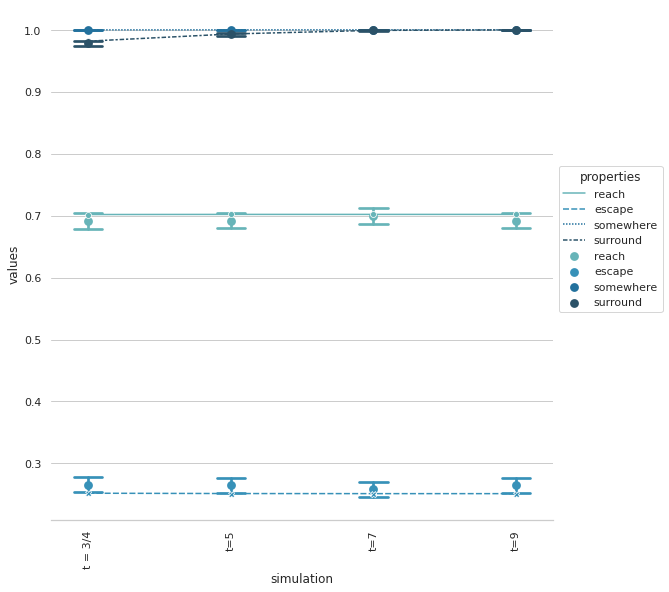

In [ ]:
import seaborn as sns
sns.set_theme(style="whitegrid")

plt.figure(figsize=(50,20))

g=sns.catplot(
    data=sns_dataset_ctmc, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",99),
    kind="point", height=8, aspect=1, join = False
)

g._legend.remove()

ax = sns.lineplot(data=path_values_ctmc, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True
              )

sns.move_legend(ax,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)

## SUBPLOTS and VARIATIONS: ci and number of simulations

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

<Figure size 3600x1440 with 0 Axes>

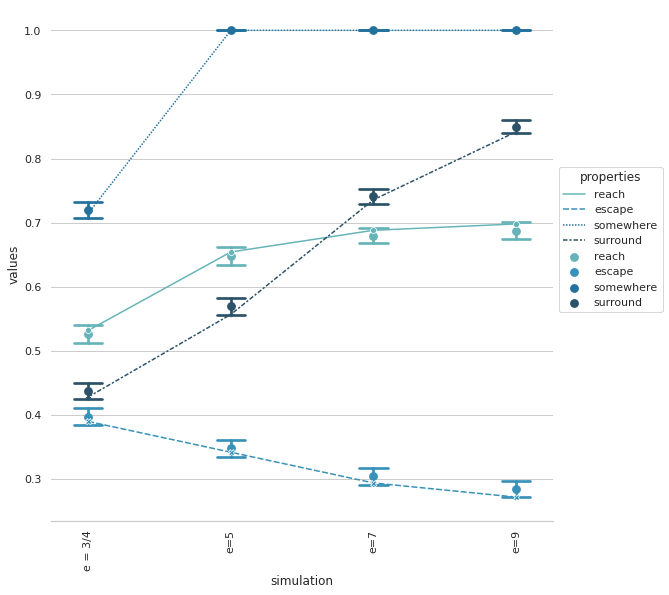

In [ ]:
sns.set_theme(style="whitegrid")

plt.figure(figsize=(50,20))

g=sns.catplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",99),
    kind="point", height=8, aspect=1, join = False
)

g._legend.remove()

ax = sns.lineplot(data=path_values, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True
              )

sns.move_legend(ax,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

<Figure size 3600x1440 with 0 Axes>

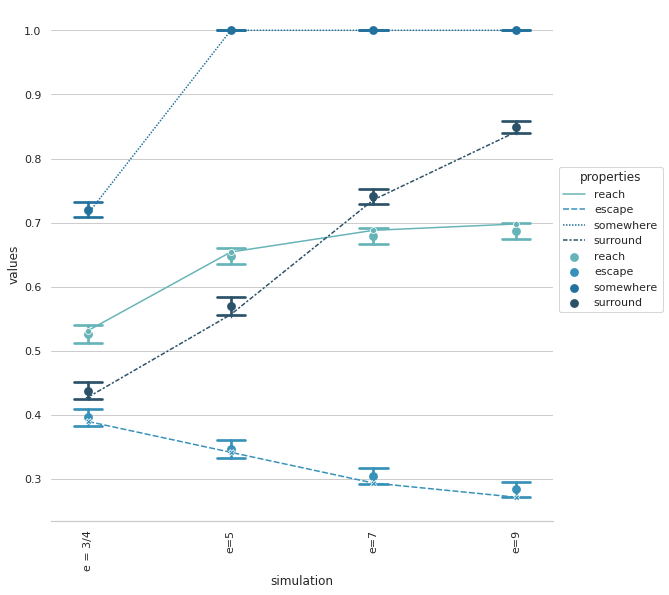

In [ ]:
sns.set_theme(style="whitegrid")

plt.figure(figsize=(50,20))

g=sns.catplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",95),
    kind="point", height=8, aspect=1, join = False
)

g._legend.remove()

ax = sns.lineplot(data=path_values, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True
              )

sns.move_legend(ax,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

<Figure size 3600x1440 with 0 Axes>

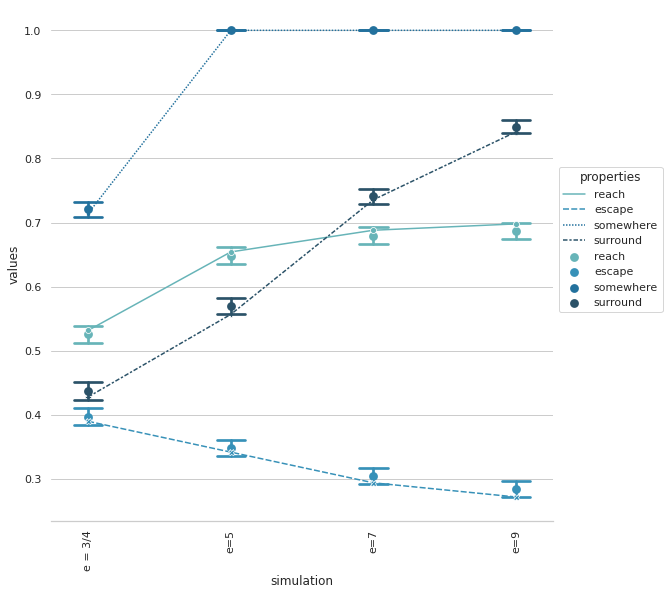

In [ ]:
import seaborn as sns
sns.set_theme(style="whitegrid")

plt.figure(figsize=(50,20))

g=sns.catplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",90),
    kind="point", height=8, aspect=1, join = False
)

g._legend.remove()

ax = sns.lineplot(data=path_values, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True
              )

sns.move_legend(ax,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)

### CHANGING confidence intervals: 90,95 and 99

(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

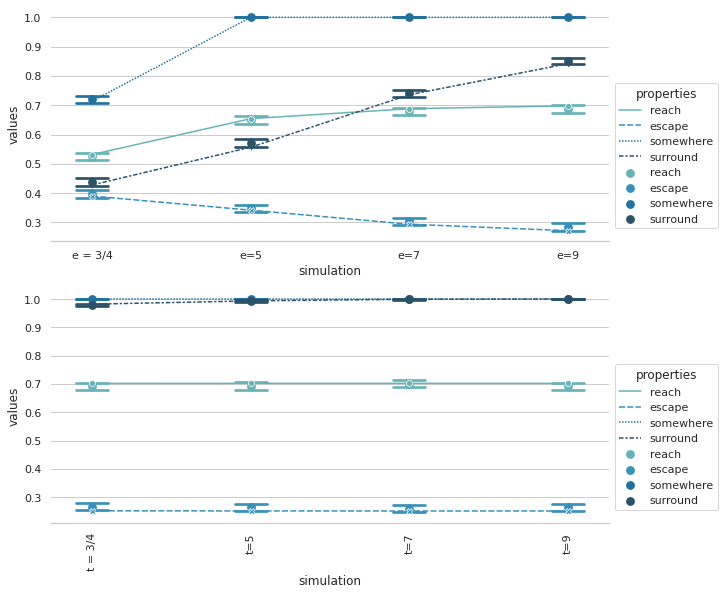

In [ ]:
fig, axes = plt.subplots(2, figsize=(10,9.5))

sns.set_theme(style="whitegrid")



g=sns.pointplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",99),
   height=8, aspect=1, join = False,ax= axes[0])


fig1 = sns.lineplot(data=path_values, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True,ax=axes[0]
              )

sns.move_legend(fig1,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)


g=sns.pointplot(
    data=sns_dataset_ctmc, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",99),
   height=8, aspect=1, join = False, ax=axes[1]
)


fig2=sns.lineplot(data=path_values_ctmc, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True,ax=axes[1]
              )

sns.move_legend(fig2,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)


(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

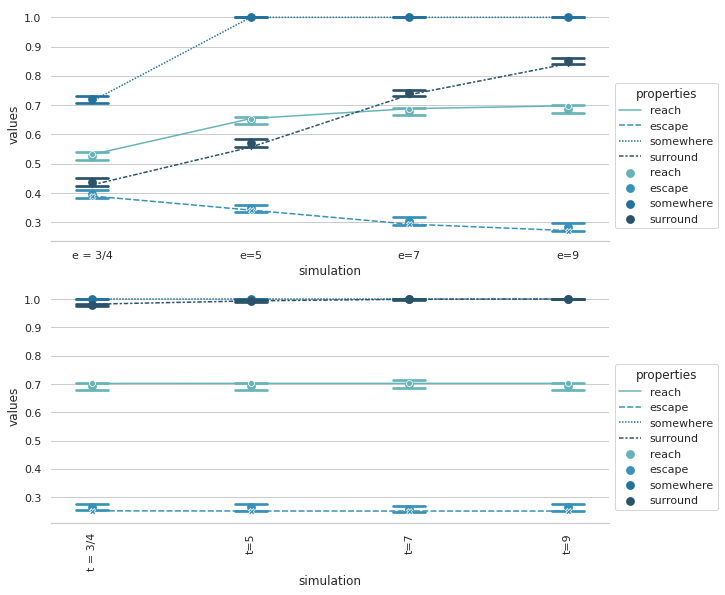

In [ ]:
fig, axes = plt.subplots(2, figsize=(10,9.5))

sns.set_theme(style="whitegrid")



g=sns.pointplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",95),
   height=8, aspect=1, join = False,ax= axes[0])


fig1 = sns.lineplot(data=path_values, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True,ax=axes[0]
              )

sns.move_legend(fig1,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)


g=sns.pointplot(
    data=sns_dataset_ctmc, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",95),
   height=8, aspect=1, join = False, ax=axes[1]
)


fig2=sns.lineplot(data=path_values_ctmc, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True,ax=axes[1]
              )

sns.move_legend(fig2,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)


(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

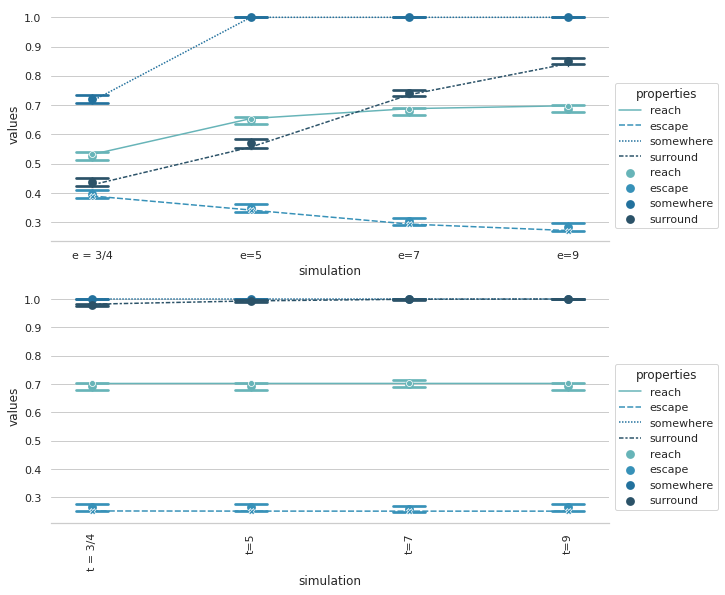

In [ ]:
fig, axes = plt.subplots(2, figsize=(10,9.5))

sns.set_theme(style="whitegrid")



g=sns.pointplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",90),
   height=8, aspect=1, join = False,ax= axes[0])


fig1 = sns.lineplot(data=path_values, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True,ax=axes[0]
              )

sns.move_legend(fig1,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)


g=sns.pointplot(
    data=sns_dataset_ctmc, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",90),
   height=8, aspect=1, join = False, ax=axes[1]
)


fig2=sns.lineplot(data=path_values_ctmc, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True,ax=axes[1]
              )

sns.move_legend(fig2,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)


### CHANGING number of simulations:500, 1000,5000


In [ ]:
dict_simulation_type = {0:'e = 3/4',1:'e=5',2:'e=7',3:'e=9'}
sns_dataset = pd.DataFrame()
for el in range(len(storing_values_reach)):
  df1 = pd.DataFrame(data={'values':storing_values_reach[el][:500], 'properties':'reach', 'simulation' : dict_simulation_type[el]})
  df2 = pd.DataFrame(data={'values':storing_values_escape[el][:500], 'properties':'escape','simulation' : dict_simulation_type[el]})
  df3 = pd.DataFrame(data={'values':storing_values_somewhere[el][:500], 'properties':'somewhere','simulation' : dict_simulation_type[el]})
  df5 = pd.DataFrame(data={'values':storing_values_surround[el][:500], 'properties':'surround','simulation' : dict_simulation_type[el]})
  data_sim = pd.concat([df1, df2,df3,df5], axis=0)
  sns_dataset = pd.concat([sns_dataset, data_sim],axis=0)
sns_dataset.index = range(len(sns_dataset))
sns_dataset

,values,properties,simulation
0,0.0,reach,e = 3/4
1,1.0,reach,e = 3/4
2,1.0,reach,e = 3/4
3,1.0,reach,e = 3/4
4,0.0,reach,e = 3/4
...,...,...,...
7995,0.0,surround,e=9
7996,1.0,surround,e=9
7997,1.0,surround,e=9
7998,1.0,surround,e=9


(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

<Figure size 3600x1440 with 0 Axes>

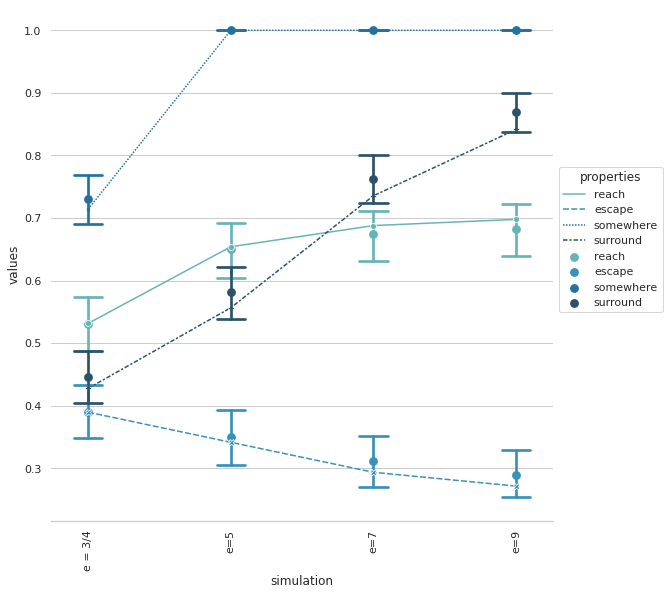

In [ ]:
sns.set_theme(style="whitegrid")

plt.figure(figsize=(50,20))

g=sns.catplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",99),
    kind="point", height=8, aspect=1, join = False
)

g._legend.remove()

ax = sns.lineplot(data=path_values, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True
              )

sns.move_legend(ax,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)

In [ ]:
dict_simulation_type = {0:'e = 3/4',1:'e=5',2:'e=7',3:'e=9'}
sns_dataset = pd.DataFrame()
for el in range(len(storing_values_reach)):
  df1 = pd.DataFrame(data={'values':storing_values_reach[el][:1000], 'properties':'reach', 'simulation' : dict_simulation_type[el]})
  df2 = pd.DataFrame(data={'values':storing_values_escape[el][:1000], 'properties':'escape','simulation' : dict_simulation_type[el]})
  df3 = pd.DataFrame(data={'values':storing_values_somewhere[el][:1000], 'properties':'somewhere','simulation' : dict_simulation_type[el]})
  df5 = pd.DataFrame(data={'values':storing_values_surround[el][:1000], 'properties':'surround','simulation' : dict_simulation_type[el]})
  data_sim = pd.concat([df1, df2,df3,df5], axis=0)
  sns_dataset = pd.concat([sns_dataset, data_sim],axis=0)
sns_dataset.index = range(len(sns_dataset))
sns_dataset

,values,properties,simulation
0,0.0,reach,e = 3/4
1,1.0,reach,e = 3/4
2,1.0,reach,e = 3/4
3,1.0,reach,e = 3/4
4,0.0,reach,e = 3/4
...,...,...,...
15995,1.0,surround,e=9
15996,1.0,surround,e=9
15997,1.0,surround,e=9
15998,1.0,surround,e=9


(array([0, 1, 2, 3]), <a list of 4 Text major ticklabel objects>)

<Figure size 3600x1440 with 0 Axes>

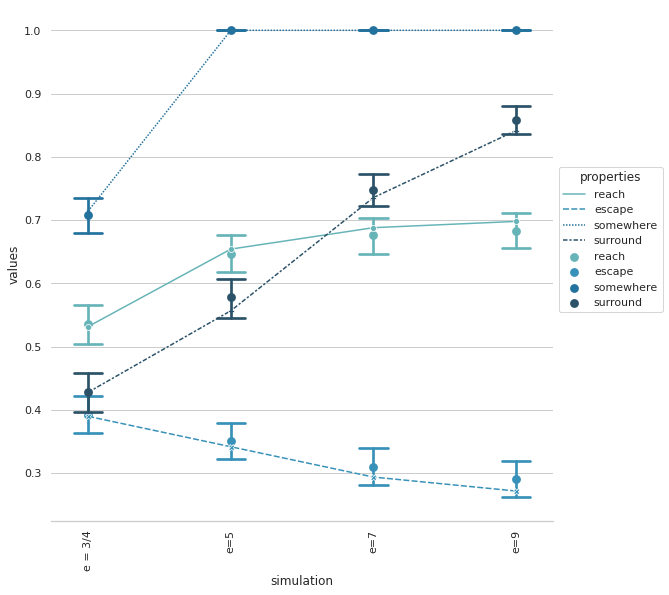

In [ ]:
sns.set_theme(style="whitegrid")

plt.figure(figsize=(50,20))

g=sns.catplot(
    data=sns_dataset, x="simulation", y="values",hue='properties',
    capsize=.2, palette="YlGnBu_d", errorbar=("ci",99),
    kind="point", height=8, aspect=1, join = False
)

g._legend.remove()

ax = sns.lineplot(data=path_values, x="simulation", y="values",hue='properties',
             palette="YlGnBu_d",style='properties',markers=True
              )

sns.move_legend(ax,"best",bbox_to_anchor=(1, .7))
sns.despine(left=True)
plt.xticks(rotation = 90)

5000 thousand case reported in 'DTMC:sum up' section 

# STREL network implementation

### REACHABILITY

In [ ]:
mln_data = ParserThesis.parse_mln('/content/STREL_NET.txt')
language = ParserThesis.parse_language_file('/content/STREL_reachability.txt')

Parsing network configuration file /content/STREL_NET.txt
Parsing MLN language file /content/STREL_reachability.txt


In [ ]:
ParserThesis.parse_to_kappy_observed_event_first_part('/content/STREL_NET.txt','/content/STREL_reachability.txt','/STREL_model.txt')
with open('/STREL_model.txt','r') as f:
  lines = f.read().splitlines()
strel_text = ""
for line in lines:
   strel_text += line + '\\'
   print(line)

Parsing network configuration file /content/STREL_NET.txt
Parsing MLN language file /content/STREL_reachability.txt
Successfully exported model into Kappa: /STREL_model.txt
%agent: V1(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V2(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v7)
%agent: V3(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v10)
%agent: V4(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V5(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v7, l1v6)
%agent: V6(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v5, l1v8)
%agent: V7(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v5, l1v10, l1v2, l1v8)
%agent: V8(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, 

In [ ]:
kappa_client = kappy.KappaStd()
model_text =  strel_text[:-1].replace("\\","")
kappa_client.add_model_string(model_text)
kappa_client.project_parse()
sim_params = kappy.SimulationParameter(pause_condition=f"[E] > 30",plot_period=0,seed=10)
kappa_client.simulation_start(sim_params)
kappa_client.wait_for_simulation_stop()
results_three_node_sim = kappa_client.simulation_plot()
three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
three_node_sim = three_node_sim.sort_values(by = '[T]')
happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
events_chain = [three_node_sim_list[0]]
print(len(three_node_sim))
for rilevation in range(len(three_node_sim_list[:-1])):
  if three_node_sim_list[rilevation] == three_node_sim_list[rilevation+1]:
    continue
  else:
    events_chain.append(three_node_sim_list[rilevation+1])
print(len(events_chain))
three_node_sim.index = range(len(three_node_sim))
three_nodes_event_chain = three_node_sim.iloc[1:,:]
three_nodes_event_chain.index = range(len(three_nodes_event_chain))
zoom_net = three_nodes_event_chain.iloc[:,7:(len(language['initial conditions'])+1)*len(language['states'])+1]
zoom_net
# first row repeated twice


33
32


,'V1coord-Loc','V1router-Loc','V1blue_dev-Loc','V1coord-noLoc','V1router-noLoc','V1blue_dev-noLoc','V2coord-Loc','V2router-Loc','V2blue_dev-Loc','V2coord-noLoc',...,'V15blue_dev-Loc','V15coord-noLoc','V15router-noLoc','V15blue_dev-noLoc','V16coord-Loc','V16router-Loc','V16blue_dev-Loc','V16coord-noLoc','V16router-noLoc','V16blue_dev-noLoc'
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
6,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
7,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
8,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
9,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
three_nodes_event_chain = three_node_sim.iloc[1:,:]
three_nodes_event_chain.index = range(len(three_nodes_event_chain))
three_nodes_event_chain

,[T],'coord-Loc','router-Loc','blue_dev-Loc','coord-noLoc','router-noLoc','blue_dev-noLoc','V1coord-Loc','V1router-Loc','V1blue_dev-Loc',...,'V15blue_dev-noLoc','V16coord-Loc','V16router-Loc','V16blue_dev-Loc','V16coord-noLoc','V16router-noLoc','V16blue_dev-noLoc',property_reachability,content_condition1,content_condition2
0,0.000000,0.0,0.0,1.0,1.0,6.0,8.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,0.047344,0.0,1.0,0.0,1.0,5.0,9.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
2,0.411622,0.0,0.0,1.0,1.0,6.0,8.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
3,0.839157,0.0,1.0,0.0,1.0,5.0,9.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
4,0.968085,0.0,0.0,1.0,1.0,6.0,8.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
5,1.025709,0.0,1.0,0.0,1.0,5.0,9.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
6,1.644064,0.0,0.0,1.0,1.0,6.0,8.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,1.0,0.0
7,2.295281,0.0,1.0,0.0,1.0,5.0,9.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
8,2.465234,0.0,1.0,0.0,1.0,5.0,9.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
9,2.507194,0.0,1.0,0.0,1.0,5.0,9.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0


In [ ]:
 zoom_net = three_nodes_event_chain.iloc[:,7:(len(language['initial conditions'])+1)*len(language['states'])+1]
 zoom_net

,'V1coord-Loc','V1router-Loc','V1blue_dev-Loc','V1coord-noLoc','V1router-noLoc','V1blue_dev-noLoc','V2coord-Loc','V2router-Loc','V2blue_dev-Loc','V2coord-noLoc',...,'V15blue_dev-Loc','V15coord-noLoc','V15router-noLoc','V15blue_dev-noLoc','V16coord-Loc','V16router-Loc','V16blue_dev-Loc','V16coord-noLoc','V16router-noLoc','V16blue_dev-noLoc'
0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
4,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
5,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
6,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
7,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
8,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
9,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [ ]:
pattern = re.compile(r'=[0-9]+')
pattern2 = re.compile(r'[0-9]+')
pattern3 = re.compile(r'V[0-9]+')
updates = {}

for network in zoom_net.values:
  simulation_net = ''
  for elem in range(len(network)):
    if network[elem] == 1:
      simulation_net += f"{zoom_net.columns[elem]}&"
  simulation_net = simulation_net[:-1]
  net_comp = simulation_net.split('&')
  for node in net_comp:
    if 'noLoc' not in node:
      location = pattern2.search(node).group()
      point = node
  unique_edges = []
  for edge in mln_data['edges'][1][0]:
    if edge not in unique_edges and (edge[1],edge[0]) not in unique_edges and edge[0] == location:
      unique_edges.append(edge)
  transformings = {}
  for rhs_node in unique_edges:
    for node2 in net_comp:
      if pattern2.search(node2).group() == rhs_node[1]:
        if point not in transformings: 
          transformings[point] = [node2]
        else:
          transformings[point].append(node2)
  for rule in language['rules']:
    if pattern.search(rule) != None: #LHS with 2 nodes
      splitter = pattern.search(rule).group()
      lhs, rhs = rule.split('->')
      lhs_comp = lhs.split(splitter)
      rhs_product, rhs_rate = rhs.split('@')
      rhs_comp = rhs_product.split(splitter)
      for comp in range(len(lhs_comp)):
        lhs_comp[comp] = lhs_comp[comp].strip()
        rhs_comp[comp] = rhs_comp[comp].strip()
      if lhs_comp[0] in point:
        for match in transformings[point]:
          if lhs_comp[1] in match:
            copy = simulation_net[:]
            copy = copy.replace(lhs, f'{pattern3.search(node).group()}{rhs_comp[0]}')
            copy = copy.replace(match, f'{pattern3.search(match).group()}{rhs_comp[1]}')
            if simulation_net not in updates:
              updates[simulation_net] = [copy]
            else:
              updates[simulation_net].append(copy)

nodes = []
edges = []
for net in updates:
  nodes.append(net)
  for connect in updates[net]:
    nodes.append(connect)
    edges.append((net,connect))
print(len(nodes))
print(len(edges))
nodes = np.unique(nodes)
edges = np.unique(edges,axis=1)
print(len(nodes))
print(len(edges))
graph_sim = nx.DiGraph()
graph_sim.add_nodes_from(nodes)
graph_sim.add_edges_from(edges)
initial_net = ''
for elem in range(len(zoom_net.values[0])):
  if zoom_net.values[0][elem] == 1:
    initial_net += f"{zoom_net.columns[elem]}&"
initial_net = initial_net[:-1]
initial_net
 
      




115
102
46
102


"'V1blue_dev-noLoc'&'V2blue_dev-noLoc'&'V3blue_dev-noLoc'&'V4blue_dev-noLoc'&'V5router-noLoc'&'V6blue_dev-Loc'&'V7router-noLoc'&'V8router-noLoc'&'V9router-noLoc'&'V10coord-noLoc'&'V11router-noLoc'&'V12blue_dev-noLoc'&'V13blue_dev-noLoc'&'V14blue_dev-noLoc'&'V15blue_dev-noLoc'&'V16router-noLoc'"

Finished with one example, now repeat the simulations.

In [ ]:
stop_value = int(language['reachability property'][0].split('R')[1].split('&&')[0].strip().split('=')[1])
number_of_traces = int(language['simOptions'][2].split('=')[1].strip())

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []
pattern = re.compile(r'noLoc')
pattern2 = re.compile(r'V[0-9]+')
pattern3 = re.compile(r'V[0-9]+')
pattern4 = re.compile(r'=[0-9]+')
simulation_traces = []
reached_events = []
total_nodes = []
total_edges = []


seeds = 100
updates = {}
while len(simulations_data) < number_of_traces:

  kappa_client = kappy.KappaStd()
  model_text =  strel_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[E] > {stop_value-1}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  events_chain = [three_node_sim_list[0]]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  three_nodes_event_chain = three_node_sim.iloc[1:,:]
  three_nodes_event_chain.index = range(len(three_nodes_event_chain))
  zoom_net = three_nodes_event_chain.iloc[:,7:(len(language['initial conditions'])+1)*len(language['states'])+1]
  
  for network in zoom_net.values:
    simulation_net = ''
    for elem in range(len(network)):
      if network[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}&"
    simulation_net = simulation_net[:-1]
    net_comp = simulation_net.split('&')
    for node in net_comp:
      if 'noLoc' not in node:
        location = pattern2.search(node).group()
        point = node
    unique_edges = []
    for edge in mln_data['edges'][1][0]:
      if edge not in unique_edges and (edge[1],edge[0]) not in unique_edges and edge[0] == location[1:]:
        unique_edges.append(edge)

    transformings = {}
    for rhs_node in unique_edges:
      for node2 in net_comp:
        if pattern2.search(node2).group()[1:] == rhs_node[1]:
          if point not in transformings: 
            transformings[point] = [node2]
          else:
            transformings[point].append(node2)
    for rule in language['rules']:
      if pattern.search(rule) != None: #LHS with 2 nodes
        splitter = pattern4.search(rule).group()
        lhs, rhs = rule.split('->')
        lhs_comp = lhs.split(splitter)
        rhs_product, rhs_rate = rhs.split('@')
        rhs_comp = rhs_product.split(splitter)
        for comp in range(len(lhs_comp)):
          lhs_comp[comp] = lhs_comp[comp].strip()
          rhs_comp[comp] = rhs_comp[comp].strip()
        if lhs_comp[0] in point:
          for match in transformings[point]:
            if lhs_comp[1] in match:
              copy = simulation_net[:]
              copy = copy.replace(f'{location}{lhs_comp[0]}', f'{location}{rhs_comp[0]}')
              copy = copy.replace(match, f"'{pattern3.search(match).group()}{rhs_comp[1]}'")
              if simulation_net not in updates:
                updates[simulation_net] = [copy]
              else:
                updates[simulation_net].append(copy)
    


  for net in updates:
    total_nodes.append(net)
    for connect in updates[net]:
      total_nodes.append(connect)
      total_edges.append((net,connect))
 


  if 1 in three_nodes_event_chain.property_reachability.values:
    event_reached = three_nodes_event_chain[three_nodes_event_chain.property_reachability.isin([1])]
    event_reached_index = three_nodes_event_chain[three_nodes_event_chain.property_reachability.isin([1])].index[0]
    reached_net = ''
    for elem in range(len(event_reached.values)):
      if event_reached.values[0][elem] == 1:
        reached_net += f"{event_reached.columns[elem]}&"
    reached_net = reached_net[:-1]
    reached_events.append(reached_net)
    simulation_trace = ''
    for net in zoom_net.values[:event_reached_index+1]:
      simulation_net = ''
      for elem in range(len(net)):
        if net[elem] == 1 and not pattern.search(zoom_net.columns[elem]):
          simulation_net += f"{pattern2.search(zoom_net.columns[elem]).group()}"
      simulation_trace += f'{simulation_net}-'
    simulation_trace = simulation_trace[:-1]
    simulation_traces.append(simulation_trace)
  seeds += 1
  print(len(simulations_data))






1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  equalize_len_data.append(filled)

In [ ]:
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],'coord-Loc','router-Loc','blue_dev-Loc','coord-noLoc','router-noLoc','blue_dev-noLoc','V1coord-Loc','V1router-Loc','V1blue_dev-Loc',...,'V15blue_dev-noLoc','V16coord-Loc','V16router-Loc','V16blue_dev-Loc','V16coord-noLoc','V16router-noLoc','V16blue_dev-noLoc',property_reachability,content_condition1,content_condition2
0,0.000000,0.0,0.00,1.00,1.0,6.00,8.00,0.0,0.0,0.00,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.00,0.00
1,0.000000,0.0,0.00,1.00,1.0,6.00,8.00,0.0,0.0,0.00,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.00,0.00
2,0.559484,0.0,1.00,0.00,1.0,5.00,9.00,0.0,0.0,0.00,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.00,1.00
3,0.983824,0.0,0.36,0.64,1.0,5.64,8.36,0.0,0.0,0.08,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.64,0.36


In [ ]:
satisfying_traces = np.unique(simulation_traces)
for trac in satisfying_traces:
  print(f'location V6 satisfy the reachability property with the following trace: {trac}')

location V6 satisfy the reachability property with the following trace: V6-V5
location V6 satisfy the reachability property with the following trace: V6-V8


In [ ]:
final_nets = []
for el in satisfying_traces:
  nodes = el.split('-')
  init, final = nodes[0],nodes[-1]
  intermediate = initial_net.replace('V6blue_dev-Loc','V6blue_dev-noLoc')
  nodes_inter = intermediate.split('&')
  for en in range(len(nodes_inter)):
    if final in nodes_inter[en]:
      nodes_inter[en] = nodes_inter[en].replace('noLoc','Loc')
  final_net = '&'.join(nodes_inter)
  final_nets.append(final_net.replace("",''))

In [ ]:
pattern2 = re.compile(r'V[0-9]+')
new_nodes = []
for el in updates:
    if el not in new_nodes:
      new_nodes.append(el)
    for el2 in updates[el]:
      if el2 not in new_nodes:
        new_nodes.append(el2)  
print(len(new_nodes))
new_edges = []
for el3 in updates:
  for el4 in updates[el3]:
    if (el3,el4) not in new_edges:
      new_edges.append((el3,el4))
print(len(new_edges))
graph_sim = nx.DiGraph()

graph_sim.add_nodes_from(new_nodes)
graph_sim.add_edges_from(new_edges)

8
14


In [ ]:
graph_sim = nx.DiGraph()

graph_sim.add_nodes_from(new_nodes)
graph_sim.add_edges_from(new_edges)

In [ ]:
satisfying_traces

array(['V6-V5', 'V6-V8'], dtype='<U5')

In [ ]:
def coloring_laura_reach(new_nodes,initial_net):
  color_nodes = np.zeros(len(new_nodes))
  for node in range(len(new_nodes)):
    if new_nodes[node] == initial_net:
      color_nodes[node] += 50
    if 'router-Loc' in new_nodes[node]:
      color_nodes[node] += 20
    if 'blue_dev-Loc' in new_nodes[node]:
      color_nodes[node] += 10
    if 'coord-Loc' in new_nodes[node]:
      color_nodes[node] += 5
  legend = {}
  for color in color_nodes:
    if color == 5:
      legend[color] = 'coordinator location'
    if color == 10:
      legend[color] = 'blue device location'
    if color == 20:
      legend[color] = 'router location'
    if color == 55:
      legend[color] = 'initial net, coordinator location'
    if color == 60:
      legend[color] = 'initial net, blue device location'
    if color == 70:
      legend[color] = 'initial net, router location'
  return color_nodes,legend

In [ ]:
coloured_nodes,legend_reach = coloring_laura_reach(new_nodes,initial_net)

In [ ]:
mapper = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped = mapper.to_rgba(np.unique(coloured_nodes))

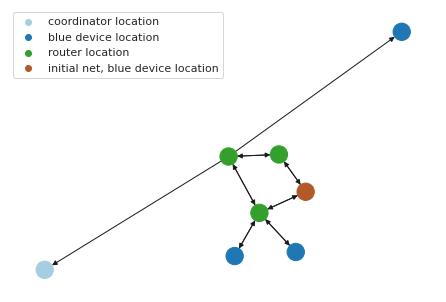

In [ ]:
nx.draw(graph_sim,node_color = coloured_nodes, cmap=plt.get_cmap('Paired'))
for v in np.unique(coloured_nodes):
    plt.scatter([],[], color=mapped[list(np.unique(coloured_nodes)).index(v)], label = legend_reach[v])

plt.legend()

In [ ]:
paths = []
for event in final_nets:
  print(nx.shortest_path_length(graph_sim, initial_net,event))
  paths.append(list(nx.all_shortest_paths(graph_sim,initial_net, event)))


1
1


In [ ]:
new_paths = []
for path in paths:
  for el in path:
    new_paths.append(el)

In [ ]:
def color_reach_path(paths, graph):
  colors = np.zeros(len(graph.edges()))
  for path in paths:
    for elem in range(len(path)-1):
      for el in list(graph.edges()):
        if (path[elem],path[elem+1]) == el:
          colors[list(graph.edges()).index((path[elem],path[elem+1]))] += 100
  return colors

In [ ]:
coloured_paths = color_reach_path(new_paths,graph_sim)
coloured_paths = list(map(lambda x:int(x), list(coloured_paths)))
coloured_paths

[100, 100, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [ ]:
labels = {}
for node in graph_sim:
  elems = node.split('&')
  for el in elems:
    if 'noLoc' not in el:
      labels[node] = pattern2.search(el).group()


In [ ]:
graph_sim = nx.relabel_nodes(graph_sim,labels)

In [ ]:
positions = nx.spring_layout(graph_sim,seed=1)

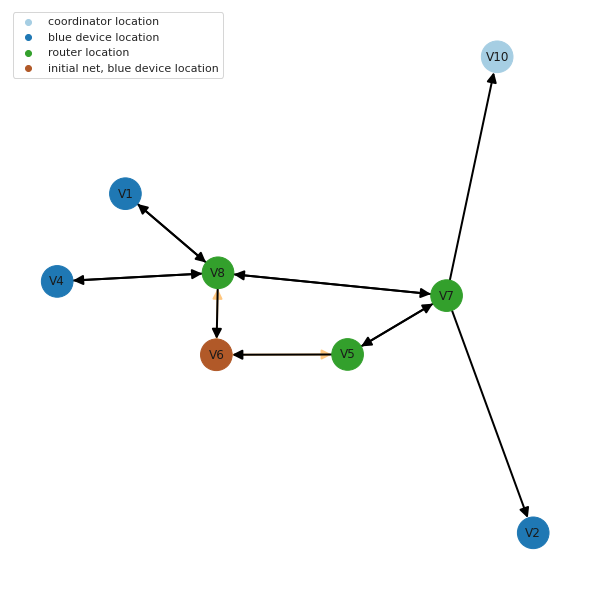

In [ ]:
plt.figure(figsize=(8,8))

nx.draw(graph_sim, with_labels=True, node_color=coloured_nodes, cmap=plt.get_cmap('Paired'), edge_color = coloured_paths,  edge_cmap=plt.get_cmap("copper"),
                arrowsize = 20, width =2,node_size=1000, pos=positions)

for v in np.unique(coloured_nodes):
    plt.scatter([],[], color=mapped[list(np.unique(coloured_nodes)).index(v)], label = legend_reach[v])



plt.legend()

### ESCAPE

In [ ]:
language = ParserThesis.parse_language_file('/content/STREL_escape.txt')

Parsing MLN language file /content/STREL_escape.txt


In [ ]:
ParserThesis.parse_to_kappy_observed_event_first_part('/content/STREL_NET.txt','/content/STREL_escape.txt','/STREL_model.txt')

Parsing network configuration file /content/STREL_NET.txt
Parsing MLN language file /content/STREL_escape.txt
Successfully exported model into Kappa: /STREL_model.txt


In [ ]:
with open('/STREL_model.txt','r') as f:
  lines = f.read().splitlines()
strel_text = ""
for line in lines:
   strel_text += line + '\\'
   print(line)

%agent: V1(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V2(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v7)
%agent: V3(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v10)
%agent: V4(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V5(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v6, l1v7)
%agent: V6(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8, l1v5)
%agent: V7(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8, l1v5, l1v10, l1v2)
%agent: V8(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v6, l1v7, l1v1, l1v4)
%agent: V9(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v14, l1v10)
%agent

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []
pattern = re.compile(r'noLoc')
pattern2 = re.compile(r'V[0-9]+')
pattern3 = re.compile(r'V[0-9]+')
pattern4 = re.compile(r'=[0-9]+')
simulation_traces = []
reached_events = []
total_nodes = []
total_edges = []
stop_value = int(language['escape property'][0].split('E')[1].split('&&')[0].strip().split('=')[1])


seeds = 200
updates = {}
while len(simulations_data) < number_of_traces:

  kappa_client = kappy.KappaStd()
  model_text =  strel_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[E] > {stop_value}-1",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  events_chain = [three_node_sim_list[0]]
  three_node_sim.index = range(len(three_node_sim))
  three_nodes_event_chain = three_node_sim.iloc[1:,:]
  simulations_data.append(three_nodes_event_chain)
  three_nodes_event_chain.index = range(len(three_nodes_event_chain))
  zoom_net = three_nodes_event_chain.iloc[:,7:(len(language['initial conditions'])+1)*len(language['states'])+1]
  for network in zoom_net.values:
    simulation_net = ''
    for elem in range(len(network)):
      if network[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}&"
    simulation_net = simulation_net[:-1]
    net_comp = simulation_net.split('&')
    for node in net_comp:
      if 'noLoc' not in node:
        location = pattern2.search(node).group()
        point = node
    unique_edges = []
    for edge in mln_data['edges'][1][0]:
      if edge not in unique_edges and (edge[1],edge[0]) not in unique_edges and edge[0] == location[1:]:
        unique_edges.append(edge)

    transformings = {}
    for rhs_node in unique_edges:
      for node2 in net_comp:
        if pattern2.search(node2).group()[1:] == rhs_node[1]:
          if point not in transformings: 
            transformings[point] = [node2]
          else:
            transformings[point].append(node2)
    for rule in language['rules']:
      if pattern.search(rule) != None: #LHS with 2 nodes
        splitter = pattern4.search(rule).group()
        lhs, rhs = rule.split('->')
        lhs_comp = lhs.split(splitter)
        rhs_product, rhs_rate = rhs.split('@')
        rhs_comp = rhs_product.split(splitter)
        for comp in range(len(lhs_comp)):
          lhs_comp[comp] = lhs_comp[comp].strip()
          rhs_comp[comp] = rhs_comp[comp].strip()
        if lhs_comp[0] in point:
          for match in transformings[point]:
            if lhs_comp[1] in match:
              copy = simulation_net[:]
              copy = copy.replace(f'{location}{lhs_comp[0]}', f'{location}{rhs_comp[0]}')
              copy = copy.replace(match, f"'{pattern3.search(match).group()}{rhs_comp[1]}'")
              if simulation_net not in updates:
                updates[simulation_net] = [copy]
              else:
                updates[simulation_net].append(copy)
    


  for net in updates:
    total_nodes.append(net)
    for connect in updates[net]:
      total_nodes.append(connect)
      total_edges.append((net,connect))

  if 0 not in three_nodes_event_chain.property_escape.values:
    zoom_net = three_nodes_event_chain.iloc[:2+1,7:7+mln_data['actors'][1]*len(language['states'])] #2 in this case is the number of event selected by LAURA
    simulation_trace = ''
    for net in zoom_net.values:
      simulation_net = ''
      for elem in range(len(net)):
        if net[elem] == 1 and not pattern.search(zoom_net.columns[elem]):
          simulation_net += f"{pattern2.search(zoom_net.columns[elem]).group()}"
      simulation_trace += f'{simulation_net}-'
    simulation_trace = simulation_trace[:-1]
    simulation_traces.append(simulation_trace)
  print(len(simulations_data))
  seeds += 1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)

In [ ]:
from functools import reduce

average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],'coord-Loc','router-Loc','blue_dev-Loc','coord-noLoc','router-noLoc','blue_dev-noLoc','V1coord-Loc','V1router-Loc','V1blue_dev-Loc',...,'V15router-noLoc','V15blue_dev-noLoc','V16coord-Loc','V16router-Loc','V16blue_dev-Loc','V16coord-noLoc','V16router-noLoc','V16blue_dev-noLoc',property_escape,content_escape
0,0.0,1.00,0.00,0.00,0.00,6.00,9.00,0.0,0.0,0.0,...,0.0,1.00,0.0,0.00,0.0,0.0,1.00,0.0,1.00,0.00
1,1.0,0.00,0.56,0.44,1.00,5.44,8.56,0.0,0.0,0.0,...,0.0,1.00,0.0,0.08,0.0,0.0,0.92,0.0,0.56,0.44
2,2.0,0.52,0.24,0.24,0.48,5.76,8.76,0.0,0.0,0.0,...,0.0,0.96,0.0,0.02,0.0,0.0,0.98,0.0,0.32,0.24
3,3.0,0.14,0.62,0.24,0.86,5.38,8.76,0.0,0.0,0.0,...,0.0,1.00,0.0,0.08,0.0,0.0,0.92,0.0,0.32,0.24


In [ ]:
escapes = []
for sim in equalize_len_data:
  escapes.append(sim['property_escape'][len(sim)-1])
if average_result.property_escape.values[-1] != 0 and average_result.property_escape.values[-1] != 1:
  print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
else:
  print(f'property escape satisfied with probability {average_result.property_escape.values[-1]}')

escape property confidence interval is: (0.14834815133341134, 0.4916518486665887)


In [ ]:
satisfying_traces = np.unique(simulation_traces)
for trac in satisfying_traces:
  print(f'location V10 satisfy the escape property with the following trace: {trac}')

location V10 satisfy the escape property with the following trace: V10-V11-V10
location V10 satisfy the escape property with the following trace: V10-V11-V16
location V10 satisfy the escape property with the following trace: V10-V16-V10
location V10 satisfy the escape property with the following trace: V10-V16-V11
location V10 satisfy the escape property with the following trace: V10-V7-V10
location V10 satisfy the escape property with the following trace: V10-V7-V8
location V10 satisfy the escape property with the following trace: V10-V9-V10


In [ ]:
final_nets = []
for el in satisfying_traces:
  nodes = el.split('-')
  init, final = nodes[0],nodes[-1]
  intermediate = initial_net.replace('V6blue_dev-Loc','V6blue_dev-noLoc')
  nodes_inter = intermediate.split('&')
  for en in range(len(nodes_inter)):
    if final in nodes_inter[en]:
      nodes_inter[en] = nodes_inter[en].replace('noLoc','Loc')
  final_net = '&'.join(nodes_inter)
  final_nets.append(final_net.replace("",''))

In [ ]:
pattern2 = re.compile(r'V[0-9]+')
new_nodes = []
for el in updates:
    if el not in new_nodes:
      new_nodes.append(el)
    for el2 in updates[el]:
      if el2 not in new_nodes:
        new_nodes.append(el2)  
print(len(new_nodes))
new_edges = []
for el3 in updates:
  for el4 in updates[el3]:
    if (el3,el4) not in new_edges:
      new_edges.append((el3,el4))
print(len(new_edges))

graph_sim = nx.DiGraph()
graph_sim.add_nodes_from(new_nodes)
graph_sim.add_edges_from(new_edges)

16
32


In [ ]:
labels = {}
for node in graph_sim:
  elems = node.split('&')
  for el in elems:
    if 'noLoc' not in el:
      labels[node] = pattern2.search(el).group()
graph_sim = nx.relabel_nodes(graph_sim,labels)

In [ ]:
positions_esc = nx.spring_layout(graph_sim,seed=2)

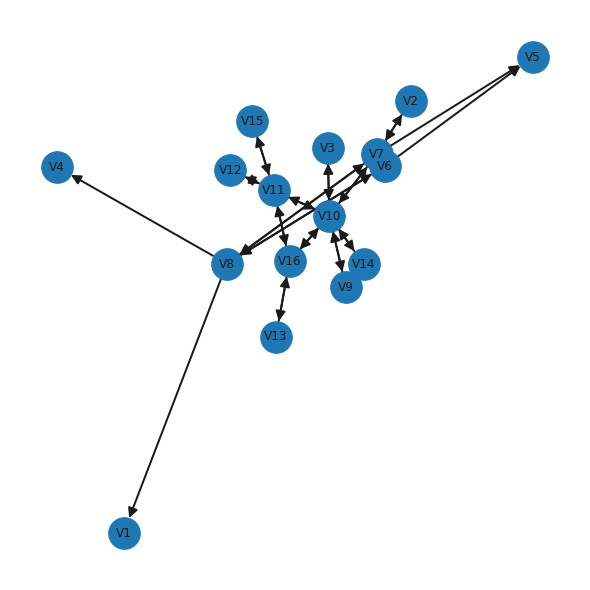

In [ ]:
plt.figure(figsize=(8,8))

nx.draw(graph_sim, with_labels=True, 
                arrowsize = 20, width =2,node_size=1000,pos=positions_esc)

In [ ]:
for trace in satisfying_traces:
  node_trace = trace.split('-')
  start, end = node_trace[0],node_trace[-1]
  if nx.shortest_path_length(graph_sim,start, end) >= 2:
    print(f'{trace} is a valid trace: distance start-end equal to {nx.shortest_path_length(graph_sim,start, end)}')

V10-V7-V8 is a valid trace: distance start-end equal to 2


### SOMEWHERE

In [ ]:
language = ParserThesis.parse_language_file('/content/STREL_somewhere.txt')

Parsing MLN language file /content/STREL_somewhere.txt


In [ ]:
ParserThesis.parse_to_kappy_observed_event_first_part('/content/STREL_NET.txt','/content/STREL_somewhere.txt','/STREL_model.txt')

Parsing network configuration file /content/STREL_NET.txt
Parsing MLN language file /content/STREL_somewhere.txt
Successfully exported model into Kappa: /STREL_model.txt


In [ ]:
with open('/STREL_model.txt','r') as f:
  lines = f.read().splitlines()
strel_text = ""
for line in lines:
   strel_text += line + '\\'
   print(line)

%agent: V1(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V2(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v7)
%agent: V3(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v10)
%agent: V4(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V5(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v7, l1v6)
%agent: V6(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v5, l1v8)
%agent: V7(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v5, l1v10, l1v8, l1v2)
%agent: V8(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v4, l1v6, l1v7, l1v1)
%agent: V9(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v14, l1v10)
%agent

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []
pattern = re.compile(r'noLoc')
pattern2 = re.compile(r'V[0-9]+')
pattern3 = re.compile(r'V[0-9]+')
pattern4 = re.compile(r'=[0-9]+')
simulation_traces = []
reached_events = []
total_nodes = []
total_edges = []


seeds = 100
updates = {}
while len(simulations_data) < number_of_traces:

  kappa_client = kappy.KappaStd()
  model_text =  strel_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[E] > {stop_value-1}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  events_chain = [three_node_sim_list[0]]
  three_node_sim.index = range(len(three_node_sim))
  three_nodes_event_chain = three_node_sim.iloc[1:,:]
  simulations_data.append(three_nodes_event_chain)
  three_nodes_event_chain.index = range(len(three_nodes_event_chain))
  zoom_net = three_nodes_event_chain.iloc[:,7:(len(language['initial conditions'])+1)*len(language['states'])+1]
  
  for network in zoom_net.values:
    simulation_net = ''
    for elem in range(len(network)):
      if network[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}&"
    simulation_net = simulation_net[:-1]
    net_comp = simulation_net.split('&')
    for node in net_comp:
      if 'noLoc' not in node:
        location = pattern2.search(node).group()
        point = node
    unique_edges = []
    for edge in mln_data['edges'][1][0]:
      if edge not in unique_edges and (edge[1],edge[0]) not in unique_edges and edge[0] == location[1:]:
        unique_edges.append(edge)

    transformings = {}
    for rhs_node in unique_edges:
      for node2 in net_comp:
        if pattern2.search(node2).group()[1:] == rhs_node[1]:
          if point not in transformings: 
            transformings[point] = [node2]
          else:
            transformings[point].append(node2)
    for rule in language['rules']:
      if pattern.search(rule) != None: #LHS with 2 nodes
        splitter = pattern4.search(rule).group()
        lhs, rhs = rule.split('->')
        lhs_comp = lhs.split(splitter)
        rhs_product, rhs_rate = rhs.split('@')
        rhs_comp = rhs_product.split(splitter)
        for comp in range(len(lhs_comp)):
          lhs_comp[comp] = lhs_comp[comp].strip()
          rhs_comp[comp] = rhs_comp[comp].strip()
        if lhs_comp[0] in point:
          for match in transformings[point]:
            if lhs_comp[1] in match:
              copy = simulation_net[:]
              copy = copy.replace(f'{location}{lhs_comp[0]}', f'{location}{rhs_comp[0]}')
              copy = copy.replace(match, f"'{pattern3.search(match).group()}{rhs_comp[1]}'")
              if simulation_net not in updates:
                updates[simulation_net] = [copy]
              else:
                updates[simulation_net].append(copy)
    


  for net in updates:
    total_nodes.append(net)
    for connect in updates[net]:
      total_nodes.append(connect)
      total_edges.append((net,connect))
 


  if 1 in three_nodes_event_chain.property_somewhere.values:
    event_somewhere = three_nodes_event_chain[three_nodes_event_chain.property_somewhere.isin([1])]
    event_somewhere_index = three_nodes_event_chain[three_nodes_event_chain.property_somewhere.isin([1])].index[0]
    zoom_net = three_nodes_event_chain.iloc[:event_somewhere_index+1,6:6+mln_data['actors'][1]*len(language['states'])]
    simulation_trace = ''
    for net in zoom_net.values:
      simulation_net = ''
      for elem in range(len(net)):
        if net[elem] == 1 and not pattern.search(zoom_net.columns[elem]):
          simulation_net += f"{pattern2.search(zoom_net.columns[elem]).group()}"
      simulation_trace += f'{simulation_net}-'
    simulation_trace = simulation_trace[:-1]
    simulation_traces.append(simulation_trace)
  seeds += 1
  print(len(simulations_data))






1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)

In [ ]:
from functools import reduce

average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],'coord-Loc','router-Loc','blue_dev-Loc','coord-noLoc','router-noLoc','blue_dev-noLoc','V1coord-Loc','V1router-Loc','V1blue_dev-Loc',...,'V15router-noLoc','V15blue_dev-noLoc','V16coord-Loc','V16router-Loc','V16blue_dev-Loc','V16coord-noLoc','V16router-noLoc','V16blue_dev-noLoc',property_somewhere,content_somewhere
0,0.0,0.00,0.00,1.00,1.00,6.00,8.00,0.0,0.0,0.0,...,0.0,1.00,0.0,0.00,0.0,0.0,1.00,0.0,0.00,0.00
1,1.0,0.00,1.00,0.00,1.00,5.00,9.00,0.0,0.0,0.0,...,0.0,1.00,0.0,0.00,0.0,0.0,1.00,0.0,0.00,0.00
2,2.0,0.18,0.18,0.64,0.82,5.82,8.36,0.0,0.0,0.0,...,0.0,0.72,0.0,0.18,0.0,0.0,0.82,0.0,0.18,0.18
3,3.0,0.06,0.82,0.12,0.94,5.18,8.88,0.0,0.0,0.0,...,0.0,1.00,0.0,0.02,0.0,0.0,0.98,0.0,0.24,0.06


In [ ]:
somewheres = []
for sim in equalize_len_data:
  somewheres.append(sim['property_somewhere'][len(sim)-1])
if average_result.property_somewhere.values[-1] != 0 and average_result.property_somewhere.values[-1] != 1:
  print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
else:
  print(f'property somewhere satisfied with probability {average_result.property_somewhere.values[-1]}')

somewhere property confidence interval is: (0.0828438226407604, 0.3971561773592396)


In [ ]:
satisfying_traces = np.unique(simulation_traces)
for trac in satisfying_traces:
  print(f'location V12 satisfy the somewhere property with the following trace: {trac}')

location V12 satisfy the somewhere property with the following trace: V12-V11-V10
location V12 satisfy the somewhere property with the following trace: V12-V11-V16-V10


In [ ]:
final_nets = []
for el in satisfying_traces:
  nodes = el.split('-')
  init, final = nodes[0],nodes[-1]
  intermediate = initial_net.replace('V6blue_dev-Loc','V6blue_dev-noLoc')
  nodes_inter = intermediate.split('&')
  for en in range(len(nodes_inter)):
    if final in nodes_inter[en]:
      nodes_inter[en] = nodes_inter[en].replace('noLoc','Loc')
  final_net = '&'.join(nodes_inter)
  final_nets.append(final_net.replace("",''))

In [ ]:
pattern2 = re.compile(r'V[0-9]+')
new_nodes = []
for el in updates:
    if el not in new_nodes:
      new_nodes.append(el)
    for el2 in updates[el]:
      if el2 not in new_nodes:
        new_nodes.append(el2)  
print(len(new_nodes))
new_edges = []
for el3 in updates:
  for el4 in updates[el3]:
    if (el3,el4) not in new_edges:
      new_edges.append((el3,el4))
print(len(new_edges))

graph_sim = nx.DiGraph()
graph_sim.add_nodes_from(new_nodes)
graph_sim.add_edges_from(new_edges)

13
25


In [ ]:
labels = {}
for node in graph_sim:
  elems = node.split('&')
  for el in elems:
    if 'noLoc' not in el:
      labels[node] = pattern2.search(el).group()
graph_sim = nx.relabel_nodes(graph_sim,labels)

In [ ]:
positions_some = nx.spring_layout(graph_sim,seed=3)

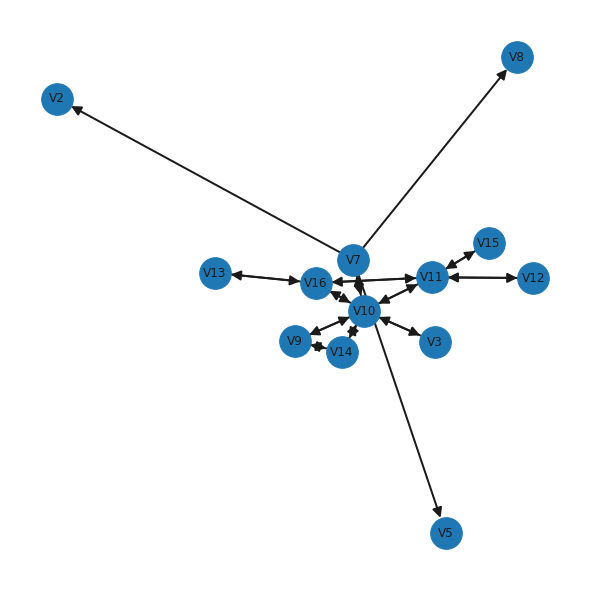

In [ ]:
plt.figure(figsize=(8,8))

nx.draw(graph_sim, with_labels=True, 
                arrowsize = 20, width =2,node_size=1000,pos=positions_some)

In [ ]:
for trace in satisfying_traces:
  node_trace = trace.split('-')
  start, end = node_trace[0],node_trace[-1]
  if nx.shortest_path_length(graph_sim,start, end) <= 4:
    print(f'{trace} is a valid trace: distance start-end equal to {nx.shortest_path_length(graph_sim,start, end)}')

V12-V11-V10 is a valid trace: distance start-end equal to 2
V12-V11-V16-V10 is a valid trace: distance start-end equal to 2


### EVERYWHERE

In [ ]:
language = ParserThesis.parse_language_file('/content/STREL_everywhere.txt')

Parsing MLN language file /content/STREL_everywhere.txt


In [ ]:
ParserThesis.parse_to_kappy_observed_event_first_part('/content/STREL_NET.txt','/content/STREL_everywhere.txt','/STREL_model.txt')

Parsing network configuration file /content/STREL_NET.txt
Parsing MLN language file /content/STREL_everywhere.txt
Successfully exported model into Kappa: /STREL_model.txt


In [ ]:
with open('/STREL_model.txt','r') as f:
  lines = f.read().splitlines()
strel_text = ""
for line in lines:
   strel_text += line + '\\'
   print(line)

%agent: V1(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V2(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v7)
%agent: V3(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v10)
%agent: V4(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V5(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v7, l1v6)
%agent: V6(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8, l1v5)
%agent: V7(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v5, l1v10, l1v2, l1v8)
%agent: V8(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v1, l1v4, l1v6, l1v7)
%agent: V9(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v10, l1v14)
%agent

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []
pattern = re.compile(r'noLoc')
pattern2 = re.compile(r'V[0-9]+')
pattern3 = re.compile(r'V[0-9]+')
pattern4 = re.compile(r'=[0-9]+')
simulation_traces = []
reached_events = []
total_nodes = []
total_edges = []
stop_value = int(language['escape property'][0].split('E')[1].split('&&')[0].strip().split('=')[1])


seeds = 200
updates = {}
while len(simulations_data) < number_of_traces:

  kappa_client = kappy.KappaStd()
  model_text =  strel_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[E] > {stop_value}-1",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  events_chain = [three_node_sim_list[0]]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  three_nodes_event_chain = three_node_sim.iloc[1:,:]
  three_nodes_event_chain.index = range(len(three_nodes_event_chain))
  zoom_net = three_nodes_event_chain.iloc[:,7:(len(language['initial conditions'])+1)*len(language['states'])+1]
  for network in zoom_net.values:
    simulation_net = ''
    for elem in range(len(network)):
      if network[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}&"
    simulation_net = simulation_net[:-1]
    net_comp = simulation_net.split('&')
    for node in net_comp:
      if 'noLoc' not in node:
        location = pattern2.search(node).group()
        point = node
    unique_edges = []
    for edge in mln_data['edges'][1][0]:
      if edge not in unique_edges and (edge[1],edge[0]) not in unique_edges and edge[0] == location[1:]:
        unique_edges.append(edge)

    transformings = {}
    for rhs_node in unique_edges:
      for node2 in net_comp:
        if pattern2.search(node2).group()[1:] == rhs_node[1]:
          if point not in transformings: 
            transformings[point] = [node2]
          else:
            transformings[point].append(node2)
    for rule in language['rules']:
      if pattern.search(rule) != None: #LHS with 2 nodes
        splitter = pattern4.search(rule).group()
        lhs, rhs = rule.split('->')
        lhs_comp = lhs.split(splitter)
        rhs_product, rhs_rate = rhs.split('@')
        rhs_comp = rhs_product.split(splitter)
        for comp in range(len(lhs_comp)):
          lhs_comp[comp] = lhs_comp[comp].strip()
          rhs_comp[comp] = rhs_comp[comp].strip()
        if lhs_comp[0] in point:
          for match in transformings[point]:
            if lhs_comp[1] in match:
              copy = simulation_net[:]
              copy = copy.replace(f'{location}{lhs_comp[0]}', f'{location}{rhs_comp[0]}')
              copy = copy.replace(match, f"'{pattern3.search(match).group()}{rhs_comp[1]}'")
              if simulation_net not in updates:
                updates[simulation_net] = [copy]
              else:
                updates[simulation_net].append(copy)
    


  for net in updates:
    total_nodes.append(net)
    for connect in updates[net]:
      total_nodes.append(connect)
      total_edges.append((net,connect))

  if 0 not in three_nodes_event_chain.property_escape.values:
    zoom_net = three_nodes_event_chain.iloc[:2+1,7:7+mln_data['actors'][1]*len(language['states'])] #2 in this case is the number of event selected by LAURA
    simulation_trace = ''
    for net in zoom_net.values:
      simulation_net = ''
      for elem in range(len(net)):
        if net[elem] == 1 and not pattern.search(zoom_net.columns[elem]):
          simulation_net += f"{pattern2.search(zoom_net.columns[elem]).group()}"
      simulation_trace += f'{simulation_net}-'
    simulation_trace = simulation_trace[:-1]
    simulation_traces.append(simulation_trace)
  print(len(simulations_data))
  seeds += 1

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)

In [ ]:
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],'coord-Loc','router-Loc','blue_dev-Loc','coord-noLoc','router-noLoc','blue_dev-noLoc','V1coord-Loc','V1router-Loc','V1blue_dev-Loc',...,'V15router-noLoc','V15blue_dev-noLoc','V16coord-Loc','V16router-Loc','V16blue_dev-Loc','V16coord-noLoc','V16router-noLoc','V16blue_dev-noLoc',property_escape,content_escape
0,0.0,0.00,1.00,0.00,1.00,5.00,9.00,0.0,0.0,0.0,...,0.0,1.00,0.0,1.00,0.0,0.0,0.00,0.0,1.00,1.00
1,1.0,0.00,1.00,0.00,1.00,5.00,9.00,0.0,0.0,0.0,...,0.0,1.00,0.0,1.00,0.0,0.0,0.00,0.0,1.00,1.00
2,2.0,0.30,0.26,0.44,0.70,5.74,8.56,0.0,0.0,0.0,...,0.0,1.00,0.0,0.00,0.0,0.0,1.00,0.0,0.26,0.26
3,3.0,0.06,0.80,0.14,0.94,5.20,8.86,0.0,0.0,0.0,...,0.0,0.96,0.0,0.64,0.0,0.0,0.36,0.0,0.14,0.80
4,4.0,0.46,0.28,0.26,0.54,5.72,8.74,0.0,0.0,0.0,...,0.0,1.00,0.0,0.00,0.0,0.0,1.00,0.0,0.14,0.28


In [ ]:
if average_result.property_escape.values[-1] == 1:
  print(f"everywhere property satisfied: V16 satisfies property everywhere for a number of events equal or lower than 2")
else:
  print(f'everywhere property not satisfied')

everywhere property not satisfied


In [ ]:
pattern2 = re.compile(r'V[0-9]+')
new_nodes = []
for el in updates:
    if el not in new_nodes:
      new_nodes.append(el)
    for el2 in updates[el]:
      if el2 not in new_nodes:
        new_nodes.append(el2)  
print(len(new_nodes))
new_edges = []
for el3 in updates:
  for el4 in updates[el3]:
    if (el3,el4) not in new_edges:
      new_edges.append((el3,el4))
print(len(new_edges))

graph_sim = nx.DiGraph()
graph_sim.add_nodes_from(new_nodes)
graph_sim.add_edges_from(new_edges)

16
30


In [ ]:
labels = {}
for node in graph_sim:
  elems = node.split('&')
  for el in elems:
    if 'noLoc' not in el:
      labels[node] = pattern2.search(el).group()
graph_sim = nx.relabel_nodes(graph_sim,labels)

In [ ]:
positions_every = nx.spring_layout(graph_sim,seed=4)

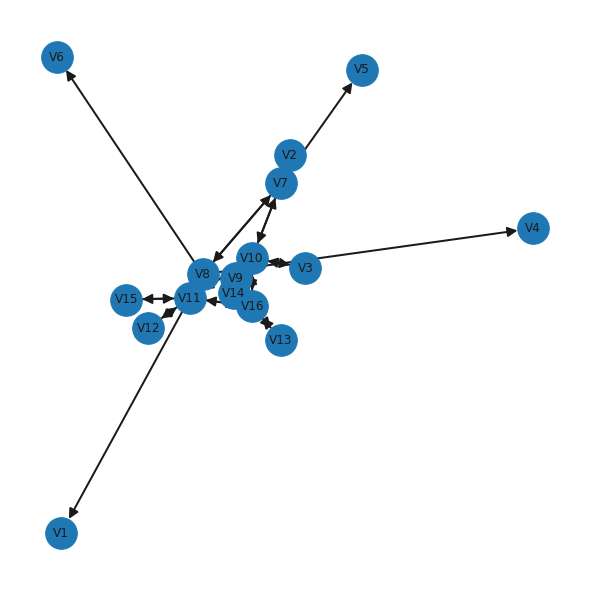

In [ ]:
plt.figure(figsize=(8,8))

nx.draw(graph_sim, with_labels=True, 
                arrowsize = 20, width =2,node_size=1000,pos=positions_every)

### SURROUND

In [ ]:
language = ParserThesis.parse_language_file('/content/STREL_surround.txt')

Parsing MLN language file /content/STREL_surround.txt


In [ ]:
ParserThesis.parse_to_kappy_observed_event_first_part('/content/STREL_NET.txt','/content/STREL_surround.txt','/STREL_model.txt')

Parsing network configuration file /content/STREL_NET.txt
Parsing MLN language file /content/STREL_surround.txt
Successfully exported model into Kappa: /STREL_model.txt


In [ ]:
with open('/STREL_model.txt','r') as f:
  lines = f.read().splitlines()
strel_text = ""
for line in lines:
   strel_text += line + '\\'
   print(line)

%agent: V1(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V2(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v7)
%agent: V3(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v10)
%agent: V4(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8)
%agent: V5(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v7, l1v6)
%agent: V6(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v8, l1v5)
%agent: V7(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v5, l1v8, l1v10, l1v2)
%agent: V8(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v6, l1v1, l1v7, l1v4)
%agent: V9(state{coord-Loc, router-Loc, blue_dev-Loc, coord-noLoc, router-noLoc, blue_dev-noLoc}, l1v14, l1v10)
%agent

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []
pattern = re.compile(r'noLoc')
pattern2 = re.compile(r'V[0-9]+')
pattern3 = re.compile(r'V[0-9]+')
pattern4 = re.compile(r'=[0-9]+')
simulation_traces = []
reached_events = []
total_nodes = []
total_edges = []
stop_value = int(language['surround property'][0].split('SURROUND')[1].split('&&')[0].strip().split('=')[1])


seeds = 100
updates = {}
while len(simulations_data) < number_of_traces:

  kappa_client = kappy.KappaStd()
  model_text =  strel_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[E] > {stop_value-1}",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  events_chain = [three_node_sim_list[0]]
  three_node_sim.index = range(len(three_node_sim))
  simulations_data.append(three_node_sim)
  three_nodes_event_chain = three_node_sim.iloc[1:,:]
  three_nodes_event_chain.index = range(len(three_nodes_event_chain))
  zoom_net = three_nodes_event_chain.iloc[:,7:(len(language['initial conditions'])+1)*len(language['states'])+1]
  
  for network in zoom_net.values:
    simulation_net = ''
    for elem in range(len(network)):
      if network[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}&"
    simulation_net = simulation_net[:-1]
    net_comp = simulation_net.split('&')
    for node in net_comp:
      if 'noLoc' not in node:
        location = pattern2.search(node).group()
        point = node
    unique_edges = []
    for edge in mln_data['edges'][1][0]:
      if edge not in unique_edges and (edge[1],edge[0]) not in unique_edges and edge[0] == location[1:]:
        unique_edges.append(edge)

    transformings = {}
    for rhs_node in unique_edges:
      for node2 in net_comp:
        if pattern2.search(node2).group()[1:] == rhs_node[1]:
          if point not in transformings: 
            transformings[point] = [node2]
          else:
            transformings[point].append(node2)
    for rule in language['rules']:
      if pattern.search(rule) != None: #LHS with 2 nodes
        splitter = pattern4.search(rule).group()
        lhs, rhs = rule.split('->')
        lhs_comp = lhs.split(splitter)
        rhs_product, rhs_rate = rhs.split('@')
        rhs_comp = rhs_product.split(splitter)
        for comp in range(len(lhs_comp)):
          lhs_comp[comp] = lhs_comp[comp].strip()
          rhs_comp[comp] = rhs_comp[comp].strip()
        if lhs_comp[0] in point:
          for match in transformings[point]:
            if lhs_comp[1] in match:
              copy = simulation_net[:]
              copy = copy.replace(f'{location}{lhs_comp[0]}', f'{location}{rhs_comp[0]}')
              copy = copy.replace(match, f"'{pattern3.search(match).group()}{rhs_comp[1]}'")
              if simulation_net not in updates:
                updates[simulation_net] = [copy]
              else:
                updates[simulation_net].append(copy)
    


  for net in updates:
    total_nodes.append(net)
    for connect in updates[net]:
      total_nodes.append(connect)
      total_edges.append((net,connect))
 


  if 1 in three_nodes_event_chain.property_surround.values:
    event_reached = three_nodes_event_chain[three_nodes_event_chain.property_surround.isin([1])]
    event_reached_index = three_nodes_event_chain[three_nodes_event_chain.property_surround.isin([1])].index[0]
    reached_net = ''
    for elem in range(len(event_reached.values)):
      if event_reached.values[0][elem] == 1:
        reached_net += f"{event_reached.columns[elem]}&"
    reached_net = reached_net[:-1]
    reached_events.append(reached_net)
    simulation_trace = ''
    for net in zoom_net.values[:event_reached_index+1]:
      simulation_net = ''
      for elem in range(len(net)):
        if net[elem] == 1 and not pattern.search(zoom_net.columns[elem]):
          simulation_net += f"{pattern2.search(zoom_net.columns[elem]).group()}"
      simulation_trace += f'{simulation_net}-'
    simulation_trace = simulation_trace[:-1]
    simulation_traces.append(simulation_trace)
  seeds += 1
  print(len(simulations_data))






1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = longest_simulation
  equalize_len_data.append(filled)

In [ ]:
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],'coord-Loc','router-Loc','blue_dev-Loc','coord-noLoc','router-noLoc','blue_dev-noLoc','V1coord-Loc','V1router-Loc','V1blue_dev-Loc',...,'V15blue_dev-noLoc','V16coord-Loc','V16router-Loc','V16blue_dev-Loc','V16coord-noLoc','V16router-noLoc','V16blue_dev-noLoc',property_surround,content_condition1_surround,content_condition2_surround
0,0.0,1.00,0.00,0.00,0.00,6.00,9.00,0.0,0.0,0.0,...,1.00,0.0,0.00,0.0,0.0,1.00,0.0,0.00,0.00,0.00
1,1.0,1.00,0.00,0.00,0.00,6.00,9.00,0.0,0.0,0.0,...,1.00,0.0,0.00,0.0,0.0,1.00,0.0,0.00,0.00,0.00
2,2.0,0.00,0.68,0.32,1.00,5.32,8.68,0.0,0.0,0.0,...,1.00,0.0,0.12,0.0,0.0,0.88,0.0,0.32,0.32,0.32
3,3.0,0.42,0.22,0.36,0.58,5.78,8.64,0.0,0.0,0.0,...,0.90,0.0,0.04,0.0,0.0,0.96,0.0,0.68,0.36,0.36
4,4.0,0.14,0.62,0.24,0.86,5.38,8.76,0.0,0.0,0.0,...,0.98,0.0,0.12,0.0,0.0,0.88,0.0,0.80,0.24,0.24
5,5.0,0.28,0.40,0.32,0.72,5.60,8.68,0.0,0.0,0.0,...,0.92,0.0,0.08,0.0,0.0,0.92,0.0,0.80,0.32,0.32


In [ ]:
surrounds = []
for sim in equalize_len_data:
  surrounds.append(sim['property_surround'][len(sim)-1])
if average_result.property_surround.values[-1] != 0 and average_result.property_surround.values[-1] != 1:
  print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")
else:
  print(f'property surround satisfied with probability {average_result.property_surround.values[-1]}')

surround property confidence interval is: (0.65280975408292, 0.9471902459170801)


In [ ]:
satisfying_traces = np.unique(simulation_traces)
for trac in satisfying_traces:
  print(f'location V10 satisfy the surround property with the following trace: {trac}')

location V10 satisfy the surround property with the following trace: V10-V11-V10-V14
location V10 satisfy the surround property with the following trace: V10-V11-V12
location V10 satisfy the surround property with the following trace: V10-V11-V15
location V10 satisfy the surround property with the following trace: V10-V14
location V10 satisfy the surround property with the following trace: V10-V16-V11-V12
location V10 satisfy the surround property with the following trace: V10-V16-V11-V15
location V10 satisfy the surround property with the following trace: V10-V16-V13
location V10 satisfy the surround property with the following trace: V10-V3
location V10 satisfy the surround property with the following trace: V10-V7-V10-V14
location V10 satisfy the surround property with the following trace: V10-V7-V2
location V10 satisfy the surround property with the following trace: V10-V7-V5-V6
location V10 satisfy the surround property with the following trace: V10-V9-V10-V3
location V10 satisfy 

In [ ]:
final_nets = []
for el in satisfying_traces:
  nodes = el.split('-')
  init, final = nodes[0],nodes[-1]
  intermediate = initial_net.replace('V6blue_dev-Loc','V6blue_dev-noLoc')
  nodes_inter = intermediate.split('&')
  for en in range(len(nodes_inter)):
    if final in nodes_inter[en]:
      nodes_inter[en] = nodes_inter[en].replace('noLoc','Loc')
  final_net = '&'.join(nodes_inter)
  final_nets.append(final_net.replace("",''))

In [ ]:
pattern2 = re.compile(r'V[0-9]+')
new_nodes = []
for el in updates:
    if el not in new_nodes:
      new_nodes.append(el)
    for el2 in updates[el]:
      if el2 not in new_nodes:
        new_nodes.append(el2)  
print(len(new_nodes))
new_edges = []
for el3 in updates:
  for el4 in updates[el3]:
    if (el3,el4) not in new_edges:
      new_edges.append((el3,el4))
print(len(new_edges))

graph_sim = nx.DiGraph()
graph_sim.add_nodes_from(new_nodes)
graph_sim.add_edges_from(new_edges)

16
34


In [ ]:
labels = {}
for node in graph_sim:
  elems = node.split('&')
  for el in elems:
    if 'noLoc' not in el:
      labels[node] = pattern2.search(el).group()
graph_sim = nx.relabel_nodes(graph_sim,labels)

In [ ]:
positions_surr = nx.spring_layout(graph_sim,seed=5)

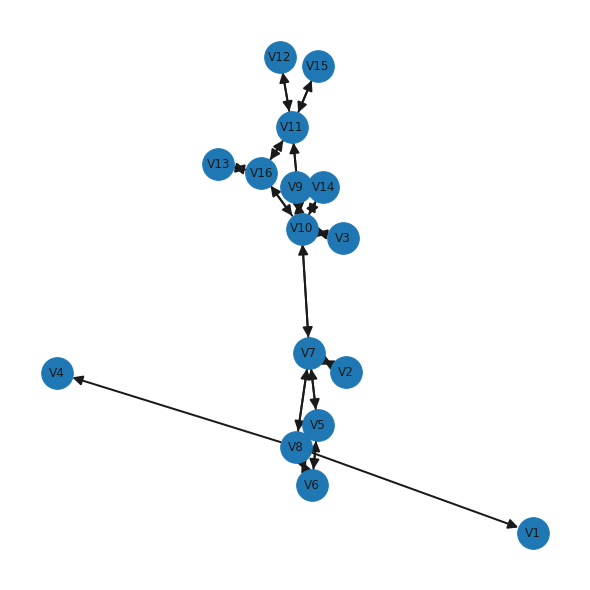

In [ ]:
plt.figure(figsize=(8,8))
nx.draw(graph_sim, with_labels=True, 
                arrowsize = 20, width =2,node_size=1000,pos=positions_surr)

In [ ]:
for trace in satisfying_traces:
  node_trace = trace.split('-')
  start, end = node_trace[0],node_trace[-1]
  if nx.shortest_path_length(graph_sim,start, end) <= 3:
    print(f'{trace} is a valid trace: distance start-end equal to {nx.shortest_path_length(graph_sim,start, end)}')

V10-V11-V10-V14 is a valid trace: distance start-end equal to 1
V10-V11-V12 is a valid trace: distance start-end equal to 2
V10-V11-V15 is a valid trace: distance start-end equal to 2
V10-V14 is a valid trace: distance start-end equal to 1
V10-V16-V11-V12 is a valid trace: distance start-end equal to 2
V10-V16-V11-V15 is a valid trace: distance start-end equal to 2
V10-V16-V13 is a valid trace: distance start-end equal to 2
V10-V3 is a valid trace: distance start-end equal to 1
V10-V7-V10-V14 is a valid trace: distance start-end equal to 1
V10-V7-V2 is a valid trace: distance start-end equal to 2
V10-V7-V5-V6 is a valid trace: distance start-end equal to 3
V10-V9-V10-V3 is a valid trace: distance start-end equal to 1
V10-V9-V14 is a valid trace: distance start-end equal to 1


# 1st ANALYSIS

## 1st EPIDEMICS WITH 20 NODES

In [ ]:
language = ParserThesis.parse_language_file("/content/1-node-language.txt")
language

Parsing MLN language file /content/1-node-language.txt


{'states': ['AS', 'AI', 'US'],
 'parameters': ['delta = 1', 'mu = 1', 'betaA = 1', 'betaU = 3', 'lamb = 1'],
 'initial conditions': ['1 = AI', '2 = US', '3 = US'],
 'rules': ['AS -> US @ delta',
  'AI -> AS @ mu',
  'AS =1 AI -> AI =1 AI @ betaA',
  'US =1 AI -> AI =1 AI @ betaU',
  'US =2 AI -> AS =2 AI @ lamb',
  'US =2 AS -> AS =2 AS @ lamb'],
 'views': ['AI', 'AS', 'US'],
 'simOptions': ['n = 1', 'e = 50', 'traces = 5000'],
 'reachability property': ['(1 * AI, =, 1) R e=3 && (2 * AI, =, 1)'],
 'escape property': ['E e=4 && (2 * AI, =, 0)'],
 'somewhere property': ['SOMEWHERE e=3 && (AS, >, 0)'],
 'everywhere property': [],
 'surround property': ['(1 * AI, =, 1) SURROUND e=4 && (AS, >, 0)']}

The procedure adopted to create the network is reported, the network used for the analysis is provided for reproducibility of the results.

In [ ]:
# models_mix = [ml.evolution_er(20),ml.evolution_er(20)] \
# pr_internal = [1, 1] \
# pr_external = [0, 0] \
# dependency = [ [1, 0], [0, 1]] 

In [ ]:
# generated_mix = ml.grow(20,20, models_mix, pr_internal,pr_external, dependency) \
# generated_mix 

In [ ]:
# layers = ml.to_nx_dict(generated_mix)

In [ ]:
# l = ml.layout_multiforce(generated_mix, gravity = [.5]) 
# ver = ml.vertices(generated_mix) 
# deg = [ml.degree(generated_mix, [a], [l])[0] for a,l in zip(ver['actor'],ver['layer'])] 
# ml.plot(generated_mix, layout = l, vertex_labels=[], vertex_size=deg) 

In [ ]:
# edge_list = ml.edges(generated_mix)

In [ ]:
# edge_list['from_actor'] = list(map(lambda x:str(int(x[1:])+1),edge_list['from_actor'])) 
# edge_list['to_actor'] = list(map(lambda x:str(int(x[1:])+1),edge_list['to_actor'])) 
# edge_list['from_layer'] = list(map(lambda x:str(int(x[1:])+1),edge_list['from_layer'])) 
# edge_list['to_layer'] = list(map(lambda x:str(int(x[1:])+1),edge_list['to_layer'])) 

In [ ]:
######## Generate compatible edge_list


# self_loops = [] 
# with open('/content/edge_list.txt','w') as f: 
#  for components in range(len(edge_list['from_actor'])): 
#        if edge_list['from_actor'][components] != edge_list['to_actor'][components]: 
#          f.writelines(f"{int(edge_list['from_actor'][components])},{int(edge_list['to_actor'][components])},{int(edge_list['from_layer'][components])}"+"\n") 
#        else: 
#          print(f'self loop at {components}') 

In [ ]:
# l1_nodes = [] 
# l2_nodes = [] 
# for node in range(len(edge_list['from_actor'])): 
#   if edge_list['from_layer'][node]=='1': 
#     l1_nodes.append(edge_list['from_actor'][node]) 
#     l1_nodes.append(edge_list['to_actor'][node]) 
#   else: 
#     l2_nodes.append(edge_list['from_actor'][node]) 
#     l2_nodes.append(edge_list['to_actor'][node]) 
# l1_nodes = list(np.unique(l1_nodes)) 
# l2_nodes = list(np.unique(l2_nodes)) 
# intersection = [value for value in l1_nodes if value in l2_nodes] 

In [ ]:
map_label = {1:'virus',2:'awareness'}

In [ ]:
# py3plex definition of edgelist for visualization

# self_loops = []
# with open('/content/edge_list_py3plex.txt','w') as f:
#  for components in range(len(edge_list['from_actor'])):
#        if edge_list['from_actor'][components] != edge_list['to_actor'][components]:
#          f.writelines(f"{int(edge_list['from_actor'][components])} {map_label[int(edge_list['from_layer'][components])]} {int(edge_list['to_actor'][components])} {map_label[int(edge_list['from_layer'][components])]}"+"\n")
#        else:
#          print(f'self loop at {components}')
#  for node in intersection:
#    f.writelines(f'{node} {map_label[1]} {node} {map_label[2]}\n')

-------------------- 
 Network splitting in progress 
 --------------------
Beginning parsing..
module 'scipy.sparse' has no attribute 'coo_array'
Using standard layout algorithm, fa2 not present on the system.


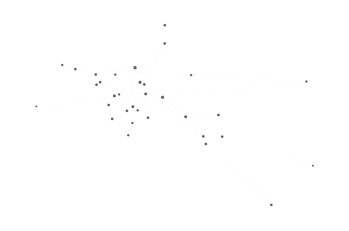

In [ ]:
 ## multilayer hairball

multilayer_network = multinet.multi_layer_network().load_network("/content/1st_20nodes_py3plex.txt",directed=True, input_type="multiedgelist")


## a simple hairball plot
multilayer_network.visualize_network(style="hairball",show=True,fig=(20,20))


-------------------- 
 Network splitting in progress 
 --------------------
module 'scipy.sparse' has no attribute 'coo_array'
Using standard layout algorithm, fa2 not present on the system.
module 'scipy.sparse' has no attribute 'coo_array'
Using standard layout algorithm, fa2 not present on the system.
Finished with layout..
MultiDiGraph with 16 nodes and 18 edges
MultiDiGraph with 17 nodes and 18 edges


100%|██████████| 1/1 [00:00<00:00, 30.83it/s]


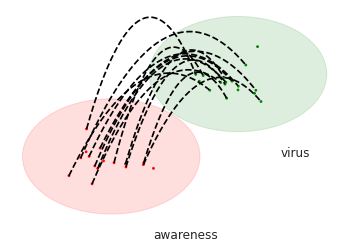

In [ ]:
multilayer_network.visualize_network(style="diagonal",show=True,fig=(20,20),alphachannel=1)

In [ ]:
mln_data = ParserThesis.parse_mln('/content/1st_20nodes_edgelist.txt')

Parsing network configuration file /content/1st_20nodes_edgelist.txt


In [ ]:
np.random.seed(1)
initial_states = np.random.choice(['US','AI','AS'],size=mln_data['actors'][1],replace=True,p=[.7,.1,.2])
language['initial conditions']
initial_states

array(['US', 'AI', 'US', 'US', 'US', 'US', 'US', 'US', 'US', 'US', 'US',
       'US', 'US', 'AS', 'US', 'US', 'US', 'US', 'US', 'US'], dtype='<U2')

In [ ]:
new_initial_conditions = []
for actor, state in zip(mln_data['actors'][0],initial_states):
  new_initial_conditions.append(f'{str(actor)} = {state}')
language['initial conditions'] = new_initial_conditions

### HIGHEST DEGREE NODES

Look for the highest degree node in layer 1 (phisical layer), assuming it is the most important node.

In [ ]:
phisical_layer = nx.DiGraph()
 
phisical_layer.add_nodes_from(mln_data['actors'][0])
phisical_layer.add_edges_from(mln_data['edges'][1][0])

In [ ]:
actor_degree = list(phisical_layer.degree())

In [ ]:
sorting_for_degree = sorted(actor_degree, key= lambda x:x[1],reverse=True)
sorting_for_degree 

[('9', 8),
 ('17', 8),
 ('1', 6),
 ('6', 6),
 ('13', 6),
 ('20', 6),
 ('4', 4),
 ('5', 4),
 ('8', 4),
 ('12', 4),
 ('15', 4),
 ('18', 4),
 ('3', 2),
 ('7', 2),
 ('10', 2),
 ('14', 2),
 ('16', 2),
 ('19', 2),
 ('2', 0),
 ('11', 0)]

In [ ]:
selected_highest_degree_nodes = []
max_degree = max(map(lambda x:x[1], sorting_for_degree))
i = 0
while sorting_for_degree[i][1] == max_degree:
  selected_highest_degree_nodes.append((sorting_for_degree[i][0], max_degree))
  i += 1
selected_highest_degree_nodes

[('9', 8), ('17', 8)]

#### SOMEWHERE PROPERTY:  SOME OF HIGHEST DEGREE NODES GET INFECTED WITHIN e=5

It identifies the probability that one of those nodes becomes infected according to a given distance function (let's specify it with respect to e = 5). Let's take a state AI as of interest for these nodes.

In [ ]:
# writing the new nodes of interesting somewhere property and overwriting in the language file:
new_somewhere_nodes = ''
state_of_interest = 'AI'
for node in selected_highest_degree_nodes:
  new_somewhere_nodes += f' {int(node[0])}*{state_of_interest} &'
new_somewhere_nodes = new_somewhere_nodes[:-1]
new_somewhere_nodes = new_somewhere_nodes.strip()
new_somewhere_nodes


'9*AI & 17*AI'

In [ ]:
stopper_value = 5
stopper_type = 'e'
operator = '>'
value = 0
new_somewhere = f'SOMEWHERE {stopper_type}={stopper_value} && ({new_somewhere_nodes}, {operator}, {value})'
new_somewhere

'SOMEWHERE e=5 && (9*AI & 17*AI, >, 0)'

We check the probability that in some network evolution one of those nodes becomes infected.

In [ ]:
language['somewhere property'] = [new_somewhere]

In [ ]:
# rewriting the language file + adjusting the parsing function instead of writing a new network file 

def parse_to_kappy_somewhere_focus(out_filename,mln_data,language):

    
    kappa_model = ''
    kappa_model += ParserThesis.kappa_parse_signatures(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_rules(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_variables(language) + '\n'
    kappa_model += ParserThesis.kappa_parse_observables(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_initial_conditions(mln_data, language) + '\n'

    if language['somewhere property'] != []:
      kappa_model += ParserThesis.kappa_parse_somewhere(mln_data, language) 

    
    with open(out_filename, 'w') as f:
        f.write(kappa_model)
    print(f'Successfully exported model into Kappa: {out_filename}')

In [ ]:
parse_to_kappy_somewhere_focus('/20-nodes-1st-epidemiology.txt',mln_data,language)

Successfully exported model into Kappa: /20-nodes-1st-epidemiology.txt


In [ ]:
with open('/20-nodes-1st-epidemiology.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line)

%agent: V1(state{AS, AI, US}, l1v10, l1v9, l1v17, l2v14, l2v4, l2v9)
%agent: V2(state{AS, AI, US}, l2v18, l2v7)
%agent: V3(state{AS, AI, US}, l1v6)
%agent: V4(state{AS, AI, US}, l1v13, l1v20, l2v1, l2v19, l2v7)
%agent: V5(state{AS, AI, US}, l1v19, l1v9, l2v7)
%agent: V6(state{AS, AI, US}, l1v8, l1v3, l1v9, l2v8, l2v17)
%agent: V7(state{AS, AI, US}, l1v15, l2v5, l2v9, l2v18, l2v4, l2v2)
%agent: V8(state{AS, AI, US}, l1v17, l1v6, l2v6)
%agent: V9(state{AS, AI, US}, l1v5, l1v15, l1v1, l1v6, l2v1, l2v7, l2v14)
%agent: V10(state{AS, AI, US}, l1v1, l2v15)
%agent: V11(state{AS, AI, US}, l2v18)
%agent: V12(state{AS, AI, US}, l1v20, l1v17, l2v15)
%agent: V13(state{AS, AI, US}, l1v14, l1v4, l1v17, l2v14, l2v17, l2v20)
%agent: V14(state{AS, AI, US}, l1v13, l2v13, l2v1, l2v9)
%agent: V15(state{AS, AI, US}, l1v9, l1v7, l2v10, l2v12)
%agent: V16(state{AS, AI, US}, l1v18)
%agent: V17(state{AS, AI, US}, l1v8, l1v13, l1v1, l1v12, l2v13, l2v6)
%agent: V18(state{AS, AI, US}, l1v20, l1v16, l2v19, l2v2, l2

In [ ]:
import kappy
kappa_client = kappy.KappaStd()
model_text =  small_epid_kappy_text[:-1].replace("\\","")
kappa_client.add_model_string(model_text)
kappa_client.project_parse()
sim_params = kappy.SimulationParameter(pause_condition=f"[T]>20",plot_period=0.01, seed = 10)
kappa_client.simulation_start(sim_params)
kappa_client.wait_for_simulation_stop()

{'simulation_info_progress': {'simulation_progress_time': 15.685841925279043,
  'simulation_progress_time_percentage': None,
  'simulation_progress_event': 227,
  'simulation_progress_event_percentage': None,
  'simulation_progress_tracked_events': None,
  'simulation_progress_is_running': False},
 'simulation_info_output': {'simulation_output_plot': 1569,
  'simulation_output_dins': 0,
  'simulation_output_file_lines': 0,
  'simulation_output_snapshots': 1,
  'simulation_output_inputs': None,
  'simulation_output_log_messages': 322}}

In [ ]:
results_three_node_sim = kappa_client.simulation_plot()
three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
three_node_sim = three_node_sim.sort_values(by = '[T]')
three_node_sim

,[T],AI,AS,US,property_somewhere,content_somewhere
1568,0.00,1.0,1.0,18.0,0.0,0.0
1567,0.01,1.0,1.0,18.0,0.0,0.0
1566,0.02,1.0,2.0,17.0,0.0,0.0
1565,0.03,1.0,2.0,17.0,0.0,0.0
1564,0.04,1.0,2.0,17.0,0.0,0.0
...,...,...,...,...,...,...
4,15.64,0.0,1.0,19.0,0.0,0.0
3,15.65,0.0,1.0,19.0,0.0,0.0
2,15.66,0.0,1.0,19.0,0.0,0.0
1,15.67,0.0,1.0,19.0,0.0,0.0


In [ ]:
def coloring_states(language,phisical_layer,new_somewhere_nodes):
  colors_states = []
  for item in language['initial conditions']:
    node, state = item.split('=')
    node = node.strip()
    state = state.strip()
    for numb in list(nx.nodes(phisical_layer)):
      if numb == node:
        if state == 'US':
          colors_states.append(10)
        elif state == 'AS':
          colors_states.append(20)
        elif state == 'AI':
          colors_states.append(30)
  nodes = new_somewhere_nodes.split('&')
  for item in nodes:
    node,state = item.split('*')
    node = node.strip()
    for numb in list(nx.nodes(phisical_layer)):
      if numb == node:
        colors_states[list(nx.nodes(phisical_layer)).index(numb)] += 50
  legend = {}
  for color in colors_states:
    if color == 10:
      legend[color] = 'initial state: US'
    elif color == 20:
      legend[color] = 'initial state: AS'
    elif color == 30:
      legend[color] = 'initial state: AI'
    elif color == 60:
      legend[color] = 'target node, intial state: US'
    elif color == 70:
      legend[color] = 'target node, intial state: AS'
    elif color == 80:
      legend[color] = 'target node, intial state: AI'
  return colors_states, legend

In [ ]:
zoom_net = three_node_sim.iloc[:,4:(len(language['initial conditions'])+1)*len(language['states'])+1]
pattern = re.compile(r'V[0-9]+')
simulation_path = []
for net in zoom_net.values:
  simulation_time = []
  for elem in range(len(net)):
    if net[elem] == 1:
      copy = zoom_net.columns[elem][:]
      node = pattern.search(copy).group()
      state = copy.replace(node,'')
      simulation_time.append(f"{node} = {state}")
  simulation_path.append(simulation_time)
for el in simulation_path[0]:
  if 'AI' in el:
    print(el)

In [ ]:
colors,legend_somewhere = coloring_states(language,phisical_layer,new_somewhere_nodes)
mapper = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
mapped = mapper.to_rgba(np.unique(colors))

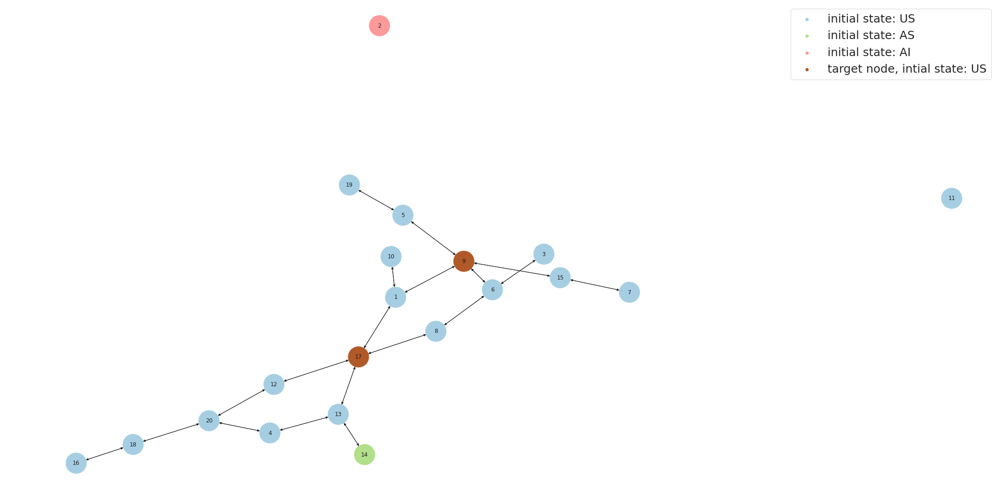

In [ ]:
plt.figure(figsize=(30, 15))
nx.draw(phisical_layer,node_color=colors, cmap=plt.get_cmap('Paired'), with_labels = True, node_size=2000)

for v in np.unique(colors):
    plt.scatter([],[], color=mapped[list(np.unique(colors)).index(v)], label = legend_somewhere[v])

plt.legend(fontsize=25)

#### ESCAPE PROPERTY: THE TOTAL AMOUNT OF INFECTED NODES IS LOWER THAN 6 UNTIL t=4

Relation between everywhre and escape property: in this analysis, everywhere property has been interpreted in a 'loose' way. In one case simulation, if the trace satisfies the property, then we assume that the property is satisfied """ everywhere """, but this everywhre is related to the simulated trace. Therefore, everywhere property checked on the single trace reduces to checking an escape property (-> there is a route such that satysfing the property).
Aggregating the result of several simulations, averaging escape results give us the probability of finding an escape route, averaging the reusults of everywhre gives us the same result, but intepreting """ everywhere """ in a strict way (the real meaning of the property), if the property has been always satisfied, then we can assume that the network satisfies the property "everywhere" (always interpreting the word in a meta-space), therefore in every network configurations (-> even if their evolution relies on time/evetnts )).

modifying the escape specification of the language...

In [ ]:
# input values and new specification composition

stopper_value = 4
stopper_type = 't'
operator = '<'
state = 'AI'
value = 6
new_escape = [f'E {stopper_type}={stopper_value} && ({state}, {operator}, {value})']

In [ ]:
language['escape property'] = new_escape
language

{'states': ['AS', 'AI', 'US'],
 'parameters': ['delta = 1', 'mu = 1', 'betaA = 1', 'betaU = 3', 'lamb = 1'],
 'initial conditions': ['1 = US',
  '2 = AI',
  '3 = US',
  '4 = US',
  '5 = US',
  '6 = US',
  '7 = US',
  '8 = US',
  '9 = US',
  '10 = US',
  '11 = US',
  '12 = US',
  '13 = US',
  '14 = AS',
  '15 = US',
  '16 = US',
  '17 = US',
  '18 = US',
  '19 = US',
  '20 = US'],
 'rules': ['AS -> US @ delta',
  'AI -> AS @ mu',
  'AS =1 AI -> AI =1 AI @ betaA',
  'US =1 AI -> AI =1 AI @ betaU',
  'US =2 AI -> AS =2 AI @ lamb',
  'US =2 AS -> AS =2 AS @ lamb'],
 'views': ['AI', 'AS', 'US'],
 'simOptions': ['n = 1', 'e = 50', 'traces = 5000'],
 'reachability property': ['(1 * AI, =, 1) R e=3 && (2 * AI, =, 1)'],
 'escape property': ['E t=4 && (AI, <, 6)'],
 'somewhere property': ['SOMEWHERE e=5 && (9*AI & 17*AI, >, 0)'],
 'everywhere property': [],
 'surround property': ['(1 * AI, =, 1) SURROUND e=4 && (AS, >, 0)']}

In [ ]:
def parse_to_kappy_escape_focus(out_filename,mln_data, language):

    
    kappa_model = ''
    kappa_model += ParserThesis.kappa_parse_signatures(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_rules(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_variables(language) + '\n'
    kappa_model += ParserThesis.kappa_parse_observables_first_part(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_initial_conditions(mln_data, language) + '\n'

    if language['escape property'] != []:
      kappa_model += ParserThesis.kappa_parse_escape(mln_data, language) 

    
    with open(out_filename, 'w') as f:
        f.write(kappa_model)
    print(f'Successfully exported model into Kappa: {out_filename}')

In [ ]:
parse_to_kappy_escape_focus('/20-nodes-2nd-epidemiology.txt',mln_data,language)

Successfully exported model into Kappa: /20-nodes-2nd-epidemiology.txt


In [ ]:
with open('/20-nodes-2nd-epidemiology.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line)

%agent: V1(state{AS, AI, US}, l1v10, l1v9, l1v17, l2v14, l2v4, l2v9)
%agent: V2(state{AS, AI, US}, l2v18, l2v7)
%agent: V3(state{AS, AI, US}, l1v6)
%agent: V4(state{AS, AI, US}, l1v13, l1v20, l2v1, l2v19, l2v7)
%agent: V5(state{AS, AI, US}, l1v19, l1v9, l2v7)
%agent: V6(state{AS, AI, US}, l1v8, l1v3, l1v9, l2v8, l2v17)
%agent: V7(state{AS, AI, US}, l1v15, l2v5, l2v9, l2v18, l2v4, l2v2)
%agent: V8(state{AS, AI, US}, l1v17, l1v6, l2v6)
%agent: V9(state{AS, AI, US}, l1v5, l1v15, l1v1, l1v6, l2v1, l2v7, l2v14)
%agent: V10(state{AS, AI, US}, l1v1, l2v15)
%agent: V11(state{AS, AI, US}, l2v18)
%agent: V12(state{AS, AI, US}, l1v20, l1v17, l2v15)
%agent: V13(state{AS, AI, US}, l1v14, l1v4, l1v17, l2v14, l2v17, l2v20)
%agent: V14(state{AS, AI, US}, l1v13, l2v13, l2v1, l2v9)
%agent: V15(state{AS, AI, US}, l1v9, l1v7, l2v10, l2v12)
%agent: V16(state{AS, AI, US}, l1v18)
%agent: V17(state{AS, AI, US}, l1v8, l1v13, l1v1, l1v12, l2v13, l2v6)
%agent: V18(state{AS, AI, US}, l1v20, l1v16, l2v19, l2v2, l2

In [ ]:
import kappy
kappa_client = kappy.KappaStd()
model_text =  small_epid_kappy_text[:-1].replace("\\","")
kappa_client.add_model_string(model_text)
kappa_client.project_parse()
sim_params = kappy.SimulationParameter(pause_condition=f"[T]>20",plot_period=0.01,seed=10)
kappa_client.simulation_start(sim_params)
kappa_client.wait_for_simulation_stop()

{'simulation_info_progress': {'simulation_progress_time': 15.685841925279043,
  'simulation_progress_time_percentage': None,
  'simulation_progress_event': 227,
  'simulation_progress_event_percentage': None,
  'simulation_progress_tracked_events': None,
  'simulation_progress_is_running': False},
 'simulation_info_output': {'simulation_output_plot': 1569,
  'simulation_output_dins': 0,
  'simulation_output_file_lines': 0,
  'simulation_output_snapshots': 1,
  'simulation_output_inputs': None,
  'simulation_output_log_messages': 322}}

In [ ]:
results_three_node_sim = kappa_client.simulation_plot()
three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
three_node_sim = three_node_sim.sort_values(by = '[T]')
three_node_sim

,[T],AI,AS,US,V1AI,V1AS,V1US,V2AI,V2AS,V2US,...,V18AS,V18US,V19AI,V19AS,V19US,V20AI,V20AS,V20US,property_escape,content_escape
1568,0.00,1.0,1.0,18.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0
1567,0.01,1.0,1.0,18.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0
1566,0.02,1.0,2.0,17.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0
1565,0.03,1.0,2.0,17.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0
1564,0.04,1.0,2.0,17.0,0.0,0.0,1.0,1.0,0.0,0.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,15.64,0.0,1.0,19.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
3,15.65,0.0,1.0,19.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
2,15.66,0.0,1.0,19.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
1,15.67,0.0,1.0,19.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0


In [ ]:
zoom_net = three_node_sim.iloc[:,4:(len(language['initial conditions'])+1)*len(language['states'])+1]
zoom_net

,V1AI,V1AS,V1US,V2AI,V2AS,V2US,V3AI,V3AS,V3US,V4AI,...,V17US,V18AI,V18AS,V18US,V19AI,V19AS,V19US,V20AI,V20AS,V20US
1568,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
1567,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
1566,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
1565,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
1564,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
3,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
2,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0
1,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0


In [ ]:
pattern = re.compile(r'V[0-9]+')
simulation_path = []
for net in zoom_net.values:
  simulation_time = []
  for elem in range(len(net)):
    if net[elem] == 1:
      copy = zoom_net.columns[elem][:]
      node = pattern.search(copy).group()
      state = copy.replace(node,'')
      simulation_time.append(f"{node} = {state}")
  simulation_path.append(simulation_time)
simulation_path

[['V1 = US',
  'V2 = AI',
  'V3 = US',
  'V4 = US',
  'V5 = US',
  'V6 = US',
  'V7 = US',
  'V8 = US',
  'V9 = US',
  'V10 = US',
  'V11 = US',
  'V12 = US',
  'V13 = US',
  'V14 = AS',
  'V15 = US',
  'V16 = US',
  'V17 = US',
  'V18 = US',
  'V19 = US',
  'V20 = US'],
 ['V1 = US',
  'V2 = AI',
  'V3 = US',
  'V4 = US',
  'V5 = US',
  'V6 = US',
  'V7 = US',
  'V8 = US',
  'V9 = US',
  'V10 = US',
  'V11 = US',
  'V12 = US',
  'V13 = US',
  'V14 = AS',
  'V15 = US',
  'V16 = US',
  'V17 = US',
  'V18 = US',
  'V19 = US',
  'V20 = US'],
 ['V1 = US',
  'V2 = AI',
  'V3 = US',
  'V4 = US',
  'V5 = US',
  'V6 = US',
  'V7 = AS',
  'V8 = US',
  'V9 = US',
  'V10 = US',
  'V11 = US',
  'V12 = US',
  'V13 = US',
  'V14 = AS',
  'V15 = US',
  'V16 = US',
  'V17 = US',
  'V18 = US',
  'V19 = US',
  'V20 = US'],
 ['V1 = US',
  'V2 = AI',
  'V3 = US',
  'V4 = US',
  'V5 = US',
  'V6 = US',
  'V7 = AS',
  'V8 = US',
  'V9 = US',
  'V10 = US',
  'V11 = US',
  'V12 = US',
  'V13 = US',
  'V14 = AS

In [ ]:
def coloring_states_state_condition(phisical_layer,step,time):
  colors_states = []
  for item in step:
    node, state = item.split('=')
    node = node[1:].strip()
    state = state.strip()
    if state == 'US':
      colors_states.append(10)
    elif state == 'AS':
      colors_states.append(20)
    elif state == 'AI':
      colors_states.append(30) 
  legend = {}
  for color in colors_states:
    if color == 10:
      legend[color] = f'US, time {np.round(time,2)}'
    elif color == 20:
      legend[color] = f'AS, time {np.round(time,2)}'
    elif color == 30:
      legend[color] = f'AI, time {np.round(time,2)}'
  return colors_states, legend

In [ ]:
positions = nx.spring_layout(phisical_layer,seed=15)

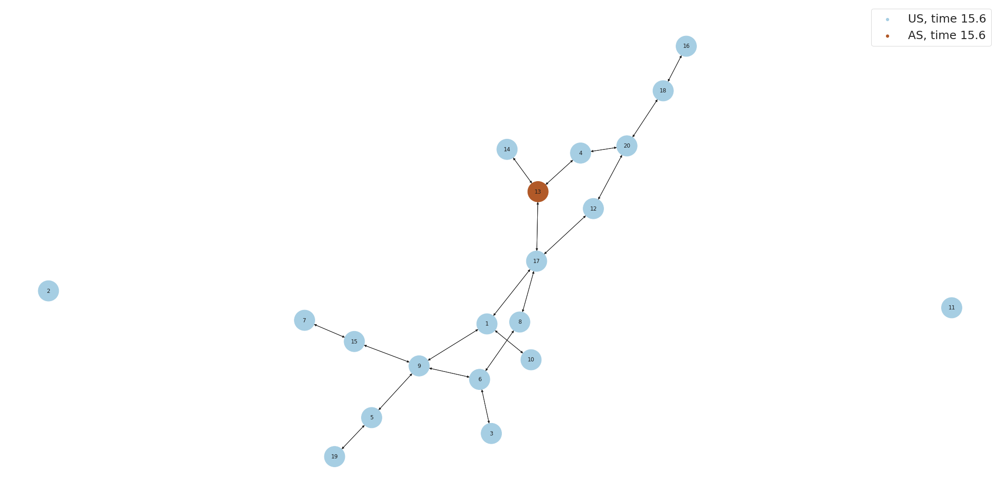

In [ ]:
for sim in range(0,len(simulation_path),10):
  col,leg = coloring_states_state_condition(phisical_layer,simulation_path[sim],sim*0.01)
  mapper = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
  mapped = mapper.to_rgba(np.unique(col))
  plt.figure(figsize=(30, 15))
  nx.draw(phisical_layer,node_color=col, cmap=plt.get_cmap('Paired'), with_labels = True, node_size=2000, pos = positions)
  for v in np.unique(col):
      plt.scatter([],[], color=mapped[list(np.unique(col)).index(v)], label = leg[v])
  plt.legend(fontsize=25)
  plt.show()
  clear_output(wait=True)
 # if three_node_sim.loc[len(three_node_sim) - 1 -sim,]['AI'] >= 6:
 #   break



##### REPLICATE RESULTS AND EVRYWHERE PROPERTY

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []
seeds = 0

while len(simulations_data) < 100:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition="[T] > 20",plot_period=0.01, seed = seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  simulations_info.append(kappa_client.wait_for_simulation_stop())
  results_three_node_sim = kappa_client.simulation_plot()
  simulations_plot.append(results_three_node_sim)
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  three_node_sim.index = range(len(three_node_sim))
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  events_chain = [three_node_sim_list[0]]
  simulations_data.append(three_node_sim)
  seeds += 1

In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 


# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  filled['[T]'] = list(map(lambda x : x*0.01, longest_simulation))
  equalize_len_data.append(filled)

In [ ]:
average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
average_result

,[T],AI,AS,US,V1AI,V1AS,V1US,V2AI,V2AS,V2US,...,V18AS,V18US,V19AI,V19AS,V19US,V20AI,V20AS,V20US,property_escape,content_escape
0,0.00,1.00,1.00,18.00,0.0,0.00,1.00,1.00,0.00,0.00,...,0.00,1.00,0.0,0.00,1.00,0.0,0.00,1.00,1.0,1.00
1,0.01,0.99,1.04,17.97,0.0,0.00,1.00,0.99,0.01,0.00,...,0.01,0.99,0.0,0.00,1.00,0.0,0.00,1.00,1.0,0.99
2,0.02,0.98,1.12,17.90,0.0,0.02,0.98,0.98,0.02,0.00,...,0.03,0.97,0.0,0.00,1.00,0.0,0.00,1.00,1.0,0.98
3,0.03,0.97,1.16,17.87,0.0,0.03,0.97,0.97,0.03,0.00,...,0.04,0.96,0.0,0.00,1.00,0.0,0.00,1.00,1.0,0.97
4,0.04,0.95,1.27,17.78,0.0,0.04,0.96,0.95,0.04,0.01,...,0.05,0.95,0.0,0.00,1.00,0.0,0.00,1.00,1.0,0.95
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2031,20.31,0.01,3.79,16.20,0.0,0.32,0.68,0.01,0.37,0.62,...,0.29,0.71,0.0,0.25,0.75,0.0,0.19,0.81,1.0,0.01
2032,20.32,0.01,3.79,16.20,0.0,0.32,0.68,0.01,0.37,0.62,...,0.29,0.71,0.0,0.25,0.75,0.0,0.19,0.81,1.0,0.01
2033,20.33,0.01,3.79,16.20,0.0,0.32,0.68,0.01,0.37,0.62,...,0.29,0.71,0.0,0.25,0.75,0.0,0.19,0.81,1.0,0.01
2034,20.34,0.01,3.79,16.20,0.0,0.32,0.68,0.01,0.37,0.62,...,0.29,0.71,0.0,0.25,0.75,0.0,0.19,0.81,1.0,0.01


In [ ]:
escapes = []
for sim in equalize_len_data:
  escapes.append(sim['property_escape'].values[-1])
print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")

escape property confidence interval is: (nan, nan)


/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


In [ ]:
if average_result.property_escape.values[-1] == 1:
  print('everywhere property satisfied: the intial network configuration always escaped the condition')
else:
  print('everywhere property not satisfied: the intial network configuration has not always escaped the condition')

everywhere property satisfied: the intial network configuration always escaped the condition


In [ ]:
er_time5 = average_result[average_result['[T]'] == 5.0]
er_time10 = average_result[average_result['[T]'] == 10.0]
er_time10


,[T],AI,AS,US,V1AI,V1AS,V1US,V2AI,V2AS,V2US,...,V18AS,V18US,V19AI,V19AS,V19US,V20AI,V20AS,V20US,property_escape,content_escape
1000,10.0,0.01,4.9,15.09,0.0,0.48,0.52,0.01,0.5,0.49,...,0.39,0.61,0.0,0.4,0.6,0.0,0.15,0.85,1.0,0.01


## 2nd EPIDEMICS WITH 20 NODES

Changing the showcase to change the structure of the network..

In [ ]:
# models_mix2 = [ml.evolution_pa(3,1),ml.evolution_pa(3,1)]
# pr_internal = [1, 1]
# pr_external = [0, 0]
# dependency = [ [1, 0], [0, 1]]

In [ ]:
# generated_mix2 = ml.grow(20,20, models_mix2, pr_internal,pr_external, dependency)
# generated_mix2

In [ ]:
# l2 = ml.layout_multiforce(generated_mix2, gravity = [.5])
# ver2 = ml.vertices(generated_mix2)
# deg2 = [ml.degree(generated_mix2, [a], [l])[0] for a,l in zip(ver2['actor'],ver2['layer'])]
# ml.plot(generated_mix2, layout = l2, vertex_labels=[], vertex_size=deg2)

In [ ]:
# edge_list2 = ml.edges(generated_mix2)
# edge_list2['from_actor'] = list(map(lambda x:str(int(x[1:])+1),edge_list2['from_actor']))
# edge_list2['to_actor'] = list(map(lambda x:str(int(x[1:])+1),edge_list2['to_actor']))
# edge_list2['from_layer'] = list(map(lambda x:str(int(x[1:])+1),edge_list2['from_layer']))
# edge_list2['to_layer'] = list(map(lambda x:str(int(x[1:])+1),edge_list2['to_layer']))

In [ ]:
######## Generate  compatible edge_list

# self_loops2 = []
# with open('/content/edge_list2.txt','w') as f:
#  for components in range(len(edge_list2['from_actor'])):
#        if edge_list2['from_actor'][components] != edge_list2['to_actor'][components]:
#          f.writelines(f"{int(edge_list2['from_actor'][components])},{int(edge_list2['to_actor'][components])},{int(edge_list2['from_layer'][components])}"+"\n")
#        else:
#          print(f'self loop at {components}')

In [ ]:
mln_data = ParserThesis.parse_mln('/content/2nd_20nodes_edgelist.txt')

Parsing network configuration file /content/2nd_20nodes_edgelist.txt


### HIGHEST DEGREE NODES

Here it is considered the "total degree" (-> degree of the first layer + degree of the second layer).

In [ ]:
phisical_layer2 = nx.DiGraph()
 
phisical_layer2.add_nodes_from(mln_data['actors'][0])
phisical_layer2.add_edges_from(mln_data['edges'][1][0])

virtual_layer2 = nx.DiGraph()
 
virtual_layer2.add_nodes_from(mln_data['actors'][0])
virtual_layer2.add_edges_from(mln_data['edges'][1][1])

In [ ]:
actor_degree2 = list(map(lambda x:(x[0][0], (x[0][1] + x[1][1])//2), list(zip(list(phisical_layer2.degree),list(virtual_layer2.degree)))))
actor_degree2

[('1', 6),
 ('2', 2),
 ('3', 10),
 ('4', 2),
 ('5', 4),
 ('6', 7),
 ('7', 5),
 ('8', 10),
 ('9', 4),
 ('10', 2),
 ('11', 2),
 ('12', 3),
 ('13', 3),
 ('14', 5),
 ('15', 2),
 ('16', 2),
 ('17', 2),
 ('18', 2),
 ('19', 4),
 ('20', 3)]

In [ ]:
sorting_for_degree2 = sorted(actor_degree2, key= lambda x:x[1])
sorting_for_degree2 

[('2', 2),
 ('4', 2),
 ('10', 2),
 ('11', 2),
 ('15', 2),
 ('16', 2),
 ('17', 2),
 ('18', 2),
 ('12', 3),
 ('13', 3),
 ('20', 3),
 ('5', 4),
 ('9', 4),
 ('19', 4),
 ('7', 5),
 ('14', 5),
 ('1', 6),
 ('6', 7),
 ('3', 10),
 ('8', 10)]

In [ ]:
highest_degree_node_pa = sorting_for_degree2[-1]
highest_degree_node_pa

('8', 10)

### REACHABILITY PROPERTY: MAKE THE HIGHEST DEGREE NODE 'AS' WITHOUT BEING PREVIOUSLY INFECTED WITHIN 3 secs

In [ ]:
state1 = 'AI'
state2 = 'AS'
first_reach_nodes = f'{highest_degree_node_pa[0]}*{state1}'
second_reach_nodes = f'{highest_degree_node_pa[0]}*{state2}'
stopper_value = 3
stopper_type = 't'
operator1 = '='
operator2 = '='
value1 = 0
value2= 1
new_reach = f'({first_reach_nodes}, {operator1}, {value1}) R {stopper_type}={stopper_value} && ({second_reach_nodes}, {operator2}, {value2})'
new_reach

'(8*AI, =, 0) R t=3 && (8*AS, =, 1)'

In [ ]:
# make sure that highest degree node is not AS or AI (--> avoid to make the property meaningless)
#np.random.seed(1)
#initial_states = np.random.choice(['US','AI','AS'],size=len(ml.actors(generated_mix2)),replace=True,p=[.7,.1,.2])
#language['initial conditions']
#initial_states

#new_initial_conditions = []
#for actor, state in zip(range(len(ml.actors(generated_mix))),initial_states):
#  new_initial_conditions.append(f'{str(actor+1)} = {state}')
#language['initial conditions'] = new_initial_conditions




for elem in range(len(language['initial conditions'])):
  if f'{highest_degree_node_pa[0]}' in language['initial conditions'][elem]:
    node,state = language['initial conditions'][elem].split('=')
    node = node.strip()
    state = state.strip()
    state = state.replace(state,'US')
    language['initial conditions'][elem] = f'{node} = {state}'
language['initial conditions']

['1 = US',
 '2 = AI',
 '3 = US',
 '4 = US',
 '5 = US',
 '6 = US',
 '7 = US',
 '8 = US',
 '9 = US',
 '10 = US',
 '11 = US',
 '12 = US',
 '13 = US',
 '14 = AS',
 '15 = US',
 '16 = US',
 '17 = US',
 '18 = US',
 '19 = US',
 '20 = US']

In [ ]:
language['reachability property'][0] = new_reach

### SURROUND PROPERTY: NODE 1 CAN'T ESCAPE 'AI' UNLESS AT MOST 50% OF ITS NEIGHBOURS IN THE PHISICAL LAYER ARE IN STATE 'AI' AND THE ESCAPE HAPPENS ANYWAY WITHIN e=10.

In [ ]:
language['initial conditions'][0] = '1 = AI'
language

{'states': ['AS', 'AI', 'US'],
 'parameters': ['delta = 1', 'mu = 1', 'betaA = 1', 'betaU = 3', 'lamb = 1'],
 'initial conditions': ['1 = AI',
  '2 = AI',
  '3 = US',
  '4 = US',
  '5 = US',
  '6 = US',
  '7 = US',
  '8 = US',
  '9 = US',
  '10 = US',
  '11 = US',
  '12 = US',
  '13 = US',
  '14 = AS',
  '15 = US',
  '16 = US',
  '17 = US',
  '18 = US',
  '19 = US',
  '20 = US'],
 'rules': ['AS -> US @ delta',
  'AI -> AS @ mu',
  'AS =1 AI -> AI =1 AI @ betaA',
  'US =1 AI -> AI =1 AI @ betaU',
  'US =2 AI -> AS =2 AI @ lamb',
  'US =2 AS -> AS =2 AS @ lamb'],
 'views': ['AI', 'AS', 'US'],
 'simOptions': ['n = 1', 'e = 50', 'traces = 5000'],
 'reachability property': ['(8*AI, =, 0) R t=3 && (8*AS, =, 1)'],
 'escape property': ['E t=4 && (AI, <, 6)'],
 'somewhere property': ['SOMEWHERE e=5 && (9*AI & 17*AI, >, 0)'],
 'everywhere property': [],
 'surround property': ['(1 * AI, =, 1) SURROUND e=4 && (AS, >, 0)']}

In [ ]:
# building the new surround property

pattern = re.compile(r'[0-9]+')
cond1, cond2 = language['surround property'][0].split('SURROUND')
cond1 = cond1.split(',')
cond1[0] = cond1[0].replace(pattern.search(cond1[0]).group(),'1')


neigs = list(phisical_layer2.neighbors('1'))
state_interest = 'AI'
states_cond2 = ''
for neig in neigs:
  states_cond2 += f'{neig}*{state_interest} &'
states_cond2 = states_cond2[:-1].strip()

stop_type = 'e'
stop_value = 10
op = '<'
value = int(0.5*len(neigs)+1)
new_surround = ','.join(cond1) + f'SURROUND {stop_type}={stop_value} && ({states_cond2},{op},{value})' 
language['surround property'][0] = new_surround
new_surround

'(1 * AI, =, 1) SURROUND e=10 && (9*AI &12*AI,<,2)'

### ANALYSING REACHABILITY

In [ ]:
def parse_to_kappy_reachability_surround_focus(network_filename,out_filename,mln_data, language):

    
    kappa_model = ''
    kappa_model += ParserThesis.kappa_parse_signatures(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_rules(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_variables(language) + '\n'
    kappa_model += ParserThesis.kappa_parse_observables_first_part(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_initial_conditions(mln_data, language) + '\n'

    if language['reachability property'] != []:
      kappa_model += ParserThesis.kappa_parse_reachability(mln_data, language) 
    if language['surround property'] != []:
      kappa_model += ParserThesis.kappa_parse_surround(mln_data, language,network_filename)

    
    with open(out_filename, 'w') as f:
        f.write(kappa_model)
    print(f'Successfully exported model into Kappa: {out_filename}')

In [ ]:
parse_to_kappy_reachability_surround_focus('/content/2nd_20nodes_edgelist.txt','/2nd-20nodes-epidemiology.txt',mln_data,language)

Successfully exported model into Kappa: /2nd-20nodes-epidemiology.txt


In [ ]:
with open('/2nd-20nodes-epidemiology.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line)

%agent: V1(state{AS, AI, US}, l1v9, l1v12, l2v3, l2v5, l2v6, l2v20)
%agent: V2(state{AS, AI, US}, l1v9, l2v3)
%agent: V3(state{AS, AI, US}, l1v7, l2v19, l2v9, l2v7, l2v15, l2v4, l2v1, l2v8, l2v2, l2v16)
%agent: V4(state{AS, AI, US}, l1v14, l2v3)
%agent: V5(state{AS, AI, US}, l1v6, l2v11, l2v14, l2v1)
%agent: V6(state{AS, AI, US}, l1v15, l1v9, l1v5, l1v8, l1v14, l1v7, l2v1)
%agent: V7(state{AS, AI, US}, l1v8, l1v20, l1v3, l1v6, l2v3)
%agent: V8(state{AS, AI, US}, l1v11, l1v7, l1v19, l1v13, l1v6, l1v10, l2v13, l2v19, l2v3, l2v12)
%agent: V9(state{AS, AI, US}, l1v6, l1v1, l1v2, l2v3)
%agent: V10(state{AS, AI, US}, l1v8, l2v20)
%agent: V11(state{AS, AI, US}, l1v8, l2v5)
%agent: V12(state{AS, AI, US}, l1v1, l2v8, l2v18)
%agent: V13(state{AS, AI, US}, l1v8, l2v8, l2v17)
%agent: V14(state{AS, AI, US}, l1v16, l1v4, l1v6, l1v17, l2v5)
%agent: V15(state{AS, AI, US}, l1v6, l2v3)
%agent: V16(state{AS, AI, US}, l1v14, l2v3)
%agent: V17(state{AS, AI, US}, l1v14, l2v13)
%agent: V18(state{AS, AI, US},

In [ ]:
plot_periods = [0.1,0.01,0.001, 0.0001, 0.00001]
i = 0
kappa_client = kappy.KappaStd()
model_text =  small_epid_kappy_text[:-1].replace("\\","")
kappa_client.add_model_string(model_text)
kappa_client.project_parse()
sim_params = kappy.SimulationParameter(pause_condition=f"[T] > 10",plot_period=plot_periods[i],seed=10)
kappa_client.simulation_start(sim_params)
kappa_client.wait_for_simulation_stop()
results_three_node_sim = kappa_client.simulation_plot()
three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
three_node_sim = three_node_sim.sort_values(by = '[T]')
happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
events_chain = [three_node_sim_list[0]]
for rilevation in range(len(three_node_sim_list[:-1])):
  if three_node_sim_list[rilevation] == three_node_sim_list[rilevation+1]:
    continue
  else:
    events_chain.append(three_node_sim_list[rilevation+1])
while happened_events != len(events_chain):
  i += 1
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[T] > 5",plot_period=plot_periods[i],seed=10)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  events_chain = [three_node_sim_list[0]]
  for rilevation in range(len(three_node_sim_list[:-1])):
    if three_node_sim_list[rilevation] == three_node_sim_list[rilevation+1]:
      continue
    else:
      events_chain.append(three_node_sim_list[rilevation+1]) 
if happened_events == len(events_chain):
  print(f'required plot period: {plot_periods[i]}')
else:
  print(f'required plot period not found')


required plot period: 0.0001


In [ ]:
import kappy
kappa_client = kappy.KappaStd()
model_text =  small_epid_kappy_text[:-1].replace("\\","")
kappa_client.add_model_string(model_text)
kappa_client.project_parse()
sim_params = kappy.SimulationParameter(pause_condition=f"[T]>10",plot_period=plot_periods[i],seed=10)
kappa_client.simulation_start(sim_params)
kappa_client.wait_for_simulation_stop()

{'simulation_info_progress': {'simulation_progress_time': 10.14620961167387,
  'simulation_progress_time_percentage': None,
  'simulation_progress_event': 349,
  'simulation_progress_event_percentage': None,
  'simulation_progress_tracked_events': None,
  'simulation_progress_is_running': False},
 'simulation_info_output': {'simulation_output_plot': 101463,
  'simulation_output_dins': 0,
  'simulation_output_file_lines': 0,
  'simulation_output_snapshots': 0,
  'simulation_output_inputs': None,
  'simulation_output_log_messages': 234}}

In [ ]:
results_three_node_sim = kappa_client.simulation_plot()
three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
three_node_sim = three_node_sim.sort_values(by = '[T]')
three_node_sim

,[T],AI,AS,US,V1AI,V1AS,V1US,V2AI,V2AS,V2US,...,V19US,V20AI,V20AS,V20US,property_reachability,content_condition1,content_condition2,property_surround,content_condition1_surround,content_condition2_surround
101462,0.0000,2.0,1.0,17.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
101461,0.0001,2.0,1.0,17.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
101460,0.0002,2.0,1.0,17.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
101459,0.0003,2.0,1.0,17.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
101458,0.0004,2.0,1.0,17.0,1.0,0.0,0.0,1.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4,10.1458,6.0,10.0,4.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
3,10.1459,6.0,10.0,4.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
2,10.1460,6.0,10.0,4.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0
1,10.1461,6.0,10.0,4.0,0.0,1.0,0.0,0.0,1.0,0.0,...,0.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0


In [ ]:
zoom_net2 = three_node_sim.iloc[:,4:(len(language['initial conditions'])+1)*len(language['states'])+1]
pattern = re.compile(r'V[0-9]+')
simulation_path2 = []
for net in zoom_net2.values:
  simulation_time = []
  for elem in range(len(net)):
    if net[elem] == 1:
      copy = zoom_net2.columns[elem][:]
      node = pattern.search(copy).group()
      state = copy.replace(node,'')
      simulation_time.append(f"{node} = {state}")
  simulation_path2.append(simulation_time)

In [ ]:
nodes1, second = new_reach.split('&&')
nodes_state2 = second.split('&')
interesting_nodes = []
for el in nodes_state2:
  node, state = el.split('*')
  node = node.strip()
  interesting_nodes.append(node.strip('()'))
colors_states = []
for item in simulation_path[0]:
  node, state = item.split('=')
  node = node[1:].strip()
  state = state.strip()
  if state == 'US':
    colors_states.append(10)
  elif state == 'AS':
    colors_states.append(20)
  elif state == 'AI':
    colors_states.append(30) 
  if node in interesting_nodes:
    colors_states.append(50)
colors_states

[10,
 30,
 10,
 10,
 10,
 10,
 10,
 10,
 50,
 10,
 10,
 10,
 10,
 10,
 20,
 10,
 10,
 10,
 10,
 10,
 10]

In [ ]:
def coloring_states_state_condition_reach(new_reach, step, time):
  nodes1, second = new_reach.split('&&')
  nodes_state2 = second.split('&')
  interesting_nodes = []
  for el in nodes_state2:
    node, state = el.split('*')
    node = node.strip()
    interesting_nodes.append(node.strip('()'))
  colors_states = []
  for item in step:
    node, state = item.split('=')
    node = node[1:].strip()
    state = state.strip()
    acc = 0
    if state == 'US':
      acc += 10
    elif state == 'AS':
      acc += 20
    elif state == 'AI':
      acc += 30 
    if node in interesting_nodes:
      acc += 50
    colors_states.append(acc)

  legend = {}
  for color in colors_states:
    if color == 10:
      legend[color] = f'US, time {np.round(time,2)}'
    elif color == 20:
      legend[color] = f'AS, time {np.round(time,2)}'
    elif color == 30:
      legend[color] = f'AI, time {np.round(time,2)}'
    elif color == 60:
      legend[color] = 'target node, state: US'
    elif color == 70:
      legend[color] = 'target node, state: AS'
    elif color == 80:
      legend[color] = 'target node, state: AI'
  return colors_states, legend

In [ ]:
virtual_layer2 = nx.Graph()
virtual_layer2.add_nodes_from(mln_data['actors'][0])
virtual_layer2.add_edges_from(mln_data['edges'][1][1])

In [ ]:
positions = nx.spring_layout(phisical_layer,seed=20)

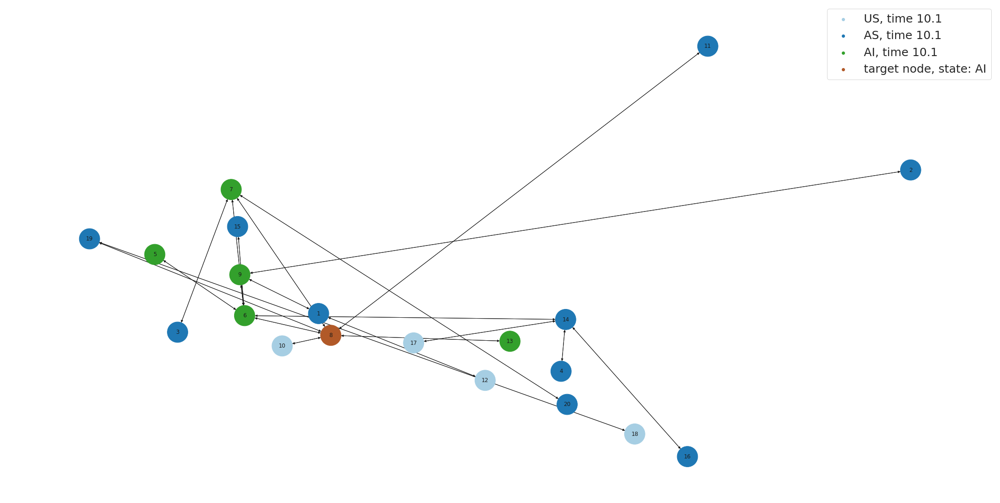

In [ ]:
for sim in range(0,len(simulation_path2),1000):
  col,leg = coloring_states_state_condition_reach(new_reach,simulation_path2[sim],sim*0.0001)
  mapper = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
  mapped = mapper.to_rgba(np.unique(col))
  plt.figure(figsize=(30, 15))
  nx.draw(phisical_layer2,node_color=col, cmap=plt.get_cmap('Paired'), with_labels = True, node_size=2000, pos = positions)
  for v in np.unique(col):
      plt.scatter([],[], color=mapped[list(np.unique(col)).index(v)], label = leg[v])
  plt.legend(fontsize=25)
  plt.show()
  clear_output(wait=True)

  



### ANALYSING SURROUND

In [ ]:
def coloring_states_state_condition(phisical_layer,step,time,first_cond_node, neigs):
  colors_states = []
  for item in step:
    node, state = item.split('=')
    node = node[1:].strip()
    state = state.strip()
    acc = 0
    if state == 'US':
      acc += 10
    elif state == 'AS':
      acc += 20
    elif state == 'AI':
      acc += 30 
    if node in neigs:
      acc += 100
    if node == first_cond_node:
      acc += 200
    colors_states.append(acc) 
  legend = {}
  for color in colors_states:
    if color == 10:
      legend[color] = f'US, time {np.round(time,2)}'
    elif color == 20:
      legend[color] = f'AS, time {np.round(time,2)}'
    elif color == 30:
      legend[color] = f'AI, time {np.round(time,2)}'
    elif color == 110:
      legend[color] = f'US, neighbor, time {np.round(time,2)}'
    elif color == 120:
      legend[color] = f'AS, neighbor, time {np.round(time,2)}'
    elif color == 130:
      legend[color] = f'AI, neighbor, time {np.round(time,2)}'   
    elif color == 210:
      legend[color] = f'US, first_node_condition, time {np.round(time,2)}'
    elif color == 220:
      legend[color] = f'AS, first_node_condition, time {np.round(time,2)}'
    elif color == 230:
      legend[color] = f'AI, first_node_condition, time {np.round(time,2)}'
  return colors_states, legend

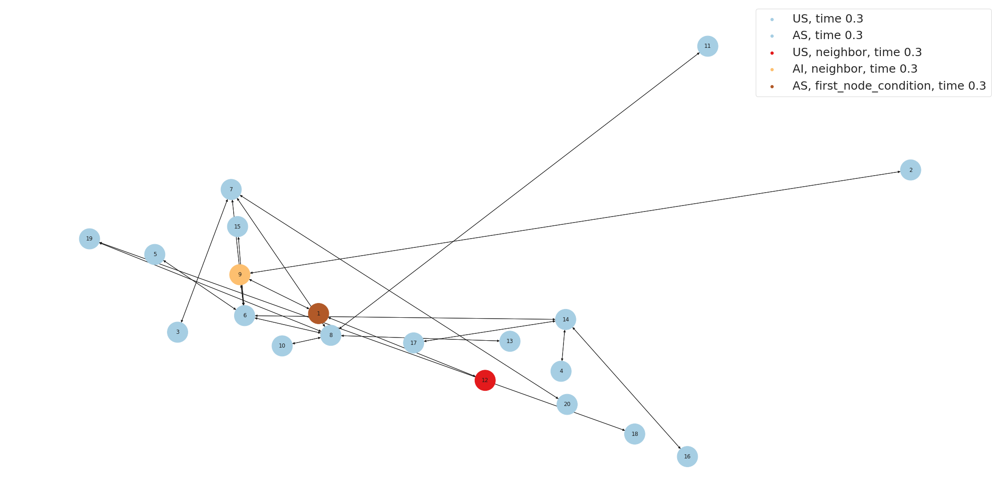

In [ ]:
for sim in range(0,len(simulation_path2),1000):
  col,leg = coloring_states_state_condition(phisical_layer2,simulation_path2[sim],sim*0.0001,'1',neigs)
  mapper = plt.cm.ScalarMappable(cmap=plt.get_cmap('Paired'))
  mapped = mapper.to_rgba(np.unique(col))
  plt.figure(figsize=(30, 15))
  nx.draw(phisical_layer2,node_color=col, cmap=plt.get_cmap('Paired'), with_labels = True, node_size=2000, pos = positions)
  for v in np.unique(col):
      plt.scatter([],[], color=mapped[list(np.unique(col)).index(v)], label = leg[v])
  plt.legend(fontsize=25)
  plt.show()
  clear_output(wait=True)
  if three_node_sim.loc[:,'content_condition1_surround'].values[sim] == 0:
    break

#### DISTANCE MEASURE: SHORTER PATH LENGTH AND AVERAGE PATH LENGTH

Computing the shorter path length, which represent the minimum number of events required to arrived in a network configuration satisying the reachability property.

In [ ]:
three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
events_chain = [three_node_sim_list[0]]
for rilevation in range(len(three_node_sim_list[:-1])):
  if three_node_sim_list[rilevation] == three_node_sim_list[rilevation+1]:
    continue
  else:
    events_chain.append(three_node_sim_list[rilevation+1])
len(events_chain)

349

In [ ]:
three_node_events_chain = pd.DataFrame(events_chain,columns = three_node_sim.columns[1:])
zoom_net = three_node_events_chain.iloc[:,3:(len(language['initial conditions'])+1)*len(language['states'])]

In [ ]:
connections = {}
connected_net = {}
matching_networks = []
matches_net_nodes = {}
rule_updates = {}
separated_lhs = {}
pattern = re.compile(r'=[0-9]+')
rules = {}

dict_param = {}
for elem in language['parameters']:
  rate,value = elem.split('=')
  rate = rate.strip()
  value = int(value.strip())
  dict_param[rate] = value


for network in zoom_net.values:
  simulation_net = ''
  for elem in range(len(network)):
    if network[elem] == 1:
      simulation_net += f"{zoom_net.columns[elem]}-"
  simulation_net = simulation_net[:-1]
  for rule in language['rules']:
    rule1, rate2 = rule.split('@')
    rule1 = rule1.strip()
    rate2 = rate2.strip()
    if pattern.search(rule) != None: #LHS with 2 nodes
      splitter = pattern.search(rule).group()
      lhs, rhs = rule.split('->')
      lhs_comp = lhs.split(splitter)
      rhs_product, rhs_rate = rhs.split('@')
      rhs_comp = rhs_product.split(splitter)
      for comp in range(len(lhs_comp)):
        lhs_comp[comp] = lhs_comp[comp].strip()
        rhs_comp[comp] = rhs_comp[comp].strip()
      fit = True
      for comp in lhs_comp:
        if comp in simulation_net:
          continue
        else:
          fit = False
      if fit:
        net_comp = simulation_net.split('-')
        interesting_comp = [] #selecting interesting components (the ones matching states)
        for node in net_comp:
          for comp2 in lhs_comp:
            if comp2 in node:
              interesting_comp.append(node) 
        matches_net_nodes[simulation_net] = interesting_comp
        separate_states_lhs = {}
        for state in lhs_comp:
          for int_comp in interesting_comp:
            if state in int_comp:
              if state not in separate_states_lhs:
                separate_states_lhs[state] = [int_comp]
              else:
                separate_states_lhs[state].append(int_comp)
        separated_lhs[simulation_net] = separate_states_lhs 
        if lhs_comp[0] in separated_lhs[simulation_net] and lhs_comp[1] in separated_lhs[simulation_net]:
          for starting_node in separated_lhs[simulation_net][lhs_comp[0]]:
            pat = re.compile(r'V[0-9]+')
            node_id = pat.search(starting_node).group()[1:]
            for every_node in separated_lhs[simulation_net][lhs_comp[1]]:
              other_node_id = pat.search(every_node).group()[1:]
              if (node_id, other_node_id) in mln_data['edges'][1][int(splitter[1:]) -1]:
                connected_agents_in_network = ''
                connected_agents_in_network += f"{starting_node}-{every_node}"
              else:
                connected_agents_in_network = 'no_existing_edge'
              if simulation_net not in connections:
                connections[simulation_net] = [connected_agents_in_network]
              else:
                if connected_agents_in_network not in connections[simulation_net]:
                  connections[simulation_net].append(connected_agents_in_network)
        reaction = {lhs_comp[0]:rhs_comp[0],lhs_comp[1]:rhs_comp[1]}
        for connection in connections[simulation_net]:
          if lhs_comp[0] in connection and lhs_comp[1] in connection:
            if connection != 'no_existing_edge':
              pat0 = re.compile(lhs_comp[0])
              transf1 = pat0.sub(rhs_comp[0],connection)
              pat1 = re.compile(lhs_comp[1])
              transf2 = pat1.sub(rhs_comp[1],transf1)
              node_lhs0, node_lhs1 = connection.split('-')
              node_rhs0, node_rhs1 = transf2.split('-')
              if simulation_net not in connected_net:
                matching = simulation_net[:]
                matching = matching.replace(node_lhs0, node_rhs0)
                matching = matching.replace(node_lhs1,node_rhs1)
                connected_net[simulation_net] = [matching]
              else:
                matching = simulation_net[:]
                matching = matching.replace(node_lhs0, node_rhs0)
                matching = matching.replace(node_lhs1,node_rhs1)
                if matching not in connected_net[simulation_net]:
                  connected_net[simulation_net].append(matching) 
            for link in connected_net[simulation_net]:
              if simulation_net not in rule_updates:
                rule_updates[simulation_net] = [(simulation_net, link,dict_param[rate2])]
              else:
                if (simulation_net, link) not in rule_updates[simulation_net]:
                  rule_updates[simulation_net].append((simulation_net, link,dict_param[rate2]))   
    else: #LHS with one node
      lhs, rhs = rule.split('->')
      lhs = lhs.strip()
      rhs = rhs.strip()
      product,rate = rhs.split('@')
      product = product.strip()
      if lhs in simulation_net:
        net_comp = simulation_net.split('-')
        for comp in net_comp:
          if lhs in comp:
            replaced_comp = comp.replace(lhs, product)
            replaced_net = simulation_net.replace(comp, replaced_comp)
            if simulation_net not in rule_updates:
              rule_updates[simulation_net] = [(simulation_net, replaced_net,dict_param[rate2])]
            else: 
              if (simulation_net, replaced_net) not in rule_updates[simulation_net]:      
                rule_updates[simulation_net].append((simulation_net, replaced_net,dict_param[rate2]))     



In [ ]:
links = []
for key in rule_updates:
  for elem in rule_updates[key]:
    links.append(elem)

In [ ]:
uniques = {}
uniques_sum = {}
for el in links:
  if el[:2] not in uniques:
    uniques[el[:2]] = [el[2]]
    uniques_sum[el[:2]] = el[2]
  else:
    uniques[el[:2]].append(el[2])
    uniques_sum[el[:2]] += el[2]

In [ ]:
unique_links_with_rates = [(var[0],var[1],uniques_sum[var]) for var in uniques_sum]

In [ ]:
grouping_nodes = {}
for node in unique_links_with_rates:
  if node[0] not in grouping_nodes:
    grouping_nodes[node[0]] = [(node[1],node[2])]
  else:
    grouping_nodes[node[0]].append((node[1],node[2]))
grouping_nodes
grouping_prob = {}
for start_node in grouping_nodes:
  total_activity = sum(map(lambda x: x[1],grouping_nodes[start_node]))
  for end_node in grouping_nodes[start_node]: 
    if start_node not in grouping_prob:
      grouping_prob[start_node] = [(end_node[0],end_node[1]/total_activity)]
    else:
      grouping_prob[start_node].append((end_node[0],end_node[1]/total_activity))

In [ ]:
links_with_probs = []
for start_node in grouping_prob:
  for item in grouping_prob[start_node]:
    links_with_probs.append((start_node, item[0],item[1]))

In [ ]:
def nodes_links_def(rule_updates):
  nodes = []
  links = []
  for net in rule_updates:
    if net not in nodes:
      nodes.append(net)
    for el in rule_updates[net]:
      if el not in links:
        links.append(el)
      if el[0] not in nodes:
        nodes.append(el[0])
      if el[1] not in nodes:
        nodes.append(el[1])
  return nodes,links

In [ ]:
nodes_sim,links_sim = nodes_links_def(rule_updates)
len(nodes_sim),len(links_with_probs)

(8084, 8822)

In [ ]:
graph_sim = nx.DiGraph()
 
graph_sim.add_nodes_from(nodes_sim)
graph_sim.add_weighted_edges_from(links_with_probs)

In [ ]:
def col_inital_conf(language, network_configurations):
  color_initial_conf = []
  first_node, first_state = language['initial conditions'][0].split('=')
  first_node = first_node.strip()
  first_state = first_state.strip()
  initial_net = f"V{first_node}{first_state}"
  for cond in language['initial conditions'][1:]:
    node, state = cond.split('=')
    node = node.strip()
    state = state.strip()
    initial_net += f"-V{node}{state}"
  for conf in network_configurations:
    if conf == initial_net:
      color_initial_conf.append(1)
    else:
      color_initial_conf.append(0)
  return color_initial_conf


In [ ]:
color_initial_conf_sim = col_inital_conf(language,nodes_sim)

In [ ]:
first_network_condition = []
second_network_condition = []
for node in nodes_sim:
  if f'{highest_degree_node_pa[0]}AS' in node:
    second_network_condition.append(node)
  elif f'{highest_degree_node_pa[0]}AI' in node:
    first_network_condition.append(node)

In [ ]:
initial_net = ''
for cond in language['initial conditions']:
  node, state = cond.split('=')
  node = node.strip()
  state = state.strip()
  initial_net += f"-V{node}{state}"
initial_net = initial_net[1:]

In [ ]:
shorter_valid = []
shorter_len = []
for short in second_network_condition:
    shorter_valid.append(nx.shortest_path_length(graph_sim, initial_net, short))
min(shorter_valid)

2

In [ ]:
#check if the first conditino of reachabiltiy is met

def check_reachability(shortest_paths, networks_first_condition, networks_second_condition):
  valid_paths = []
  for path in shortest_paths:
    satisfied_first_condition = True
    for net in path[:-1]:
      if net in networks_first_condition:
        continue
      else:
        satisfied_first_condition = False
    if satisfied_first_condition and  path[-1] in networks_second_condition:
      valid_paths.append(path)
  return valid_paths

In [ ]:
number_of_steps = []
average_distances = []
if 1 in three_node_events_chain.property_reachability.values:
  event_reached = three_node_events_chain[three_node_events_chain.property_reachability.isin([1])]
  event_reached_index = three_node_events_chain[three_node_events_chain.property_reachability.isin([1])].index[0]
  number_of_steps.append(event_reached_index)
  event_reached_network = ''
  for elem in range(len(zoom_net.values[0])):
    if zoom_net.values[0][elem] == 1:
      event_reached_network += f"{zoom_net.columns[elem]}-"
  event_reached_network = event_reached_network[:-1]
  short_way = list(nx.all_shortest_paths(graph_sim, initial_net, event_reached_network))
  if check_reachability(short_way, first_network_condition, second_network_condition) != []:
    average_distances.append(nx.shortest_path_length(graph_sim, initial_net, event_reached_network))


#### REPLICATED RESULTS

In [ ]:
def parse_to_kappy_reachability_surround_focus_observed_event(network_filename,out_filename,mln_data, language):

    
    kappa_model = ''
    kappa_model += ParserThesis.kappa_parse_signatures(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_rules(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_variables(language) + '\n'
    kappa_model += ParserThesis.kappa_parse_observables_first_part(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_initial_conditions(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_intervention_based(1) + '\n'

    if language['reachability property'] != []:
      kappa_model += ParserThesis.kappa_parse_reachability(mln_data, language) 
    if language['surround property'] != []:
      kappa_model += ParserThesis.kappa_parse_surround(mln_data, language,network_filename)

    
    with open(out_filename, 'w') as f:
        f.write(kappa_model)
    print(f'Successfully exported model into Kappa: {out_filename}')

In [ ]:
parse_to_kappy_reachability_surround_focus_observed_event('/content/2nd_20nodes_edgelist.txt','/2nd-20nodes-epidemiology.txt',mln_data,language)

Successfully exported model into Kappa: /2nd-20nodes-epidemiology.txt


In [ ]:
with open('/2nd-20nodes-epidemiology.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line)

%agent: V1(state{AS, AI, US}, l1v9, l1v12, l2v3, l2v5, l2v6, l2v20)
%agent: V2(state{AS, AI, US}, l1v9, l2v3)
%agent: V3(state{AS, AI, US}, l1v7, l2v19, l2v9, l2v7, l2v15, l2v4, l2v1, l2v8, l2v2, l2v16)
%agent: V4(state{AS, AI, US}, l1v14, l2v3)
%agent: V5(state{AS, AI, US}, l1v6, l2v11, l2v14, l2v1)
%agent: V6(state{AS, AI, US}, l1v15, l1v9, l1v5, l1v8, l1v14, l1v7, l2v1)
%agent: V7(state{AS, AI, US}, l1v8, l1v20, l1v3, l1v6, l2v3)
%agent: V8(state{AS, AI, US}, l1v11, l1v7, l1v19, l1v13, l1v6, l1v10, l2v13, l2v19, l2v3, l2v12)
%agent: V9(state{AS, AI, US}, l1v6, l1v1, l1v2, l2v3)
%agent: V10(state{AS, AI, US}, l1v8, l2v20)
%agent: V11(state{AS, AI, US}, l1v8, l2v5)
%agent: V12(state{AS, AI, US}, l1v1, l2v8, l2v18)
%agent: V13(state{AS, AI, US}, l1v8, l2v8, l2v17)
%agent: V14(state{AS, AI, US}, l1v16, l1v4, l1v6, l1v17, l2v5)
%agent: V15(state{AS, AI, US}, l1v6, l2v3)
%agent: V16(state{AS, AI, US}, l1v14, l2v3)
%agent: V17(state{AS, AI, US}, l1v14, l2v13)
%agent: V18(state{AS, AI, US},

In [ ]:
simulations_info = []
simulations_plot = []
simulations_data = []
shortest = []
average_numb_of_events = []
shorts_all = []
number_of_steps = []
average_distances = []
number_of_simulation = 50

reached_events = []
nodes_tot = []
links_tot = []



seeds = 0

while len(simulations_data) < number_of_simulation:
  kappa_client = kappy.KappaStd()
  model_text =  small_epid_kappy_text[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[T]>5",plot_period=0,seed=seeds)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  events_chain = [three_node_sim_list[0]]
  
  for rilevation in range(len(three_node_sim_list[:-1])):
    if three_node_sim_list[rilevation] == three_node_sim_list[rilevation+1]:
      continue
    else:
      events_chain.append(three_node_sim_list[rilevation+1])

  three_node_sim.index = range(len(three_node_sim))

  three_nodes_event_chain = three_node_sim.iloc[1:,1:]
  three_nodes_event_chain.index = range(len(three_nodes_event_chain))
  simulations_data.append(three_node_sim)

  zoom_net = three_nodes_event_chain.iloc[:,3:(len(language['initial conditions'])+1)*len(language['states'])]


  connections = {}
  connected_net = {}
  matching_networks = []
  matches_net_nodes = {}
  rule_updates = {}
  separated_lhs = {}
  pattern = re.compile(r'=[0-9]+')
  rules = {}

  dict_param = {}
  for elem in language['parameters']:
    rate,value = elem.split('=')
    rate = rate.strip()
    value = int(value.strip())
    dict_param[rate] = value

  for network in zoom_net.values:
    simulation_net = ''
    for elem in range(len(network)):
      if network[elem] == 1:
        simulation_net += f"{zoom_net.columns[elem]}-"
    simulation_net = simulation_net[:-1]
    for rule in language['rules']:
      rule1, rate2 = rule.split('@')
      rule1 = rule1.strip()
      rate2 = rate2.strip()
      if pattern.search(rule) != None: #LHS with 2 nodes
        splitter = pattern.search(rule).group()
        lhs, rhs = rule.split('->')
        lhs_comp = lhs.split(splitter)
        rhs_product, rhs_rate = rhs.split('@')
        rhs_comp = rhs_product.split(splitter)
        for comp in range(len(lhs_comp)):
          lhs_comp[comp] = lhs_comp[comp].strip()
          rhs_comp[comp] = rhs_comp[comp].strip()
        fit = True
        for comp in lhs_comp:
          if comp in simulation_net:
            continue
          else:
            fit = False
        if fit:
          net_comp = simulation_net.split('-')
          interesting_comp = [] #selecting interesting components (the ones matching states)
          for node in net_comp:
            for comp2 in lhs_comp:
              if comp2 in node:
                interesting_comp.append(node) 
          matches_net_nodes[simulation_net] = interesting_comp
          separate_states_lhs = {}
          for state in lhs_comp:
            for int_comp in interesting_comp:
              if state in int_comp:
                if state not in separate_states_lhs:
                  separate_states_lhs[state] = [int_comp]
                else:
                  separate_states_lhs[state].append(int_comp)
          separated_lhs[simulation_net] = separate_states_lhs 
          if lhs_comp[0] in separated_lhs[simulation_net] and lhs_comp[1] in separated_lhs[simulation_net]:
            for starting_node in separated_lhs[simulation_net][lhs_comp[0]]:
              pat = re.compile(r'V[0-9]+')
              node_id = pat.search(starting_node).group()[1:]
              for every_node in separated_lhs[simulation_net][lhs_comp[1]]:
                other_node_id = pat.search(every_node).group()[1:]
                if (node_id, other_node_id) in mln_data['edges'][1][int(splitter[1:]) -1]:
                  connected_agents_in_network = ''
                  connected_agents_in_network += f"{starting_node}-{every_node}"
                else:
                  connected_agents_in_network = 'no_existing_edge'
                if simulation_net not in connections:
                  connections[simulation_net] = [connected_agents_in_network]
                else:
                  if connected_agents_in_network not in connections[simulation_net]:
                    connections[simulation_net].append(connected_agents_in_network)
          reaction = {lhs_comp[0]:rhs_comp[0],lhs_comp[1]:rhs_comp[1]}
          for connection in connections[simulation_net]:
            if lhs_comp[0] in connection and lhs_comp[1] in connection:
              if connection != 'no_existing_edge':
                pat0 = re.compile(lhs_comp[0])
                transf1 = pat0.sub(rhs_comp[0],connection)
                pat1 = re.compile(lhs_comp[1])
                transf2 = pat1.sub(rhs_comp[1],transf1)
                node_lhs0, node_lhs1 = connection.split('-')
                node_rhs0, node_rhs1 = transf2.split('-')
                if simulation_net not in connected_net:
                  matching = simulation_net[:]
                  matching = matching.replace(node_lhs0, node_rhs0)
                  matching = matching.replace(node_lhs1,node_rhs1)
                  connected_net[simulation_net] = [matching]
                else:
                  matching = simulation_net[:]
                  matching = matching.replace(node_lhs0, node_rhs0)
                  matching = matching.replace(node_lhs1,node_rhs1)
                  if matching not in connected_net[simulation_net]:
                    connected_net[simulation_net].append(matching) 
              for link in connected_net[simulation_net]:
                if simulation_net not in rule_updates:
                  rule_updates[simulation_net] = [(simulation_net, link,dict_param[rate2])]
                else:
                  if (simulation_net, link) not in rule_updates[simulation_net]:
                    rule_updates[simulation_net].append((simulation_net, link,dict_param[rate2]))   
        if rule not in rules:
          rules[rule] = [((simulation_net, link, dict_param[rate2]))]   
        else:
          rules[rule].append((simulation_net, link, dict_param[rate2]))
      else: #LHS with one node
        lhs, rhs = rule.split('->')
        lhs = lhs.strip()
        rhs = rhs.strip()
        product,rate = rhs.split('@')
        product = product.strip()
        if lhs in simulation_net:
          net_comp = simulation_net.split('-')
          for comp in net_comp:
            if lhs in comp:
              replaced_comp = comp.replace(lhs, product)
              replaced_net = simulation_net.replace(comp, replaced_comp)
              if simulation_net not in rule_updates:
                rule_updates[simulation_net] = [(simulation_net, replaced_net,dict_param[rate2])]
              else: 
                if (simulation_net, replaced_net) not in rule_updates[simulation_net]:      
                  rule_updates[simulation_net].append((simulation_net, replaced_net,dict_param[rate2]))
        if rule not in rules:
          rules[rule] = [((simulation_net, replaced_net,dict_param[rate2]))]   
        else:
          rules[rule].append((simulation_net, replaced_net,dict_param[rate2]))  

  links = []
  for key in rule_updates:
    for elem in rule_updates[key]:
      links.append(elem)

  uniques = {}
  uniques_sum = {}
  for el in links:
    if el[:2] not in uniques:
      uniques[el[:2]] = [el[2]]
      uniques_sum[el[:2]] = el[2]
    else:
      uniques[el[:2]].append(el[2])
      uniques_sum[el[:2]] += el[2]

  unique_links_with_rates = [(var[0],var[1],uniques_sum[var]) for var in uniques_sum]

  grouping_nodes = {}
  for node in unique_links_with_rates:
    if node[0] not in grouping_nodes:
      grouping_nodes[node[0]] = [(node[1],node[2])]
    else:
      grouping_nodes[node[0]].append((node[1],node[2]))
  grouping_nodes
  grouping_prob = {}
  for start_node in grouping_nodes:
    total_activity = sum(map(lambda x: x[1],grouping_nodes[start_node]))
    for end_node in grouping_nodes[start_node]: 
      if start_node not in grouping_prob:
        grouping_prob[start_node] = [(end_node[0],end_node[1]/total_activity)]
      else:
        grouping_prob[start_node].append((end_node[0],end_node[1]/total_activity))


  links_with_probs = []
  for start_node in grouping_prob:
    for item in grouping_prob[start_node]:
      links_with_probs.append((start_node, item[0],item[1]))

  nodes_sim,links_sim = nodes_links_def(rule_updates)
  graph_sim = nx.DiGraph()
  
  graph_sim.add_nodes_from(nodes_sim)
  graph_sim.add_weighted_edges_from(links_with_probs)
  nodes_tot.append(nodes_sim)
  links_tot.append(links_with_probs)

  if 1 in three_nodes_event_chain.property_reachability.values:
    event_reached = three_nodes_event_chain[three_nodes_event_chain.property_reachability.isin([1])]
    event_reached_index = three_nodes_event_chain[three_nodes_event_chain.property_reachability.isin([1])].index[0]
    number_of_steps.append(event_reached_index)
    event_reached_network = ''
    zoom_net = event_reached.iloc[:,3:(len(language['initial conditions'])+1)*len(language['states'])]
    for elem in range(len(zoom_net.values[0])):
      if zoom_net.values[0][elem] == 1:
        event_reached_network += f"{zoom_net.columns[elem]}-"
    event_reached_network = event_reached_network[:-1]
    reached_events.append((event_reached_network,len(simulations_data)))
    short_way = list(nx.all_shortest_paths(graph_sim, initial_net, event_reached_network))
    average_distances.append(nx.shortest_path_length(graph_sim, initial_net, event_reached_network))
  seeds += 1
  print(seeds)


1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50


In [ ]:
longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

# making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
equalize_len_data = []

for sim in simulations_data:
  filled = sim.reindex(longest_simulation).fillna(method='ffill')
  equalize_len_data.append(filled.iloc[:,1:])

from functools import reduce

average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)

In [ ]:
average_result

,AI,AS,US,V1AI,V1AS,V1US,V2AI,V2AS,V2US,V3AI,...,V19US,V20AI,V20AS,V20US,property_reachability,content_condition1,content_condition2,property_surround,content_condition1_surround,content_condition2_surround
0,2.00,1.00,17.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,...,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00
1,2.00,1.00,17.00,1.00,0.00,0.00,1.00,0.00,0.00,0.00,...,1.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,1.00,0.00
2,2.20,1.50,16.30,0.92,0.08,0.00,0.90,0.10,0.00,0.00,...,1.00,0.00,0.08,0.92,0.00,0.00,0.00,0.08,0.92,0.38
3,2.52,1.98,15.50,0.92,0.08,0.00,0.84,0.16,0.00,0.00,...,0.98,0.00,0.12,0.88,0.00,0.00,0.00,0.08,0.92,0.72
4,2.52,2.68,14.80,0.80,0.20,0.00,0.78,0.22,0.00,0.00,...,0.98,0.00,0.16,0.84,0.00,0.00,0.00,0.16,0.80,0.82
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
170,6.36,6.98,6.66,0.30,0.44,0.26,0.24,0.38,0.38,0.22,...,0.26,0.28,0.30,0.42,0.58,0.42,0.34,0.34,0.30,0.64
171,6.32,7.00,6.68,0.30,0.44,0.26,0.24,0.38,0.38,0.22,...,0.26,0.28,0.30,0.42,0.58,0.42,0.34,0.34,0.30,0.64
172,6.30,7.02,6.68,0.30,0.44,0.26,0.24,0.38,0.38,0.22,...,0.26,0.28,0.30,0.42,0.58,0.44,0.32,0.34,0.30,0.62
173,6.30,7.02,6.68,0.30,0.44,0.26,0.24,0.38,0.38,0.20,...,0.26,0.30,0.28,0.42,0.58,0.44,0.32,0.34,0.30,0.62


In [ ]:
flat_nodes = []
for el in nodes_tot:
  for elem in el:
    flat_nodes.append(elem)
flat_links = []
for link in links_tot:
  for el2 in link:
    flat_links.append(el2[:2])
aggregate_nodes = np.unique(flat_nodes)
print(f' the network has {len(aggregate_nodes)} different nodes')
aggregate_links = np.unique(flat_links,axis=0)
print(f' the network has {len(aggregate_links)} different links')
graph_sim = nx.DiGraph()
graph_sim.add_nodes_from(aggregate_nodes)
graph_sim.add_edges_from(aggregate_links)
first_network_condition = []
second_network_condition = []
for node in aggregate_nodes:
  if f'V{highest_degree_node_pa[0]}AS' in node:
    second_network_condition.append(node)
  elif f'V{highest_degree_node_pa[0]}AI' in node:
    first_network_condition.append(node)  
highest_degree_node_pa = (sorting_for_degree2[-1][0],sorting_for_degree2[-1][1])

shorter_valid = []
for short in second_network_condition:
  shorter_valid.append(nx.shortest_path_length(graph_sim, initial_net, short))
print(f' the minimum number of events to satisfy the condition is {min(shorter_valid)}')
average_distances = []
for event in range(len(reached_events)):
  short_way = list(nx.all_shortest_paths(graph_sim, initial_net, reached_events[event][0]))
  distance = len(short_way[0])
  satisfied = False
  i = distance
  while not satisfied and i < number_of_steps[event]:
      if check_reachability(short_way, first_network_condition, second_network_condition) != []:
        satisfied = True
      i += 1
  average_distances.append(i)
  print(f' the minimum number of events needed to satisfy the property through {reached_events[event][0]} with satisfy the condition is {i}')
print(f'the average distance to satisfy the reachability property is {sum(average_distances)/len(average_distances)}')
print(f'the reachability property is satisfied the {len(average_distances)/len(simulations_data)*100} % of the times')

 the network has 113938 different nodes
 the network has 128030 different links
 the minimum number of events to satisfy the condition is 2
 the minimum number of events needed to satisfy the property through V1AI-V2AS-V3AS-V4AS-V5AS-V6AS-V7US-V8AS-V9AS-V10AS-V11US-V12AI-V13US-V14AS-V15AS-V16US-V17US-V18US-V19US-V20AS with satisfy the condition is 14
 the minimum number of events needed to satisfy the property through V1AI-V2AS-V3AS-V4US-V5US-V6AS-V7US-V8AS-V9AS-V10US-V11US-V12US-V13US-V14AS-V15US-V16US-V17US-V18US-V19US-V20US with satisfy the condition is 6
 the minimum number of events needed to satisfy the property through V1AI-V2AI-V3AS-V4US-V5AS-V6AS-V7US-V8AS-V9AI-V10US-V11US-V12AI-V13US-V14AS-V15US-V16US-V17US-V18US-V19US-V20US with satisfy the condition is 7
 the minimum number of events needed to satisfy the property through V1AI-V2AI-V3US-V4US-V5AS-V6US-V7US-V8AS-V9AI-V10US-V11US-V12AI-V13US-V14AS-V15US-V16US-V17US-V18US-V19US-V20US with satisfy the condition is 6
 the minimu

In [ ]:
reachabilities = []
for sim in equalize_len_data:
  reachabilities.append(sim['property_reachability'].values[-1])
print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
surrounds = []
for sim in equalize_len_data:
  surrounds.append(sim['property_surround'][len(sim)-1])
print(f"surround property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(surrounds), scale=stats.sem(surrounds))}")

reachability property confidence interval is: (0.39838250488790683, 0.7616174951120931)
surround property confidence interval is: (0.16568672365073422, 0.5143132763492658)


# 2nd ANALYSIS COMPARISON CHANGING INITIAL CONFIGURATION

## 1st EPIDEMICS WITH 50 NODES

In [ ]:
# models_mix = [ml.evolution_er(50),ml.evolution_er(50)]
# pr_internal = [.7, .7]
# pr_external = [0, 0]
# dependency = [ [1, 0], [0, 1]]

In [ ]:
# generated_mix = ml.grow(50,50, models_mix, pr_internal,pr_external, dependency)
# generated_mix

In [ ]:
# layers = ml.to_nx_dict(generated_mix)

In [ ]:
# l = ml.layout_multiforce(generated_mix, gravity = [.5])
# ver = ml.vertices(generated_mix)
# deg = [ml.degree(generated_mix, [a], [l])[0] for a,l in zip(ver['actor'],ver['layer'])]
# ml.plot(generated_mix, layout = l, vertex_labels=[], vertex_size=deg)

In [ ]:
# edge_list = ml.edges(generated_mix)
# edge_list['from_actor'] = list(map(lambda x:str(int(x[1:])+1),edge_list['from_actor']))
# edge_list['to_actor'] = list(map(lambda x:str(int(x[1:])+1),edge_list['to_actor']))
# edge_list['from_layer'] = list(map(lambda x:str(int(x[1:])+1),edge_list['from_layer']))
# edge_list['to_layer'] = list(map(lambda x:str(int(x[1:])+1),edge_list['to_layer']))

In [ ]:
######## Generate  compatible edge_list

# self_loops = []
# with open('/content/edge_list.txt','w') as f:
#  for components in range(len(edge_list['from_actor'])):
#        if edge_list['from_actor'][components] != edge_list['to_actor'][components]:
#          f.writelines(f"{int(edge_list['from_actor'][components])},{int(edge_list['to_actor'][components])},{int(edge_list['from_layer'][components])}"+"\n")
#        else:
#          print(f'self loop at {components}')

In [ ]:
language = ParserThesis.parse_language_file('/content/repeated_1_node_language.txt')
pprint(language)

Parsing MLN language file /content/repeated_1_node_language.txt
{'escape property': ['E t=4 && (2 * AI, =, 0)'],
 'everywhere property': [],
 'initial conditions': ['1 = AI', '2 = US', '3 = US'],
 'parameters': ['delta = 1', 'mu = 1', 'betaA = 1', 'betaU = 3', 'lamb = 1'],
 'reachability property': ['(AI, <, 3) R t=3 && (AS, >, 10)'],
 'rules': ['AS -> US @ delta',
           'AI -> AS @ mu',
           'AS =1 AI -> AI =1 AI @ betaA',
           'US =1 AI -> AI =1 AI @ betaU',
           'US =2 AI -> AS =2 AI @ lamb',
           'US =2 AS -> AS =2 AS @ lamb'],
 'simOptions': ['n = 1', 'e = 100'],
 'somewhere property': ['SOMEWHERE e=100 && (AI, >, 25)'],
 'states': ['AS', 'AI', 'US'],
 'surround property': [],
 'views': ['AI', 'AS', 'US']}


In [ ]:
mln_data = ParserThesis.parse_mln('/content/1st_50nodes_edgelist.txt')

Parsing network configuration file /content/1st_50nodes_edgelist.txt


In [ ]:
#general framework for initial_conditions (all US except node 1)

np.random.seed(1)
initial_states = np.random.choice(['US','AI','AS'],size=mln_data['actors'][1],replace=True,p=[1,0,0])
new_initial_conditions = []
for actor, state in zip(mln_data['actors'][0],initial_states):
  new_initial_conditions.append(f'{str(actor)} = {state}')
language['initial conditions'] = new_initial_conditions
language['initial conditions'][0] = '1 = AI'
language

{'states': ['AS', 'AI', 'US'],
 'parameters': ['delta = 1', 'mu = 1', 'betaA = 1', 'betaU = 3', 'lamb = 1'],
 'initial conditions': ['1 = AI',
  '2 = US',
  '3 = US',
  '4 = US',
  '5 = US',
  '6 = US',
  '7 = US',
  '8 = US',
  '9 = US',
  '10 = US',
  '11 = US',
  '12 = US',
  '13 = US',
  '14 = US',
  '15 = US',
  '16 = US',
  '17 = US',
  '18 = US',
  '19 = US',
  '20 = US',
  '21 = US',
  '22 = US',
  '23 = US',
  '24 = US',
  '25 = US',
  '26 = US',
  '27 = US',
  '28 = US',
  '29 = US',
  '30 = US',
  '31 = US',
  '32 = US',
  '33 = US',
  '34 = US',
  '35 = US',
  '36 = US',
  '37 = US',
  '39 = US',
  '40 = US',
  '41 = US',
  '42 = US',
  '43 = US',
  '45 = US',
  '46 = US',
  '47 = US',
  '48 = US',
  '49 = US'],
 'rules': ['AS -> US @ delta',
  'AI -> AS @ mu',
  'AS =1 AI -> AI =1 AI @ betaA',
  'US =1 AI -> AI =1 AI @ betaU',
  'US =2 AI -> AS =2 AI @ lamb',
  'US =2 AS -> AS =2 AS @ lamb'],
 'views': ['AI', 'AS', 'US'],
 'simOptions': ['n = 1', 'e = 100'],
 'reachability

In [ ]:
def dynamic_parse_to_kappy_init_conditions(network_filename, language_filename, out_filename,infected_node):

    mln_data = ParserThesis.parse_mln(network_filename)
    language = ParserThesis.parse_language_file(language_filename)
    np.random.seed(1)
    initial_states = np.random.choice(['US','AI','AS'],size=mln_data['actors'][1],replace=True,p=[1,0,0])
    new_initial_conditions = []
    for actor, state in zip(mln_data['actors'][0],initial_states):
      new_initial_conditions.append(f'{str(actor)} = {state}')
    language['initial conditions'] = new_initial_conditions
    node,state = language['initial conditions'][infected_node-1].split('=')
    state = state.strip()
    language['initial conditions'][infected_node-1] = language['initial conditions'][infected_node-1].replace(state, 'AI')

    kappa_model = ''
    kappa_model += ParserThesis.kappa_parse_signatures(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_rules(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_variables(language) + '\n'
    kappa_model += ParserThesis.kappa_parse_observables(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_initial_conditions(mln_data, language) + '\n'

    if language['reachability property'] != []:
      kappa_model += ParserThesis.kappa_parse_reachability(mln_data, language) +'\n\n'
    if language['escape property'] != []:
      kappa_model += ParserThesis.kappa_parse_escape(mln_data, language) + '\n\n'
    if language['escape property'] != []:
      kappa_model += ParserThesis.kappa_parse_somewhere(mln_data, language) + '\n\n'
    
    with open(out_filename, 'w') as f:
        f.write(kappa_model)
    print(f'Successfully exported model into Kappa: {out_filename}')

In [ ]:
dynamic_parse_to_kappy_init_conditions('/content/1st_50nodes_edgelist.txt','/content/repeated_1_node_language.txt','/1st-50nodes-epidemiology.txt',1)

Parsing network configuration file /content/1st_50nodes_edgelist.txt
Parsing MLN language file /content/repeated_1_node_language.txt
Successfully exported model into Kappa: /1st-50nodes-epidemiology.txt


In [ ]:
with open('/1st-50nodes-epidemiology.txt','r') as f:
  lines = f.read().splitlines()
small_epid_kappy_text = ""
for line in lines:
   small_epid_kappy_text += line + '\\'
   print(line + '\\')

%agent: V1(state{AS, AI, US}, l2v31)\
%agent: V2(state{AS, AI, US}, l1v49, l1v37)\
%agent: V3(state{AS, AI, US}, l1v48, l1v12, l1v16, l1v18, l2v10, l2v19)\
%agent: V4(state{AS, AI, US}, l1v15, l1v26, l1v27, l2v47)\
%agent: V5(state{AS, AI, US}, l1v42, l2v45, l2v37, l2v40, l2v28)\
%agent: V6(state{AS, AI, US}, l2v18)\
%agent: V7(state{AS, AI, US}, l2v26)\
%agent: V8(state{AS, AI, US}, l2v39, l2v25)\
%agent: V9(state{AS, AI, US}, l1v19, l2v30)\
%agent: V10(state{AS, AI, US}, l2v3, l2v18, l2v31, l2v39)\
%agent: V11(state{AS, AI, US}, l1v17, l1v34)\
%agent: V12(state{AS, AI, US}, l1v41, l1v36, l1v37, l1v3)\
%agent: V13(state{AS, AI, US}, l2v17)\
%agent: V14(state{AS, AI, US}, l2v20, l2v21)\
%agent: V15(state{AS, AI, US}, l1v4)\
%agent: V16(state{AS, AI, US}, l1v40, l1v25, l1v3)\
%agent: V17(state{AS, AI, US}, l1v19, l1v11, l2v13)\
%agent: V18(state{AS, AI, US}, l1v3, l1v30, l2v10, l2v42, l2v6)\
%agent: V19(state{AS, AI, US}, l1v17, l1v23, l1v9, l2v3)\
%agent: V20(state{AS, AI, US}, l2v14)\

In [ ]:
stop_type, stop_value = language['simOptions'][1].split('=')
stop_type = stop_type.strip()
stop_value = stop_value.strip()
stopper_type_kappy = {'t':'T','e':'E'}

In [ ]:
averages = []
total_reach = []
total_escape = []
AS = []
AI = []
US = []
seeds = 0

for node in range(len(language['initial conditions'])):
  dynamic_parse_to_kappy_init_conditions('/content/1st_50nodes_edgelist.txt','/content/repeated_1_node_language.txt','/1st-50nodes-epidemiology.txt',node+1)

  with open('/1st-50nodes-epidemiology.txt','r') as f:
    lines = f.read().splitlines()
  small_epid_kappy_text = ""
  for line in lines:
    small_epid_kappy_text += line + '\\'

  simulations_info = []
  simulations_plot = []
  simulations_data = []

  while len(simulations_data) < 20:
    kappa_client = kappy.KappaStd()
    model_text =  small_epid_kappy_text[:-1].replace("\\","")
    kappa_client.add_model_string(model_text)
    kappa_client.project_parse()
    sim_params = kappy.SimulationParameter(pause_condition="[T] > 20",plot_period=0.1, seed = seeds)
    kappa_client.simulation_start(sim_params)
    kappa_client.wait_for_simulation_stop()
    simulations_info.append(kappa_client.wait_for_simulation_stop())
    results_three_node_sim = kappa_client.simulation_plot()
    simulations_plot.append(results_three_node_sim)
    three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
    three_node_sim = three_node_sim.sort_values(by = '[T]')
    three_node_sim.index = list(map(lambda x:x*0.1, range(len(three_node_sim))))
    three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
    events_chain = [three_node_sim_list[0]]
    simulations_data.append(three_node_sim)
    seeds += 1

  longest_simulation = range(np.max(list(map(lambda x:len(x),simulations_data)))) #list of index based on the longest simulation 

  # making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier
  equalize_len_data = []

  for sim in simulations_data:
    filled = sim.reindex(longest_simulation).fillna(method='ffill')
    filled['[T]'] = longest_simulation
    equalize_len_data.append(filled)

  average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
  averages.append(average_result)

  reachabilities = []
  escapes = []
  for sim in equalize_len_data:
    reachabilities.append(sim['property_reachability'][len(sim)-1])
    escapes.append(sim['property_escape'][len(sim)-1])
  print(f"reachability property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities))}")
  print(f"escape property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes))}")
  total_reach.append(stats.norm.interval(alpha=0.99, loc=np.mean(reachabilities), scale=stats.sem(reachabilities)))
  total_escape.append(stats.norm.interval(alpha=0.99, loc=np.mean(escapes), scale=stats.sem(escapes)))
  AI.append(average_result['AI'][len(average_result)-1])
  AS.append(average_result['AS'][len(average_result)-1])
  US.append(average_result['US'][len(average_result)-1])

Parsing network configuration file /content/1st_50nodes_edgelist.txt
Parsing MLN language file /content/repeated_1_node_language.txt
Successfully exported model into Kappa: /1st-50nodes-epidemiology.txt


/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2128: RuntimeWarning: invalid value encountered in multiply
  lower_bound = _a * scale + loc
/usr/local/lib/python3.8/dist-packages/scipy/stats/_distn_infrastructure.py:2129: RuntimeWarning: invalid value encountered in multiply
  upper_bound = _b * scale + loc


reachability property confidence interval is: (nan, nan)
escape property confidence interval is: (nan, nan)
Parsing network configuration file /content/1st_50nodes_edgelist.txt
Parsing MLN language file /content/repeated_1_node_language.txt
Successfully exported model into Kappa: /1st-50nodes-epidemiology.txt
reachability property confidence interval is: (nan, nan)
escape property confidence interval is: (nan, nan)
Parsing network configuration file /content/1st_50nodes_edgelist.txt
Parsing MLN language file /content/repeated_1_node_language.txt
Successfully exported model into Kappa: /1st-50nodes-epidemiology.txt
reachability property confidence interval is: (nan, nan)
escape property confidence interval is: (-0.06100627536567482, 0.3610062753656748)
Parsing network configuration file /content/1st_50nodes_edgelist.txt
Parsing MLN language file /content/repeated_1_node_language.txt
Successfully exported model into Kappa: /1st-50nodes-epidemiology.txt
reachability property confidence in

In [ ]:
total_escape

[(nan, nan),
 (nan, nan),
 (-0.06100627536567482, 0.3610062753656748),
 (nan, nan),
 (0.25601316635704946, 0.8439868336429506),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (0.5636256920004125, 1.0363743079995875),
 (nan, nan),
 (0.25601316635704946, 0.8439868336429506),
 (-0.07728073099969068, 0.2772807309996907),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (0.029199210312271073, 0.570800789687729),
 (0.6389937246343251, 1.0610062753656748),
 (0.15601316635704943, 0.7439868336429506),
 (0.3105017785487692, 0.8894982214512308),
 (nan, nan),
 (-0.06100627536567482, 0.3610062753656748),
 (nan, nan),
 (0.7227192690003094, 1.0772807309996908),
 (0.11050177854876925, 0.6894982214512309),
 (0.06814160173923789, 0.6318583982607621),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (0.25601316635704946, 0.8439868336429506),
 (nan, nan),
 (nan, nan),
 (nan, nan),
 (0.11050177854876925, 0.6894982214512309),
 (0.06814160173923783, 0.6318583982607622),
 (-0.0363743079995876, 0.43637430799958765),
 (0.0

In [ ]:
infectous_node = AI.index(max(AI))+1 #node ending with more infected
infectous_node

40

In [ ]:
intial_ai_and_final_infected_average = sorted(list(zip(range(1,51), AI)), key = lambda x:x[1], reverse = True)
intial_ai_and_final_infected_average


[(40, 13.2),
 (16, 11.9),
 (36, 10.45),
 (3, 10.3),
 (35, 10.25),
 (44, 10.25),
 (24, 9.9),
 (46, 9.85),
 (38, 9.7),
 (21, 9.65),
 (41, 9.5),
 (12, 9.45),
 (25, 9.0),
 (5, 8.7),
 (2, 8.5),
 (18, 8.2),
 (34, 8.15),
 (30, 8.05),
 (19, 8.0),
 (47, 8.0),
 (11, 7.65),
 (37, 7.35),
 (39, 7.15),
 (9, 6.9),
 (17, 6.9),
 (42, 5.1),
 (23, 5.05),
 (7, 0.25),
 (8, 0.25),
 (13, 0.25),
 (22, 0.25),
 (31, 0.25),
 (43, 0.25),
 (1, 0.2),
 (10, 0.2),
 (14, 0.2),
 (15, 0.2),
 (20, 0.2),
 (26, 0.2),
 (6, 0.15),
 (29, 0.15),
 (33, 0.15),
 (4, 0.1),
 (27, 0.1),
 (28, 0.1),
 (32, 0.05),
 (45, 0.05)]

In [ ]:
nodes=list(map(lambda x:str(x),range(1,51)))
graph = nx.DiGraph()
 
graph.add_nodes_from(mln_data['actors'][0])
graph.add_edges_from(mln_data['edges'][1][0])

In [ ]:
components = []
for node in range(len(language['initial conditions'])):
  if str(node+1) in max(list(nx.strongly_connected_components(graph)),key=len):
    components.append('biggest SCC')
  else:
    components.append('other SCC')
components

['other SCC',
 'biggest SCC',
 'biggest SCC',
 'other SCC',
 'biggest SCC',
 'other SCC',
 'other SCC',
 'other SCC',
 'biggest SCC',
 'other SCC',
 'biggest SCC',
 'biggest SCC',
 'other SCC',
 'other SCC',
 'other SCC',
 'biggest SCC',
 'biggest SCC',
 'biggest SCC',
 'biggest SCC',
 'other SCC',
 'biggest SCC',
 'other SCC',
 'biggest SCC',
 'biggest SCC',
 'biggest SCC',
 'other SCC',
 'other SCC',
 'other SCC',
 'other SCC',
 'biggest SCC',
 'other SCC',
 'other SCC',
 'other SCC',
 'biggest SCC',
 'biggest SCC',
 'biggest SCC',
 'biggest SCC',
 'other SCC',
 'biggest SCC',
 'biggest SCC',
 'biggest SCC',
 'biggest SCC',
 'biggest SCC',
 'other SCC',
 'other SCC',
 'biggest SCC',
 'other SCC']

In [ ]:
# create dataset for the boxplot

df1 = pd.DataFrame(data={'values':AI, 'states':'AI', 'SCCs':components})
df2 = pd.DataFrame(data={'values':AS, 'states':'AS','SCCs':components})
df3 = pd.DataFrame(data={'values':US, 'states':'US','SCCs':components})
sns_dataset = pd.concat([df1, df2,df3], axis=0)
sns_dataset.index = range(len(sns_dataset))
sns_dataset


,values,states,SCCs
0,0.20,AI,other SCC
1,8.50,AI,biggest SCC
2,10.30,AI,biggest SCC
3,0.10,AI,other SCC
4,8.70,AI,biggest SCC
...,...,...,...
136,44.70,US,biggest SCC
137,24.45,US,other SCC
138,43.40,US,other SCC
139,25.05,US,biggest SCC


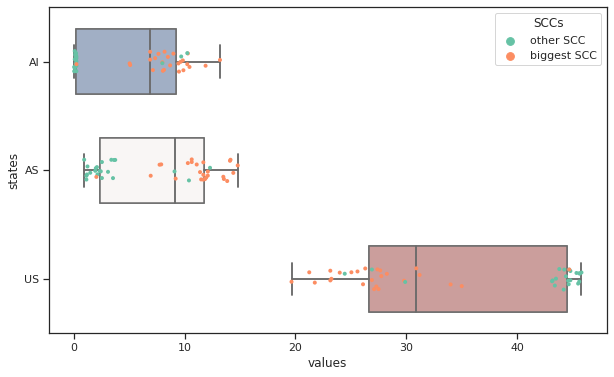

In [ ]:
sns.set_theme(style="ticks")

# Initialize the figure with a logarithmic x axis
f, ax = plt.subplots(figsize=(10, 6))

sns.boxplot(x="values", y="states", data=sns_dataset,
            whis=[0, 100], width=.6, palette="vlag")

sns.boxplot(x="values", y="states", data=sns_dataset,
            whis=[0, 100], width=.6, palette="vlag")

sns.stripplot(x="values", y="states", data=sns_dataset, hue='SCCs',palette='Set2',
              size=4, color=".3", linewidth=0)

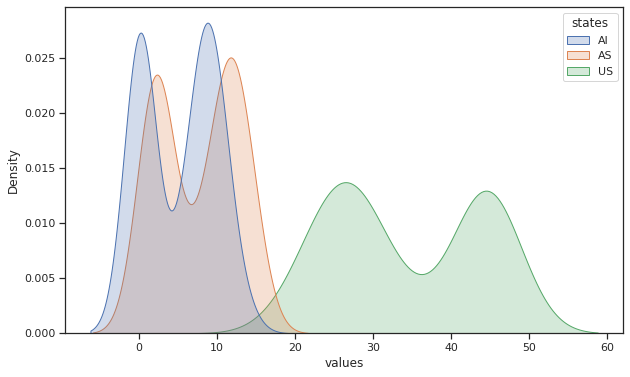

In [ ]:
plt.figure(figsize=(10,6))

sns.kdeplot(data=sns_dataset, x="values", hue="states",fill=True)


In [ ]:
numb_sims = len(total_escape)
total_escape_valid = [x for x in total_escape if not np.isnan(x[0])]
numb_valid_sim = len(total_escape_valid)
percentage_variability_result = numb_valid_sim/numb_sims
print(f'the initial setting leads to variable result in {percentage_variability_result*100}% of times, otherwise the escape satisfiability takes value {average_result.property_escape.values[-1]}: satisfied')


the initial setting leads to variable result in 55.319148936170215% of times, otherwise the escape satisfiability takes value 0.2: satisfied


In [ ]:
sorted_degree = sorted(list(zip(range(1,51), list(map(lambda x:x[1],list(graph.degree()))),AI,total_escape)), key = lambda x:x[1], reverse = True)
sorted_degree

[(3, 8, 10.3, (-0.06100627536567482, 0.3610062753656748)),
 (12, 8, 9.45, (-0.07728073099969068, 0.2772807309996907)),
 (40, 8, 13.2, (-0.0363743079995876, 0.43637430799958765)),
 (4, 6, 0.1, (nan, nan)),
 (16, 6, 11.9, (0.029199210312271073, 0.570800789687729)),
 (19, 6, 8.0, (0.3105017785487692, 0.8894982214512308)),
 (41, 6, 9.5, (0.029199210312271073, 0.570800789687729)),
 (2, 4, 8.5, (nan, nan)),
 (11, 4, 7.65, (0.25601316635704946, 0.8439868336429506)),
 (17, 4, 6.9, (0.6389937246343251, 1.0610062753656748)),
 (18, 4, 8.2, (0.15601316635704943, 0.7439868336429506)),
 (21, 4, 9.65, (-0.06100627536567482, 0.3610062753656748)),
 (25, 4, 9.0, (0.06814160173923789, 0.6318583982607621)),
 (34, 4, 8.15, (0.11050177854876925, 0.6894982214512309)),
 (36, 4, 10.45, (-0.0363743079995876, 0.43637430799958765)),
 (37, 4, 7.35, (0.029199210312271073, 0.570800789687729)),
 (39, 4, 7.15, (0.11050177854876925, 0.6894982214512309)),
 (45, 4, 0.05, (nan, nan)),
 (46, 4, 9.85, (0.06814160173923783, 

In [ ]:
print(f'the following nodes are sorted by degree:')
for node,degree,ai,escape in sorted_degree:
  print(f'node {node} has degree {degree}, when intial infected the network ends up on average with {ai} infected nodes at t =20,the 99% confidence interval that V2 does not get infected is {escape}')

the following nodes are sorted by degree:
node 3 has degree 8, when intial infected the network ends up on average with 10.3 infected nodes at t =20,the 99% confidence interval that V2 does not get infected is (-0.06100627536567482, 0.3610062753656748)
node 12 has degree 8, when intial infected the network ends up on average with 9.45 infected nodes at t =20,the 99% confidence interval that V2 does not get infected is (-0.07728073099969068, 0.2772807309996907)
node 40 has degree 8, when intial infected the network ends up on average with 13.2 infected nodes at t =20,the 99% confidence interval that V2 does not get infected is (-0.0363743079995876, 0.43637430799958765)
node 4 has degree 6, when intial infected the network ends up on average with 0.1 infected nodes at t =20,the 99% confidence interval that V2 does not get infected is (nan, nan)
node 16 has degree 6, when intial infected the network ends up on average with 11.9 infected nodes at t =20,the 99% confidence interval that V2 d

In [ ]:
sorted_ai = sorted(list(zip(range(1,51), list(map(lambda x:x[1],list(graph.degree()))),AI,total_escape)), key = lambda x:x[2], reverse = True)
sorted_ai

[(40, 8, 13.2, (-0.0363743079995876, 0.43637430799958765)),
 (16, 6, 11.9, (0.029199210312271073, 0.570800789687729)),
 (36, 4, 10.45, (-0.0363743079995876, 0.43637430799958765)),
 (3, 8, 10.3, (-0.06100627536567482, 0.3610062753656748)),
 (35, 2, 10.25, (0.06814160173923783, 0.6318583982607622)),
 (44, 2, 10.25, (0.06814160173923783, 0.6318583982607622)),
 (24, 2, 9.9, (0.11050177854876925, 0.6894982214512309)),
 (46, 4, 9.85, (0.06814160173923783, 0.6318583982607622)),
 (38, 2, 9.7, (0.06814160173923778, 0.6318583982607622)),
 (21, 4, 9.65, (-0.06100627536567482, 0.3610062753656748)),
 (41, 6, 9.5, (0.029199210312271073, 0.570800789687729)),
 (12, 8, 9.45, (-0.07728073099969068, 0.2772807309996907)),
 (25, 4, 9.0, (0.06814160173923789, 0.6318583982607621)),
 (5, 2, 8.7, (0.25601316635704946, 0.8439868336429506)),
 (2, 4, 8.5, (nan, nan)),
 (18, 4, 8.2, (0.15601316635704943, 0.7439868336429506)),
 (34, 4, 8.15, (0.11050177854876925, 0.6894982214512309)),
 (30, 2, 8.05, (0.256013166357

The comparative analysis degree-ai remarks that final number that the escape property relies on the connected components the interested node belongs to and that the bigger the strongly connected component a node initially infected belongs, the greated the final number of AI.

In [ ]:
replaced_escape_nan = [x  if not np.isnan(x[0]) else (1.0,1.0) for x in total_escape]
replaced_escape_nan

[(1.0, 1.0),
 (1.0, 1.0),
 (-0.06100627536567482, 0.3610062753656748),
 (1.0, 1.0),
 (0.25601316635704946, 0.8439868336429506),
 (1.0, 1.0),
 (1.0, 1.0),
 (1.0, 1.0),
 (0.5636256920004125, 1.0363743079995875),
 (1.0, 1.0),
 (0.25601316635704946, 0.8439868336429506),
 (-0.07728073099969068, 0.2772807309996907),
 (1.0, 1.0),
 (1.0, 1.0),
 (1.0, 1.0),
 (0.029199210312271073, 0.570800789687729),
 (0.6389937246343251, 1.0610062753656748),
 (0.15601316635704943, 0.7439868336429506),
 (0.3105017785487692, 0.8894982214512308),
 (1.0, 1.0),
 (-0.06100627536567482, 0.3610062753656748),
 (1.0, 1.0),
 (0.7227192690003094, 1.0772807309996908),
 (0.11050177854876925, 0.6894982214512309),
 (0.06814160173923789, 0.6318583982607621),
 (1.0, 1.0),
 (1.0, 1.0),
 (1.0, 1.0),
 (1.0, 1.0),
 (0.25601316635704946, 0.8439868336429506),
 (1.0, 1.0),
 (1.0, 1.0),
 (1.0, 1.0),
 (0.11050177854876925, 0.6894982214512309),
 (0.06814160173923783, 0.6318583982607622),
 (-0.0363743079995876, 0.43637430799958765),
 (0.0

In [ ]:
df1 = pd.DataFrame(data={'AI':AI})
df2 = pd.DataFrame(data={'AS':AS})
df3 = pd.DataFrame(data={'US':US})
sns_dataset2 = pd.concat([df1, df2,df3], axis=1)
sns_dataset2

,AI,AS,US
0,0.20,2.00,44.80
1,8.50,11.10,27.40
2,10.30,13.55,23.15
3,0.10,3.10,43.80
4,8.70,10.65,27.65
5,0.15,1.50,45.35
6,0.25,1.25,45.50
7,0.25,1.95,44.80
8,6.90,9.20,30.90
9,0.20,2.10,44.70


In [ ]:
average_result

,[T],AI,AS,US,property_reachability,content_condition1,content_condition2,property_escape,content_escape,property_somewhere,content_somewhere
0,0.0,1.00,0.00,46.00,0.00,1.00,0.00,1.00,0.00,0.0,1.00
1,1.0,3.50,4.05,39.45,0.00,3.50,4.05,0.25,0.15,0.0,3.50
2,2.0,4.75,8.20,34.05,0.05,4.75,8.20,0.20,0.15,0.0,4.75
3,3.0,6.70,9.80,30.50,0.10,6.70,9.80,0.20,0.35,0.0,6.70
4,4.0,7.00,10.30,29.70,0.10,7.00,10.30,0.20,0.30,0.0,7.00
...,...,...,...,...,...,...,...,...,...,...,...
197,197.0,8.00,9.10,29.90,0.10,8.00,9.10,0.20,0.25,0.0,8.00
198,198.0,8.00,9.10,29.90,0.10,8.00,9.10,0.20,0.25,0.0,8.00
199,199.0,8.00,9.10,29.90,0.10,8.00,9.10,0.20,0.25,0.0,8.00
200,200.0,8.00,9.10,29.90,0.10,8.00,9.10,0.20,0.25,0.0,8.00


## 2nd EPIDEMICS WITH 50 NODES

In [ ]:
# models_mix2 = [ml.evolution_pa(5,1),ml.evolution_pa(4,1)]
# pr_internal = [1, 1]
# pr_external = [0, 0]
# dependency = [ [1, 0], [0, 1]]

In [ ]:
# generated_mix2 = ml.grow(50,50, models_mix2, pr_internal,pr_external, dependency)
# generated_mix2

In [ ]:
# l2 = ml.layout_multiforce(generated_mix2, gravity = [.5])
# ver2 = ml.vertices(generated_mix2)
# deg2 = [ml.degree(generated_mix2, [a], [l])[0] for a,l in zip(ver2['actor'],ver2['layer'])]
# ml.plot(generated_mix2, layout = l2, vertex_labels=[], vertex_size=deg2)

In [ ]:
# edge_list2 = ml.edges(generated_mix2)
# edge_list2['from_actor'] = list(map(lambda x:str(int(x[1:])+1),edge_list2['from_actor']))
# edge_list2['to_actor'] = list(map(lambda x:str(int(x[1:])+1),edge_list2['to_actor']))
# edge_list2['from_layer'] = list(map(lambda x:str(int(x[1:])+1),edge_list2['from_layer']))
# edge_list2['to_layer'] = list(map(lambda x:str(int(x[1:])+1),edge_list2['to_layer']))

In [ ]:
######## Generate  compatible edge_list

# self_loops2 = []
# with open('/content/edge_list2_vax.txt','w') as f:
#   for components in range(len(edge_list2['from_actor'])):
#         if edge_list2['from_actor'][components] != edge_list2['to_actor'][components]:
#           f.writelines(f"{int(edge_list2['from_actor'][components])},{int(edge_list2['to_actor'][components])},{int(edge_list2['from_layer'][components])}"+"\n")
#         else:
#           print(f'self loop at {components}')

In [ ]:
mln_data = ParserThesis.parse_mln("/content/2nd_50nodes_edgelist.txt")

Parsing network configuration file /content/2nd_50nodes_edgelist.txt


In [ ]:
#general framework for initial_conditions (all US except node 1)

np.random.seed(1)
initial_states = np.random.choice(['US','AI','AS'],size=mln_data['actors'][1],replace=True,p=[1,0,0])
new_initial_conditions = []
for actor, state in zip(mln_data['actors'][0],initial_states):
  new_initial_conditions.append(f'{str(actor)} = {state}')
language['initial conditions'] = new_initial_conditions
language['initial conditions'][0] = '1 = AI'
language

{'states': ['AS', 'AI', 'US'],
 'parameters': ['delta = 1', 'mu = 1', 'betaA = 1', 'betaU = 3', 'lamb = 1'],
 'initial conditions': ['1 = AI',
  '2 = US',
  '3 = US',
  '4 = US',
  '5 = US',
  '6 = US',
  '7 = US',
  '8 = US',
  '9 = US',
  '10 = US',
  '11 = US',
  '12 = US',
  '13 = US',
  '14 = US',
  '15 = US',
  '16 = US',
  '17 = US',
  '18 = US',
  '19 = US',
  '20 = US',
  '21 = US',
  '22 = US',
  '23 = US',
  '24 = US',
  '25 = US',
  '26 = US',
  '27 = US',
  '28 = US',
  '29 = US',
  '30 = US',
  '31 = US',
  '32 = US',
  '33 = US',
  '34 = US',
  '35 = US',
  '36 = US',
  '37 = US',
  '38 = US',
  '39 = US',
  '40 = US',
  '41 = US',
  '42 = US',
  '43 = US',
  '44 = US',
  '45 = US',
  '46 = US',
  '47 = US',
  '48 = US',
  '49 = US',
  '50 = US'],
 'rules': ['AS -> US @ delta',
  'AI -> AS @ mu',
  'AS =1 AI -> AI =1 AI @ betaA',
  'US =1 AI -> AI =1 AI @ betaU',
  'US =2 AI -> AS =2 AI @ lamb',
  'US =2 AS -> AS =2 AS @ lamb'],
 'views': ['AI', 'AS', 'US'],
 'simOptions

In [ ]:
def dynamic_parse_to_kappy_init_conditions_intervention_based(network_filename, language_filename, out_filename,infected_node):

    mln_data = ParserThesis.parse_mln(network_filename)
    language = ParserThesis.parse_language_file(language_filename)

    initial_states = np.random.choice(['US','AI','AS'],size=mln_data['actors'][1],replace=True,p=[1,0,0])
    new_initial_conditions = []
    for actor, state in zip(mln_data['actors'][0],initial_states):
      new_initial_conditions.append(f'{str(actor)} = {state}')
    language['initial conditions'] = new_initial_conditions
    node,state = language['initial conditions'][infected_node-1].split('=')
    state = state.strip()
    language['initial conditions'][infected_node-1] = language['initial conditions'][infected_node-1].replace(state, 'AI')

    kappa_model = ''
    kappa_model += ParserThesis.kappa_parse_signatures(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_rules(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_variables(language) + '\n'
    kappa_model += ParserThesis.kappa_parse_observables(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_initial_conditions(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_intervention_based(1) + '\n'
    if language['reachability property'] != []:
      kappa_model += ParserThesis.kappa_parse_reachability(mln_data, language) +'\n\n'
    if language['escape property'] != []:
      kappa_model += ParserThesis.kappa_parse_escape(mln_data, language) + '\n\n'
    if language['escape property'] != []:
      kappa_model += ParserThesis.kappa_parse_somewhere(mln_data, language) + '\n\n'
    
    with open(out_filename, 'w') as f:
        f.write(kappa_model)
    print(f'Successfully exported model into Kappa: {out_filename}')

In [ ]:
averages = []
total_somewheres = []
AS = []
AI = []
US = []
times_total=[]
events_total = []
total_property_values = []
seeds = 0
for node in range(len(language['initial conditions'])):
  dynamic_parse_to_kappy_init_conditions_intervention_based("/content/2nd_50nodes_edgelist.txt",'/content/repeated_1_node_language.txt','/50-nodes-epidemiology.txt',node+1)

  with open('/50-nodes-epidemiology.txt','r') as f:
    lines = f.read().splitlines()
  small_epid_kappy_text = ""
  for line in lines:
    small_epid_kappy_text += line + '\\'

  simulations_info = []
  simulations_plot = []
  simulations_data = []
  times=[]
  events = []
  AI_local = []
  AS_local = []
  US_local = []
  somewheres = []
  while len(simulations_data) < 20:
    kappa_client = kappy.KappaStd()
    model_text =  small_epid_kappy_text[:-1].replace("\\","")
    kappa_client.add_model_string(model_text)
    kappa_client.project_parse()
    sim_params = kappy.SimulationParameter(pause_condition=f"[T]>20",plot_period=0,seed=seeds)
    kappa_client.simulation_start(sim_params)
    kappa_client.wait_for_simulation_stop()
    results_three_node_sim = kappa_client.simulation_plot()
    three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
    three_node_sim = three_node_sim.sort_values(by = '[T]')
    happened_events = kappa_client.simulation_info()['simulation_info_progress']['simulation_progress_event']
    three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist()
    three_node_sim.index = range(len(three_node_sim)) #first column is T, the other ones changes only if the columns related to the single nodes change
    simulations_data.append(three_node_sim)
    if 1 in three_node_sim['property_somewhere'].values:
      times.append(three_node_sim[three_node_sim.property_somewhere.isin([1])]['[T]'].values[0])
      events.append(three_node_sim[three_node_sim.property_somewhere.isin([1])].index[0]-1)
      somewheres.append(1)
    else:
      somewheres.append(0)
    AI_local.append(three_node_sim['AI'].values[-1])
    AS_local.append(three_node_sim['AS'].values[-1])
    US_local.append(three_node_sim['US'].values[-1])
    seeds += 1
  
  times_total.append(times)
  events_total.append(events)
 #list of index based on the longest simulation 

  # making all dataframe of the same length equal to the longest simulation, replicationg last observed values of those simulations which ended earlier

  equalize_len_data = []

  for sim in simulations_data:
    equalize_len_data.append(sim)

  average_result = reduce(lambda a, b: a.add(b), equalize_len_data)/len(equalize_len_data)
  averages.append(average_result)

  if sum(somewheres) == 0 or sum(somewheres)==len(somewheres):
    print(f"somewhere property confidence interval is: {(somewheres[0],somewheres[0])}")
    total_property_values.append(somewheres[0])
    total_somewheres.append((somewheres[0],somewheres[0]))
  else:
    print(f"somewhere property confidence interval is: {stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres))}")
    total_property_values.append(np.mean(somewheres))
    total_somewheres.append(stats.norm.interval(alpha=0.99, loc=np.mean(somewheres), scale=stats.sem(somewheres)))
  AI.append(AI_local)
  AS.append(AS_local)
  US.append(US_local)

Parsing network configuration file /content/2nd_50nodes_edgelist.txt
Parsing MLN language file /content/repeated_1_node_language.txt
Successfully exported model into Kappa: /50-nodes-epidemiology.txt
somewhere property confidence interval is: (0.3681416017392379, 0.9318583982607622)
Parsing network configuration file /content/2nd_50nodes_edgelist.txt
Parsing MLN language file /content/repeated_1_node_language.txt
Successfully exported model into Kappa: /50-nodes-epidemiology.txt
somewhere property confidence interval is: (-0.06100627536567482, 0.3610062753656748)
Parsing network configuration file /content/2nd_50nodes_edgelist.txt
Parsing MLN language file /content/repeated_1_node_language.txt
Successfully exported model into Kappa: /50-nodes-epidemiology.txt
somewhere property confidence interval is: (0.36814160173923793, 0.9318583982607621)
Parsing network configuration file /content/2nd_50nodes_edgelist.txt
Parsing MLN language file /content/repeated_1_node_language.txt
Successfully

In [ ]:
times_total, AI, AS, US,total_somewheres
times_total = list(map(lambda x:np.mean(x), times_total))
events_total = list(map(lambda x:np.mean(x), events_total))
AI = list(map(lambda x:np.mean(x), AI))
AS = list(map(lambda x:np.mean(x), AS))
US = list(map(lambda x:np.mean(x), US))

In [ ]:
graph = nx.Graph()
graph.add_nodes_from(list(map(lambda x:str(x),range(1,51))))
graph.add_edges_from(mln_data['edges'][1][0])
degrees_phisical_layer = list(dict(nx.degree(graph)).values())

In [ ]:
df = pd.DataFrame({'time':times_total,'event':events_total, 'AI':AI, 'AS':AS, 'US':US,'proeprty intervals':total_somewheres,'starting node':range(1,51), 'degree':degrees_phisical_layer,'percentage property satisfied':total_property_values},index=range(1,51))
df=df.sort_values('AI')
df['starting node']=df['starting node'].apply(lambda x:str(x))
df

,time,event,AI,AS,US,proeprty intervals,starting node,degree,percentage property satisfied
8,1.098923,61.714286,11.85,20.60,17.55,"(0.06814160173923783, 0.6318583982607622)",8,1,0.35
2,1.491985,57.333333,14.00,15.70,20.30,"(-0.06100627536567482, 0.3610062753656748)",2,1,0.15
16,0.799891,53.500000,14.35,14.70,20.95,"(0.20453211500051555, 0.7954678849994845)",16,1,0.50
14,0.854779,54.000000,14.60,13.55,21.85,"(0.15601316635704943, 0.7439868336429506)",14,1,0.45
25,0.953865,53.333333,15.05,14.10,20.85,"(0.15601316635704943, 0.7439868336429506)",25,1,0.45
19,1.139902,57.571429,15.15,14.15,20.70,"(0.06814160173923789, 0.6318583982607621)",19,1,0.35
33,0.817107,51.555556,15.65,15.05,19.30,"(0.15601316635704943, 0.7439868336429506)",33,1,0.45
6,1.102476,58.454545,15.85,14.25,19.90,"(0.25601316635704946, 0.8439868336429506)",6,1,0.55
34,1.152420,59.000000,16.30,17.25,16.45,"(0.06814160173923789, 0.6318583982607621)",34,2,0.35
3,0.928087,66.923077,16.75,16.95,16.30,"(0.36814160173923793, 0.9318583982607621)",3,1,0.65


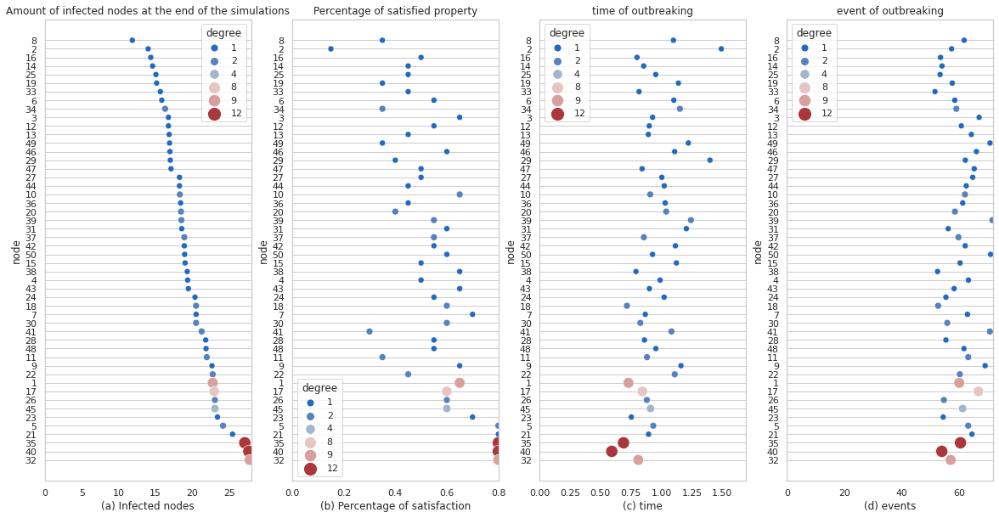

In [ ]:
import seaborn as sns
sns.set_theme(style="whitegrid")
fig,axes= plt.subplots(1,4,figsize=(20,10))



g = sns.scatterplot(data=df, x='time', y="starting node",hue='degree',size='degree',sizes=(50,200),palette="vlag",ax=axes[2])
g.set(xlim=(0, max(times_total)+0.2), xlabel="(c) time", ylabel="node",title='time of outbreaking')

g.xaxis.grid(False)
g.yaxis.grid(True)

g = sns.scatterplot(data=df, x='event', y="starting node",hue='degree',size='degree',sizes=(50,200),palette="vlag",ax=axes[3])
g.set(xlim=(0, max(events_total)+0.2), xlabel="(d) events", ylabel="node",title='event of outbreaking')

g.xaxis.grid(False)
g.yaxis.grid(True)

f = sns.scatterplot(data=df, x='AI', y="starting node",hue='degree',size='degree',sizes=(50,200),palette="vlag",ax=axes[0])
f.set(xlim=(0, max(AI)+0.2), xlabel="(a) Infected nodes", ylabel="node",title='Amount of infected nodes at the end of the simulations')

f.xaxis.grid(False)
f.yaxis.grid(True)

f = sns.scatterplot(data=df, x='percentage property satisfied', y="starting node",hue='degree',size='degree',sizes=(50,200),palette="vlag",ax=axes[1])
f.set(xlim=(0, max(total_property_values)), xlabel="(b) Percentage of satisfaction", ylabel="node",title='Percentage of satisfied property')

f.xaxis.grid(False)
f.yaxis.grid(True)

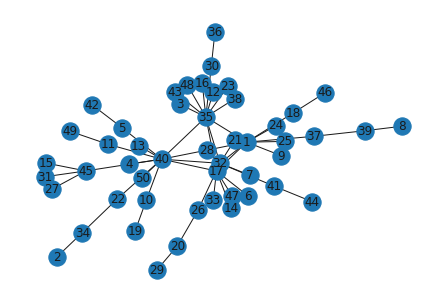

In [ ]:
nx.draw(graph, with_labels=True)

# 3rd ANALYSIS - MODEL DEFINITION ON REAL-WORLD DATA

In [12]:
with open('/content/Sanremo2016_final-activity.txt','r') as f:
  network = f.readlines()

In [13]:
raw_network = sorted(list(map(lambda x:x.strip('\n').split(' '), network)),key=lambda x:x[2])
raw_network

[['1', '2', '1455385362', 'MT'],
 ['1', '3', '1455385362', 'RT'],
 ['4', '5', '1455385363', 'MT'],
 ['4', '6', '1455385363', 'MT'],
 ['4', '6', '1455385363', 'RE'],
 ['7', '8', '1455385363', 'RT'],
 ['9', '10', '1455385365', 'MT'],
 ['11', '12', '1455385365', 'RT'],
 ['9', '13', '1455385365', 'RT'],
 ['14', '15', '1455385366', 'RT'],
 ['16', '17', '1455385366', 'RT'],
 ['18', '15', '1455385367', 'MT'],
 ['18', '19', '1455385367', 'RT'],
 ['20', '21', '1455385369', 'MT'],
 ['22', '23', '1455385369', 'MT'],
 ['22', '24', '1455385369', 'MT'],
 ['22', '25', '1455385369', 'MT'],
 ['26', '17', '1455385369', 'RT'],
 ['20', '27', '1455385369', 'RT'],
 ['22', '28', '1455385369', 'RT'],
 ['29', '30', '1455385370', 'MT'],
 ['29', '31', '1455385370', 'MT'],
 ['29', '32', '1455385370', 'MT'],
 ['33', '34', '1455385370', 'MT'],
 ['33', '35', '1455385370', 'MT'],
 ['33', '34', '1455385370', 'RE'],
 ['29', '36', '1455385370', 'RT'],
 ['37', '38', '1455385371', 'MT'],
 ['37', '8', '1455385371', 'RT'],


In [14]:
network_edges = list(map(lambda x: (x[0],x[3],x[1],x[3]), raw_network))
timestamps = list(map(lambda x: x[2], raw_network))
len(network_edges),len(timestamps)

(466678, 466678)

In [15]:
timestamps_date = list(map(lambda x: strftime("%a, %d %b %Y %H:%M", time.gmtime(int(x))), timestamps))
timestamps_date[0],timestamps_date[-1]

('Sat, 13 Feb 2016 17:42', 'Sun, 14 Feb 2016 04:46')

In [16]:
network = list(map(lambda x:(x[0],x[1],strftime("%a, %d %b %Y %H:%M", time.gmtime(int(x[2]))),x[3]), raw_network))
network

[('1', '2', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('1', '3', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('4', '5', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('4', '6', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('4', '6', 'Sat, 13 Feb 2016 17:42', 'RE'),
 ('7', '8', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('9', '10', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('11', '12', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('9', '13', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('14', '15', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('16', '17', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('18', '15', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('18', '19', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('20', '21', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('22', '23', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('22', '24', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('22', '25', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('26', '17', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('20', '27', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('22', '28', 'Sat, 13 Feb 2016 17:42', 'RT'),
 ('29', '30', 'Sat, 13 Feb 2016 17:42', 'MT'),
 ('29', '31', 'Sat, 13 Feb 

In [17]:
node1 = list(map(lambda x:x[0], network))
node2 = list(map(lambda x:x[1], network))
timestamps = list(map(lambda x:x[2], network))
layer = list(map(lambda x:x[3], network))
df = pd.DataFrame({'start_node':node1, 'end_node':node2,'time':timestamps,'layer':layer})
df

,start_node,end_node,time,layer
0,1,2,"Sat, 13 Feb 2016 17:42",MT
1,1,3,"Sat, 13 Feb 2016 17:42",RT
2,4,5,"Sat, 13 Feb 2016 17:42",MT
3,4,6,"Sat, 13 Feb 2016 17:42",MT
4,4,6,"Sat, 13 Feb 2016 17:42",RE
...,...,...,...,...
466673,23545,40,"Sun, 14 Feb 2016 04:46",RT
466674,56561,3504,"Sun, 14 Feb 2016 04:46",RT
466675,56547,6,"Sun, 14 Feb 2016 04:46",MT
466676,56547,11744,"Sun, 14 Feb 2016 04:46",RT


In [18]:
counting=df.value_counts(['time','layer'],sort=False)
counts = pd.DataFrame()
counts['interactions'] = list(counting)
time_count = list(map(lambda x:x[0], counting.index))
layer_count = list(map(lambda x:x[1], counting.index))
counts['time'] = list(time_count)
counts['layer'] = list(layer_count)

In [19]:
counts.sort_values('interactions',ascending=False).head(50)

,interactions,time,layer
947,1702,"Sat, 13 Feb 2016 22:58",RT
1043,1693,"Sat, 13 Feb 2016 23:30",RT
941,1691,"Sat, 13 Feb 2016 22:56",RT
944,1688,"Sat, 13 Feb 2016 22:57",RT
950,1655,"Sat, 13 Feb 2016 22:59",RT
1040,1649,"Sat, 13 Feb 2016 23:29",RT
938,1630,"Sat, 13 Feb 2016 22:55",RT
1046,1614,"Sat, 13 Feb 2016 23:31",RT
959,1565,"Sat, 13 Feb 2016 23:02",RT
962,1551,"Sat, 13 Feb 2016 23:03",RT


In [20]:
counts['tot_interactions'] = list(map(lambda x: counts[counts.time == x].sum()[0], counts.time))
counts

,interactions,time,layer,tot_interactions
0,19,"Sat, 13 Feb 2016 17:42",MT,37
1,2,"Sat, 13 Feb 2016 17:42",RE,37
2,16,"Sat, 13 Feb 2016 17:42",RT,37
3,51,"Sat, 13 Feb 2016 17:43",MT,114
4,2,"Sat, 13 Feb 2016 17:43",RE,114
...,...,...,...,...
1813,12,"Sun, 14 Feb 2016 04:45",MT,25
1814,1,"Sun, 14 Feb 2016 04:45",RE,25
1815,12,"Sun, 14 Feb 2016 04:45",RT,25
1816,3,"Sun, 14 Feb 2016 04:46",MT,10


In [21]:
xaxis_range = range(0,len(counts.time),200)
xaxis = list(map(lambda x:counts.time.values[x], xaxis_range))

Text(0.5, 1.0, 'time series events of Sanremo 2016 final')

<Figure size 576x576 with 0 Axes>

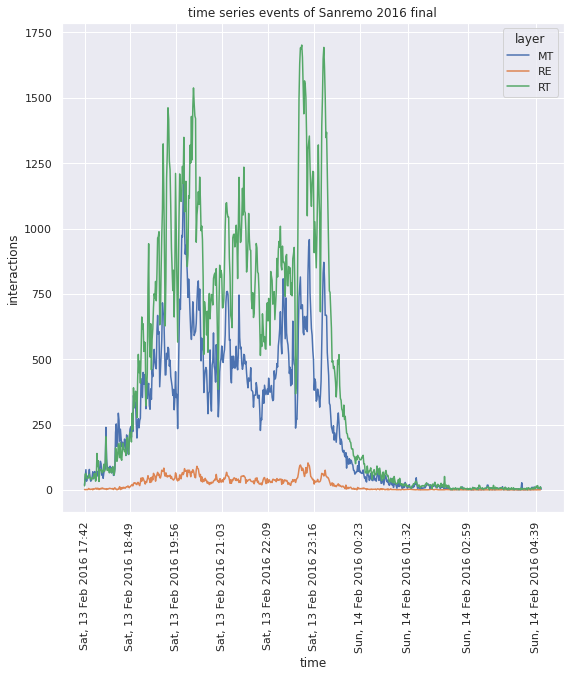

In [22]:
sns.set_theme()
plt.figure(figsize=(8,8))
   
fig, ax = plt.subplots(figsize=(9,9))
sns.lineplot(data=counts,x='time',y='interactions',hue='layer')
ax.set_xticks(xaxis)
ax.set_xticklabels(xaxis,rotation=90)
plt.title('time series events of Sanremo 2016 final')

In [23]:
end_period = list(counts[(counts.tot_interactions < 250) & (counts.time > 'Sat, 13 Feb 2016 23:30')].time)[0]
start_df = counts[(counts.time < 'Sat, 13 Feb 2016 23:30') & (counts.time > 'Sat, 13 Feb 2016 21:00')]
start_period = list(start_df[start_df.tot_interactions == min(start_df.tot_interactions)].time)[0]

In [24]:
start_period,end_period

('Sat, 13 Feb 2016 22:49', 'Sun, 14 Feb 2016 00:13')

In [25]:
# now select in second for detecting the range period
start_period_secs = 0
end_period_secs = 0
for elem in range(len(network)):
  if network[elem][2] == start_period:
    start_period_secs = int(raw_network[elem][2])
  if network[elem][2] == end_period:
    end_period_secs = int(raw_network[elem][2])
time_span = end_period_secs - start_period_secs
time_span

5040

In [26]:
# find the hottest 100 moments...

sorted_by_count = counts.sort_values('interactions',ascending=False)
sorted_by_count.iloc[:100,:]

,interactions,time,layer,tot_interactions
947,1702,"Sat, 13 Feb 2016 22:58",RT,2486
1043,1693,"Sat, 13 Feb 2016 23:30",RT,2618
941,1691,"Sat, 13 Feb 2016 22:56",RT,2602
944,1688,"Sat, 13 Feb 2016 22:57",RT,2471
950,1655,"Sat, 13 Feb 2016 22:59",RT,2447
...,...,...,...,...
512,1010,"Sat, 13 Feb 2016 20:33",RT,1642
854,1009,"Sat, 13 Feb 2016 22:27",RT,1732
614,1008,"Sat, 13 Feb 2016 21:07",RT,1647
435,1004,"Sat, 13 Feb 2016 20:08",MT,2150


In [27]:
time_span_net_egdes = [net for net in raw_network if int(net[2]) >= start_period_secs and int(net[2]) <= end_period_secs]
time_span_network = list(map(lambda x:(x[0],x[1],strftime("%a, %d %b %Y %H:%M", time.gmtime(int(x[2]))),x[3]), time_span_net_egdes))
time_span_network_edges = list(map(lambda x: (x[0],x[3],x[1],x[3]), time_span_net_egdes))

In [28]:
new = list(map(lambda x :(x[0],x[2]),time_span_network_edges))
nod = np.unique(new)
graph = nx.DiGraph()
graph.add_nodes_from(nod)
graph.add_edges_from(new)

In [29]:
nodes_SCC = list(sorted(list(nx.strongly_connected_components(graph)),key=len))[-1]

In [30]:
len(nodes_SCC)

1996

In [31]:
edges_SCC = [edge for edge in time_span_network_edges if edge[0] in nodes_SCC and edge[2] in nodes_SCC]
len(edges_SCC)

18018

### NETWORK DEFINITION

In [32]:
probs_total_stadio = []
probs_total_michelin = []
probs_total_caccamo_iurato = []

televoting_data_first_part = {"Stadio":0.1030, "Francesca Michelin":0.0817, "Caccamo-Iurato":0.0632}
televoting_final = {"Stadio":0.4399, "Francesca Michelin":0.2958, "Caccamo-Iurato":0.2643}

Legend of states of the language file:
- ProStadio = Ps
- VersusStadio = Vs (it identifies fans of Michelin/Caccamo-Iurato)
- OtherStadio = Os

Theere are three layers, assuming that every agent has the same opinion on all the layers, specified network states of the model: PsPsPs, VsVsVs, OsOsOs (repetead 3 times as the number of layers).
Given the same state for every layer, network states will be specified with abbreaviations: Ps, Vs, Os.


In [33]:
selected_edges = [edges_SCC[edge] for edge in range(0,len(edges_SCC),len(edges_SCC)//200)]

In [34]:
map_label = {'RT':'retweet','RE':'reply','MT':'mention'}
new_net_edges = list(map(lambda x:(x[0],map_label[x[1]],x[2],map_label[x[3]]),selected_edges))
new_net_edges

[('26952', 'retweet', '1246', 'retweet'),
 ('1557', 'retweet', '1554', 'retweet'),
 ('16089', 'retweet', '15958', 'retweet'),
 ('7965', 'reply', '77', 'reply'),
 ('27335', 'retweet', '8', 'retweet'),
 ('5244', 'mention', '77', 'mention'),
 ('9088', 'retweet', '8', 'retweet'),
 ('1669', 'retweet', '9210', 'retweet'),
 ('35686', 'retweet', '520', 'retweet'),
 ('33515', 'retweet', '16231', 'retweet'),
 ('2556', 'mention', '402', 'mention'),
 ('7191', 'retweet', '6263', 'retweet'),
 ('9357', 'retweet', '31889', 'retweet'),
 ('162', 'mention', '77', 'mention'),
 ('7677', 'retweet', '22127', 'retweet'),
 ('29679', 'retweet', '520', 'retweet'),
 ('1132', 'retweet', '12996', 'retweet'),
 ('1851', 'retweet', '8', 'retweet'),
 ('8662', 'retweet', '387', 'retweet'),
 ('25363', 'mention', '233', 'mention'),
 ('14331', 'retweet', '8', 'retweet'),
 ('26858', 'reply', '16698', 'reply'),
 ('18162', 'mention', '18162', 'mention'),
 ('31116', 'retweet', '33745', 'retweet'),
 ('22769', 'retweet', '16989'

In [35]:
with open('/content/Sanremo2016-py3plex.txt','w') as f:
  for line in new_net_edges:
    f.write(f'{line[0]} {line[1]} {line[2]} {line[3]}\n')

-------------------- 
 Network splitting in progress 
 --------------------
module 'scipy.sparse' has no attribute 'coo_array'
Using standard layout algorithm, fa2 not present on the system.
module 'scipy.sparse' has no attribute 'coo_array'
Using standard layout algorithm, fa2 not present on the system.
module 'scipy.sparse' has no attribute 'coo_array'
Using standard layout algorithm, fa2 not present on the system.
Finished with layout..
MultiGraph with 215 nodes and 142 edges
MultiGraph with 12 nodes and 8 edges
MultiGraph with 63 nodes and 51 edges


0it [00:00, ?it/s]


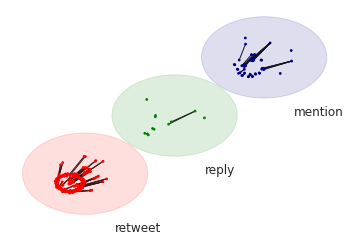

In [36]:
multilayer_network = multinet.multi_layer_network().load_network('/content/Sanremo2016-py3plex.txt',directed=False, input_type="multiedgelist")
multilayer_network.visualize_network(style="diagonal",show=True,fig=(20,20),alphachannel=1)

In [37]:
mapping_layers = {'RT':1, 'MT':2, 'RE':3}

with open('/content/Sanremo2016-net.txt','w') as f:
  for line in selected_edges:
    if line[0] != line[2]:
      f.write(f'{line[0]},{line[2]},{mapping_layers[line[3]]}\n')
    else:
      print(f'self loop: {line[0],line[2]}')

self loop: ('18162', '18162')
self loop: ('77', '77')
self loop: ('2291', '2291')
self loop: ('5788', '5788')
self loop: ('442', '442')
self loop: ('14286', '14286')
self loop: ('3789', '3789')


In [38]:
# network edgelist visualitation

with open('/content/Sanremo2016-net.txt','r') as g:
  a = g.readlines()
a = list(map(lambda a:a.replace('\n',''),a))
for el in range(1,len(a)-2,8):
  print(a[el],a[el+1],a[el+2],a[el+3],a[el+4],a[el+5],a[el+6],a[el+7])

1557,1554,1 16089,15958,1 7965,77,3 27335,8,1 5244,77,2 9088,8,1 1669,9210,1 35686,520,1
33515,16231,1 2556,402,2 7191,6263,1 9357,31889,1 162,77,2 7677,22127,1 29679,520,1 1132,12996,1
1851,8,1 8662,387,1 25363,233,2 14331,8,1 26858,16698,3 31116,33745,1 22769,16989,1 8373,77,1
1444,77,2 4911,8,1 4911,8,1 48254,8,1 14193,8,1 48076,40,2 44797,8,1 8922,8,1
880,1091,1 4359,8730,1 7218,775,1 46080,402,1 35610,8,1 43192,8,1 31116,36221,1 37937,29326,1
15818,77,2 5456,77,1 11043,77,2 10283,13122,1 25657,775,1 6056,15698,1 95,84,1 47691,4476,1
1851,5877,1 35197,508,1 9792,8043,1 35082,77,2 19272,77,2 913,10056,1 49337,16688,3 16505,1261,1
4647,8202,1 36792,77,2 576,775,2 2859,775,1 3801,77,2 11859,55,2 8757,402,2 6968,4911,1
117,77,2 4657,16688,3 14314,233,2 9088,1777,1 6156,25363,1 11057,2291,1 25632,233,2 39277,221,1
8153,848,1 168,552,1 17694,775,1 5009,47727,1 3640,45815,1 4295,31954,1 13246,77,2 7736,6659,1
1720,387,1 3949,3572,1 37670,8,1 7736,44090,1 7268,4222,1 49866,775,1 10275,233,

In [39]:
mln_data = ParserThesis.parse_mln('/content/Sanremo2016-net.txt')
pprint(mln_data)

Parsing network configuration file /content/Sanremo2016-net.txt
{'actors': (['8',
             '21',
             '40',
             '54',
             '55',
             '70',
             '77',
             '84',
             '91',
             '95',
             '117',
             '150',
             '162',
             '166',
             '168',
             '181',
             '207',
             '221',
             '233',
             '355',
             '356',
             '387',
             '402',
             '473',
             '508',
             '520',
             '552',
             '557',
             '576',
             '636',
             '688',
             '747',
             '775',
             '848',
             '880',
             '913',
             '1091',
             '1125',
             '1132',
             '1194',
             '1246',
             '1261',
             '1418',
             '1444',
             '1482',
             '1552',
             '155

In [40]:
prob_stadio = televoting_data_first_part['Stadio']
prob_michelin = televoting_data_first_part["Francesca Michelin"] 
prob_caccamo =  televoting_data_first_part["Caccamo-Iurato"]
prob_others = 1 - prob_stadio - prob_michelin - prob_caccamo

stadios_total = []
michelins_total = []
caccamos_total = []

##SIMPLEST MODEL

In [41]:
# here the initial conditions change randomly

def dynamic_parse_to_kappy_init_conditions_v2(network_filename, language_filename, out_filename,mln_data, language,seed):

    np.random.seed(seed)
    initial_states = np.random.choice(['Ps','Ms','Cs','Os'],size=len(mln_data['actors'][0]),replace=True,p=[prob_stadio,prob_michelin, prob_caccamo,prob_others])                                                                                    
    new_initial_conditions = []
    for actor, state in zip(mln_data['actors'][0],initial_states):
      new_initial_conditions.append(f'{str(actor)} = {state}')
    language['initial conditions'] = new_initial_conditions

    kappa_model = ''
    kappa_model += ParserThesis.kappa_parse_signatures(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_rules(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_variables(language) + '\n'
    kappa_model += ParserThesis.kappa_parse_observables(mln_data, language) + '\n'
    kappa_model += ParserThesis.kappa_parse_initial_conditions(mln_data, language) + '\n'

    if language['reachability property'] != []:
      kappa_model += ParserThesis.kappa_parse_reachability(mln_data, language) +'\n\n'
    if language['escape property'] != []:
      kappa_model += ParserThesis.kappa_parse_escape(mln_data, language) + '\n\n'
    if language['somewhere property'] != []:
      kappa_model += ParserThesis.kappa_parse_somewhere(mln_data, language) + '\n\n' 
    if language['surround property'] != []:
      kappa_model += ParserThesis.kappa_parse_surround(mln_data, language,network_filename)
    
    with open(out_filename, 'w') as f:
        f.write(kappa_model)
    print(f'Successfully exported model into Kappa: {out_filename}')

In [42]:
language = ParserThesis.parse_language_file('/content/Sanremo2016_language.txt')
pprint(language)

Parsing MLN language file /content/Sanremo2016_language.txt
{'escape property': [],
 'everywhere property': [],
 'initial conditions': ['8 = Os',
                        '21 = Os',
                        '40 = Os',
                        '54 = Ps',
                        '55 = Ms',
                        '70 = Os',
                        '77 = Os',
                        '84 = Os',
                        '91 = Os',
                        '95 = Os',
                        '117 = Os',
                        '150 = Os',
                        '162 = Os',
                        '166 = Os',
                        '168 = Os',
                        '181 = Os',
                        '207 = Os',
                        '221 = Os',
                        '233 = Os',
                        '355 = Os',
                        '356 = Ps',
                        '387 = Os',
                        '402 = Os',
                        '473 = Os',
                        '508 = Os',

In [43]:
np.random.seed(7)
initial_states = np.random.choice(['Ps','Ms','Cs','Os'],size=len(mln_data['actors'][0]),replace=True,p=[prob_stadio,prob_michelin, prob_caccamo,prob_others])                                                                                    
new_initial_conditions = []
for actor, state in zip(mln_data['actors'][0],initial_states):
  new_initial_conditions.append(f'{str(actor)} = {state}')
language['initial conditions'] = new_initial_conditions
language

{'states': ['Ps', 'Ms', 'Cs', 'Os'],
 'parameters': ['retweet_stadio = 1',
  'retweet_michelin = 1',
  'retweet_caccamo = 1',
  'mention_stadio = 1',
  'mention_michelin = 1',
  'mention_caccamo = 1',
  'reply_stadio = 1',
  'reply_michelin = 1',
  'reply_caccamo = 1'],
 'initial conditions': ['8 = Ps',
  '21 = Os',
  '40 = Os',
  '54 = Os',
  '55 = Os',
  '70 = Os',
  '77 = Os',
  '84 = Ps',
  '91 = Os',
  '95 = Os',
  '117 = Os',
  '150 = Os',
  '162 = Os',
  '166 = Ps',
  '168 = Os',
  '181 = Os',
  '207 = Cs',
  '221 = Os',
  '233 = Os',
  '355 = Ps',
  '356 = Os',
  '387 = Os',
  '402 = Cs',
  '473 = Os',
  '508 = Os',
  '520 = Ms',
  '552 = Os',
  '557 = Os',
  '576 = Os',
  '636 = Os',
  '688 = Cs',
  '747 = Os',
  '775 = Os',
  '848 = Os',
  '880 = Os',
  '913 = Os',
  '1091 = Os',
  '1125 = Os',
  '1132 = Os',
  '1194 = Os',
  '1246 = Os',
  '1261 = Os',
  '1418 = Os',
  '1444 = Os',
  '1482 = Os',
  '1552 = Os',
  '1554 = Os',
  '1557 = Os',
  '1669 = Ms',
  '1720 = Os',
  '1

In [44]:
seed = 0
simulations_data = []
stadios = []
michelins = []
caccamos = []
while len(simulations_data) < 20:
  dynamic_parse_to_kappy_init_conditions_v2('/content/Sanremo2016-net.txt','/content/Sanremo2016_language.txt','/Sanremo-spread-model.txt',mln_data, language,seed)
  with open('/Sanremo-spread-model.txt','r') as f:
    lines = f.read().splitlines()
  sanremo2016_model = ""
  for line in lines:
    sanremo2016_model += line + '\\'
  kappa_client = kappy.KappaStd()
  model_text =  sanremo2016_model[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[T]>{time_span}",plot_period=1,seed = seed)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  three_node_sim.index = list(range(len(three_node_sim)))
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  simulations_data.append(three_node_sim)
  print(len(simulations_data))
  stadio_perc = (three_node_sim.Ps.values[-1])/three_node_sim.iloc[:,1:].sum(axis=1).values[-1]
  michelin_perc = (three_node_sim.Ms.values[-1])/three_node_sim.iloc[:,1:].sum(axis=1).values[-1]
  caccamo_perc = (three_node_sim.Cs.values[-1])/three_node_sim.iloc[:,1:].sum(axis=1).values[-1]
  sim_share_stadio = stadio_perc/(stadio_perc+michelin_perc+caccamo_perc)
  sim_share_michelin = michelin_perc/(stadio_perc+michelin_perc+caccamo_perc)
  sim_share_caccamo = caccamo_perc/(stadio_perc+michelin_perc+caccamo_perc)
  print(f"real final televoting for Stadio: {televoting_final['Stadio']},simulated final televoting: {sim_share_stadio}")
  print(f"real final televoting for Michelin: {televoting_final['Francesca Michelin']},simulated final televoting: {sim_share_michelin}")
  print(f"real final televoting for Caccamo-Iurato: {televoting_final['Caccamo-Iurato']},simulated final televoting: {sim_share_caccamo}")
  seed += 1
  stadios.append(sim_share_stadio)
  michelins.append(sim_share_michelin)
  caccamos.append(sim_share_caccamo)
stadios_total.append(stadios)
michelins_total.append(michelins)
caccamos_total.append(caccamos)
  

Successfully exported model into Kappa: /Sanremo-spread-model.txt
1
real final televoting for Stadio: 0.4399,simulated final televoting: 0.4419889502762431
real final televoting for Michelin: 0.2958,simulated final televoting: 0.22651933701657456
real final televoting for Caccamo-Iurato: 0.2643,simulated final televoting: 0.3314917127071823
Successfully exported model into Kappa: /Sanremo-spread-model.txt
2
real final televoting for Stadio: 0.4399,simulated final televoting: 0.4861878453038673
real final televoting for Michelin: 0.2958,simulated final televoting: 0.27071823204419887
real final televoting for Caccamo-Iurato: 0.2643,simulated final televoting: 0.24309392265193366
Successfully exported model into Kappa: /Sanremo-spread-model.txt
3
real final televoting for Stadio: 0.4399,simulated final televoting: 0.3455497382198953
real final televoting for Michelin: 0.2958,simulated final televoting: 0.27748691099476436
real final televoting for Caccamo-Iurato: 0.2643,simulated final t

## 2nd MODEL

In [45]:
language = ParserThesis.parse_language_file('/content/Sanremo2016_language2.txt')
pprint(language)

Parsing MLN language file /content/Sanremo2016_language2.txt
{'escape property': [],
 'everywhere property': [],
 'initial conditions': ['8 = Os',
                        '21 = Os',
                        '40 = Os',
                        '54 = Ps',
                        '55 = Ms',
                        '70 = Os',
                        '77 = Os',
                        '84 = Os',
                        '91 = Os',
                        '95 = Os',
                        '117 = Os',
                        '150 = Os',
                        '162 = Os',
                        '166 = Os',
                        '168 = Os',
                        '181 = Os',
                        '207 = Os',
                        '221 = Os',
                        '233 = Os',
                        '355 = Os',
                        '356 = Ps',
                        '387 = Os',
                        '402 = Os',
                        '473 = Os',
                        '508 = Os'

In [46]:
seed = 0
simulations_data = []
stadios = []
michelins = []
caccamos = []
while len(simulations_data) < 20:
  dynamic_parse_to_kappy_init_conditions_v2('/content/Sanremo2016-net.txt','/content/Sanremo2016_language2.txt','/Sanremo-spread-model.txt',mln_data, language,seed)
  with open('/Sanremo-spread-model.txt','r') as f:
    lines = f.read().splitlines()
  sanremo2016_model = ""
  for line in lines:
    sanremo2016_model += line + '\\'
  kappa_client = kappy.KappaStd()
  model_text =  sanremo2016_model[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[T]>{time_span}",plot_period=1,seed = seed)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  three_node_sim.index = list(range(len(three_node_sim)))
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  simulations_data.append(three_node_sim)
  print(len(simulations_data))
  stadio_perc = (three_node_sim.NewPs.values[-1] + three_node_sim.Ps.values[-1])/three_node_sim.iloc[:,1:].sum(axis=1).values[-1]
  michelin_perc = (three_node_sim.NewMs.values[-1] + three_node_sim.Ms.values[-1])/three_node_sim.iloc[:,1:].sum(axis=1).values[-1]
  caccamo_perc = (three_node_sim.NewCs.values[-1] + three_node_sim.Cs.values[-1])/three_node_sim.iloc[:,1:].sum(axis=1).values[-1]
  sim_share_stadio = stadio_perc/(stadio_perc+michelin_perc+caccamo_perc)
  sim_share_michelin = michelin_perc/(stadio_perc+michelin_perc+caccamo_perc)
  sim_share_caccamo = caccamo_perc/(stadio_perc+michelin_perc+caccamo_perc)
  print(f"real final televoting for Stadio: {televoting_final['Stadio']},simulated final televoting: {sim_share_stadio}")
  print(f"real final televoting for Michelin: {televoting_final['Francesca Michelin']},simulated final televoting: {sim_share_michelin}")
  print(f"real final televoting for Caccamo-Iurato: {televoting_final['Caccamo-Iurato']},simulated final televoting: {sim_share_caccamo}")
  seed += 1
  stadios.append(sim_share_stadio)
  michelins.append(sim_share_michelin)
  caccamos.append(sim_share_caccamo)
stadios_total.append(stadios)
michelins_total.append(michelins)
caccamos_total.append(caccamos)

Successfully exported model into Kappa: /Sanremo-spread-model.txt
1
real final televoting for Stadio: 0.4399,simulated final televoting: 0.4210526315789474
real final televoting for Michelin: 0.2958,simulated final televoting: 0.34210526315789475
real final televoting for Caccamo-Iurato: 0.2643,simulated final televoting: 0.2368421052631579
Successfully exported model into Kappa: /Sanremo-spread-model.txt
2
real final televoting for Stadio: 0.4399,simulated final televoting: 0.4154929577464789
real final televoting for Michelin: 0.2958,simulated final televoting: 0.3028169014084507
real final televoting for Caccamo-Iurato: 0.2643,simulated final televoting: 0.28169014084507044
Successfully exported model into Kappa: /Sanremo-spread-model.txt
3
real final televoting for Stadio: 0.4399,simulated final televoting: 0.3970588235294118
real final televoting for Michelin: 0.2958,simulated final televoting: 0.23529411764705882
real final televoting for Caccamo-Iurato: 0.2643,simulated final te

##3rd MODEL

In [47]:
language = ParserThesis.parse_language_file('/content/Sanremo2016_language3.txt')
pprint(language)

Parsing MLN language file /content/Sanremo2016_language3.txt
{'escape property': [],
 'everywhere property': [],
 'initial conditions': ['8 = Os',
                        '21 = Os',
                        '40 = Os',
                        '54 = Ps',
                        '55 = Ms',
                        '70 = Os',
                        '77 = Os',
                        '84 = Os',
                        '91 = Os',
                        '95 = Os',
                        '117 = Os',
                        '150 = Os',
                        '162 = Os',
                        '166 = Os',
                        '168 = Os',
                        '181 = Os',
                        '207 = Os',
                        '221 = Os',
                        '233 = Os',
                        '355 = Os',
                        '356 = Ps',
                        '387 = Os',
                        '402 = Os',
                        '473 = Os',
                        '508 = Os'

In [48]:
seed = 0
simulations_data = []
stadios = []
michelins = []
caccamos = []
while len(simulations_data) < 20:
  dynamic_parse_to_kappy_init_conditions_v2('/content/Sanremo2016-net.txt','/content/Sanremo2016_language3.txt','/Sanremo-spread-model.txt',mln_data, language,seed)
  with open('/Sanremo-spread-model.txt','r') as f:
    lines = f.read().splitlines()
  sanremo2016_model = ""
  for line in lines:
    sanremo2016_model += line + '\\'
  kappa_client = kappy.KappaStd()
  model_text =  sanremo2016_model[:-1].replace("\\","")
  kappa_client.add_model_string(model_text)
  kappa_client.project_parse()
  sim_params = kappy.SimulationParameter(pause_condition=f"[T]>{time_span}",plot_period=1,seed = seed)
  kappa_client.simulation_start(sim_params)
  kappa_client.wait_for_simulation_stop()
  results_three_node_sim = kappa_client.simulation_plot()
  three_node_sim = pd.DataFrame(results_three_node_sim['series'],columns = results_three_node_sim['legend'])
  three_node_sim = three_node_sim.sort_values(by = '[T]')
  three_node_sim.index = list(range(len(three_node_sim)))
  three_node_sim_list = three_node_sim.iloc[:,1:].values.tolist() #first column is T, the other ones changes only if the columns related to the single nodes change
  simulations_data.append(three_node_sim)
  print(len(simulations_data))
  stadio_perc = (three_node_sim.NewPs.values[-1] + three_node_sim.Ps.values[-1])/three_node_sim.iloc[:,1:].sum(axis=1).values[-1]
  michelin_perc = (three_node_sim.NewMs.values[-1] + three_node_sim.Ms.values[-1])/three_node_sim.iloc[:,1:].sum(axis=1).values[-1]
  caccamo_perc = (three_node_sim.NewCs.values[-1] + three_node_sim.Cs.values[-1])/three_node_sim.iloc[:,1:].sum(axis=1).values[-1]
  sim_share_stadio = stadio_perc/(stadio_perc+michelin_perc+caccamo_perc)
  sim_share_michelin = michelin_perc/(stadio_perc+michelin_perc+caccamo_perc)
  sim_share_caccamo = caccamo_perc/(stadio_perc+michelin_perc+caccamo_perc)
  print(f"real final televoting for Stadio: {televoting_final['Stadio']},simulated final televoting: {sim_share_stadio}")
  print(f"real final televoting for Michelin: {televoting_final['Francesca Michelin']},simulated final televoting: {sim_share_michelin}")
  print(f"real final televoting for Caccamo-Iurato: {televoting_final['Caccamo-Iurato']},simulated final televoting: {sim_share_caccamo}")
  seed += 1
  stadios.append(sim_share_stadio)
  michelins.append(sim_share_michelin)
  caccamos.append(sim_share_caccamo)
stadios_total.append(stadios)
michelins_total.append(michelins)
caccamos_total.append(caccamos)
  

Successfully exported model into Kappa: /Sanremo-spread-model.txt
1
real final televoting for Stadio: 0.4399,simulated final televoting: 0.4157840083073728
real final televoting for Michelin: 0.2958,simulated final televoting: 0.3264797507788162
real final televoting for Caccamo-Iurato: 0.2643,simulated final televoting: 0.25773624091381103
Successfully exported model into Kappa: /Sanremo-spread-model.txt
2
real final televoting for Stadio: 0.4399,simulated final televoting: 0.4307533539731682
real final televoting for Michelin: 0.2958,simulated final televoting: 0.33395252837977296
real final televoting for Caccamo-Iurato: 0.2643,simulated final televoting: 0.23529411764705882
Successfully exported model into Kappa: /Sanremo-spread-model.txt
3
real final televoting for Stadio: 0.4399,simulated final televoting: 0.40540540540540543
real final televoting for Michelin: 0.2958,simulated final televoting: 0.2702702702702703
real final televoting for Caccamo-Iurato: 0.2643,simulated final t

## MODELS SUM-UP

In [49]:
averages_stadio = list(map(lambda x:np.mean(x), stadios_total))
averages_michelin = list(map(lambda x:np.mean(x), michelins_total))
averages_caccamo = list(map(lambda x:np.mean(x), caccamos_total))

In [50]:
df1 = pd.DataFrame({'model':'1st-model','probability_Stadio':stadios_total[0],'probability_Michelin':michelins_total[0],'probability_Caccamo-Iurato':caccamos_total[0],'average_Stadio': averages_stadio[0],'average_Michelin': averages_michelin[0],'average_Caccamo-Iurato': averages_caccamo[0]})
df2 = pd.DataFrame({ 'model':'2nd-model','probability_Stadio':stadios_total[1],'probability_Michelin':michelins_total[1],'probability_Caccamo-Iurato':caccamos_total[1],'average_Stadio': averages_stadio[1],'average_Michelin': averages_michelin[1],'average_Caccamo-Iurato': averages_caccamo[1]})
df3 = pd.DataFrame({ 'model':'3rd-model','probability_Stadio':stadios_total[2],'probability_Michelin':michelins_total[2],'probability_Caccamo-Iurato':caccamos_total[2],'average_Stadio': averages_stadio[2],'average_Michelin': averages_michelin[2],'average_Caccamo-Iurato': averages_caccamo[2]})
df = pd.concat([df1,df2,df3],axis=0)
df

,model,probability_Stadio,probability_Michelin,probability_Caccamo-Iurato,average_Stadio,average_Michelin,average_Caccamo-Iurato
0,1st-model,0.441989,0.226519,0.331492,0.429483,0.315215,0.255303
1,1st-model,0.486188,0.270718,0.243094,0.429483,0.315215,0.255303
2,1st-model,0.345550,0.277487,0.376963,0.429483,0.315215,0.255303
3,1st-model,0.333333,0.290323,0.376344,0.429483,0.315215,0.255303
4,1st-model,0.447917,0.343750,0.208333,0.429483,0.315215,0.255303
5,1st-model,0.433333,0.283333,0.283333,0.429483,0.315215,0.255303
6,1st-model,0.580110,0.232044,0.187845,0.429483,0.315215,0.255303
7,1st-model,0.510989,0.296703,0.192308,0.429483,0.315215,0.255303
8,1st-model,0.461538,0.195266,0.343195,0.429483,0.315215,0.255303
9,1st-model,0.404372,0.453552,0.142077,0.429483,0.315215,0.255303


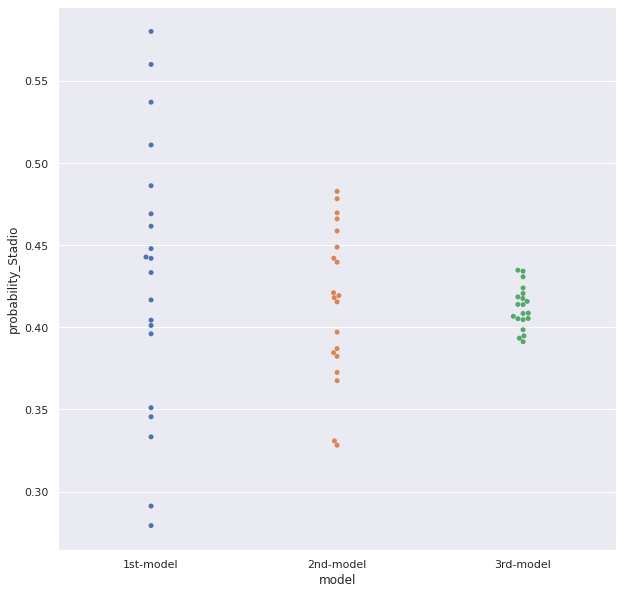

In [51]:
plt.figure(figsize=(10,10))

sns.swarmplot(data=df, x='model',y='probability_Stadio')

In [52]:
df1 = pd.DataFrame({'model':'1st-model','singer':'Stadio','probability':stadios_total[0],'average model-singer': averages_stadio[0],'real-share singer':televoting_final["Stadio"]})
df2 = pd.DataFrame({'model':'1st-model','singer':'Michelin','probability':michelins_total[0],'average model-singer': averages_michelin[0],'real-share singer':televoting_final["Francesca Michelin"]})
df3 = pd.DataFrame({'model':'1st-model','singer':'Caccamo-Iurato','probability':caccamos_total[0],'average model-singer': averages_caccamo[1],'real-share singer':televoting_final["Caccamo-Iurato"]})
df4 = pd.DataFrame({'model':'2nd-model','singer':'Stadio','probability':stadios_total[1],'average model-singer': averages_stadio[0],'real-share singer':televoting_final["Stadio"]})
df5 = pd.DataFrame({'model':'2nd-model','singer':'Michelin','probability':michelins_total[1],'average model-singer': averages_michelin[1],'real-share singer':televoting_final["Francesca Michelin"]})
df6 = pd.DataFrame({'model':'2nd-model','singer':'Caccamo-Iurato','probability':caccamos_total[1],'average model-singer': averages_caccamo[1],'real-share singer':televoting_final["Caccamo-Iurato"]})
df7 = pd.DataFrame({'model':'3rd-model','singer':'Stadio','probability':stadios_total[2],'average model-singer': averages_stadio[2],'real-share singer':televoting_final["Stadio"]})
df8 = pd.DataFrame({'model':'3rd-model','singer':'Michelin','probability':michelins_total[2],'average model-singer': averages_michelin[2],'real-share singer':televoting_final["Francesca Michelin"]})
df9 = pd.DataFrame({'model':'3rd-model','singer':'Caccamo-Iurato','probability':caccamos_total[2],'average model-singer': averages_caccamo[2],'real-share singer':televoting_final["Caccamo-Iurato"]})
df = pd.concat([df1,df2,df3,df4,df5,df6,df7,df8,df9],axis=0)

df

,model,singer,probability,average model-singer,real-share singer
0,1st-model,Stadio,0.441989,0.429483,0.4399
1,1st-model,Stadio,0.486188,0.429483,0.4399
2,1st-model,Stadio,0.345550,0.429483,0.4399
3,1st-model,Stadio,0.333333,0.429483,0.4399
4,1st-model,Stadio,0.447917,0.429483,0.4399
...,...,...,...,...,...
15,3rd-model,Caccamo-Iurato,0.247256,0.258570,0.2643
16,3rd-model,Caccamo-Iurato,0.278692,0.258570,0.2643
17,3rd-model,Caccamo-Iurato,0.271826,0.258570,0.2643
18,3rd-model,Caccamo-Iurato,0.260733,0.258570,0.2643


In [53]:
df1_small = pd.Series({'model':'1st-model','singer':'Stadio','average model-singer': averages_stadio[0],'real-share singer':televoting_final["Stadio"]})
df2_small = pd.Series({'model':'1st-model','singer':'Michelin','average model-singer': averages_michelin[0],'real-share singer':televoting_final["Francesca Michelin"]})
df3_small = pd.Series({'model':'1st-model','singer':'Caccamo-Iurato','average model-singer': averages_caccamo[0],'real-share singer':televoting_final["Caccamo-Iurato"]})
df4_small = pd.Series({'model':'2nd-model','singer':'Stadio','average model-singer': averages_stadio[1],'real-share singer':televoting_final["Stadio"]})
df5_small = pd.Series({'model':'2nd-model','singer':'Michelin','average model-singer': averages_michelin[1],'real-share singer':televoting_final["Francesca Michelin"]})
df6_small = pd.Series({'model':'2nd-model','singer':'Caccamo-Iurato','average model-singer': averages_caccamo[1],'real-share singer':televoting_final["Caccamo-Iurato"]})
df7_small = pd.Series({'model':'3rd-model','singer':'Stadio','average model-singer': averages_stadio[2],'real-share singer':televoting_final["Stadio"]})
df8_small = pd.Series({'model':'3rd-model','singer':'Michelin','average model-singer': averages_michelin[2],'real-share singer':televoting_final["Francesca Michelin"]})
df9_small = pd.Series({'model':'3rd-model','singer':'Caccamo-Iurato','average model-singer': averages_caccamo[2],'real-share singer':televoting_final["Caccamo-Iurato"]})
df_small = pd.DataFrame([df1_small,df2_small,df3_small,df4_small,df5_small,df6_small,df7_small,df8_small,df9_small])

df_small

,model,singer,average model-singer,real-share singer
0,1st-model,Stadio,0.429483,0.4399
1,1st-model,Michelin,0.315215,0.2958
2,1st-model,Caccamo-Iurato,0.255303,0.2643
3,2nd-model,Stadio,0.415507,0.4399
4,2nd-model,Michelin,0.320887,0.2958
5,2nd-model,Caccamo-Iurato,0.263606,0.2643
6,3rd-model,Stadio,0.412059,0.4399
7,3rd-model,Michelin,0.329370,0.2958
8,3rd-model,Caccamo-Iurato,0.258570,0.2643


In [54]:
df1_real = pd.Series({'model':'1st-model','singer':'Stadio: real-share','average model-singer': averages_stadio[0],'real-share singer':televoting_final["Stadio"]})
df2_real = pd.Series({'model':'1st-model','singer':'Michelin: real-share','average model-singer': averages_michelin[0],'real-share singer':televoting_final["Francesca Michelin"]})
df3_real = pd.Series({'model':'1st-model','singer':'Caccamo-Iurato: real-share','average model-singer': averages_caccamo[0],'real-share singer':televoting_final["Caccamo-Iurato"]})
df4_real = pd.Series({'model':'2nd-model','singer':'Stadio: real-share','average model-singer': averages_stadio[1],'real-share singer':televoting_final["Stadio"]})
df5_real = pd.Series({'model':'2nd-model','singer':'Michelin: real-share','average model-singer': averages_michelin[1],'real-share singer':televoting_final["Francesca Michelin"]})
df6_real = pd.Series({'model':'2nd-model','singer':'Caccamo-Iurato: real-share','average model-singer': averages_caccamo[1],'real-share singer':televoting_final["Caccamo-Iurato"]})
df7_real = pd.Series({'model':'3rd-model','singer':'Stadio: real-share','average model-singer': averages_stadio[2],'real-share singer':televoting_final["Stadio"]})
df8_real = pd.Series({'model':'3rd-model','singer':'Michelin: real-share','average model-singer': averages_michelin[2],'real-share singer':televoting_final["Francesca Michelin"]})
df9_real = pd.Series({'model':'3rd-model','singer':'Caccamo-Iurato: real-share','average model-singer': averages_caccamo[2],'real-share singer':televoting_final["Caccamo-Iurato"]})
df_real = pd.DataFrame([df1_real,df2_real,df3_real,df4_real,df5_real,df6_real,df7_real,df8_real,df9_real])

df_real

,model,singer,average model-singer,real-share singer
0,1st-model,Stadio: real-share,0.429483,0.4399
1,1st-model,Michelin: real-share,0.315215,0.2958
2,1st-model,Caccamo-Iurato: real-share,0.255303,0.2643
3,2nd-model,Stadio: real-share,0.415507,0.4399
4,2nd-model,Michelin: real-share,0.320887,0.2958
5,2nd-model,Caccamo-Iurato: real-share,0.263606,0.2643
6,3rd-model,Stadio: real-share,0.412059,0.4399
7,3rd-model,Michelin: real-share,0.329370,0.2958
8,3rd-model,Caccamo-Iurato: real-share,0.258570,0.2643


In [55]:
df1_sim = pd.Series({'model':'1st-model','singer':'Stadio: simulated-share','average model-singer': averages_stadio[0],'real-share singer':televoting_final["Stadio"]})
df2_sim = pd.Series({'model':'1st-model','singer':'Michelin: simulated-share','average model-singer': averages_michelin[0],'real-share singer':televoting_final["Francesca Michelin"]})
df3_sim = pd.Series({'model':'1st-model','singer':'Caccamo-Iurato: simulated-share','average model-singer': averages_caccamo[0],'real-share singer':televoting_final["Caccamo-Iurato"]})
df4_sim = pd.Series({'model':'2nd-model','singer':'Stadio: simulated-share','average model-singer': averages_stadio[1],'real-share singer':televoting_final["Stadio"]})
df5_sim = pd.Series({'model':'2nd-model','singer':'Michelin: simulated-share','average model-singer': averages_michelin[0],'real-share singer':televoting_final["Francesca Michelin"]})
df6_sim = pd.Series({'model':'2nd-model','singer':'Caccamo-Iurato: simulated-share','average model-singer': averages_caccamo[0],'real-share singer':televoting_final["Caccamo-Iurato"]})
df7_sim = pd.Series({'model':'3rd-model','singer':'Stadio: simulated-share','average model-singer': averages_stadio[2],'real-share singer':televoting_final["Stadio"]})
df8_sim = pd.Series({'model':'3rd-model','singer':'Michelin: simulated-share','average model-singer': averages_michelin[2],'real-share singer':televoting_final["Francesca Michelin"]})
df9_sim = pd.Series({'model':'3rd-model','singer':'Caccamo-Iurato: simulated-share','average model-singer': averages_caccamo[2],'real-share singer':televoting_final["Caccamo-Iurato"]})
df_sim = pd.DataFrame([df1_sim,df2_sim,df3_sim,df4_sim,df5_sim,df6_sim,df7_sim,df8_sim,df9_sim])

df_sim

,model,singer,average model-singer,real-share singer
0,1st-model,Stadio: simulated-share,0.429483,0.4399
1,1st-model,Michelin: simulated-share,0.315215,0.2958
2,1st-model,Caccamo-Iurato: simulated-share,0.255303,0.2643
3,2nd-model,Stadio: simulated-share,0.415507,0.4399
4,2nd-model,Michelin: simulated-share,0.315215,0.2958
5,2nd-model,Caccamo-Iurato: simulated-share,0.255303,0.2643
6,3rd-model,Stadio: simulated-share,0.412059,0.4399
7,3rd-model,Michelin: simulated-share,0.329370,0.2958
8,3rd-model,Caccamo-Iurato: simulated-share,0.258570,0.2643


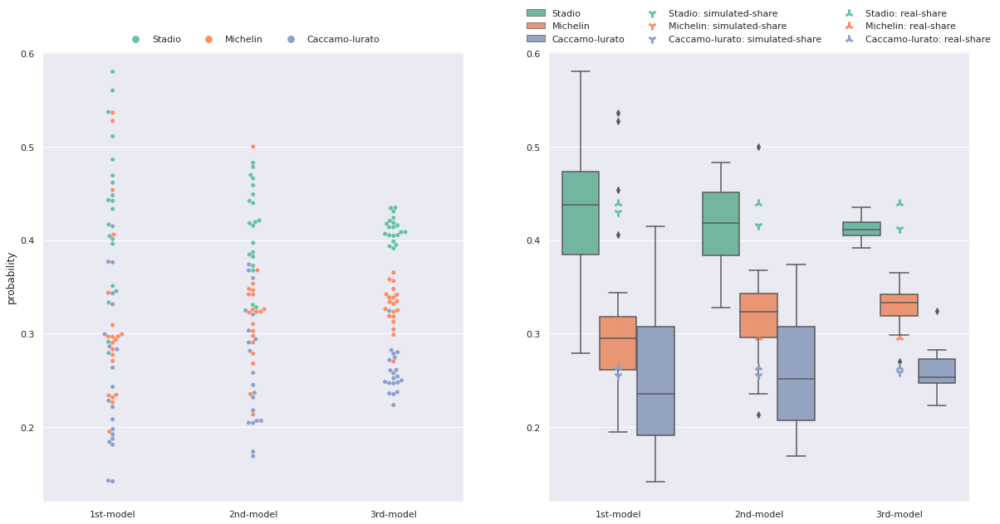

In [56]:
fig, axes = plt.subplots(1,2,figsize=(20,10))


sns.swarmplot(data=df, x="model", y="probability", hue="singer",palette="Set2",ax=axes[0])
sns.boxplot(data=df, x='model',y='probability',hue='singer',palette="Set2",ax=axes[1])
sns.pointplot(data=df_sim, x='model',y='average model-singer',hue='singer',palette='Set2',ax=axes[1],markers='1',linestyles='',scale=1.5)
sns.pointplot(data=df_real, x='model',y='real-share singer',hue='singer',palette='Set2',ax=axes[1],markers='2',linestyles='',scale=1.5)

axes[0].set(xlabel='')
axes[1].set(xlabel='',ylabel='')

sns.move_legend(axes[0], "lower center",bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)
sns.move_legend(axes[1], "lower center",bbox_to_anchor=(.5, 1), ncol=3, title=None, frameon=False)